## This is where I do all of my verification

In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from pprint import pprint
import matplotlib.pyplot as plt
import numpy as np
import numpy.matlib
from datetime import datetime, timedelta
import cmocean

import tensorflow.compat.v2 as tf
tf.enable_v2_behavior()
import tensorflow_probability as tfp
from tensorflow.python.keras.optimizer_v2.adam import Adam
tfd = tfp.distributions
import tensorflow.keras.backend as K
from tensorflow import math as tfm

import os

import utilsProb
import utilsProbSS
import glob
import sys
from scipy.stats import rankdata
import pandas as pd
import importlib
import copy
from netCDF4 import Dataset, num2date
from scipy.interpolate import interpn
from matplotlib.colors import Normalize 
from matplotlib import cm
import matplotlib as mpl
import seaborn as sns
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_context("paper")
import properscoring as ps
from math import erf
import xarray as xr

import matplotlib
#mapping
from cartopy import config
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import Unet_b
import utils_CNN
from tensorflow.python.client import device_lib
import xarray as xr

import coms
import utilsAnEn
import utils_verif
import comsnn
from sklearn.metrics import brier_score_loss
from tqdm import tqdm


/glade/work/wchapman/miniconda3/envs/tfp/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


## Resolution & reliability 

## Define my color pallete

In [2]:
mycolors = {'$GEFS_{nn}$':[0.7561707035755478, 0.21038062283737025, 0.22352941176470587], 
            '$MV_gefs$':[0.940715109573241, 0.6099192618223759, 0.4812764321414839],
            '$GEFS$':[0.9838523644752019, 0.8089965397923875, 0.7167243367935409],
            '$CNN$':[1,1,1],
            '$CNNft_ref$': [1,1,1],
            '$NN$': [0.530026912725875, 0.7456362937331797, 0.8560553633217994],
            '$AnEn$': [0.1843137254901961, 0.47266435986159167, 0.7116493656286044]}


SScolors = {'$GEFS_{nn}$':[0.7561707035755478, 0.21038062283737025, 0.22352941176470587], 
            '$MV_gefs$':[0.940715109573241, 0.6099192618223759, 0.4812764321414839],
            '$GEFS$':[0.9838523644752019, 0.8089965397923875, 0.7167243367935409],
            '$CNN$':[0,0,0],
            '$CNNft_ref$': [0,0,0],
            '$NN$': [0.530026912725875, 0.7456362937331797, 0.8560553633217994],
            '$AnEn$': [0.1843137254901961, 0.47266435986159167, 0.7116493656286044]}


#boxplot dict
BPdict = {'tickFS':30,'labelFS':35,'titleFS':35,'legendFS':35,'FigSize':np.array([40,10])}

#spread/skill dict
SSdict = {'tickFS':25,'labelFS':25,'titleFS':35,'legendFS':35,'FigSize':np.array([15,10])}


#RankHist dict
RHdict = {'tickFS':25,'labelFS':25,'titleFS':35,'legendFS':25,'FigSize':np.array([20, 6])}


In [3]:
importlib.reload(utils_verif)
importlib.reload(utilsAnEn)

<module 'utilsAnEn' from '/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/utilsAnEn.py'>

In [9]:
fcast = 'F048'
ensembs = 40
yearzz = 1993
df2 = utilsAnEn.load_picks_year([2016,2017,2018],fcast,40,yearzz)
forctst2010 = np.array(np.mean(df.filter(regex='Analog'),axis=1))

2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1993.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1993.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1993.pkl


In [6]:
#define all of the forecasts:
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]


In [16]:
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)] #forecasts 0-120
pkl_names = ['Raw_gefs','Reforecast','MV_gefs','NN_gefs','AnEn','NN_ref','CNN_ref','CNNft_ref'] #pkl names


rmse_a = np.zeros([len(fcasts),len(pkl_names)])
corr_a = np.zeros([len(fcasts),len(pkl_names)])
bias_a = np.zeros([len(fcasts),len(pkl_names)])
crmse_a = np.zeros([len(fcasts),len(pkl_names)])


for typer, fcast in enumerate(fcasts):
    for ind, pl in enumerate(pkl_names):
        df ,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,pl)        
        rmse_a[typer,ind] = utils_verif.rmse(Post_m,Obs)
        crmse_a[typer,ind] = utils_verif.crmse(Post_m,Obs)
        corr_a[typer,ind] = utils_verif.corrss(Post_m,Obs) 
        bias_a[typer,ind] = utils_verif.bias(Post_m,Obs) 


No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018
No Post-Processing
2016
2017
2018


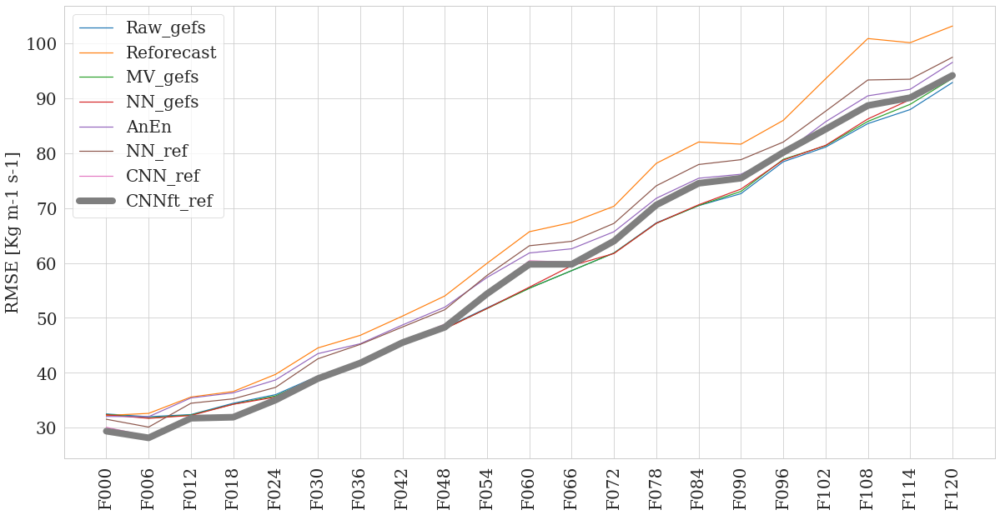

In [17]:
plt.figure(figsize=(20,10))
pkl_names = ['Raw_gefs','Reforecast','MV_gefs','NN_gefs','AnEn','NN_ref','CNN_ref','CNNft_ref']

# plt.plot(fcasts,rmse_a)
plt.plot(fcasts,rmse_a[:,0],label = 'Raw_gefs')
plt.plot(fcasts,rmse_a[:,1],label = 'Reforecast')
plt.plot(fcasts,rmse_a[:,2],label = 'MV_gefs')
plt.plot(fcasts,rmse_a[:,3],label = 'NN_gefs')
plt.plot(fcasts,rmse_a[:,4],label = 'AnEn')

plt.plot(fcasts,rmse_a[:,5],label = 'NN_ref')

plt.plot(fcasts,rmse_a[:,6],label = 'CNN_ref')

plt.plot(fcasts,rmse_a[:,7],label = 'CNNft_ref',linewidth=8)

plt.legend(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation='vertical')

plt.ylabel('RMSE [Kg m-1 s-1]', fontsize=20)
plt.grid(True)

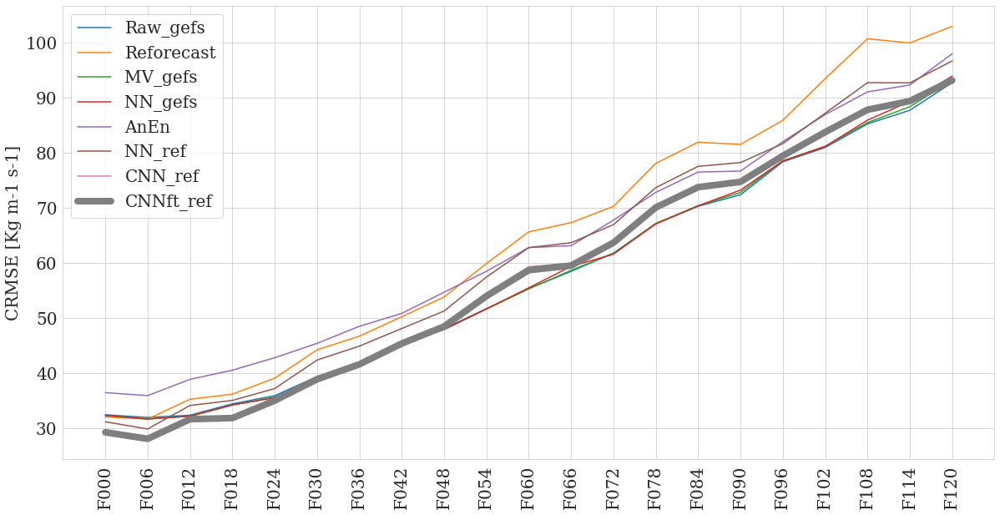

In [492]:
plt.figure(figsize=(20,10))
pkl_names = ['Raw_gefs','Reforecast','MV_gefs','NN_gefs','AnEn','NN_ref','CNN_ref','CNNft_ref']

# plt.plot(fcasts,rmse_a)
plt.plot(fcasts,crmse_a[:,0],label = 'Raw_gefs')
plt.plot(fcasts,crmse_a[:,1],label = 'Reforecast')
plt.plot(fcasts,crmse_a[:,2],label = 'MV_gefs')
plt.plot(fcasts,crmse_a[:,3],label = 'NN_gefs')
plt.plot(fcasts,crmse_a[:,4],label = 'AnEn')

plt.plot(fcasts,crmse_a[:,5],label = 'NN_ref')

plt.plot(fcasts,crmse_a[:,6],label = 'CNN_ref')

plt.plot(fcasts,crmse_a[:,7],label = 'CNNft_ref',linewidth=8)

plt.legend(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation='vertical')

plt.ylabel('CRMSE [Kg m-1 s-1]', fontsize=20)
plt.grid(True)

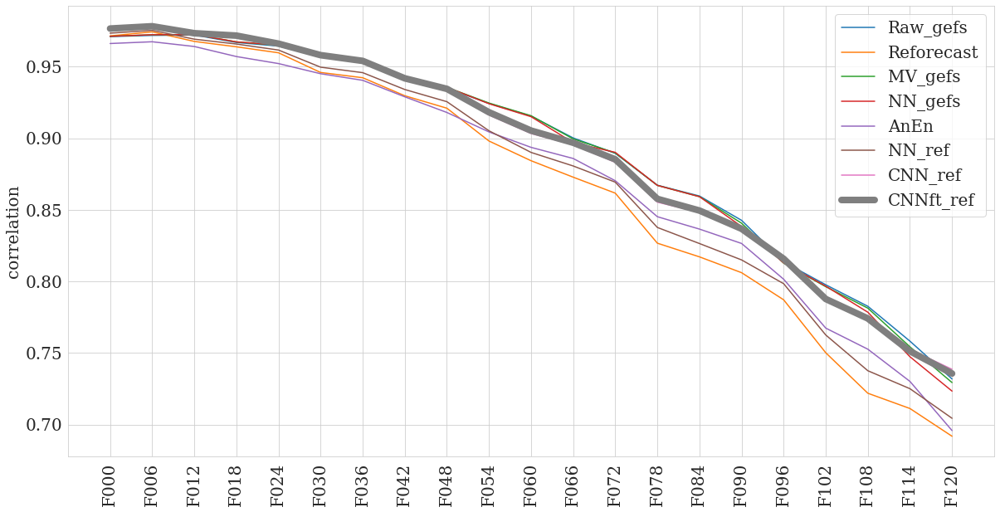

In [493]:
plt.figure(figsize=(20,10))

pkl_names = ['Raw_gefs','Reforecast','MV_gefs','NN_gefs','AnEn','NN_ref','CNN_ref','CNNft_ref']

# plt.plot(fcasts,rmse_a)
plt.plot(fcasts,corr_a[:,0],label = 'Raw_gefs')
plt.plot(fcasts,corr_a[:,1],label = 'Reforecast')
plt.plot(fcasts,corr_a[:,2],label = 'MV_gefs')
plt.plot(fcasts,corr_a[:,3],label = 'NN_gefs')
plt.plot(fcasts,corr_a[:,4],label = 'AnEn')
plt.plot(fcasts,corr_a[:,5],label = 'NN_ref')
plt.plot(fcasts,corr_a[:,6],label = 'CNN_ref')
plt.plot(fcasts,corr_a[:,7],label = 'CNNft_ref',linewidth=8)

plt.legend(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation='vertical')

plt.ylabel('correlation', fontsize=20)
plt.grid(True)

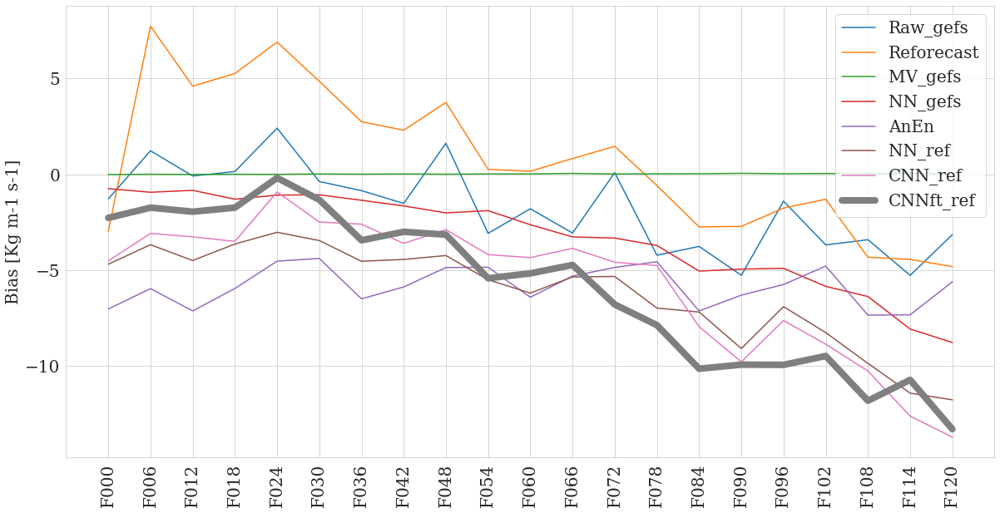

In [145]:
plt.figure(figsize=(20,10))

pkl_names = ['Raw_gefs','Reforecast','MV_gefs','NN_gefs','AnEn','NN_ref','CNN_ref','CNNft_ref']

# plt.plot(fcasts,rmse_a)
plt.plot(fcasts,bias_a[:,0],label = 'Raw_gefs')
plt.plot(fcasts,bias_a[:,1],label = 'Reforecast')
plt.plot(fcasts,bias_a[:,2],label = 'MV_gefs')
plt.plot(fcasts,bias_a[:,3],label = 'NN_gefs')
plt.plot(fcasts,bias_a[:,4],label = 'AnEn')
plt.plot(fcasts,bias_a[:,5],label = 'NN_ref')
plt.plot(fcasts,bias_a[:,6],label = 'CNN_ref')
plt.plot(fcasts,bias_a[:,7],label = 'CNNft_ref',linewidth=8)

plt.legend(fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20,rotation='vertical')

plt.ylabel('Bias [Kg m-1 s-1]', fontsize=20)
plt.grid(True)

In [47]:
fcast='F096'

## Rank Histogram

2016
2017
2018
computing ranks
computing ties
making figure... takes FOREVER


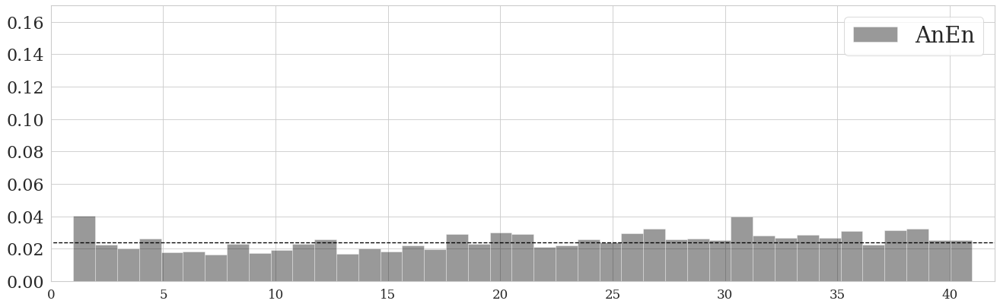

In [52]:
ense = 50
bins = ense+1
fcast='F120'
mod = 'CNNft_ref'
mod = 'CNN_ref'
mod = 'MV_gefs'
mod = 'NN_gefs'
mod = 'Raw_gefs'
mod = 'AnEn'



df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

if mod == 'AnEn':
    sss_All=np.array(df.filter(regex='Analog'))
    s_All = Post_s
    m_All = Post_m
    ense = 40
    bins = ense+1
    
else:
    sss_All = np.zeros([len(Post_m),ense])
    s_All = np.zeros(len(Post_m))
    m_All = np.zeros(len(Post_m))

    for ii in range(len(Post_m)):
        sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
        s_All[ii]=Post_s[ii]
        m_All[ii]=Post_m[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0

Thresher =350 #thresh to stratify on. 
Thresher2 = 1000
rr2 = utils_verif.ranker(Obs[(m_All>Thresher) & (m_All<Thresher2)],np.transpose(sss_All[(m_All>Thresher) & (m_All<Thresher2)]))
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,density=True,bins=bins,alpha=0.4,label=mod,color='k')
plt.plot([-10,bins+1],[1/(bins+1),1/(bins+1)],'k--')
plt.legend(fontsize=26)
plt.ylim([0,0.17])
plt.xlim([0,bins+1])
plt.yticks(fontsize=20)
plt.xticks(fontsize=15)

# # plt.savefig('/glade/scratch/wchapman/Reforecast/models/RankHist_'+fcast+'_ThreshOBS250_ForecastHour.png',dpi = 300,bbox_inches='tight')
plt.show()


computing ranks
computing ties
making figure... takes FOREVER


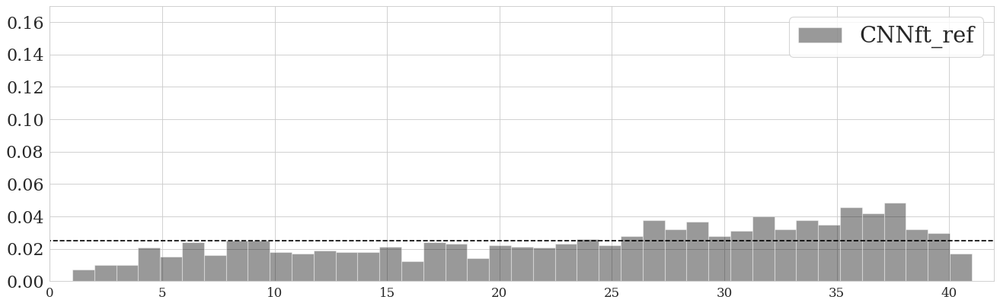

In [116]:
ense = 40
bins = ense+1
fcast='F102'
mod = 'CNNft_ref'

df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

if mod == 'AnEn':
    sss_All=np.array(df.filter(regex='Analog'))
    s_All = Post_s
    m_All = Post_m
    ense = 40
    bins = ense+1
    
else:
    sss_All = np.zeros([len(Post_m),ense])
    s_All = np.zeros(len(Post_m))
    m_All = np.zeros(len(Post_m))

    for ii in range(len(Post_m)):
        sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
        s_All[ii]=Post_s[ii]
        m_All[ii]=Post_m[ii]
        sss_All[ii,:] =(sss) 

Thresher =400 #thresh to stratify on. 
rr2 = utils_verif.ranker(Obs[m_All>Thresher],np.transpose(sss_All[m_All>Thresher]))
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,density=True,bins=bins,alpha=0.4,label=mod,color='k')
plt.plot([-10,80],[0.025,0.025],'k--')
plt.legend(fontsize=26)
plt.ylim([0,0.17])
plt.xlim([0,bins+1])
plt.yticks(fontsize=20)
plt.xticks(fontsize=15)

# # plt.savefig('/glade/scratch/wchapman/Reforecast/models/RankHist_'+fcast+'_ThreshOBS250_ForecastHour.png',dpi = 300,bbox_inches='tight')
plt.show()


In [293]:
fcast='F048'
mod = 'NN_gefs'
df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
df1

,time,OBSnn,Modelmean,Modelstd,IVTmean_gefs,IVTstd_gefs,lat,lon
0,2016-12-03,95.142258,125.940540,8.941373,123.368881,23.879589,30.0,243.125
1,2016-12-04,134.140610,115.217612,8.211799,113.206116,22.440468,30.0,243.125
2,2016-12-05,81.311241,72.307159,8.828984,74.456825,18.488644,30.0,243.125
3,2016-12-06,169.137512,174.544040,21.097423,170.893707,35.517017,30.0,243.125
4,2016-12-07,238.380875,219.752840,27.716115,216.942490,44.476917,30.0,243.125
...,...,...,...,...,...,...,...,...
51403,2019-03-29,17.010618,8.616842,3.965031,13.218247,8.369660,55.0,230.000
51404,2019-03-30,17.051439,27.186841,3.850140,27.746063,10.327087,55.0,230.000
51405,2019-03-31,20.627737,32.358333,7.318627,31.768509,11.652404,55.0,230.000
51406,2019-04-01,21.402893,25.761927,5.356717,26.092596,10.394973,55.0,230.000


In [294]:
fcast='F048'
mod = 'CNNft_ref'
df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
df2['lon']=df2['lon']+360
df2

,time,OBScnn,Reforecast,IVTmean_cnn,IVTstd_cnn,lat,lon
0,2016-12-03,95.142258,89.491142,109.002396,22.387478,30.0,243.125
1,2016-12-04,134.140610,125.995216,128.093933,22.297602,30.0,243.125
2,2016-12-05,81.311241,107.607140,82.955124,17.838184,30.0,243.125
3,2016-12-06,169.137512,170.467346,150.911133,31.646503,30.0,243.125
4,2016-12-07,238.380875,285.080811,238.307648,44.621082,30.0,243.125
...,...,...,...,...,...,...,...
52267,2019-03-29,17.010618,44.920731,24.101460,10.870353,55.0,230.000
52268,2019-03-30,17.051439,24.849731,17.738688,9.216678,55.0,230.000
52269,2019-03-31,20.627737,33.916496,24.278166,11.861916,55.0,230.000
52270,2019-04-01,21.402893,28.441116,19.300516,9.427428,55.0,230.000


In [325]:
dfm = pd.merge(df1,df2,how='left')
dfm

,time,OBSnn,Modelmean,Modelstd,IVTmean_gefs,IVTstd_gefs,lat,lon,OBScnn,Reforecast,IVTmean_cnn,IVTstd_cnn
0,2016-12-03,95.142258,125.940540,8.941373,123.368881,23.879589,30.0,243.125,95.142258,89.491142,109.002396,22.387478
1,2016-12-04,134.140610,115.217612,8.211799,113.206116,22.440468,30.0,243.125,134.140610,125.995216,128.093933,22.297602
2,2016-12-05,81.311241,72.307159,8.828984,74.456825,18.488644,30.0,243.125,81.311241,107.607140,82.955124,17.838184
3,2016-12-06,169.137512,174.544040,21.097423,170.893707,35.517017,30.0,243.125,169.137512,170.467346,150.911133,31.646503
4,2016-12-07,238.380875,219.752840,27.716115,216.942490,44.476917,30.0,243.125,238.380875,285.080811,238.307648,44.621082
...,...,...,...,...,...,...,...,...,...,...,...,...
51403,2019-03-29,17.010618,8.616842,3.965031,13.218247,8.369660,55.0,230.000,17.010618,44.920731,24.101460,10.870353
51404,2019-03-30,17.051439,27.186841,3.850140,27.746063,10.327087,55.0,230.000,17.051439,24.849731,17.738688,9.216678
51405,2019-03-31,20.627737,32.358333,7.318627,31.768509,11.652404,55.0,230.000,20.627737,33.916496,24.278166,11.861916
51406,2019-04-01,21.402893,25.761927,5.356717,26.092596,10.394973,55.0,230.000,21.402893,28.441116,19.300516,9.427428


In [ ]:
For_u = verif['IVTgefsm']
For_s = (verif['IVTgefss'])
Forecast = np.stack([For_u,For_s],).T

In [223]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'RMSE':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
bsnummy = 100

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_cnn = np.zeros([bsnummy])
    cor_cnn= np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_cnn[aa]=1 - (utils_verif.rmse(dfm['IVTmean_cnn'][inss],dfm['OBScnn'][inss]))/(utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
        cor_cnn[aa]=1 - (utils_verif.corrss(dfm['IVTmean_cnn'][inss],dfm['OBScnn'][inss]))/(utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
    
    
    dftemp = pd.DataFrame({'Corr':cor_cnn})
    dftemp['RMSE']=bp_cnn
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################

    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    

    mod = 'Reforecast'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_ref = np.zeros([bsnummy])
    cor_ref = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_ref[aa]=1 - (utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBScnn'][inss]))/(utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
        cor_ref[aa]=1 - (utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBScnn'][inss]))/(utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
        
    dftemp = pd.DataFrame({'Corr':cor_ref})
    dftemp['RMSE'] = bp_ref
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'Reforecast'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NN_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_nn = np.zeros([bsnummy])
    cor_nn = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_nn[aa]=1 - (utils_verif.rmse(dfm['IVTmean_nn'][inss],dfm['OBSnn'][inss]))/(utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
        cor_nn[aa]=1 - (utils_verif.corrss(dfm['IVTmean_nn'][inss],dfm['OBSnn'][inss]))/(utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))

    dftemp = pd.DataFrame({'Corr':cor_nn})
    dftemp['RMSE'] = bp_nn
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'AnEn'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
    df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_anen[aa]=1 - (utils_verif.rmse(dfm['Mean'][inss],dfm['OBSanen'][inss]))/(utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
        corr_anen[aa]=1 - (utils_verif.corrss(dfm['Mean'][inss],dfm['OBSanen'][inss]))/(utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))
    
    
    dftemp = pd.DataFrame({'Corr':corr_anen})
    dftemp['RMSE'] = bp_anen
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    print(dffin.shape)



doing: F000
2016
2017
2018
(400, 4)
doing: F006
2016
2017
2018
(800, 4)
doing: F012
2016
2017
2018
(1200, 4)
doing: F018
2016
2017
2018
(1600, 4)
doing: F024
2016
2017
2018
(2000, 4)
doing: F030
2016
2017
2018
(2400, 4)
doing: F036
2016
2017
2018
(2800, 4)
doing: F042
2016
2017
2018
(3200, 4)
doing: F048
2016
2017
2018
(3600, 4)
doing: F054
2016
2017
2018
(4000, 4)
doing: F060
2016
2017
2018
(4400, 4)
doing: F066
2016
2017
2018
(4800, 4)
doing: F072
2016
2017
2018
(5200, 4)
doing: F078
2016
2017
2018
(5600, 4)
doing: F084
2016
2017
2018
(6000, 4)
doing: F090
2016
2017
2018
(6400, 4)
doing: F096
2016
2017
2018
(6800, 4)
doing: F102
2016
2017
2018
(7200, 4)
doing: F108
2016
2017
2018
(7600, 4)
doing: F114
2016
2017
2018
(8000, 4)
doing: F120
2016
2017
2018
(8400, 4)


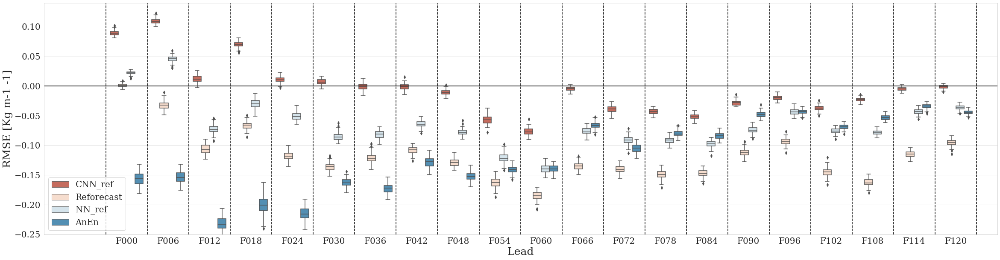

In [224]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="RMSE", hue="Model",data=dffin, palette="RdBu")
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.ylabel('RMSE [Kg m-1 -1]',fontsize=25)
plt.xlabel('Lead',fontsize=25)
plt.legend(fontsize=20)

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-.25,.14])
plt.xlim([-2,21])

plt.show()

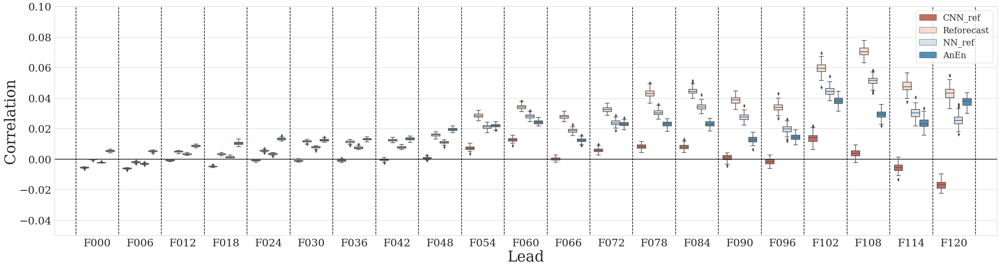

In [227]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Corr", hue="Model",data=dffin, palette="RdBu")
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.ylabel('Correlation',fontsize=35)
plt.xlabel('Lead',fontsize=35)
plt.legend(fontsize=20)

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-.05,.1])
plt.xlim([-1,21])

plt.show()

# Get Comparison to Reforecast 

In [12]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'RMSE':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 1000

df1, df2, dfm = 1,1,1


for fcast in fcasts:
    print('doing:',fcast)
    
    ########################################################################################################
    
    
    del df1
    del df2
    del dfm
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    

    mod = 'Reforecast'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_ref = np.zeros([bsnummy])
    cor_ref = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_ref[aa]=(1 - (utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
        cor_ref[aa]=(1 - (utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
        
    dftemp = pd.DataFrame({'Corr':cor_ref})
    dftemp['Lead'] = fcast
    dftemp['RMSE'] = bp_ref
    dftemp['Model'] = 'NN_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################

#     del df1
#     del df2
#     del dfm
#     mod = 'MV_gefs'
#     df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#     df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

#     mod = 'NN_ref'
#     df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#     df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
#     df2['lon']=df2['lon']+360

#     dfm = pd.merge(df1,df2,how='left')

#     bp_nn = np.zeros([bsnummy])
#     cor_nn = np.zeros([bsnummy])
#     for aa in range(bsnummy):
#         inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
#         bp_nn[aa]=1 - (utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBSnn'][inss]))
#         cor_nn[aa]=1 - (utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBSnn'][inss]))

#     dftemp = pd.DataFrame({'Corr':cor_nn})
#     dftemp['RMSE'] = bp_nn
#     dftemp['Lead'] = fcast
#     dftemp['Model'] = 'MV_gefs'
#     dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################
    
    
    del df1
    del df2
    del dfm
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    

    mod = 'Reforecast'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_ref = np.zeros([bsnummy])
    cor_ref = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_ref[aa]=(1 - (utils_verif.rmse(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
        cor_ref[aa]=(1 - (utils_verif.corrss(dfm['IVTmean_gefs'][inss],dfm['OBSnn'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
        
    dftemp = pd.DataFrame({'Corr':cor_ref})
    dftemp['Lead'] = fcast
    dftemp['RMSE'] = bp_ref
    dftemp['Model'] = 'Raw_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################
    del df1
    del df2
    del dfm
    mod = 'Reforecast'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df1['lon']=df1['lon']+360

    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_cnn = np.zeros([bsnummy])
    cor_cnn= np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_cnn[aa]=(1 - (utils_verif.rmse(dfm['IVTmean_cnn'][inss],dfm['OBScnn'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
        cor_cnn[aa]=(1 - (utils_verif.corrss(dfm['IVTmean_cnn'][inss],dfm['OBScnn'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBScnn'][inss])))*100
    
    
    dftemp = pd.DataFrame({'Corr':cor_cnn})
    dftemp['RMSE'] = bp_cnn
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################
    del df1
    del df2
    del dfm
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_nn = np.zeros([bsnummy])
    cor_nn = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_nn[aa]=(1 - (utils_verif.rmse(dfm['IVTmean_nn'][inss],dfm['OBSnn'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBSnn'][inss])))*100
        cor_nn[aa]=(1 - (utils_verif.corrss(dfm['IVTmean_nn'][inss],dfm['OBSnn'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBSnn'][inss])))*100

    dftemp = pd.DataFrame({'Corr':cor_nn})
    dftemp['RMSE'] = bp_nn
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
    ########################################################################################################
  
    
    del df1
    del df2
    del dfm
    
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'AnEn'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
    df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
    
        bp_anen[aa]=(1 - (utils_verif.rmse(dfm['Mean'][inss],dfm['OBSanen'][inss]))/(utils_verif.rmse(dfm['Reforecast'][inss],dfm['OBSnn'][inss])))*100
        corr_anen[aa]=(1 - (utils_verif.corrss(dfm['Mean'][inss],dfm['OBSanen'][inss]))/(utils_verif.corrss(dfm['Reforecast'][inss],dfm['OBSnn'][inss])))*100
    
    
    dftemp = pd.DataFrame({'Corr':corr_anen})
    dftemp['RMSE'] = bp_anen
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    print(dffin.shape)

dffin['Corr'] = -dffin['Corr']

doing: F000
No Post-Processing
2016
2017
2018
(5000, 4)
doing: F012
No Post-Processing
2016
2017
2018
(10000, 4)
doing: F024
No Post-Processing
2016
2017
2018
(15000, 4)
doing: F036
No Post-Processing
2016
2017
2018
(20000, 4)
doing: F048
No Post-Processing
2016
2017
2018
(25000, 4)
doing: F060
No Post-Processing
2016
2017
2018
(30000, 4)
doing: F072
No Post-Processing
2016
2017
2018
(35000, 4)
doing: F084
No Post-Processing
2016
2017
2018
(40000, 4)
doing: F096
No Post-Processing
2016
2017
2018
(45000, 4)
doing: F108
No Post-Processing
2016
2017
2018
(50000, 4)
doing: F120
No Post-Processing
2016
2017
2018
(55000, 4)


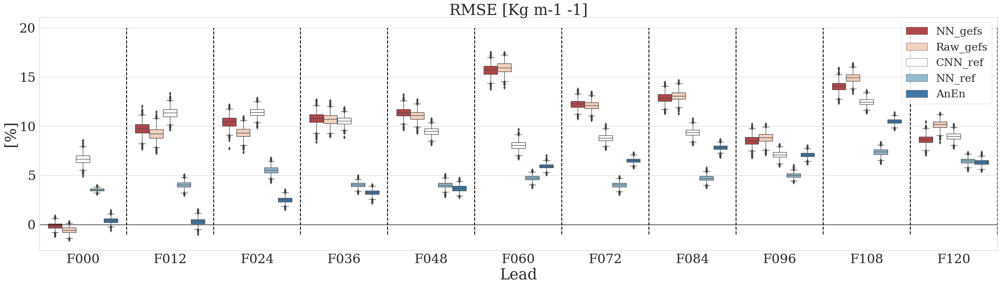

In [16]:

sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_context("paper")

plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="RMSE", hue="Model",data=dffin, palette= mycolors,whis=[1,99])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.title('RMSE [Kg m-1 -1]',fontsize=BPdict['titleFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'])

for bb in np.arange(-.5,22,1):
    plt.plot([bb,bb],[-1,20],'k--',linewidth=2)

# plt.ylim([-5,20])
plt.xlim([-0.5,10.5])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RMSElead.png',dpi = 300,bbox_inches='tight')
plt.show()

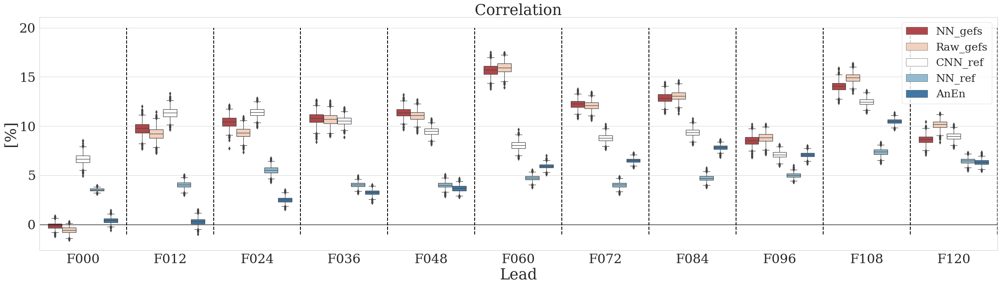

In [17]:
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
sns.set_context("paper")

plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="RMSE", hue="Model",data=dffin, palette= mycolors,whis=[1,99])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'])

plt.title('Correlation',fontsize=BPdict['titleFS'])

for bb in np.arange(-.5,22,1):
    plt.plot([bb,bb],[-1,20],'k--',linewidth=2)

# plt.ylim([-5,20])
plt.xlim([-0.5,10.5])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Corrlead.png',dpi = 300,bbox_inches='tight')
plt.show()

## CRPS

In [23]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 1000
df1, df2, dfm = 1,1,1

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    del df1
    del df2
    del dfm
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NN_gefs'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    
    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        bp_anen[aa]=(1 - (comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnnn'][inss]),axis=1),np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T).numpy()
            /comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T).numpy()))*100
    
    
    dftemp = pd.DataFrame({'CRPS':bp_anen})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    ########################################################################################################
#     del df1
#     del df2
#     del dfm
#     mod = 'Raw_gefs'
#     df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#     df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

#     mod = 'MV_gefs'
#     df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#     df2 = df2.rename(columns={'OBS':'OBSmv','Model':'Reforecast','IVTmean':'IVTmean_mv','IVTstd':'IVTstd_mv'})
    
#     dfm = pd.merge(df1,df2,how='left')
    
#     bp_anen = np.zeros([bsnummy])
#     corr_anen = np.zeros([bsnummy])
#     for aa in range(bsnummy):
#         inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
#         bp_anen[aa]=1 - (comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSmv'][inss]),axis=1),np.stack([dfm['IVTmean_mv'][inss],dfm['IVTstd_mv'][inss]]).T).numpy()
#             /comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T).numpy())
    
    
#     dftemp = pd.DataFrame({'CRPS':bp_anen})
#     dftemp['Lead'] = fcast
#     dftemp['Model'] = 'MV_gefs'
#     dffin = pd.concat([dffin, dftemp], axis=0)
    ########################################################################################################
    del df1
    del df2
    del dfm
    
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_cnn = np.zeros([bsnummy])
    cor_cnn= np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        bp_cnn[aa]=(1 - (comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBScnn'][inss]),axis=1),np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T).numpy()
            /comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T).numpy()))*100
    
    dftemp = pd.DataFrame({'CRPS':bp_cnn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
        
    ########################################################################################################
    del df1
    del df2
    del dfm
    
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_nn = np.zeros([bsnummy])
    cor_nn = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        
        bp_nn[aa]=(1 - (comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T).numpy()
            /comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T).numpy()))*100

    dftemp = pd.DataFrame({'CRPS':bp_nn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
    ########################################################################################################
    del df1
    del df2
    del dfm
    
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'AnEn'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
    df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
    df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        bp_anen[aa]=(1 - (comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSanen'][inss]),axis=1),np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T).numpy()
            /comsnn.crps_cost_function(np.expand_dims(np.array(dfm['OBSnn'][inss]),axis=1),np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T).numpy()))*100
    
    
    dftemp = pd.DataFrame({'CRPS':bp_anen})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    ########################################################################################################
    
    
    print(dffin.shape)


doing: F000
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(4000, 3)
doing: F012
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(8000, 3)
doing: F024
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(12000, 3)
doing: F036
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(16000, 3)
doing: F048
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(20000, 3)
doing: F060
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(24000, 3)
doing: F072
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(28000, 3)
doing: F084
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(32000, 3)
doing: F096
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
20

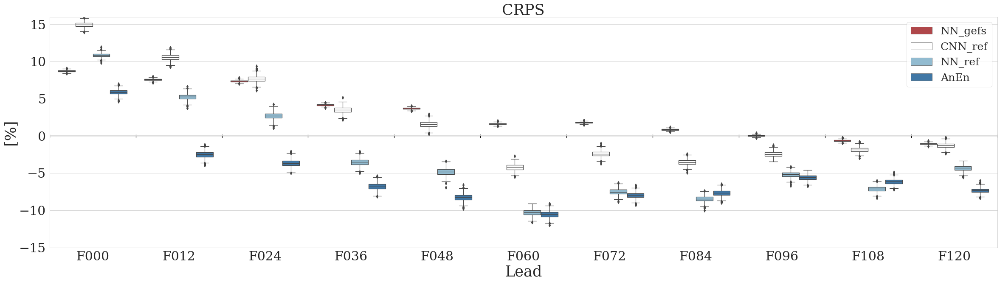

In [27]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')


ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin,palette= mycolors)
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.title('CRPS',fontsize=BPdict['titleFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-15,16])
plt.xlim([-0.5,10.5])

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/CRPS_nothresh.png',dpi = 300,bbox_inches='tight')


plt.show()

# Brier Skill Score:

In [16]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 50
threshold = 250

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'CNN_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_cnn = np.zeros([bsnummy])
    cor_cnn= np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

        bp_cnn[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))
    
    dftemp = pd.DataFrame({'Brier':bp_cnn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    break  
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NN_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_nn = np.zeros([bsnummy])
    cor_nn = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBSnn'][inss])>=threshold)*1

        bp_nn[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))

    dftemp = pd.DataFrame({'Brier':bp_nn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'AnEn'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
    df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
    df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBSanen'][inss])>=threshold)*1

        bp_anen[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))
    
    dftemp = pd.DataFrame({'Brier':bp_anen})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    print(dffin.shape)



doing: F000
No Post-Processing


In [5]:
percys = [250,350,500]

for percy in percys:
    dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
    fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
    bsnummy = 1000
    df1, df2, dfm = 1,1,1

    for fcast in fcasts:
        print('doing:',fcast)
        ########################################################################################################
        fortts=np.array([])
        mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = percy
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NN_gefs'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn= np.zeros([bsnummy])
        bres_nn = np.zeros([bsnummy])
        brel_nn = np.zeros([bsnummy])
        bs2_nn = np.zeros([bsnummy])
        bs3_nn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_nn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
            bres_nn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[1]/utils_verif.brier_decompose(verif_forg, probs_forg)[1]))*100
            brel_nn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[2]/utils_verif.brier_decompose(verif_forg, probs_forg)[2]))*100
            bs2_nn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0]))*100
            bs3_nn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4]))*100
    
        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Res'] = bres_nn
        dftemp['Rel'] = brel_nn
        dftemp['Brier2'] = bs2_nn
        dftemp['Brier3'] = bs3_nn
        dftemp['Model'] = '$GEFS_{nn}$'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        ########################################################################################################

        del df1
        del df2
        del dfm
    
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'CNN_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_cnn = np.zeros([bsnummy])
        cor_cnn= np.zeros([bsnummy])
        bres_cnn = np.zeros([bsnummy])
        brel_cnn = np.zeros([bsnummy])
        bs2_cnn = np.zeros([bsnummy])
        bs3_cnn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_cnn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
            bres_cnn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[1]/utils_verif.brier_decompose(verif_forg, probs_forg)[1]))*100
            brel_cnn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[2]/utils_verif.brier_decompose(verif_forg, probs_forg)[2]))*100
            bs2_cnn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0]))*100
            bs3_cnn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4]))*100
    
        dftemp = pd.DataFrame({'Brier':bp_cnn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$CNN$'
        dftemp['Res'] = bres_cnn
        dftemp['Rel'] = brel_cnn
        dftemp['Brier2'] = bs2_cnn
        dftemp['Brier3'] = bs3_cnn
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NNft_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn = np.zeros([bsnummy])
        bres_nn = np.zeros([bsnummy])
        brel_nn = np.zeros([bsnummy])
        bs2_nn = np.zeros([bsnummy])
        bs3_nn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
            
            ff = np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSnn'][inss])>=threshold)*1

            bp_nn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
            
            bres_nn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[1]/utils_verif.brier_decompose(verif_forg, probs_forg)[1]))*100
            brel_nn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[2]/utils_verif.brier_decompose(verif_forg, probs_forg)[2]))*100
            bs2_nn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0]))*100
            bs3_nn[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4]))*100

        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$NN$'
        dftemp['Res'] = bres_nn
        dftemp['Rel'] = brel_nn
        dftemp['Brier2'] = bs2_nn
        dftemp['Brier3'] = bs3_nn
        dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'AnEn'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
        df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
        df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

        dfm = pd.merge(df1,df2,how='left')
    
        bp_anen = np.zeros([bsnummy])
        corr_anen = np.zeros([bsnummy])
        bres_anen = np.zeros([bsnummy])
        brel_anen = np.zeros([bsnummy])
        bs2_anen = np.zeros([bsnummy])
        bs3_anen = np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSanen'][inss])>=threshold)*1

            bp_anen[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
            
            utils_verif.brier_decompose(verif_for, probs_for)
            utils_verif.brier_decompose(verif_forg, probs_forg)
            
            bres_anen[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[1]/utils_verif.brier_decompose(verif_forg, probs_forg)[1]))*100
            brel_anen[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[2]/utils_verif.brier_decompose(verif_forg, probs_forg)[2]))*100
            bs2_anen[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0]))*100
            bs3_anen[aa]  = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4]))*100
              
    
        dftemp = pd.DataFrame({'Brier':bp_anen})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$AnEn$'
        dftemp['Res'] = bres_anen
        dftemp['Rel'] = brel_anen
        dftemp['Brier2'] = bs2_anen
        dftemp['Brier3'] = bs3_anen
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        print(dffin.shape)
            
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,23],[0,0],'k')

    ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    plt.xticks(fontsize=BPdict['tickFS'])
    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Lead',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
    plt.title('Brier',fontsize=BPdict['titleFS'])

    for bb in np.arange(-0.5,22,1):
        plt.plot([bb,bb],[-25,25],'k--')

    plt.ylim([-13,21])
    plt.xlim([-0.5,10.5])

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Brier_threshold_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')


    plt.show()
    break


doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 250 for a percentile: 250
No Post-Processing


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/glade/work/wchapman/miniconda3/envs/tfp/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3331, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-5-16b1e7624076>", line 52, in <module>
    bres_nn[aa] = (1 - (utils_verif.brier_decompose(verif_for, probs_for)[1]/utils_verif.brier_decompose(verif_forg, probs_forg)[1]))*100
  File "/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/utils_verif.py", line 788, in brier_decompose
    I = np.where((probs_for >= edges[i]) & (probs_for < edges[i + 1]))[0]
  File "<__array_function__ internals>", line 6, in where
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/glade/work/wchapman/miniconda3/envs/tfp/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2044, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt'

KeyboardInterrupt: 

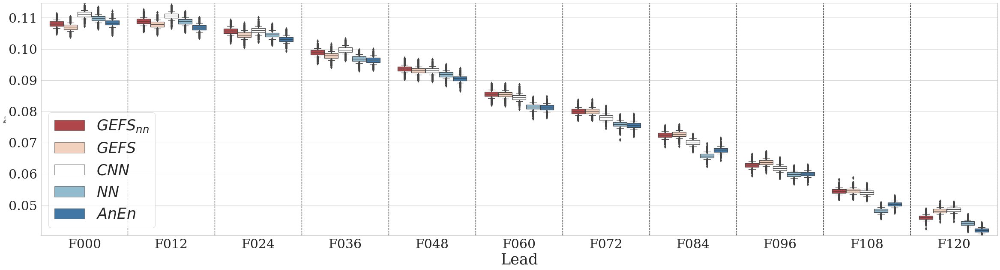

In [13]:
percy = 250
fn = '/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/DataFrames/Brier_threshold_'+str(percy)+'.pkl'

dffin = pd.read_pickle(fn)

plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Res", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
# plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='lower left')
# plt.title('Resolution',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-25,25],'k--')

plt.ylim([np.min(dffin['Res']+.001),np.max(dffin['Res'])])
plt.xlim([-0.5,10.5])

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Resolution_threshold_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
plt.show()

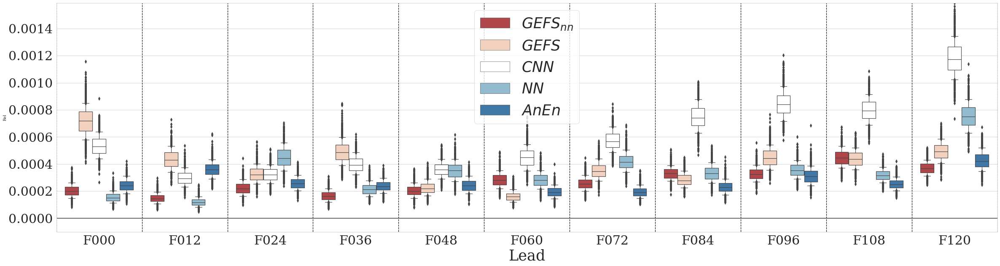

In [11]:
percy = 500
fn = '/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/DataFrames/Brier_threshold_'+str(percy)+'.pkl'

dffin = pd.read_pickle(fn)

plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Rel", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
# plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='best')
# plt.title('Reliability',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-25,25],'k--')

plt.ylim([-.0001,np.max(dffin['Rel'])])
plt.xlim([-0.5,10.5])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_threshold_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()

In [14]:
np.max(dffin['Rel'])

0.0034646715749223254

In [ ]:
percys = [350,450,500]

for percy in percys:
    dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
    fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
    bsnummy = 1000
    df1, df2, dfm = 1,1,1

    for fcast in fcasts:
        print('doing:',fcast)
        ########################################################################################################
        fortts=np.array([])
        mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = percy
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NN_gefs'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn= np.zeros([bsnummy])
        bres_nn = np.zeros([bsnummy])
        brel_nn = np.zeros([bsnummy])
        bs2_nn = np.zeros([bsnummy])
        bs3_nn= np.zeros([bsnummy])
        
        
        bp_nng = np.zeros([bsnummy])
        cor_nng= np.zeros([bsnummy])
        bres_nng = np.zeros([bsnummy])
        brel_nng = np.zeros([bsnummy])
        bs2_nng = np.zeros([bsnummy])
        bs3_nng= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_nn[aa] = brier_score_loss(verif_for, probs_for)
            bres_nn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[1]
            brel_nn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[2]
            bs2_nn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[0]
            bs3_nn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[4]
            
            bp_nng[aa] = brier_score_loss(verif_forg, probs_forg)
            bres_nng[aa] = utils_verif.brier_decompose(verif_forg, probs_forg)[1]
            brel_nng[aa] = utils_verif.brier_decompose(verif_forg, probs_forg)[2]
            bs2_nng[aa]  = utils_verif.brier_decompose(verif_forg, probs_forg)[0]
            bs3_nng[aa]  = utils_verif.brier_decompose(verif_forg, probs_forg)[4]
    
        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Res'] = bres_nn
        dftemp['Rel'] = brel_nn
        dftemp['Brier2'] = bs2_nn
        dftemp['Brier3'] = bs3_nn
        dftemp['Model'] = '$GEFS_{nn}$'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        
        dftemp = pd.DataFrame({'Brier':bp_nng})
        dftemp['Lead'] = fcast
        dftemp['Res'] = bres_nng
        dftemp['Rel'] = brel_nng
        dftemp['Brier2'] = bs2_nng
        dftemp['Brier3'] = bs3_nng
        dftemp['Model'] = '$GEFS$'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        ########################################################################################################

        del df1
        del df2
        del dfm
    
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'CNN_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_cnn = np.zeros([bsnummy])
        cor_cnn= np.zeros([bsnummy])
        bres_cnn = np.zeros([bsnummy])
        brel_cnn = np.zeros([bsnummy])
        bs2_cnn = np.zeros([bsnummy])
        bs3_cnn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_cnn[aa] = brier_score_loss(verif_for, probs_for)
            bres_cnn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[1]
            brel_cnn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[2]
            bs2_cnn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[0]
            bs3_cnn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[4]
    
        dftemp = pd.DataFrame({'Brier':bp_cnn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$CNN$'
        dftemp['Res'] = bres_cnn
        dftemp['Rel'] = brel_cnn
        dftemp['Brier2'] = bs2_cnn
        dftemp['Brier3'] = bs3_cnn
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NNft_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn = np.zeros([bsnummy])
        bres_nn = np.zeros([bsnummy])
        brel_nn = np.zeros([bsnummy])
        bs2_nn = np.zeros([bsnummy])
        bs3_nn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
            
            ff = np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSnn'][inss])>=threshold)*1

            bp_nn[aa] = brier_score_loss(verif_for, probs_for)
            
            bres_nn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[1]
            brel_nn[aa] = utils_verif.brier_decompose(verif_for, probs_for)[2]
            bs2_nn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[0]
            bs3_nn[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[4]

        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$NN$'
        dftemp['Res'] = bres_nn
        dftemp['Rel'] = brel_nn
        dftemp['Brier2'] = bs2_nn
        dftemp['Brier3'] = bs3_nn
        dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'AnEn'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
        df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
        df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

        dfm = pd.merge(df1,df2,how='left')
    
        bp_anen = np.zeros([bsnummy])
        corr_anen = np.zeros([bsnummy])
        bres_anen = np.zeros([bsnummy])
        brel_anen = np.zeros([bsnummy])
        bs2_anen = np.zeros([bsnummy])
        bs3_anen = np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSanen'][inss])>=threshold)*1

            bp_anen[aa] = brier_score_loss(verif_for, probs_for)
            bres_anen[aa] = utils_verif.brier_decompose(verif_for, probs_for)[1]
            brel_anen[aa] = utils_verif.brier_decompose(verif_for, probs_for)[2]
            bs2_anen[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[0]
            bs3_anen[aa]  = utils_verif.brier_decompose(verif_for, probs_for)[4]
              
    
        dftemp = pd.DataFrame({'Brier':bp_anen})
        dftemp['Lead'] = fcast
        dftemp['Model'] = '$AnEn$'
        dftemp['Res'] = bres_anen
        dftemp['Rel'] = brel_anen
        dftemp['Brier2'] = bs2_anen
        dftemp['Brier3'] = bs3_anen
        dffin = pd.concat([dffin, dftemp], axis=0)
        print(dffin.shape)
    
    dffin.to_pickle('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/DataFrames/Brier_threshold_'+str(percy)+'.pkl')
    


doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 350 for a percentile: 350
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(5000, 8)
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: 350 for a percentile: 350
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(10000, 8)
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 350 for a percentile: 350
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(15000, 8)
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: 350 for a percentile: 350
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(20000, 8)
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 350 for a percentile: 350
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(25000, 8)
doing: F060
No P

In [1]:
percy = 250
fn = '/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/DataFrames/Brier_threshold_'+str(percy)+'.pkl'

dffinn = pd.read_pickle(fn)

plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('Brier',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-25,25],'k--')

plt.ylim([-13,21])
plt.xlim([-0.5,10.5])

NameError: name 'pd' is not defined

In [24]:
(1 - (utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4]))*100

54.083084398103686

In [25]:
(1 - (utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0]))*100

18.72864945998166

In [21]:
    
def brier_decompose(verif_for,probs_for):
    binwidth=0.05
    obs_mean = np.mean(verif_for)
    bsres = np.nan * np.zeros(len(verif_for), 'float')
    bsrel = np.nan * np.zeros(len(verif_for), 'float')
    edges =np.arange(0,1+binwidth,binwidth)
    edges[-1]=1.02
    for i in range(0, len(edges) - 1):
        I = np.where((probs_for >= edges[i]) & (probs_for < edges[i + 1]))[0]
        if len(I)>0:
            obs_mean_I = np.mean(verif_for[I])
            bsres[I] = (obs_mean_I-obs_mean)**2
            bsrel[I] = (probs_for[I]-obs_mean_I)**2
    bsres = np.nanmean(bsres)
    bsrel = np.nanmean(bsrel)
    bsunc = np.nanmean((obs_mean-verif_for)**2)
    bsS = np.sum((verif_for-probs_for)**2)/len(verif_for)
    return bsS,bsres,bsrel,bsunc,bsrel - bsres + bsunc

In [22]:
brier_decompose(verif_for, probs_for)

(0.023385967178830947,
 0.11057877500485626,
 0.0005668429518537248,
 0.133481781722614,
 0.02346984966961145)

In [13]:
(utils_verif.brier_decompose(verif_for, probs_for)[4]/utils_verif.brier_decompose(verif_forg, probs_forg)[4])

0.45916915601896313

In [14]:
(utils_verif.brier_decompose(verif_for, probs_for)[0]/utils_verif.brier_decompose(verif_forg, probs_forg)[0])

0.8127135054001834

In [23]:
brier_decompose(verif_forg, probs_forg)

(0.0287751674156265,
 0.10649656036620528,
 0.0020954245637228525,
 0.133481781722614,
 0.02908064592013157)

In [20]:
utils_verif.brier_decompose(verif_forg, probs_forg)

(0.0287751674156265,
 0.08461696411595994,
 0.002248915452197514,
 0.133481781722614,
 0.05111373305885157)

In [19]:
utils_verif.brier_decompose(verif_for, probs_for)

(0.023385967178830947,
 0.11057877500485626,
 0.0005668429518537248,
 0.133481781722614,
 0.02346984966961145)

In [7]:
dftemp

,Brier,Lead,Res,Rel,Brier2,Brier3,Model
0,8.657741,F000,-27.243489,87.870883,8.657741,48.461169,$GEFS_{nn}$
1,8.710717,F000,-26.516569,89.556521,8.710717,48.722209,$GEFS_{nn}$
2,10.389645,F000,-28.068719,87.816426,10.389645,49.572481,$GEFS_{nn}$
3,8.595623,F000,-27.415493,86.686147,8.595623,49.462305,$GEFS_{nn}$
4,9.550737,F000,-27.109206,85.489167,9.550737,48.343944,$GEFS_{nn}$
...,...,...,...,...,...,...,...
995,9.325028,F000,-26.910976,90.419403,9.325028,48.192746,$GEFS_{nn}$
996,10.011972,F000,-26.997910,88.905431,10.011972,48.442713,$GEFS_{nn}$
997,8.764327,F000,-27.494613,88.238445,8.764327,49.050122,$GEFS_{nn}$
998,8.953975,F000,-28.023736,89.030024,8.953975,49.862629,$GEFS_{nn}$


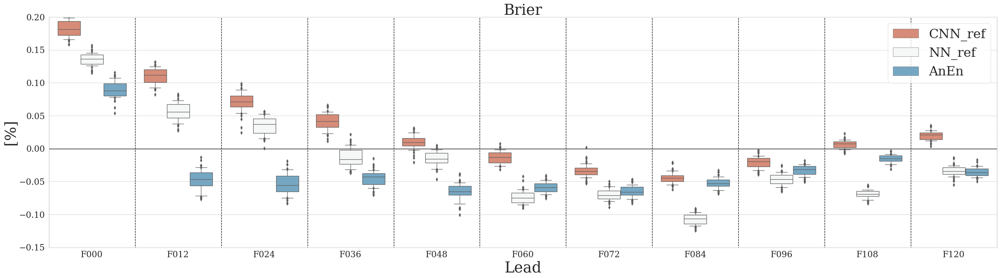

In [327]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette="RdBu",whis=[10, 90])
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.ylabel('[%]',fontsize=35)
plt.xlabel('Lead',fontsize=35)
plt.title('Brier',fontsize=35)
plt.legend(fontsize=30)

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-.15,.2])
plt.xlim([-0.5,10.5])

plt.show()

In [13]:
probs_for

array([9.85493252e-01, 5.75945838e-08, 7.97012519e-07, ...,
       8.57613730e-01, 4.88933239e-02, 4.74029903e-04])

In [34]:
label = tf.cast([0, 0, 1, 0, 1, 1], dtype=tf.bool)
log_pred = tf.math.log([0.1, 0.05, 0.5, 0.2, 0.99, 0.99])
tfp.stats.brier_score(label,log_pred)

InvalidArgumentError: Dimension (1) must be in the range [-1, 1) where 1 is the number of dimensions in the input.

In [96]:
brier_score_loss(verif_forg, probs_forg)

0.03624174548544238

In [106]:
labels = tf.convert_to_tensor(verif_forg)
logits = tf.convert_to_tensor(np.stack([probs_forg,1-probs_forg]).T)

In [117]:
labels = tf.convert_to_tensor(verif_forg)
logits = tf.convert_to_tensor(np.stack([probs_forg,1-probs_forg]).T)
uncertainty, resolution, reliability = tfp.stats.brier_decomposition(labels=labels, logits=logits)
brier_direct = tfp.stats.brier_score(labels=labels, logits=logits)
brier = uncertainty - resolution + reliability
print(uncertainty)
print(resolution)
print(reliability)
print(brier)
print(tf.reduce_mean(brier_direct, axis=0))
print(brier_score_loss(verif_forg, probs_forg))

tf.Tensor(-0.6694813917154856, shape=(), dtype=float64)
tf.Tensor(0.5849539842910315, shape=(), dtype=float64)
tf.Tensor(0.9213848146823714, shape=(), dtype=float64)
tf.Tensor(-0.33305056132414557, shape=(), dtype=float64)
tf.Tensor(0.016814786984405684, shape=(), dtype=float64)
0.03624174548544238


In [144]:
print(brier_score_loss(verif_forg, probs_forg))
obar = verif_forg.sum()/verif_forg.shape[0]
uncertainty = obar*(1-obar)
resolution = 10
reliability = 10
print('uncertainty:',uncertainty)
print('resolution:',resolution)
print('reliability:',reliability)
print('uncertainty - resolution + reliability:', uncertainty - resolution + reliability)
print('full brier:',np.mean((verif_forg-probs_forg)**2))

0.03624174548544238
uncertainty: 0.16525930414225723
resolution: 10
reliability: 10
uncertainty - resolution + reliability: 0.16525930414225698
full brier: 0.03624174548544238


In [118]:
y_true = np.array([0, 1, 1, 0])
y_true_categorical = np.array(["spam", "ham", "ham", "spam"])
y_prob = np.array([0.1, 0.9, 0.8, 0.3])

In [123]:
np.mean((verif_forg-probs_forg)**2)

0.03624174548544238

In [94]:

# _TEMPERATURES = [0.01, 1.0, 5.0]
#   _NLABELS = [2, 4]
#   _NSAMPLES = [8192, 16384]
"""Test the accuracy of the estimated Brier decomposition."""
tf.random.set_seed(1)
nsamples=8192
nlabels=2
temperature = 1.0
logits = tf.random.normal(
        (nsamples, nlabels)) / temperature
logits2 =tf.nn.softmax(logits)
labels = tf.random.uniform(
        (nsamples,), maxval=nlabels, dtype=tf.int32)

uncertainty, resolution, reliability = tfp.stats.brier_decomposition(
        labels=labels, logits=logits2)

    # Recover an estimate of the Brier score from the decomposition
brier = uncertainty - resolution + reliability

# Estimate Brier score directly
brier_direct = tfp.stats.brier_score(labels=labels, logits=logits)

print(uncertainty)
print(resolution)
print(reliability)
print(brier)
print(tf.reduce_mean(brier_direct, axis=0))

tf.Tensor(-0.5000324, shape=(), dtype=float32)
tf.Tensor(6.7553876e-05, shape=(), dtype=float32)
tf.Tensor(0.03214982, shape=(), dtype=float32)
tf.Tensor(-0.46795014, shape=(), dtype=float32)
tf.Tensor(-0.36238348, shape=(), dtype=float32)


In [95]:
"""Test the accuracy of the estimated Brier decomposition."""
tf.random.set_seed(1)
nsamples=8192
nlabels=2
temperature = 1.0
# logits = tf.random.normal(
#         (nsamples, nlabels)) / temperature
# logits =tf.nn.softmax(logits)
# labels = tf.random.uniform(
#         (nsamples,), maxval=nlabels, dtype=tf.int32)

uncertainty, resolution, reliability = tfp.stats.brier_decomposition(
        labels=labels, logits=logits)

    # Recover an estimate of the Brier score from the decomposition
brier = uncertainty - resolution + reliability

# Estimate Brier score directly
brier_direct = tfp.stats.brier_score(labels=labels, logits=logits)

print(uncertainty)
print(resolution)
print(reliability)
print(brier)
print(tf.reduce_mean(brier_direct, axis=0))

tf.Tensor(-0.5000324, shape=(), dtype=float32)
tf.Tensor(6.7553876e-05, shape=(), dtype=float32)
tf.Tensor(0.13833606, shape=(), dtype=float32)
tf.Tensor(-0.3617639, shape=(), dtype=float32)
tf.Tensor(-0.36238348, shape=(), dtype=float32)


In [83]:
brier_direct.numpy().mean()

-0.32976952

In [41]:
(verif_for-1)*-1

array([0, 1, 1, ..., 0, 1, 1])

In [12]:
percys = [80]

for percy in percys:
    dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
    fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
    bsnummy = 1000
    df1, df2, dfm = 1,1,1

    for fcast in fcasts:
        print('doing:',fcast)
        ########################################################################################################
        fortts=np.array([])
        mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = np.percentile(fortts,percy)
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NN_gefs'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_nn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
    
        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'NN_gefs'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        ########################################################################################################
#         del df1
#         del df2
#         del dfm
#         mod = 'Raw_gefs'
#         df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#         df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

#         mod = 'MV_gefs'
#         df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
#         df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    
#         dfm = pd.merge(df1,df2,how='left')

#         bp_nn = np.zeros([bsnummy])
#         cor_nn= np.zeros([bsnummy])
#         for aa in range(bsnummy):
#             inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
#             ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
#             probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
#             verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
#             ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
#             probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
#             verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

#             bp_nn[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))
    
#         dftemp = pd.DataFrame({'Brier':bp_nn})
#         dftemp['Lead'] = fcast
#         dftemp['Model'] = 'MV_gefs'
#         dffin = pd.concat([dffin, dftemp], axis=0)
        ########################################################################################################
        del df1
        del df2
        del dfm
    
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'CNN_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_cnn = np.zeros([bsnummy])
        cor_cnn= np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

            bp_cnn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
    
        dftemp = pd.DataFrame({'Brier':bp_cnn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'CNN_ref'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'NNft_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['lon']=df2['lon']+360

        dfm = pd.merge(df1,df2,how='left')

        bp_nn = np.zeros([bsnummy])
        cor_nn = np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
            
            ff = np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSnn'][inss])>=threshold)*1

            bp_nn[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100

        dftemp = pd.DataFrame({'Brier':bp_nn})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'NN_ref'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
        ########################################################################################################
        del df1
        del df2
        del dfm
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

        mod = 'AnEn'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
        df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
        df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

        dfm = pd.merge(df1,df2,how='left')
    
        bp_anen = np.zeros([bsnummy])
        corr_anen = np.zeros([bsnummy])
        for aa in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
            ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
            probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
            ff = np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T
            probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
            verif_for = (np.array(dfm['OBSanen'][inss])>=threshold)*1

            bp_anen[aa] = (1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg)))*100
    
        dftemp = pd.DataFrame({'Brier':bp_anen})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'AnEn'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        print(dffin.shape)
    
        break
    break
    
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,23],[0,0],'k')

    ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    plt.xticks(fontsize=BPdict['tickFS'])
    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Lead',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
    plt.title('Brier',fontsize=BPdict['titleFS'])

    for bb in np.arange(-0.5,22,1):
        plt.plot([bb,bb],[-25,25],'k--')

    plt.ylim([-13,21])
    plt.xlim([-0.5,10.5])

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Brier_percy'+str(percy)+'.png',dpi = 300,bbox_inches='tight')


    plt.show()



doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 215.29005882408936 for a percentile: 80
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
2016
2017
2018
(4000, 4)


In [ ]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('Brier',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-.13,.21])
plt.xlim([-0.5,10.5])

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Brier_percy'+str(percy)+'.png',dpi = 300,bbox_inches='tight')


plt.show()

In [31]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
bsnummy = 100
threshold = 500

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'CNN_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_cnn = np.zeros([bsnummy])
    cor_cnn= np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['IVTmean_cnn'][inss],dfm['IVTstd_cnn'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBScnn'][inss])>=threshold)*1

        bp_cnn[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))
    
    dftemp = pd.DataFrame({'Brier':bp_cnn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
        
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'NN_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['lon']=df2['lon']+360

    dfm = pd.merge(df1,df2,how='left')

    bp_nn = np.zeros([bsnummy])
    cor_nn = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['IVTmean_nn'][inss],dfm['IVTstd_nn'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBSnn'][inss])>=threshold)*1

        bp_nn[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))

    dftemp = pd.DataFrame({'Brier':bp_nn})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    
    
    ########################################################################################################
    mod = 'NN_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnn','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'AnEn'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBSanen','Model':'Reforecast','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df2['Mean'] = np.mean(df2.filter(regex='Analog'),axis=1)
    df2['std'] = np.std(df2.filter(regex='Analog'),axis=1)
    df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))

    dfm = pd.merge(df1,df2,how='left')
    
    bp_anen = np.zeros([bsnummy])
    corr_anen = np.zeros([bsnummy])
    for aa in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])        
        ff = np.stack([dfm['IVTmean_gefs'][inss],dfm['IVTstd_gefs'][inss]]).T
        probs_forg = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_forg = (np.array(dfm['OBSnn'][inss])>=threshold)*1
        
        ff = np.stack([dfm['Mean'][inss],dfm['std'][inss]]).T
        probs_for = utils_verif.prob_ob(threshold,ff[:,0],ff[:,1])
        verif_for = (np.array(dfm['OBSanen'][inss])>=threshold)*1

        bp_anen[aa] = 1 - (brier_score_loss(verif_for, probs_for)/brier_score_loss(verif_forg, probs_forg))
    
    dftemp = pd.DataFrame({'Brier':bp_anen})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    print(dffin.shape)



doing: F000
2016
2017
2018
(300, 4)
doing: F006
2016
2017
2018
(600, 4)
doing: F012
2016
2017
2018
(900, 4)
doing: F018
2016
2017
2018
(1200, 4)
doing: F024
2016
2017
2018
(1500, 4)
doing: F030
2016
2017
2018
(1800, 4)
doing: F036
2016
2017
2018
(2100, 4)
doing: F042
2016
2017
2018
(2400, 4)
doing: F048
2016
2017
2018
(2700, 4)
doing: F054
2016
2017
2018
(3000, 4)
doing: F060
2016
2017
2018
(3300, 4)
doing: F066
2016
2017
2018
(3600, 4)
doing: F072
2016
2017
2018
(3900, 4)
doing: F078
2016
2017
2018
(4200, 4)
doing: F084
2016
2017
2018
(4500, 4)
doing: F090
2016
2017
2018
(4800, 4)
doing: F096
2016
2017
2018
(5100, 4)
doing: F102
2016
2017
2018
(5400, 4)
doing: F108
2016
2017
2018
(5700, 4)
doing: F114
2016
2017
2018
(6000, 4)
doing: F120
2016
2017
2018
(6300, 4)


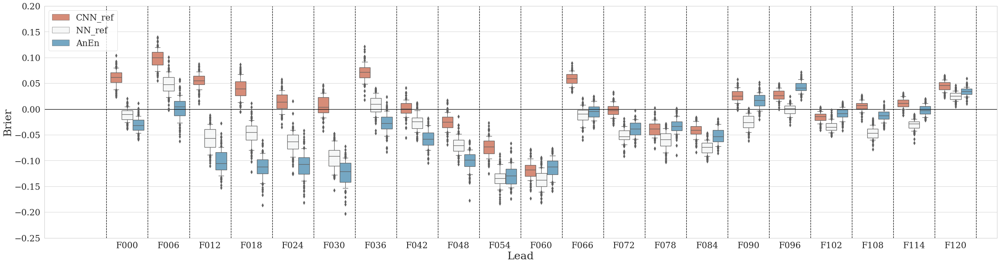

In [33]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="Brier", hue="Model",data=dffin, palette="RdBu",whis=[10, 90])
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.ylabel('Brier',fontsize=25)
plt.xlabel('Lead',fontsize=25)
plt.legend(fontsize=20)

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.25,.2],'k--')

plt.ylim([-.25,.20])
plt.xlim([-2,21])

plt.show()

## TW CRPS

In [21]:
def ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, len(xs)+1)/float(len(xs))
    return xs, ys

def f_emp(ens,x):
    xs,ys = ecdf(ens)
    vals=[]
    vals = np.zeros([len(x)])
    for bb,xT in enumerate(x):
        if all(xs>xT):
            vals[bb] = 0
        elif (np.sum(1*(xs>xT))>0) & (np.sum(1*(xs>xT))<len(xs)):
            inds = np.searchsorted(xs>xT, 0.5)
            vals[bb] =ys[inds-1]
        else:
            vals[bb] = 1
    return np.array(vals)

def f_emp2(ens,x):
    xs,ys = ecdf(ens)
    dogs = np.searchsorted(xs,x,side='right')
    vals =ys[dogs-1]
    vals[dogs==0]=0
    return np.array(vals)

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
#     print((f_emp(ens,eval_z).shape))
    out = np.sum(w(eval_z)*((f_emp(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample2(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
    
#     print(eval_z.shape)
#     print((f_emp2(ens,eval_z).shape))
    
    out = np.sum(w(eval_z)*((f_emp2(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out


In [542]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 5
ense = 100
threshold = 250

# fcasts = ['F024','F048']

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})

    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast_cnn','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360
    
    mod = 'NN_ref'
    df3,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df3 = df3.rename(columns={'OBS':'OBSnn','Model':'Reforecast_nn','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df3['lon']=df3['lon']+360
    
    
    mod = 'AnEn'
    df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
    df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
    df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
    df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))


    dfm = pd.merge(df1,df2,how='left')
    dfm = pd.merge(dfm,df3,how='left')
    dfm = pd.merge(dfm,df4,how='left')
    
    
    #define 4 groups:
    Merrag = dfm['OBSnng']
    For_ug = dfm['IVTmean_gefs']
    For_sg = dfm['IVTstd_gefs']
    
    Merrac = dfm['OBScnn']
    For_uc = dfm['IVTmean_cnn']
    For_sc = dfm['IVTstd_cnn']
    
    Merran = dfm['OBSnn']
    For_un = dfm['IVTmean_nn']
    For_sn = dfm['IVTstd_nn']
    
    Merraa = dfm['OBSanen']
    For_ua = dfm['AnEn_Mean']
    For_sa = dfm['AnEn_std']
    
    #define 3 groups:
    CRPScnn_ref = np.zeros(bsnummy)
    CRPSnn_ref = np.zeros(bsnummy)
    CRPSanen_ref = np.zeros(bsnummy)
    for bb in range(bsnummy):
        print(bb)
        # Create synthetic Ensemble:
        
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        
        #define 4 groups:
        Ensemblg = np.zeros([Merrag.shape[0],ense])
        Truthg = np.zeros([Merrag.shape[0]])
        Ensemblc = np.zeros([Merrag.shape[0],ense])
        Truthc = np.zeros([Merrag.shape[0]])
        Ensembln = np.zeros([Merran.shape[0],ense])
        Truthn = np.zeros([Merran.shape[0]])    
        Ensembla = np.zeros([Merraa.shape[0],ense])
        Trutha = np.zeros([Merraa.shape[0]])
        
        
        for gre,rndns in enumerate(inss):
            Ensemblg[gre,:]=np.random.normal(For_ug[rndns],For_sg[rndns],100)
            Truthg[gre] = Merrag[rndns]
            Ensemblc[gre,:]=np.random.normal(For_uc[rndns],For_sc[rndns],100)
            Truthc[gre] = Merrac[rndns]
            Ensembln[gre,:]=np.random.normal(For_un[rndns],For_sn[rndns],100)
            Truthn[gre] = Merran[rndns]
            Ensembla[gre,:]=np.random.normal(For_ua[rndns],For_sa[rndns],100)
            Trutha[gre] = Merraa[rndns]
        
        
        #define 4 groups:
        CRPStempg = np.zeros((Merrag.shape[0]))
        CRPStempc = np.zeros((Merrac.shape[0]))
        CRPStempn = np.zeros((Merran.shape[0]))
        CRPStempa = np.zeros((Merraa.shape[0]))
        
        for gre in range(0,Merrag.shape[0]):    
            if np.max(np.append(Merrag[gre],Ensemblg[gre,:]))<=threshold:
                CRPStempg[gre] = 0
            else:
                CRPStempg[gre] = twcrps_sample2(Merrag[gre],Ensemblg[gre,:],'indicator.right',threshold,step_width=10)
                
        for gre in range(0,Merrac.shape[0]):    
            if np.max(np.append(Merrac[gre],Ensemblc[gre,:]))<=threshold:
                CRPStempc[gre] = 0
            else:
                CRPStempc[gre] = twcrps_sample2(Merrac[gre],Ensemblc[gre,:],'indicator.right',threshold,step_width=10)
                
        for gre in range(0,Merran.shape[0]):    
            if np.max(np.append(Merran[gre],Ensembln[gre,:]))<=threshold:
                CRPStempn[gre] = 0
            else:
                CRPStempn[gre] = twcrps_sample2(Merran[gre],Ensembln[gre,:],'indicator.right',threshold,step_width=10)
        
        for gre in range(0,Merraa.shape[0]):    
            if np.max(np.append(Merraa[gre],Ensembla[gre,:]))<=threshold:
                CRPStempa[gre] = 0
            else:
                CRPStempa[gre] = twcrps_sample2(Merraa[gre],Ensembla[gre,:],'indicator.right',threshold,step_width=10)
                
        #define 3 groups:       
        CRPScnn_ref[bb] = 1 - (np.mean(CRPStempc)/np.mean(CRPStempg))
        CRPSnn_ref[bb] = 1 - (np.mean(CRPStempn)/np.mean(CRPStempg))
        CRPSanen_ref[bb] = 1 - (np.mean(CRPStempa)/np.mean(CRPStempg))
        
    #define 3 groups:     
    dftemp = pd.DataFrame({'CRPS':CRPScnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSanen_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
        
    print('...done...')
    
    

doing: F024
2016
2017
2018
0
1
2
3
4
...done...
doing: F048
2016
2017
2018
0
1
2
3
4
...done...


## TW Crps

In [3]:
def ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, len(xs)+1)/float(len(xs))
    return xs, ys

def f_emp(ens,x):
    xs,ys = ecdf(ens)
    vals=[]
    vals = np.zeros([len(x)])
    for bb,xT in enumerate(x):
        if all(xs>xT):
            vals[bb] = 0
        elif (np.sum(1*(xs>xT))>0) & (np.sum(1*(xs>xT))<len(xs)):
            inds = np.searchsorted(xs>xT, 0.5)
            vals[bb] =ys[inds-1]
        else:
            vals[bb] = 1
    return np.array(vals)

def f_emp2(ens,x):
    xs,ys = ecdf(ens)
    dogs = np.searchsorted(xs,x,side='right')
    vals =ys[dogs-1]
    vals[dogs==0]=0
    return np.array(vals)

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
#     print((f_emp(ens,eval_z).shape))
    out = np.sum(w(eval_z)*((f_emp(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample2(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
    
#     print(eval_z.shape)
#     print((f_emp2(ens,eval_z).shape))
    
    out = np.sum(w(eval_z)*((f_emp2(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out


In [171]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 1000
ense = 100
threshold = 450

# fcasts = ['F048','F054','F060','F066','F072']
# fcasts = ['F012','F024']


for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    
    
    mod = 'MV_gefs'
    df6,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df6 = df6.rename(columns={'OBS':'OBSmvg','Model':'Reforecast','IVTmean':'IVTmean_mvgefs','IVTstd':'IVTstd_mvgefs'})
    
    
    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast_cnn','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360
    
    mod = 'NN_ref'
    df3,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df3 = df3.rename(columns={'OBS':'OBSnn','Model':'Reforecast_nn','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df3['lon']=df3['lon']+360
    
    
    mod = 'AnEn'
    df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
    df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
    df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
    df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
    
    mod = 'NN_gefs'
    df5,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df5 = df5.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_nngefs','IVTstd':'IVTstd_nngefs'})


    dfm = pd.merge(df1,df2,how='left')
    dfm = pd.merge(dfm,df3,how='left')
    dfm = pd.merge(dfm,df4,how='left')
    dfm = pd.merge(dfm,df5,how='left')
    dfm = pd.merge(dfm,df6,how='left')
    
    
    #define 4 groups:
    Merrag = dfm['OBSnng']
    For_ug = dfm['IVTmean_gefs']
    For_sg = dfm['IVTstd_gefs']
    
    Merramvg = dfm['OBSmvg']
    For_umvg = dfm['IVTmean_mvgefs']
    For_smvg = dfm['IVTstd_mvgefs']
    
    Merranng = dfm['OBSnng']
    For_unng = dfm['IVTmean_nngefs']
    For_snng = dfm['IVTstd_nngefs']
    
    Merrac = dfm['OBScnn']
    For_uc = dfm['IVTmean_cnn']
    For_sc = dfm['IVTstd_cnn']
    
    Merran = dfm['OBSnn']
    For_un = dfm['IVTmean_nn']
    For_sn = dfm['IVTstd_nn']
    
    Merraa = dfm['OBSanen']
    For_ua = dfm['AnEn_Mean']
    For_sa = dfm['AnEn_std']


    #aadefine 4 groups:
    Ensemblg = np.zeros([Merrag.shape[0],ense])
    Truthg = np.zeros([Merrag.shape[0]])
    
    Ensemblmv = np.zeros([Merrag.shape[0],ense])
    Truthmv = np.zeros([Merrag.shape[0]])
    Ensemblc = np.zeros([Merrag.shape[0],ense])
    Truthc = np.zeros([Merrag.shape[0]])
    Ensembln = np.zeros([Merran.shape[0],ense])
    Truthn = np.zeros([Merran.shape[0]])    
    Ensembla = np.zeros([Merraa.shape[0],ense])
    Trutha = np.zeros([Merraa.shape[0]])
    Ensemblnng = np.zeros([Merrag.shape[0],ense])
    Truthnng = np.zeros([Merrag.shape[0]])
        
        
    for gre in range(Merrag.shape[0]):
        Ensemblg[gre,:]=np.random.normal(For_ug[gre],For_sg[gre],100)
        Truthg[gre] = Merrag[gre]
        Ensemblmv[gre,:]=np.random.normal(For_umvg[gre],For_smvg[gre],100)
        Truthmv[gre] = Merrag[gre]
        Ensemblc[gre,:]=np.random.normal(For_uc[gre],For_sc[gre],100)
        Truthc[gre] = Merrac[gre]
        Ensembln[gre,:]=np.random.normal(For_un[gre],For_sn[gre],100)
        Truthn[gre] = Merran[gre]
        Ensembla[gre,:]=np.random.normal(For_ua[gre],For_sa[gre],100)
        Trutha[gre] = Merraa[gre]
        Ensemblnng[gre,:]=np.random.normal(For_unng[gre],For_snng[gre],100)
        Truthnng[gre] = Merrag[gre]

    
    CRPStempg = np.zeros((Merrag.shape[0]))
    CRPStempnng = np.zeros((Merranng.shape[0]))
    CRPStempmvg = np.zeros((Merramvg.shape[0]))

    CRPStempc = np.zeros((Merrac.shape[0]))
    CRPStempn = np.zeros((Merran.shape[0]))
    CRPStempa = np.zeros((Merraa.shape[0]))
    
    print('calc tw-crps')

    
    for gre in range(0,Merrac.shape[0]):    
        if np.max(np.append(Merrac[gre],Ensemblc[gre,:]))<=threshold:
            CRPStempc[gre] = 0
        else:
            CRPStempc[gre] = twcrps_sample2(Merrac[gre],Ensemblc[gre,:],'indicator.right',threshold,step_width=10)


    for gre in range(0,Merrag.shape[0]):    
        if np.max(np.append(Merrag[gre],Ensemblg[gre,:]))<=threshold:
            CRPStempg[gre] = 0
        else:
            CRPStempg[gre] = twcrps_sample2(Merrag[gre],Ensemblg[gre,:],'indicator.right',threshold,step_width=10)

     
    for gre in range(0,Merran.shape[0]):    
        if np.max(np.append(Merrac[gre],Ensembln[gre,:]))<=threshold:
            CRPStempn[gre] = 0
        else:
            CRPStempn[gre] = twcrps_sample2(Merran[gre],Ensembln[gre,:],'indicator.right',threshold,step_width=10)


    for gre in range(0,Merraa.shape[0]):    
        if np.max(np.append(Merraa[gre],Ensembla[gre,:]))<=threshold:
            CRPStempa[gre] = 0
        else:
            CRPStempa[gre] = twcrps_sample2(Merraa[gre],Ensembla[gre,:],'indicator.right',threshold,step_width=10)
            
    for gre in range(0,Merraa.shape[0]):    
        if np.max(np.append(Merranng[gre],Ensemblnng[gre,:]))<=threshold:
            CRPStempnng[gre] = 0
        else:
            CRPStempnng[gre] = twcrps_sample2(Merranng[gre],Ensemblnng[gre,:],'indicator.right',threshold,step_width=10)
            
    for gre in range(0,Merraa.shape[0]):    
        if np.max(np.append(Merramvg[gre],Ensemblmv[gre,:]))<=threshold:
            CRPStempmvg[gre] = 0
        else:
            CRPStempmvg[gre] = twcrps_sample2(Merramvg[gre],Ensemblmv[gre,:],'indicator.right',threshold,step_width=10)
    
    
    
    print("...boostrapping....")
#     bootstrap randomdraws:
    CRPScnn_ref = np.zeros(bsnummy)
    CRPSnn_ref = np.zeros(bsnummy)
    CRPSanen_ref = np.zeros(bsnummy)
    CRPSnng_gefs = np.zeros(bsnummy)
    CRPSmvg_gefs = np.zeros(bsnummy)
    
    for bb in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        CRPScnn_ref[bb] = 1 - (np.mean(CRPStempc[inss])/np.mean(CRPStempg[inss]))
        CRPSnn_ref[bb] = 1 - (np.mean(CRPStempn[inss])/np.mean(CRPStempg[inss]))
        CRPSanen_ref[bb] = 1 - (np.mean(CRPStempa[inss])/np.mean(CRPStempg[inss]))
        CRPSnng_gefs[bb] = 1 - (np.mean(CRPStempnng[inss])/np.mean(CRPStempg[inss]))
        CRPSmvg_gefs[bb] = 1 - (np.mean(CRPStempmvg[inss])/np.mean(CRPStempg[inss]))
        
    #define 3 groups:  
    dftemp = pd.DataFrame({'CRPS':CRPSnng_gefs})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSmvg_gefs})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'MV_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPScnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSanen_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
        
    print('...done...')
    
    

doing: F000
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F084
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F108
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...


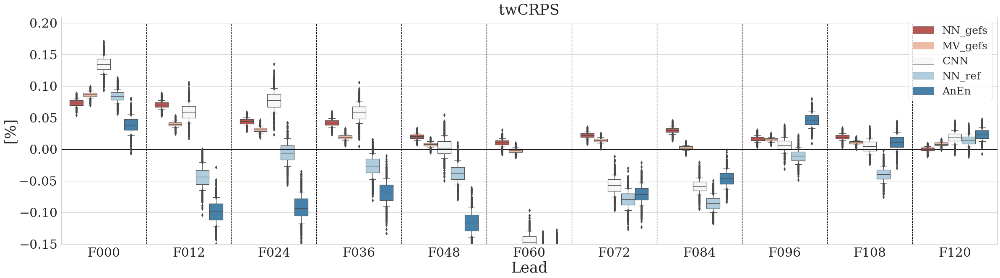

In [172]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette="RdBu",whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('twCRPS',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.6,.2],'k--')

plt.ylim([-.15,.21])
plt.xlim([-0.5,10.5])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWcrps_thresh450.png',dpi = 300,bbox_inches='tight')

plt.show()



In [39]:
dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
bsnummy = 1000
ense = 100
threshold = 450

for fcast in fcasts:
    print('doing:',fcast)
    ########################################################################################################
    mod = 'Raw_gefs'
    df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df1 = df1.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    
    mod = 'CNNft_ref'
    df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast_cnn','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
    df2['lon']=df2['lon']+360
    
    mod = 'NN_ref'
    df3,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df3 = df3.rename(columns={'OBS':'OBSnn','Model':'Reforecast_nn','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
    df3['lon']=df3['lon']+360
    
    
    mod = 'AnEn'
    df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
    df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
    df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
    df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
    
    mod = 'NN_gefs'
    df5,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    df5 = df5.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_nngefs','IVTstd':'IVTstd_nngefs'})


    dfm = pd.merge(df1,df2,how='left')
    dfm = pd.merge(dfm,df3,how='left')
    dfm = pd.merge(dfm,df4,how='left')
    dfm = pd.merge(dfm,df5,how='left')
    
    
    #define 4 groups:
    Merrag = dfm['OBSnng']
    For_ug = dfm['IVTmean_gefs']
    For_sg = dfm['IVTstd_gefs']
    
    Merranng = dfm['OBSnng']
    For_unng = dfm['IVTmean_nngefs']
    For_snng = dfm['IVTstd_nngefs']
    
    Merrac = dfm['OBScnn']
    For_uc = dfm['IVTmean_cnn']
    For_sc = dfm['IVTstd_cnn']
    
    Merran = dfm['OBSnn']
    For_un = dfm['IVTmean_nn']
    For_sn = dfm['IVTstd_nn']
    
    Merraa = dfm['OBSanen']
    For_ua = dfm['AnEn_Mean']
    For_sa = dfm['AnEn_std']


    #aadefine 4 groups:
    Ensemblg = np.zeros([Merrag.shape[0],ense])
    Truthg = np.zeros([Merrag.shape[0]])
    Ensemblc = np.zeros([Merrag.shape[0],ense])
    Truthc = np.zeros([Merrag.shape[0]])
    Ensembln = np.zeros([Merran.shape[0],ense])
    Truthn = np.zeros([Merran.shape[0]])    
    Ensembla = np.zeros([Merraa.shape[0],ense])
    Trutha = np.zeros([Merraa.shape[0]])
    Ensemblnng = np.zeros([Merrag.shape[0],ense])
    Truthnng = np.zeros([Merrag.shape[0]])
        
        
    for gre in range(Merrag.shape[0]):
        Ensemblg[gre,:]=np.random.normal(For_ug[gre],For_sg[gre],100)
        Truthg[gre] = Merrag[gre]
        Ensemblc[gre,:]=np.random.normal(For_uc[gre],For_sc[gre],100)
        Truthc[gre] = Merrac[gre]
        Ensembln[gre,:]=np.random.normal(For_un[gre],For_sn[gre],100)
        Truthn[gre] = Merran[gre]
        Ensembla[gre,:]=np.random.normal(For_ua[gre],For_sa[gre],100)
        Trutha[gre] = Merraa[gre]
        Ensemblnng[gre,:]=np.random.normal(For_unng[gre],For_snng[gre],100)
        Truthnng[gre] = Merrag[gre]

    
    CRPStempg = np.zeros((Merrag.shape[0]))
    CRPStempnng = np.zeros((Merranng.shape[0]))
    CRPStempc = np.zeros((Merrac.shape[0]))
    CRPStempn = np.zeros((Merran.shape[0]))
    CRPStempa = np.zeros((Merraa.shape[0]))
    
    print('calc tw-crps')

    
    for gre in range(0,Merrac.shape[0]):    
        if np.max(np.append(Merrac[gre],Ensemblc[gre,:]))<=threshold:
            CRPStempc[gre] = 0
        else:
            CRPStempc[gre] = twcrps_sample2(Merrac[gre],Ensemblc[gre,:],'indicator.right',threshold,step_width=10)


    for gre in range(0,Merrag.shape[0]):    
        if np.max(np.append(Merrag[gre],Ensemblg[gre,:]))<=threshold:
            CRPStempg[gre] = 0
        else:
            CRPStempg[gre] = twcrps_sample2(Merrag[gre],Ensemblg[gre,:],'indicator.right',threshold,step_width=10)

     
    for gre in range(0,Merran.shape[0]):    
        if np.max(np.append(Merrac[gre],Ensembln[gre,:]))<=threshold:
            CRPStempn[gre] = 0
        else:
            CRPStempn[gre] = twcrps_sample2(Merran[gre],Ensembln[gre,:],'indicator.right',threshold,step_width=10)


    for gre in range(0,Merraa.shape[0]):    
        if np.max(np.append(Merraa[gre],Ensembla[gre,:]))<=threshold:
            CRPStempa[gre] = 0
        else:
            CRPStempa[gre] = twcrps_sample2(Merraa[gre],Ensembla[gre,:],'indicator.right',threshold,step_width=10)
            
    for gre in range(0,Merraa.shape[0]):    
        if np.max(np.append(Merranng[gre],Ensemblnng[gre,:]))<=threshold:
            CRPStempnng[gre] = 0
        else:
            CRPStempnng[gre] = twcrps_sample2(Merranng[gre],Ensemblnng[gre,:],'indicator.right',threshold,step_width=10)
    
    
    print("...boostrapping....")
#     bootstrap randomdraws:
    CRPScnn_ref = np.zeros(bsnummy)
    CRPSnn_ref = np.zeros(bsnummy)
    CRPSanen_ref = np.zeros(bsnummy)
    CRPSnng_gefs = np.zeros(bsnummy)
    
    for bb in range(bsnummy):
        inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
        CRPScnn_ref[bb] = 1 - (np.mean(CRPStempc[inss])/np.mean(CRPStempg[inss]))
        CRPSnn_ref[bb] = 1 - (np.mean(CRPStempn[inss])/np.mean(CRPStempg[inss]))
        CRPSanen_ref[bb] = 1 - (np.mean(CRPStempa[inss])/np.mean(CRPStempg[inss]))
        CRPSnng_gefs[bb] = 1 - (np.mean(CRPStempnng[inss])/np.mean(CRPStempg[inss]))
        
    #define 3 groups:  
    dftemp = pd.DataFrame({'CRPS':CRPSnng_gefs})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_gefs'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPScnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'CNN'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSnn_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'NN_ref'
    dffin = pd.concat([dffin, dftemp], axis=0)
    
    dftemp = pd.DataFrame({'CRPS':CRPSanen_ref})
    dftemp['Lead'] = fcast
    dftemp['Model'] = 'AnEn'
    dffin = pd.concat([dffin, dftemp], axis=0)
        
    print('...done...')
    
    

doing: F000
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F084
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F108
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...


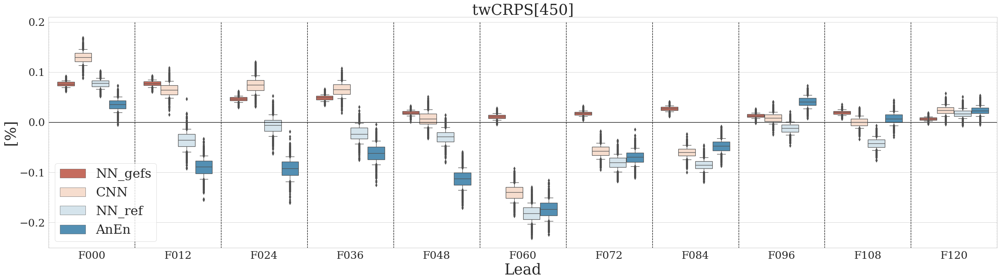

In [40]:
plt.figure(figsize=(40,10))
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette="RdBu",whis=[10, 90])
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.ylabel('[%]',fontsize=35)
plt.xlabel('Lead',fontsize=35)
plt.title('twCRPS[450]',fontsize=35)
plt.legend(fontsize=30)


for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.6,.2],'k--')

plt.ylim([-.25,.21])
plt.xlim([-0.5,10.5])
plt.show()

In [ ]:
# calcbounds:

    mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NN_ref']
    utils_verif.load_forecast(fcast,mod)
    pcrt = [np.array([80,90]),np.array([90,95]),np.array([95,100])]

    fortts=np.array([])
    for mod in mods:
        df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
        fortts=np.concatenate([fortts,np.array(Post_m)])
        bounds =[]
        for bb in pcrt:
            bounds.append([np.percentile(fortts,bb[0]),np.percentile(fortts,bb[1])])
    ##############
    print("these are bounds:",bounds)


In [ ]:
tfp.stats.brier_score()

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: -2.9518674915555927 for a percentile: 0
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: -6.730849405082446 for a percentile: 0
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: -10.503388942896375 for a percentile: 0
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: -7.431380180896275 for a percentile: 0
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: -8.52195332849783 for a percentile: 0
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
this is the threshold: 

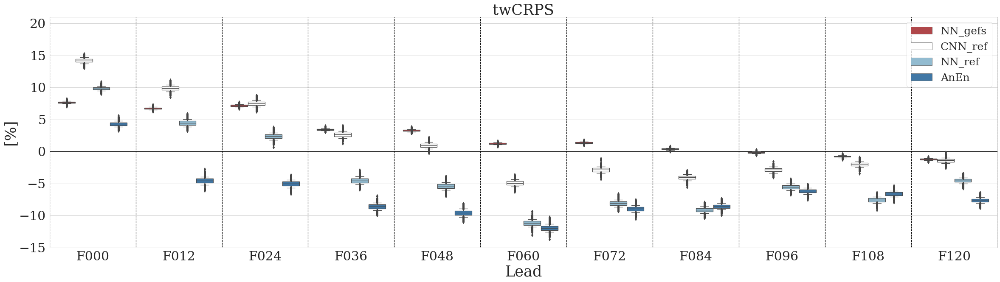

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 253.23600652901683 for a percentile: 85
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: 254.78068653665042 for a percentile: 85
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 256.7354299601062 for a percentile: 85
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: 252.48650131225588 for a percentile: 85
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 253.26009906919228 for a percentile: 85
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
this is the threshol

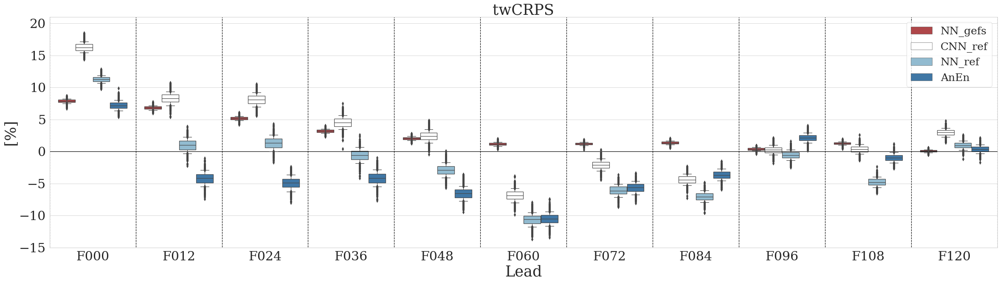

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 312.72756168347655 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: 311.95502578472656 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 316.3833767986087 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: 307.0008167085194 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
this is the threshold: 296.43093926776953 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrappi

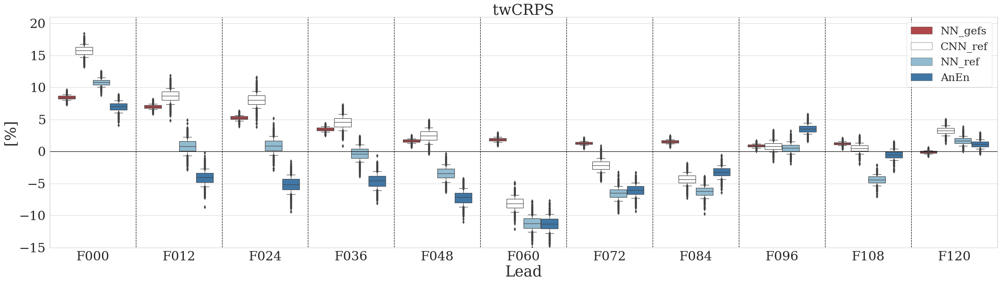

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 413.46209084647035 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: 411.1127529023044 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 413.3456880937499 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: 403.2573090326217 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 399.65317547554156 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
this is the threshold:

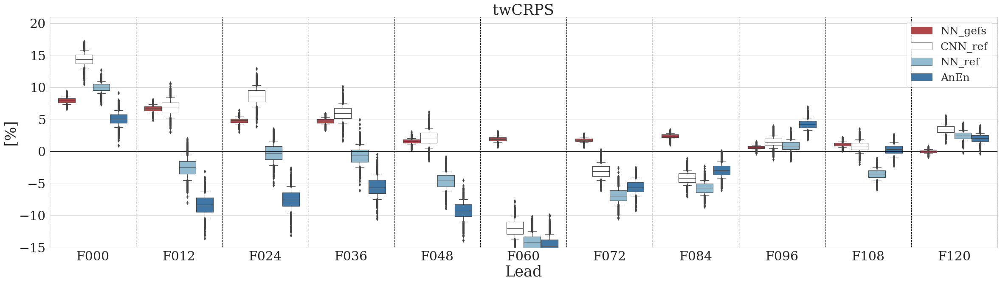

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 544.1031887586407 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F012
No Post-Processing
2016
2017
2018
this is the threshold: 548.5039762369795 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 538.8337243652346 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F036
No Post-Processing
2016
2017
2018
this is the threshold: 535.431060726007 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 520.460175137922 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F060
No Post-Processing
2016
2017
2018
this is the threshold: 510

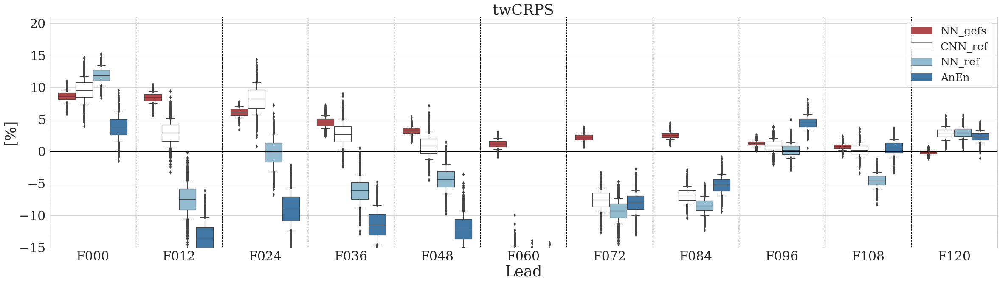

In [6]:
percys = [0,85,90,95,98]
for percy in percys:
    
    dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
    fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,12)]
    bsnummy = 1000
    ense = 100

    for fcast in fcasts:
        print('doing:',fcast)
        fortts=np.array([])
        mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NN_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = np.percentile(fortts,percy)
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    
        mod = 'CNNft_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast_cnn','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
        df2['lon']=df2['lon']+360
    
        mod = 'NNft_ref'
        df3,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df3 = df3.rename(columns={'OBS':'OBSnn','Model':'Reforecast_nn','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df3['lon']=df3['lon']+360
    
    
        mod = 'AnEn'
        df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
        df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
        df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
        df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
    
        mod = 'NN_gefs'
        df5,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df5 = df5.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_nngefs','IVTstd':'IVTstd_nngefs'})
        
        mod = 'MV_gefs'
        df6,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df6 = df6.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_mvgefs','IVTstd':'IVTstd_mvgefs'})


        dfm = pd.merge(df1,df2,how='left')
        dfm = pd.merge(dfm,df3,how='left')
        dfm = pd.merge(dfm,df4,how='left')
        dfm = pd.merge(dfm,df5,how='left')
        dfm = pd.merge(dfm,df6,how='left')
    
    
        #define 4 groups:
        Merrag = dfm['OBSnng']
        For_ug = dfm['IVTmean_gefs']
        For_sg = dfm['IVTstd_gefs']
    
        Merranng = dfm['OBSnng']
        For_unng = dfm['IVTmean_nngefs']
        For_snng = dfm['IVTstd_nngefs']
    
        Merrac = dfm['OBScnn']
        For_uc = dfm['IVTmean_cnn']
        For_sc = dfm['IVTstd_cnn']
    
        Merran = dfm['OBSnn']
        For_un = dfm['IVTmean_nn']
        For_sn = dfm['IVTstd_nn']
    
        Merraa = dfm['OBSanen']
        For_ua = dfm['AnEn_Mean']
        For_sa = dfm['AnEn_std']
        
        Merramvg = dfm['OBSnng']
        For_umvg = dfm['IVTmean_mvgefs']
        For_smvg = dfm['IVTstd_mvgefs']


        #aadefine 4 groups:
        Ensemblg = np.zeros([Merrag.shape[0],ense])
        Truthg = np.zeros([Merrag.shape[0]])
        Ensemblc = np.zeros([Merrag.shape[0],ense])
        Truthc = np.zeros([Merrag.shape[0]])
        Ensembln = np.zeros([Merran.shape[0],ense])
        Truthn = np.zeros([Merran.shape[0]])    
        Ensembla = np.zeros([Merraa.shape[0],ense])
        Trutha = np.zeros([Merraa.shape[0]])
        Ensemblnng = np.zeros([Merrag.shape[0],ense])
        Truthnng = np.zeros([Merrag.shape[0]])
        Ensemblmvg = np.zeros([Merrag.shape[0],ense])
        Truthmvg = np.zeros([Merrag.shape[0]])
        
        
        for gre in range(Merrag.shape[0]):
            Ensemblg[gre,:]=np.random.normal(For_ug[gre],For_sg[gre],100)
            Truthg[gre] = Merrag[gre]
            Ensemblc[gre,:]=np.random.normal(For_uc[gre],For_sc[gre],100)
            Truthc[gre] = Merrac[gre]
            Ensembln[gre,:]=np.random.normal(For_un[gre],For_sn[gre],100)
            Truthn[gre] = Merran[gre]
            Ensembla[gre,:]=np.random.normal(For_ua[gre],For_sa[gre],100)
            Trutha[gre] = Merraa[gre]
            Ensemblnng[gre,:]=np.random.normal(For_unng[gre],For_snng[gre],100)
            Truthnng[gre] = Merranng[gre]
            Ensemblmvg[gre,:]=np.random.normal(For_umvg[gre],For_smvg[gre],100)
            Truthmvg[gre] = Merramvg[gre]

    
        CRPStempg = np.zeros((Merrag.shape[0]))
        CRPStempnng = np.zeros((Merranng.shape[0]))
        CRPStempmvg = np.zeros((Merramvg.shape[0]))
        CRPStempc = np.zeros((Merrac.shape[0]))
        CRPStempn = np.zeros((Merran.shape[0]))
        CRPStempa = np.zeros((Merraa.shape[0]))
    
        print('calc tw-crps')

    
        for gre in range(0,Merrac.shape[0]):    
            if np.max(np.append(Merrac[gre],Ensemblc[gre,:]))<=threshold:
                CRPStempc[gre] = 0
            else:
                CRPStempc[gre] = twcrps_sample2(Merrac[gre],Ensemblc[gre,:],'indicator.right',threshold,step_width=10)


        for gre in range(0,Merrag.shape[0]):    
            if np.max(np.append(Merrag[gre],Ensemblg[gre,:]))<=threshold:
                CRPStempg[gre] = 0
            else:
                CRPStempg[gre] = twcrps_sample2(Merrag[gre],Ensemblg[gre,:],'indicator.right',threshold,step_width=10)

     
        for gre in range(0,Merran.shape[0]):    
            if np.max(np.append(Merran[gre],Ensembln[gre,:]))<=threshold:
                CRPStempn[gre] = 0
            else:
                CRPStempn[gre] = twcrps_sample2(Merran[gre],Ensembln[gre,:],'indicator.right',threshold,step_width=10)


        for gre in range(0,Merraa.shape[0]):    
            if np.max(np.append(Merraa[gre],Ensembla[gre,:]))<=threshold:
                CRPStempa[gre] = 0
            else:
                CRPStempa[gre] = twcrps_sample2(Merraa[gre],Ensembla[gre,:],'indicator.right',threshold,step_width=10)
            
        for gre in range(0,Merraa.shape[0]):    
            if np.max(np.append(Merranng[gre],Ensemblnng[gre,:]))<=threshold:
                CRPStempnng[gre] = 0
            else:
                CRPStempnng[gre] = twcrps_sample2(Merranng[gre],Ensemblnng[gre,:],'indicator.right',threshold,step_width=10)
                                
        for gre in range(0,Merraa.shape[0]):    
            if np.max(np.append(Merramvg[gre],Ensemblmvg[gre,:]))<=threshold:
                CRPStempmvg[gre] = 0
            else:
                CRPStempmvg[gre] = twcrps_sample2(Merramvg[gre],Ensemblmvg[gre,:],'indicator.right',threshold,step_width=10)
                                
    
    
        print("...boostrapping....")
#     bootstrap randomdraws:
        CRPScnn_ref = np.zeros(bsnummy)
        CRPSnn_ref = np.zeros(bsnummy)
        CRPSanen_ref = np.zeros(bsnummy)
        CRPSnng_gefs = np.zeros(bsnummy)
        CRPSmvg_gefs = np.zeros(bsnummy)
        
                                
                                
    
        for bb in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
            CRPScnn_ref[bb] = (1 - (np.mean(CRPStempc[inss])/np.mean(CRPStempg[inss])))*100
            CRPSnn_ref[bb] = (1 - (np.mean(CRPStempn[inss])/np.mean(CRPStempg[inss])))*100
            CRPSanen_ref[bb] = (1 - (np.mean(CRPStempa[inss])/np.mean(CRPStempg[inss])))*100
            CRPSnng_gefs[bb] = (1 - (np.mean(CRPStempnng[inss])/np.mean(CRPStempg[inss])))*100
            CRPSmvg_gefs[bb] = (1 - (np.mean(CRPStempmvg[inss])/np.mean(CRPStempg[inss])))*100
        
        #define 3 groups:  
        dftemp = pd.DataFrame({'CRPS':CRPSnng_gefs})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'NN_gefs'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
#         dftemp = pd.DataFrame({'CRPS':CRPSmvg_gefs})
#         dftemp['Lead'] = fcast
#         dftemp['Model'] = 'MV_gefs'
#         dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'CRPS':CRPScnn_ref})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'CNN_ref'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'CRPS':CRPSnn_ref})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'NN_ref'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'CRPS':CRPSanen_ref})
        dftemp['Lead'] = fcast
        dftemp['Model'] = 'AnEn'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        print('...done...')
    
    
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,23],[0,0],'k')

    ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    plt.xticks(fontsize=BPdict['tickFS'])
    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Lead',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
    plt.title('twCRPS',fontsize=BPdict['titleFS'])

    for bb in np.arange(-0.5,22,1):
        plt.plot([bb,bb],[-20,25],'k--')

    plt.ylim([-15,21])
    plt.xlim([-0.5,10.5])
    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

    plt.show()

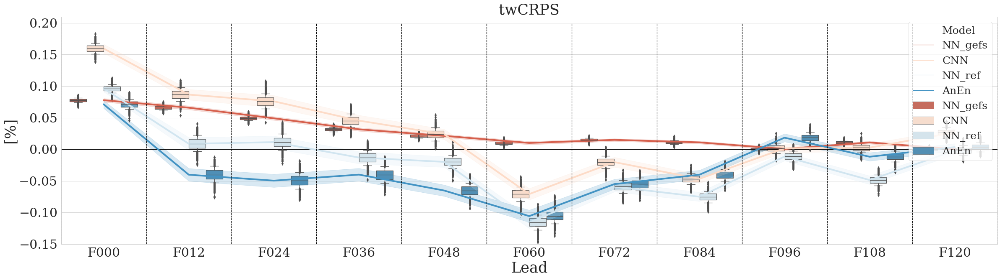

In [108]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette="RdBu",whis=[10, 90])
ax = sns.lineplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette="RdBu",ci='sd',linewidth=4,estimator=np.median,n_boot=30)
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('twCRPS',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.6,.2],'k--')

plt.ylim([-.15,.21])
plt.xlim([-0.5,10.5])
# plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()


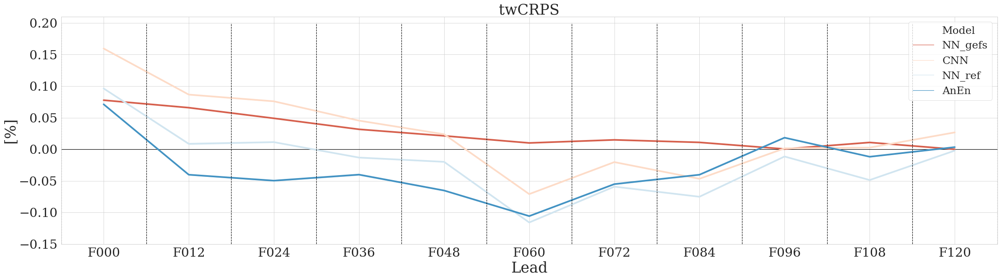

In [106]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.lineplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette="RdBu",ci=99,linewidth=4,estimator=np.median,n_boot=30)
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('twCRPS',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.6,.2],'k--')

plt.ylim([-.15,.21])
plt.xlim([-0.5,10.5])
# plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()

In [262]:
'/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png'

'/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile80.png'

## Forecast Sharpness

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 213.35963614327568 for a percentile: 80
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 216.99552094433113 for a percentile: 80
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 215.9250183991214 for a percentile: 80
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
this is the threshold: 210.7026485675 for a percentile: 80
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
this is the threshold: 204.43691943940664 for a percentile: 80
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
this is the threshold: 1

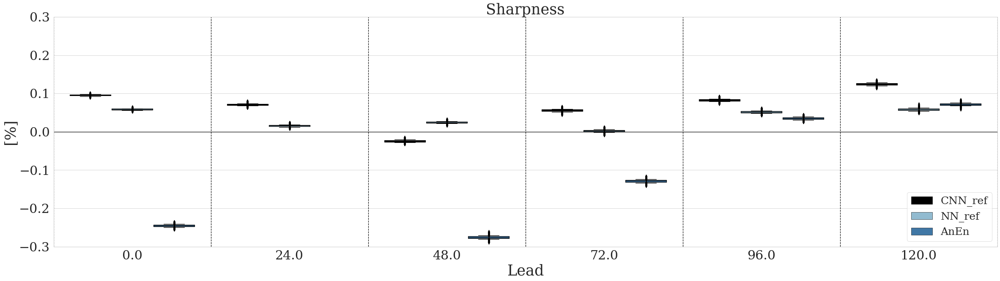

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 312.72756168347655 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 316.3833767986087 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 308.08799621790644 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
this is the threshold: 297.4143096923828 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
this is the threshold: 279.2968310137139 for a percentile: 90
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
this is the threshold:

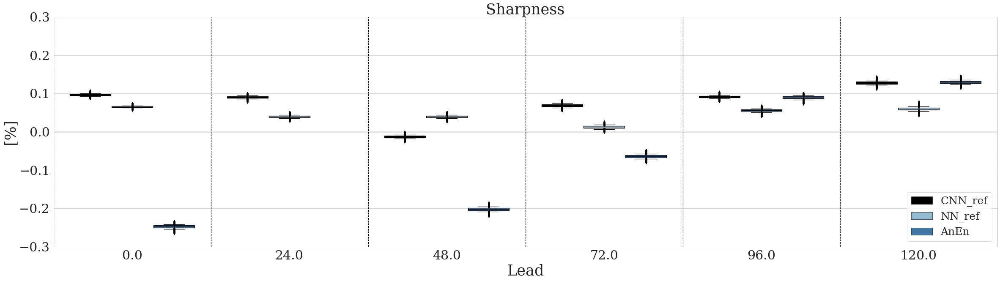

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 413.46209084647035 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 413.3456880937499 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 399.65317547554156 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
this is the threshold: 379.0347298775754 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
this is the threshold: 355.1902043274009 for a percentile: 95
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
this is the threshold:

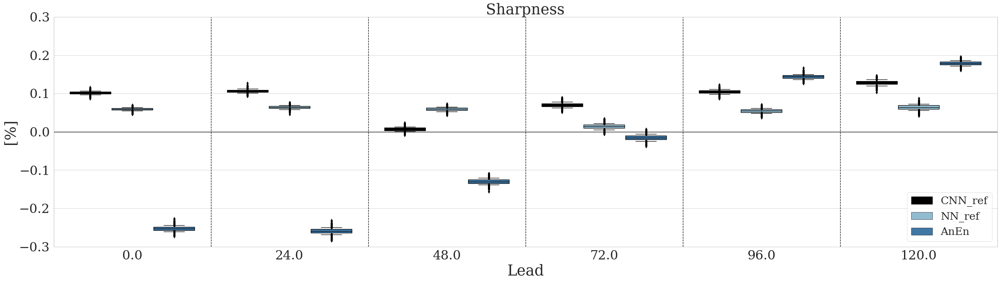

doing: F000
No Post-Processing
2016
2017
2018
this is the threshold: 544.1031887586407 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F024
No Post-Processing
2016
2017
2018
this is the threshold: 538.8337243652346 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F048
No Post-Processing
2016
2017
2018
this is the threshold: 520.460175137922 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F072
No Post-Processing
2016
2017
2018
this is the threshold: 484.4725626046318 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F096
No Post-Processing
2016
2017
2018
this is the threshold: 445.0403047691817 for a percentile: 98
No Post-Processing
2016
2017
2018
calc tw-crps
...boostrapping....
...done...
doing: F120
No Post-Processing
2016
2017
2018
this is the threshold: 40

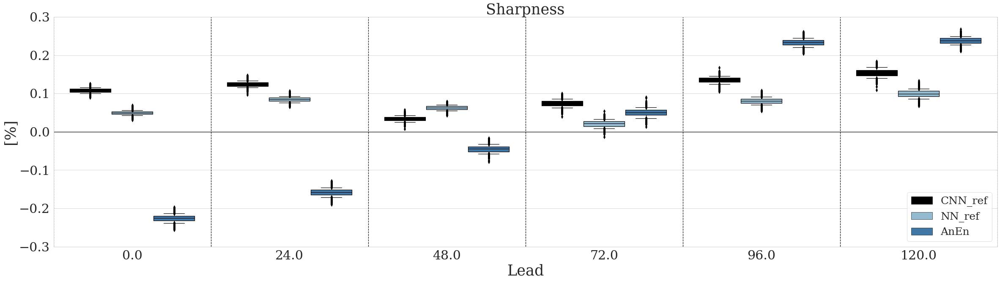

In [10]:

percys = [80,90,95,98]
for percy in percys:
    dffin=pd.DataFrame({'Lead':[],'Model':[],'CRPS':[]})
    fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,24)]
    bsnummy = 1000
    ense = 100

    for fcast in fcasts:
        print('doing:',fcast)
        fortts=np.array([])
        mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NN_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = np.percentile(fortts,percy)
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        mod = 'Raw_gefs'
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df1 = df1.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_gefs','IVTstd':'IVTstd_gefs'})
    
        mod = 'CNNft_ref'
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df2 = df2.rename(columns={'OBS':'OBScnn','Model':'Reforecast_cnn','IVTmean':'IVTmean_cnn','IVTstd':'IVTstd_cnn'})
        df2['lon']=df2['lon']+360
    
        mod = 'NNft_ref'
        df3,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df3 = df3.rename(columns={'OBS':'OBSnn','Model':'Reforecast_nn','IVTmean':'IVTmean_nn','IVTstd':'IVTstd_nn'})
        df3['lon']=df3['lon']+360
    
        mod = 'AnEn'
        df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
        df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
        df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
        df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
    
        mod = 'NN_gefs'
        df5,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df5 = df5.rename(columns={'OBS':'OBSnng','Model':'Reforecast','IVTmean':'IVTmean_nngefs','IVTstd':'IVTstd_nngefs'})
    
        mod = 'MV_gefs'
        df6,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df6 = df6.rename(columns={'OBS':'OBSmvg','Model':'Reforecast','IVTmean':'IVTmean_mvgefs','IVTstd':'IVTstd_mvgefs'})
    


        dfm = pd.merge(df1,df2,how='left')
        dfm = pd.merge(dfm,df3,how='left')
        dfm = pd.merge(dfm,df4,how='left')
        dfm = pd.merge(dfm,df5,how='left')
        dfm = pd.merge(dfm,df6,how='left')
    
        #drop the under a threshold value:
        dfm = dfm.drop(columns=dfm.filter(regex='Analog').columns)
        dfm = dfm[dfm['IVTmean_cnn'] > threshold]
        dfm = dfm[dfm['IVTmean_nn'] > threshold]
        dfm = dfm[dfm['AnEn_Mean'] > threshold]
        dfm = dfm[dfm['Modelmean'] > threshold]
        dfm = dfm[dfm['IVTmean_gefs'] > threshold]
        dfm = dfm[dfm['IVTmean_mvgefs'] > threshold]
    
        #define 4 groups:
        Merramvg = np.array(dfm['OBSnng'])
        For_umvg = np.array(dfm['IVTmean_mvgefs'])
        For_smvg = np.array(dfm['IVTstd_mvgefs'])
    
        Merranng = np.array(dfm['OBSnng'])
        For_unng = np.array(dfm['IVTmean_nngefs'])
        For_snng = np.array(dfm['IVTstd_nngefs'])
    
        Merrac = np.array(dfm['OBScnn'])
        For_uc = np.array(dfm['IVTmean_cnn'])
        For_sc = np.array(dfm['IVTstd_cnn'])
    
        Merran = np.array(dfm['OBSnn'])
        For_un = np.array(dfm['IVTmean_nn'])
        For_sn = np.array(dfm['IVTstd_nn'])
    
        Merraa = np.array(dfm['OBSanen'])
        For_ua = np.array(dfm['AnEn_Mean'])
        For_sa = np.array(dfm['AnEn_std'])
    
    
        #aadefine 4 groups:
        Ensemblmvg = np.zeros([Merramvg.shape[0],ense])
        Truthmvg = np.zeros([Merramvg.shape[0]])
        Ensemblc = np.zeros([Merramvg.shape[0],ense])
        Truthc = np.zeros([Merramvg.shape[0]])
        Ensembln = np.zeros([Merran.shape[0],ense])
        Truthn = np.zeros([Merran.shape[0]])    
        Ensembla = np.zeros([Merraa.shape[0],ense])
        Trutha = np.zeros([Merraa.shape[0]])
        Ensemblnng = np.zeros([Merramvg.shape[0],ense])
        Truthnng = np.zeros([Merramvg.shape[0]])
        
        
        for gre in range(Merramvg.shape[0]):
            Ensemblmvg[gre,:]=np.random.normal(For_umvg[gre],For_smvg[gre],100)
            Truthmvg[gre] = Merramvg[gre]
            Ensemblc[gre,:]=np.random.normal(For_uc[gre],For_sc[gre],100)
            Truthc[gre] = Merrac[gre]
            Ensembln[gre,:]=np.random.normal(For_un[gre],For_sn[gre],100)
            Truthn[gre] = Merran[gre]
            Ensembla[gre,:]=np.random.normal(For_ua[gre],For_sa[gre],100)
            Trutha[gre] = Merraa[gre]
            Ensemblnng[gre,:]=np.random.normal(For_unng[gre],For_snng[gre],100)
            Truthnng[gre] = Merranng[gre]
    
        Ensemblmvg[Ensemblmvg<0] = 0
        Ensemblc[Ensemblc<0] = 0
        Ensembln[Ensembln<0] = 0
        Ensembla[Ensembla<0] = 0
        Ensemblnng[Ensemblnng<0] = 0
    
        PIWtempmvg = np.zeros((Merramvg.shape[0]))
        PIWtempnng = np.zeros((Merranng.shape[0]))
        PIWtempc = np.zeros((Merrac.shape[0]))
        PIWtempn = np.zeros((Merran.shape[0]))
        PIWtempa = np.zeros((Merraa.shape[0]))
    
        print('calc tw-crps')
        for gre in range(0,Merrac.shape[0]):    
            PIWtempc[gre] = np.percentile(Ensemblc[gre,:],95) -  np.percentile(Ensemblc[gre,:],5)


        for gre in range(0,Merramvg.shape[0]):    
            PIWtempmvg[gre] = np.percentile(Ensemblmvg[gre,:],95) -  np.percentile(Ensemblmvg[gre,:],5)

     
        for gre in range(0,Merran.shape[0]):    
            PIWtempn[gre] = np.percentile(Ensembln[gre,:],95) -  np.percentile(Ensembln[gre,:],5)


        for gre in range(0,Merraa.shape[0]):    
            PIWtempa[gre] = np.percentile(Ensembla[gre,:],95) -  np.percentile(Ensembla[gre,:],5)
            
        for gre in range(0,Merraa.shape[0]):    
            PIWtempnng[gre] = np.percentile(Ensemblnng[gre,:],95) -  np.percentile(Ensemblnng[gre,:],5)
    
    
        print("...boostrapping....")
#     bootstrap randomdraws:
        PIWcnn_ref = np.zeros(bsnummy)
        PIWnn_ref = np.zeros(bsnummy)
        PIWanen_ref = np.zeros(bsnummy)
        PIWmv_gefs = np.zeros(bsnummy)
    
        for bb in range(bsnummy):
            inss = np.random.randint(dfm.shape[0], size=dfm.shape[0])
            PIWcnn_ref[bb] = 1 - (np.mean(PIWtempc[inss])/np.mean(PIWtempnng[inss]))
            PIWnn_ref[bb] = 1 - (np.mean(PIWtempn[inss])/np.mean(PIWtempnng[inss]))
            PIWanen_ref[bb] = 1 - (np.mean(PIWtempa[inss])/np.mean(PIWtempnng[inss]))
            PIWmv_gefs[bb] = 1 - (np.mean(PIWtempmvg[inss])/np.mean(PIWtempnng[inss]))
        
        #define 3 groups:  
#         dftemp = pd.DataFrame({'PIW':PIWmv_gefs})
#         dftemp['Lead'] = int(fcast[-3:])
#         dftemp['Model'] = 'MV_gefs'
#         dftemp['subject']=dftemp.index
#         dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'PIW':PIWcnn_ref})
        dftemp['Lead'] = int(fcast[-3:])
        dftemp['Model'] = 'CNN_ref'
        dftemp['subject']=dftemp.index

        dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'PIW':PIWnn_ref})
        dftemp['Lead'] = int(fcast[-3:])
        dftemp['Model'] = 'NN_ref'
        dftemp['subject']=dftemp.index

        dffin = pd.concat([dffin, dftemp], axis=0)
    
        dftemp = pd.DataFrame({'PIW':PIWanen_ref})
        dftemp['Lead'] = int(fcast[-3:])
        dftemp['Model'] = 'AnEn'
        dftemp['subject']=dftemp.index

        dffin = pd.concat([dffin, dftemp], axis=0)
        
        print('...done...')
        
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,23],[0,0],'k')

    ax = sns.boxplot(x="Lead", y="PIW", hue="Model",data=dffin, palette=SScolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    plt.xticks(fontsize=BPdict['tickFS'])
    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Lead',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='lower right')
    plt.title('Sharpness',fontsize=BPdict['titleFS'])

    for bb in np.arange(-0.5,22,1):
        plt.plot([bb,bb],[-.6,.35],'k--')

    plt.ylim([-.3,.3])
    plt.xlim([-0.5,5.5])
    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Sharpness_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
    plt.show()
    


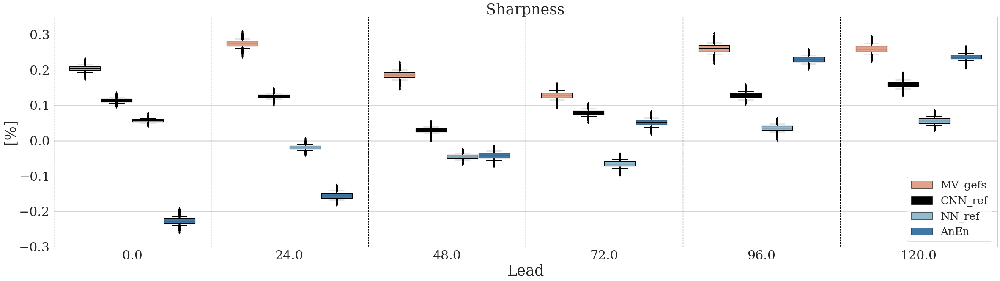

In [117]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,23],[0,0],'k')

ax = sns.boxplot(x="Lead", y="PIW", hue="Model",data=dffin, palette=SScolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='lower right')
plt.title('Sharpness',fontsize=BPdict['titleFS'])

for bb in np.arange(-0.5,22,1):
    plt.plot([bb,bb],[-.6,.35],'k--')

plt.ylim([-.3,.35])
plt.xlim([-0.5,5.5])
# plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Sharpness_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()


In [53]:
dffin

,Lead,Model,CRPS,PIW,index
0,0.0,MV_gefs,NaN,0.114535,0.0
1,0.0,MV_gefs,NaN,0.120374,1.0
2,0.0,MV_gefs,NaN,0.120328,2.0
3,0.0,MV_gefs,NaN,0.123233,3.0
4,0.0,MV_gefs,NaN,0.124084,4.0
...,...,...,...,...,...
995,120.0,AnEn,NaN,0.176824,995.0
996,120.0,AnEn,NaN,0.165065,996.0
997,120.0,AnEn,NaN,0.164466,997.0
998,120.0,AnEn,NaN,0.174610,998.0


In [57]:
dffin

,Lead,Model,CRPS,PIW,subject
0,0.0,MV_gefs,NaN,0.129031,0.0
1,0.0,MV_gefs,NaN,0.122889,1.0
2,0.0,MV_gefs,NaN,0.124795,2.0
3,0.0,MV_gefs,NaN,0.122835,3.0
4,0.0,MV_gefs,NaN,0.115876,4.0
...,...,...,...,...,...
995,120.0,AnEn,NaN,0.172021,995.0
996,120.0,AnEn,NaN,0.177844,996.0
997,120.0,AnEn,NaN,0.173217,997.0
998,120.0,AnEn,NaN,0.176033,998.0


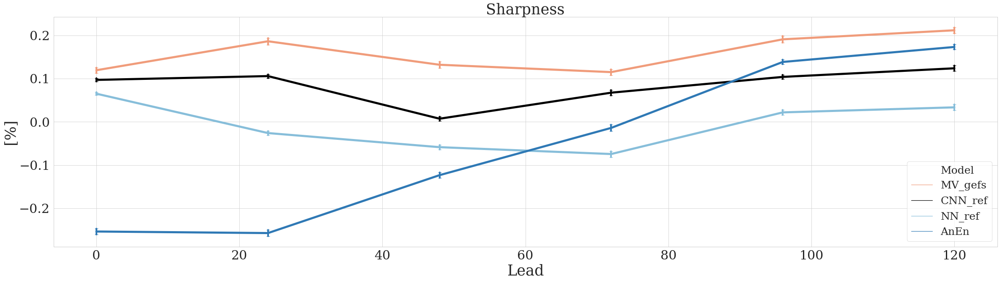

In [92]:
plt.figure(figsize=BPdict['FigSize'])
sns.lineplot(x="Lead", y="PIW", hue="Model",data=dffin, palette=SScolors,ci="sd",err_style='bars',linewidth=5,err_kws={'capsize':4,'linewidth':4})
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'])
plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='lower right')
plt.title('Sharpness',fontsize=BPdict['titleFS'])
plt.ylim([-.3,.25])
plt.xlim([-0.5,5.5])
plt.show()

In [5]:
mod = 'NN_gefs'
fcast='F048'
df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)


In [6]:
Post_m

array([123.36888123, 113.20611572,  74.45682526, ...,  31.76850891,
        26.09259605,  64.10646057])

In [28]:
numbins = 15
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,78,6)]


Post_m_c = np.array([])
Obs_c = np.array([])
Post_s_c = np.array([])

Post_m1_c = np.array([])
Obs1_c = np.array([])
Post_s1_c = np.array([])

Post_m2_c = np.array([])
Obs2_c = np.array([])
Post_s2_c = np.array([])

Post_m3_c = np.array([])
Obs3_c = np.array([])
Post_s3_c = np.array([])

Post_m4_c = np.array([])
Obs4_c = np.array([])
Post_s4_c = np.array([])

Post_m5_c = np.array([])
Obs5_c = np.array([])
Post_s5_c = np.array([])


for fcast in fcasts:
    print('doing:', fcast)
    ##
    mod = 'NN_gefs'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    
    Post_m_c = np.concatenate([Post_m_c,Post_m])
    Obs_c = np.concatenate([Obs_c,Obs])
    Post_s_c = np.concatenate([Post_s_c,Post_s])

    ##
    mod = 'CNNft_ref'
    df1,Pre_m1, Pre_s1, Post_m1, Post_s1, Obs1 = utils_verif.load_forecast(fcast,mod)
    
    Post_m1_c = np.concatenate([Post_m1_c,Post_m1])
    Obs1_c = np.concatenate([Obs1_c,Obs1])
    Post_s1_c = np.concatenate([Post_s1_c,Post_s1])

    ##
    mod = 'NNft_ref'
    df2,Pre_m2, Pre_s2, Post_m2, Post_s2, Obs2 = utils_verif.load_forecast(fcast,mod)
    
    Post_m2_c = np.concatenate([Post_m2_c,Post_m2])
    Obs2_c = np.concatenate([Obs2_c,Obs2])
    Post_s2_c = np.concatenate([Post_s2_c,Post_s2])

    ##
    mod = 'AnEn'
    df3,Pre_m3, Pre_s3, Post_m3, Post_s3, Obs3 = utils_verif.load_forecast(fcast,mod)
    
    Post_m3_c = np.concatenate([Post_m3_c,Post_m3])
    Obs3_c = np.concatenate([Obs3_c,Obs3])
    Post_s3_c = np.concatenate([Post_s3_c,Post_s3])

    ##
    mod = 'Raw_gefs'
    df4,Pre_m4, Pre_s4, Post_m4, Post_s4, Obs4 = utils_verif.load_forecast(fcast,mod)
    
    Post_m4_c = np.concatenate([Post_m4_c,Post_m4])
    Obs4_c = np.concatenate([Obs4_c,Obs4])
    Post_s4_c = np.concatenate([Post_s4_c,Post_s4])
    
    ##
    mod = 'MV_gefs'
    df5,Pre_m5, Pre_s5, Post_m5, Post_s5, Obs5 = utils_verif.load_forecast(fcast,mod)
    
    Post_m5_c = np.concatenate([Post_m5_c,Post_m5])
    Obs5_c = np.concatenate([Obs5_c,Obs5])
    Post_s5_c = np.concatenate([Post_s5_c,Post_s5])
    
    
    

    
    

print('doing spread/skill')
[avgvar_m,msebin_m,avgvar_s,msebin_s] = utils_verif.spreadskill(Post_m_c,Obs_c,Post_s_c,numbins)
print('1')
[avgvar_m1,msebin_m1,avgvar_s1,msebin_s1] = utils_verif.spreadskill(Post_m1_c,Obs1_c,Post_s1_c,numbins)
print('2')
[avgvar_m2,msebin_m2,avgvar_s2,msebin_s2] = utils_verif.spreadskill(Post_m2_c,Obs2_c,Post_s2_c,numbins)
print('3')
[avgvar_m3,msebin_m3,avgvar_s3,msebin_s3] = utils_verif.spreadskill(Post_m3_c,Obs3_c,Post_s3_c,numbins)
print('4')
[avgvar_m4,msebin_m4,avgvar_s4,msebin_s4] = utils_verif.spreadskill(Post_m4_c,Obs4_c,Post_s4_c,numbins)
print('5')
[avgvar_m5,msebin_m5,avgvar_s5,msebin_s5] = utils_verif.spreadskill(Post_m5_c,Obs5_c,Post_s5_c,numbins)
print('....done.....')


doing: F000
2016
2017
2018
No Post-Processing
doing: F006
2016
2017
2018
No Post-Processing
doing: F012
2016
2017
2018
No Post-Processing
doing: F018
2016
2017
2018
No Post-Processing
doing: F024
2016
2017
2018
No Post-Processing
doing: F030
2016
2017
2018
No Post-Processing
doing: F036
2016
2017
2018
No Post-Processing
doing: F042
2016
2017
2018
No Post-Processing
doing: F048
2016
2017
2018
No Post-Processing
doing: F054
2016
2017
2018
No Post-Processing
doing: F060
2016
2017
2018
No Post-Processing
doing: F066
2016
2017
2018
No Post-Processing
doing: F072
2016
2017
2018
No Post-Processing
doing spread/skill
1
2
3
4
5
....done.....


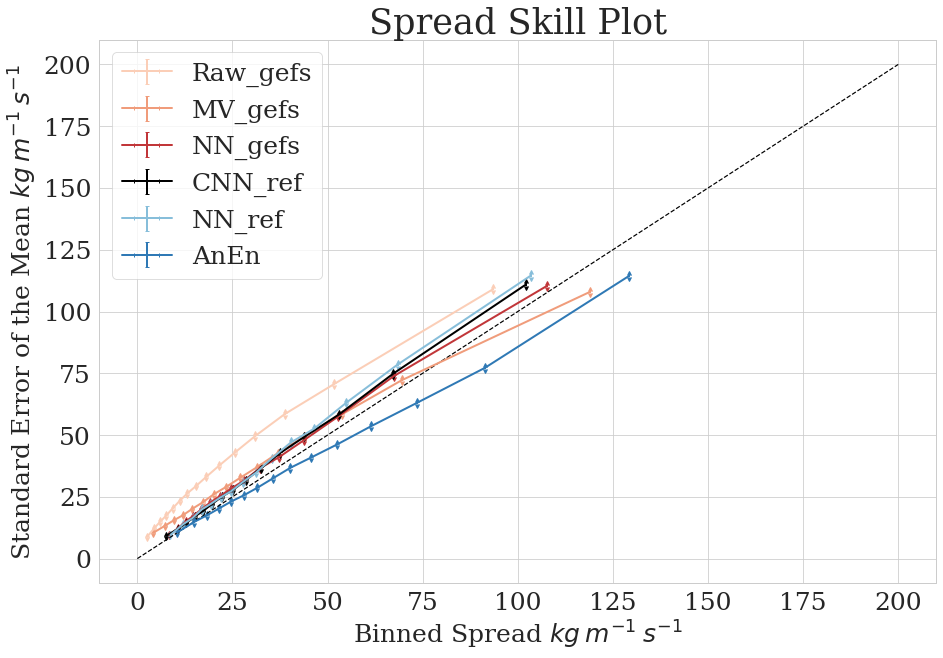

In [29]:
plt.figure(figsize=SSdict['FigSize'])  # inches
plt.errorbar(avgvar_m4, (msebin_m4), xerr=avgvar_s4, yerr=msebin_s4, uplims=True, lolims=True,color=SScolors['Raw_gefs'],linewidth=2,label='Raw_gefs')
plt.errorbar(avgvar_m5, (msebin_m5), xerr=avgvar_s5, yerr=msebin_s5, uplims=True, lolims=True,color=SScolors['MV_gefs'],linewidth=2,label='MV_gefs')
plt.errorbar(avgvar_m, (msebin_m), xerr=avgvar_s, yerr=msebin_s, uplims=True, lolims=True,color=SScolors['NN_gefs'],linewidth=2,label='NN_gefs')
plt.errorbar(avgvar_m1, (msebin_m1), xerr=avgvar_s1, yerr=msebin_s1, uplims=True, lolims=True,color=SScolors['CNN_ref'],linewidth=2,label='CNN_ref')
plt.errorbar(avgvar_m2, (msebin_m2), xerr=avgvar_s2, yerr=msebin_s2, uplims=True, lolims=True,color=SScolors['NN_ref'],linewidth=2,label='NN_ref')
plt.errorbar(avgvar_m3, (msebin_m3), xerr=avgvar_s3, yerr=msebin_s3, uplims=True, lolims=True,color=SScolors['AnEn'],linewidth=2,label='AnEn')



plt.legend(fontsize=SSdict['legendFS'])
plt.ylabel('Standard Error of the Mean $kg \:  m^{-1} \: s^{-1}$',fontsize=SSdict['labelFS'])
plt.xlabel('Binned Spread $kg \:  m^{-1} \: s^{-1}$',fontsize=SSdict['labelFS'])

plt.tick_params(axis='x', labelsize=SSdict['tickFS'])
plt.tick_params(axis='y', labelsize=SSdict['tickFS'])
plt.title('Spread Skill Plot',fontsize=SSdict['titleFS'])

plt.plot([0,200],[0,200],'k--')

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/SpreadSkill_0_72.png',dpi = 300,bbox_inches='tight')
plt.show()

## Spread Skill plots:

doing: F000
2016
2017
2018
No Post-Processing


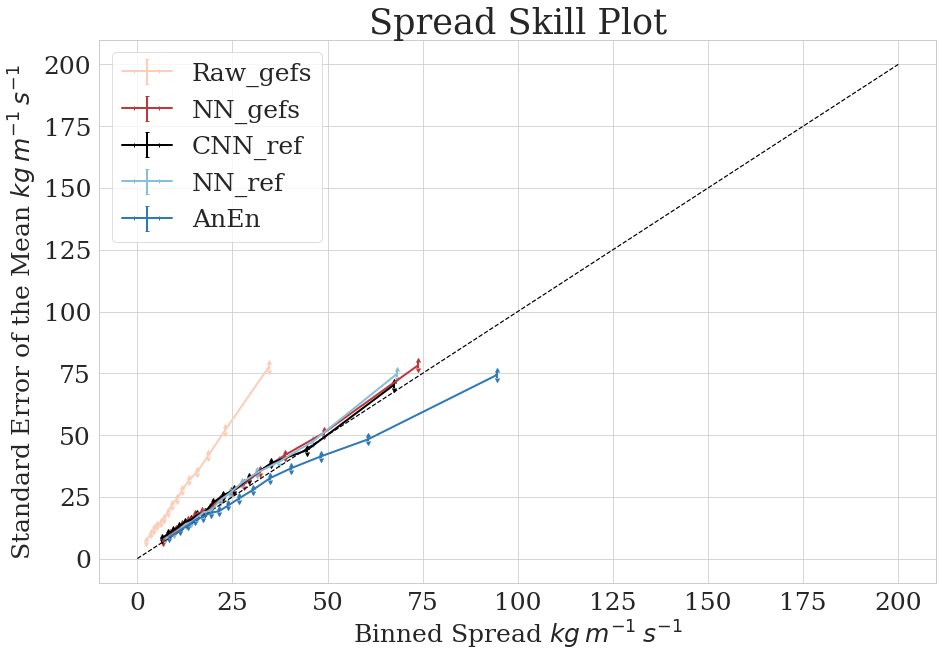

doing: F006
2016
2017
2018
No Post-Processing


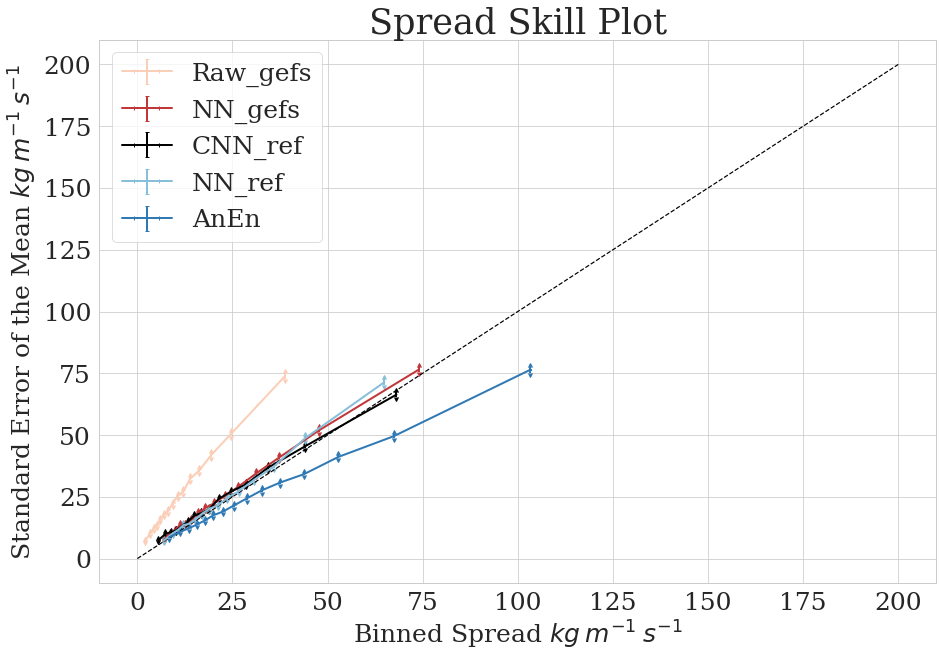

doing: F012
2016
2017
2018
No Post-Processing


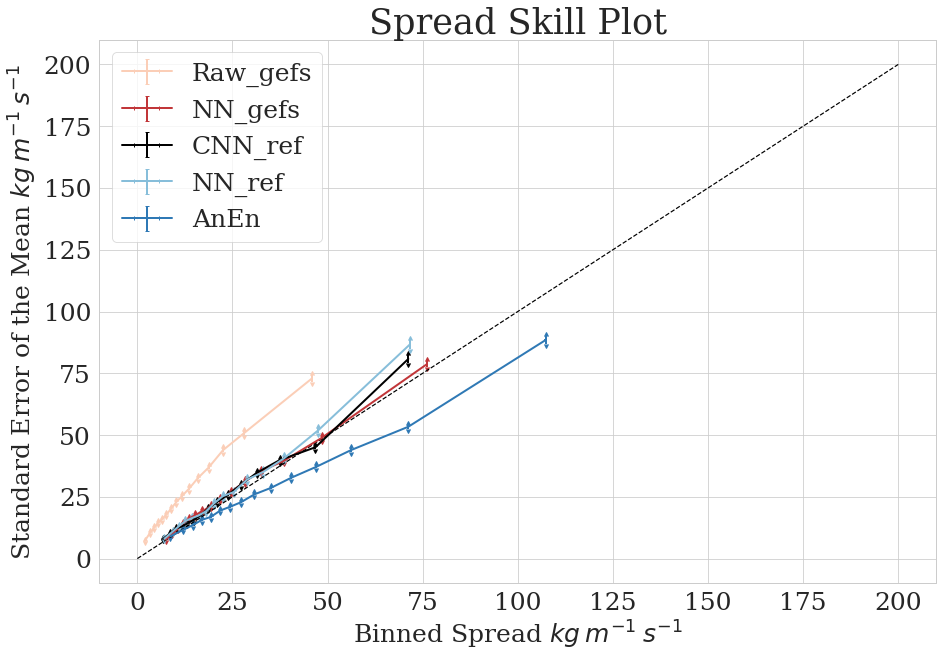

doing: F018
2016
2017
2018
No Post-Processing


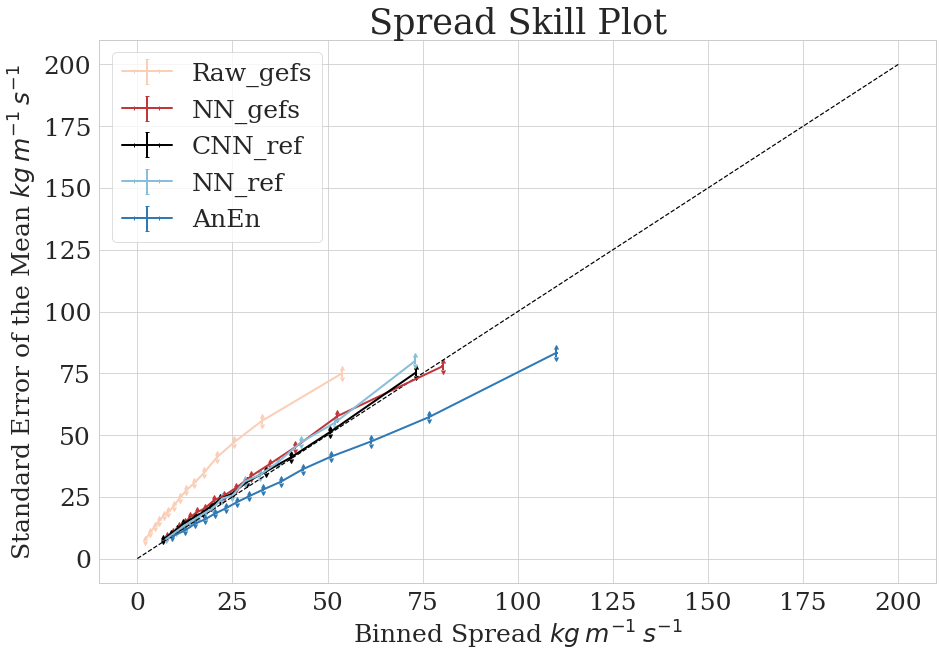

doing: F024
2016
2017
2018
No Post-Processing


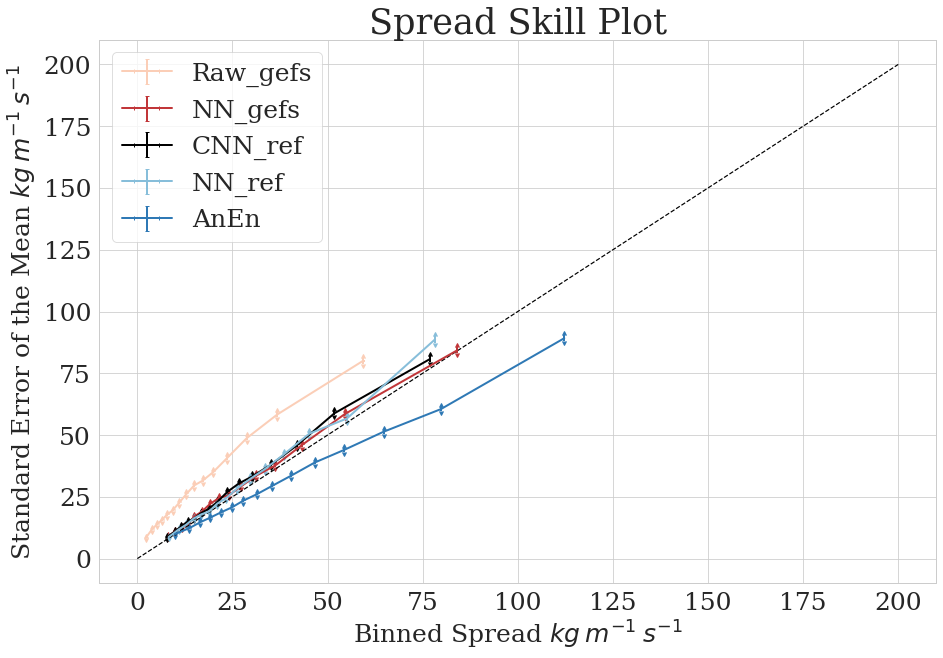

doing: F030
2016
2017
2018
No Post-Processing


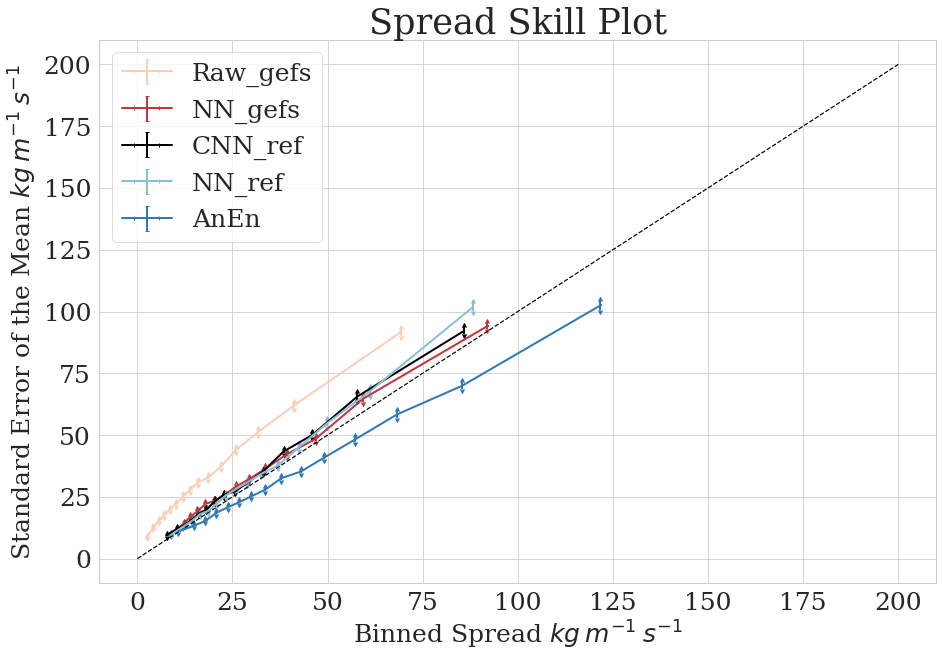

doing: F036
2016
2017
2018
No Post-Processing


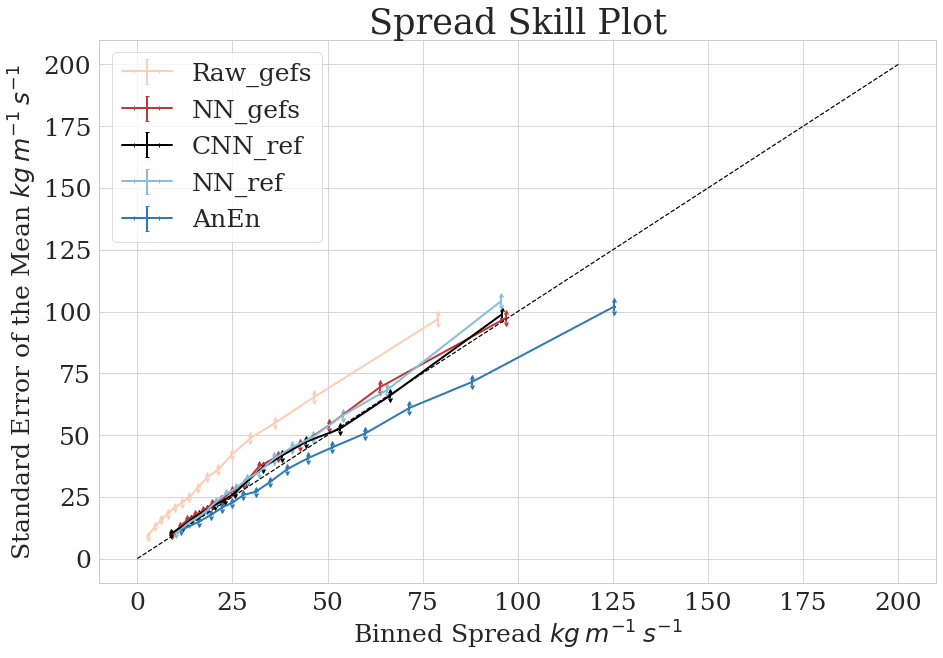

doing: F042
2016
2017
2018
No Post-Processing


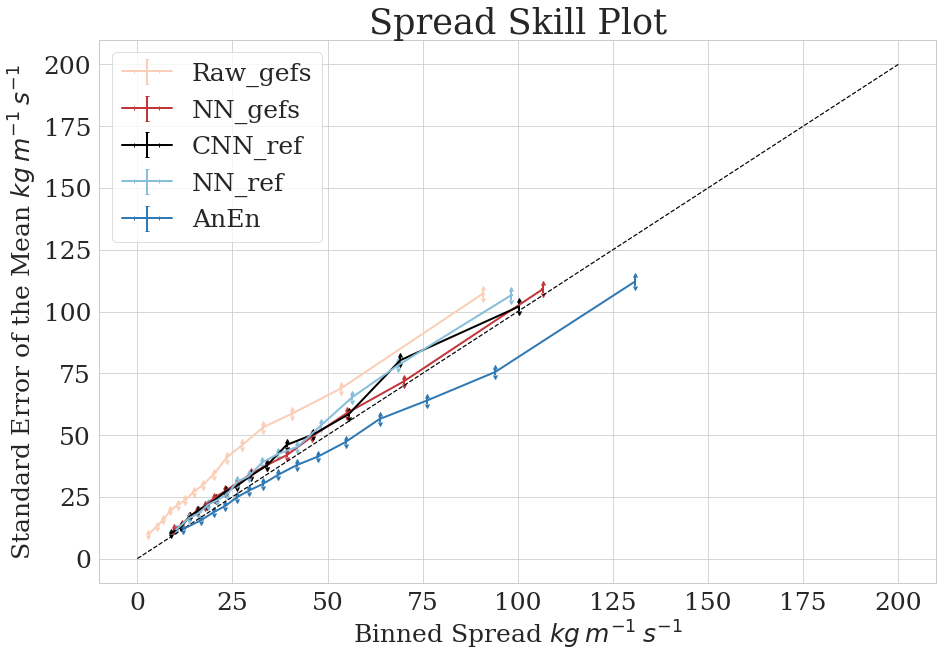

doing: F048
2016
2017
2018
No Post-Processing


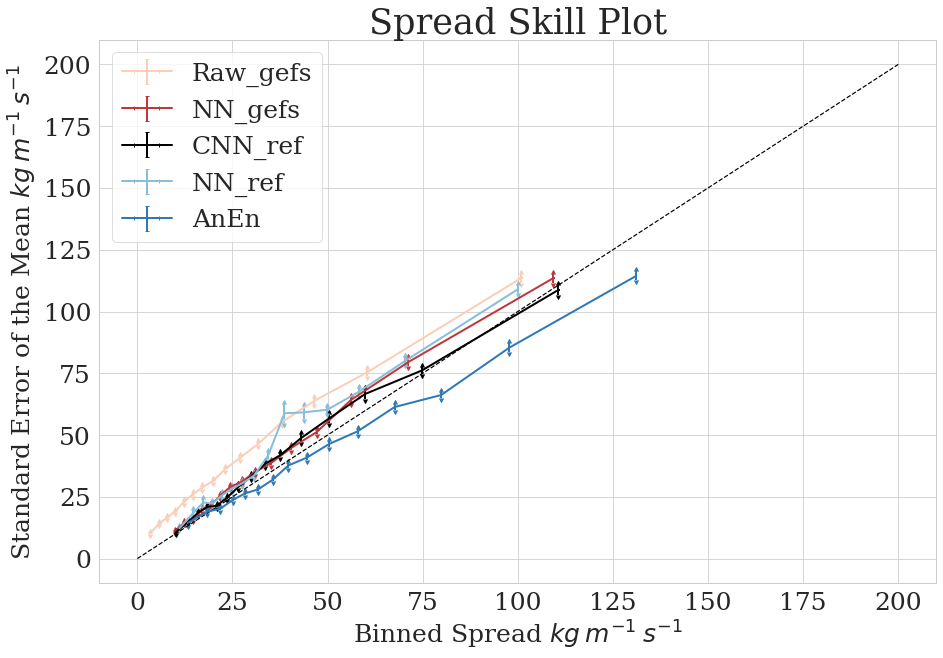

doing: F054
2016
2017
2018
No Post-Processing


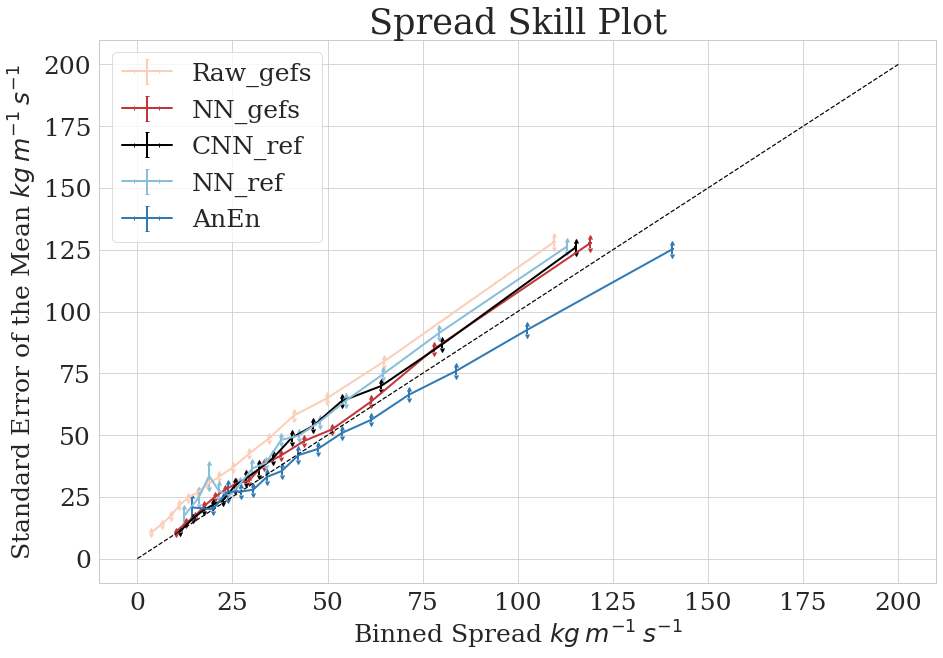

doing: F060
2016
2017
2018
No Post-Processing


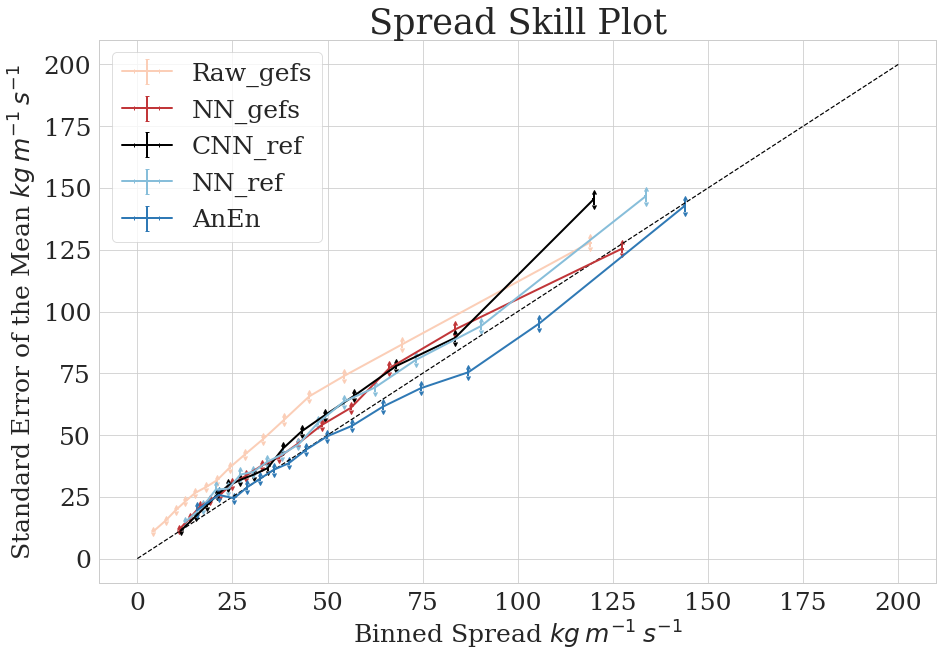

doing: F066
2016
2017
2018
No Post-Processing


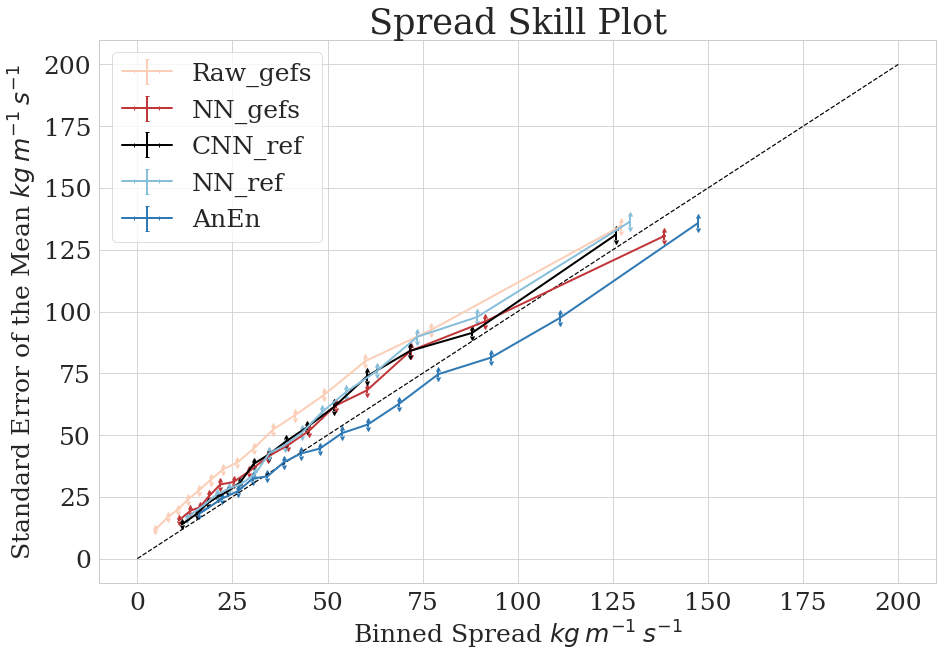

doing: F072
2016
2017
2018
No Post-Processing


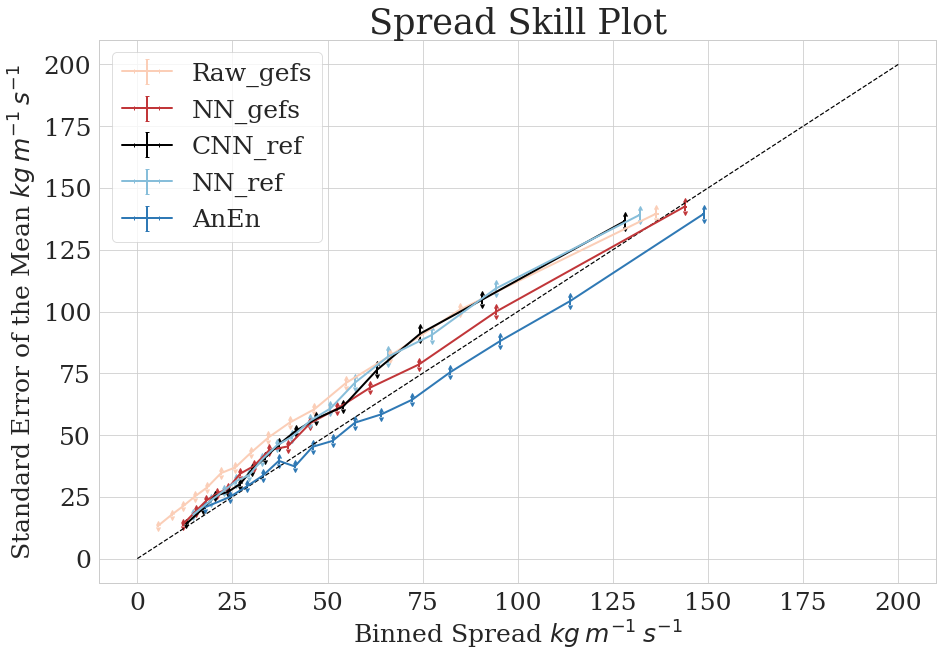

doing: F078
2016
2017
2018
No Post-Processing


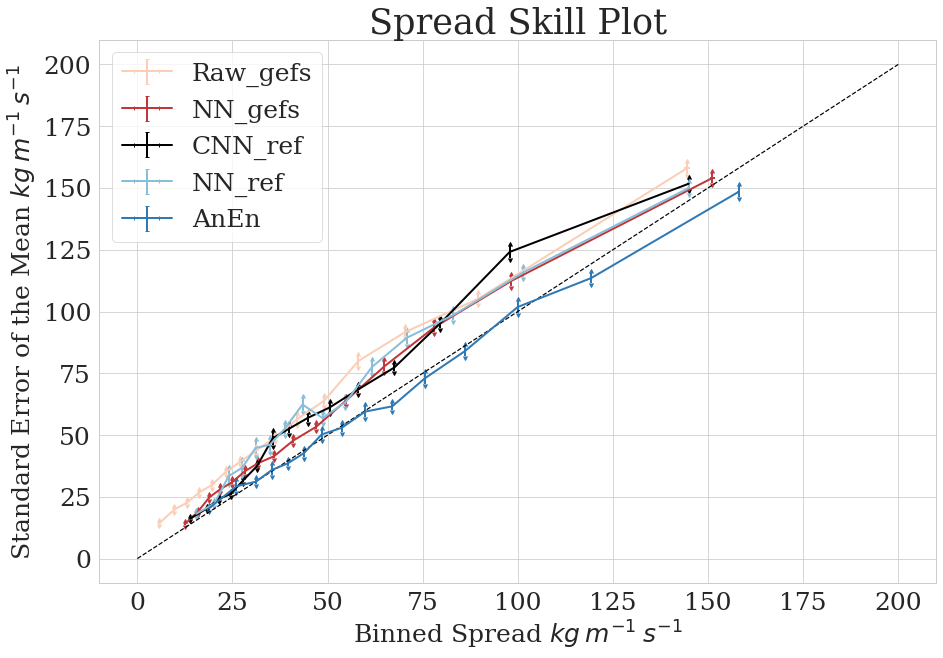

doing: F084
2016
2017
2018
No Post-Processing


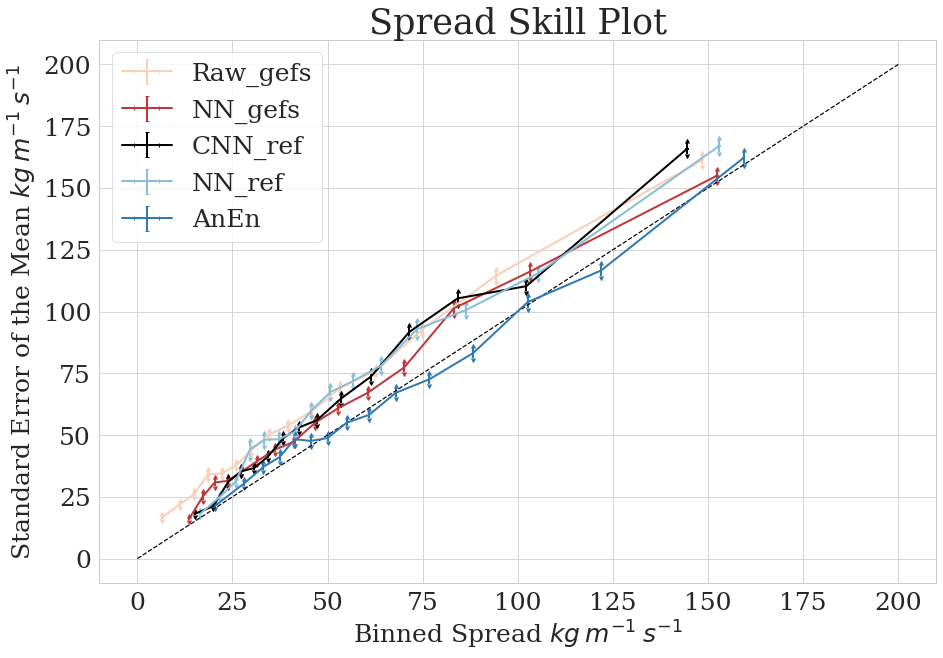

doing: F090
2016
2017
2018
No Post-Processing


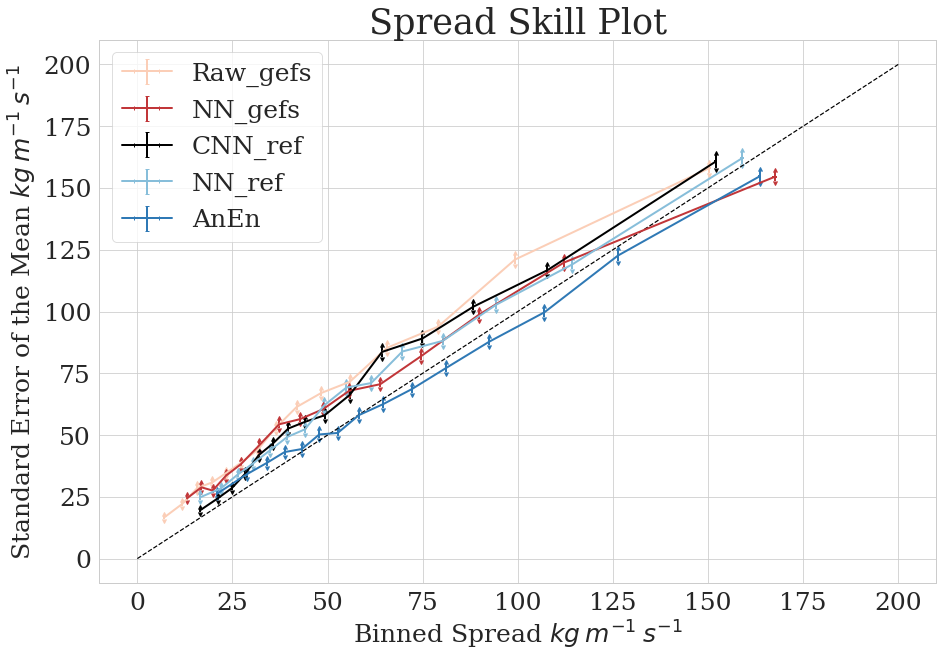

doing: F096
2016
2017
2018
No Post-Processing


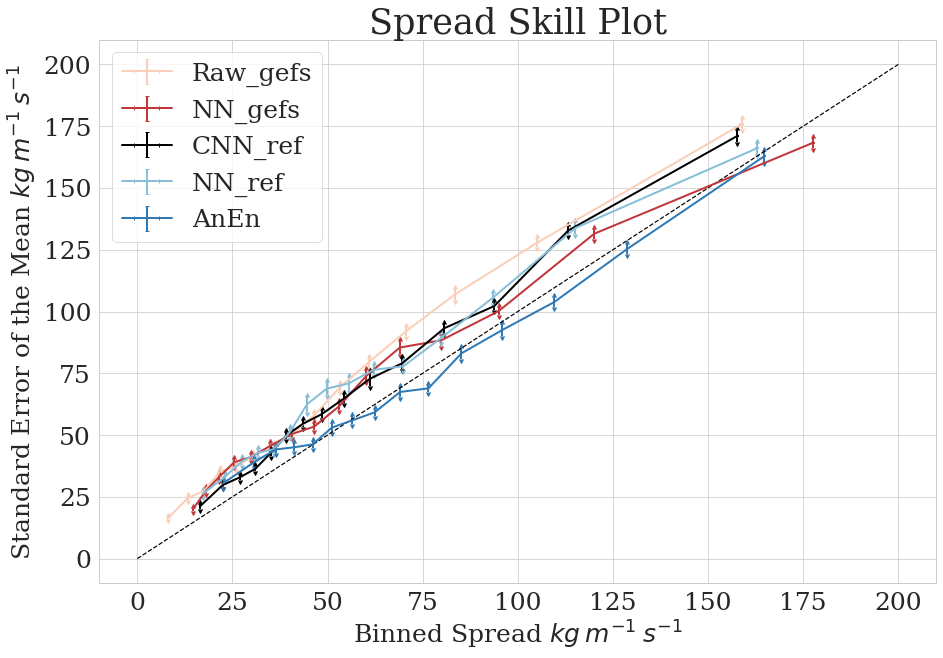

doing: F102
2016
2017
2018
No Post-Processing


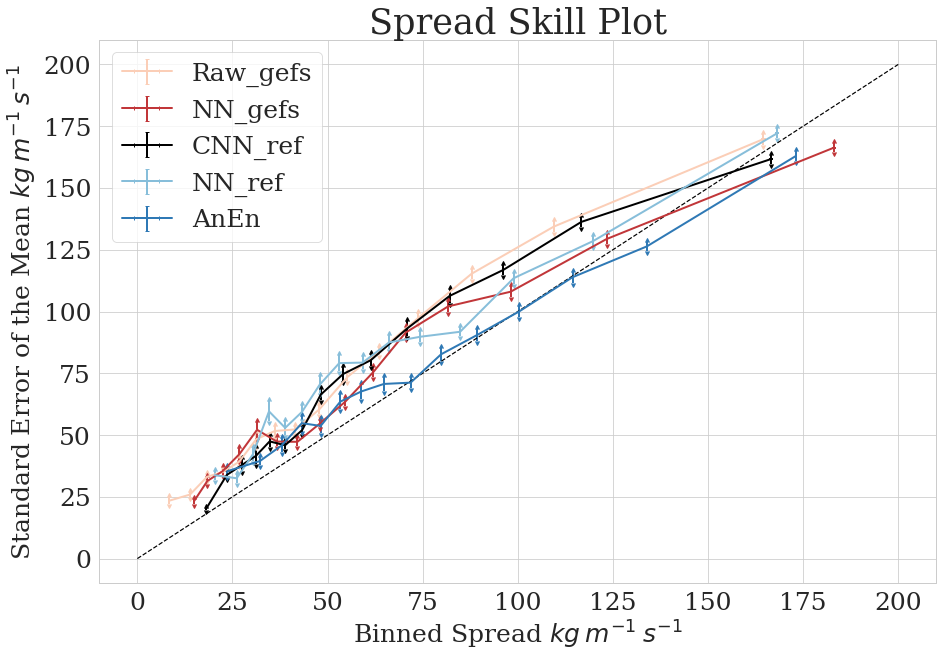

doing: F108
2016
2017
2018
No Post-Processing


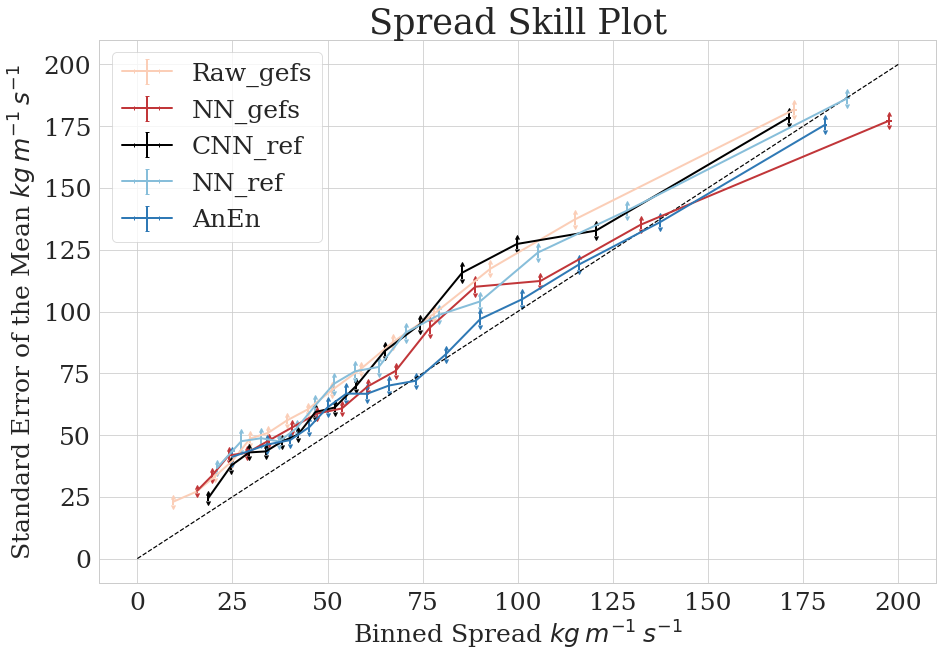

doing: F114
2016
2017
2018
No Post-Processing


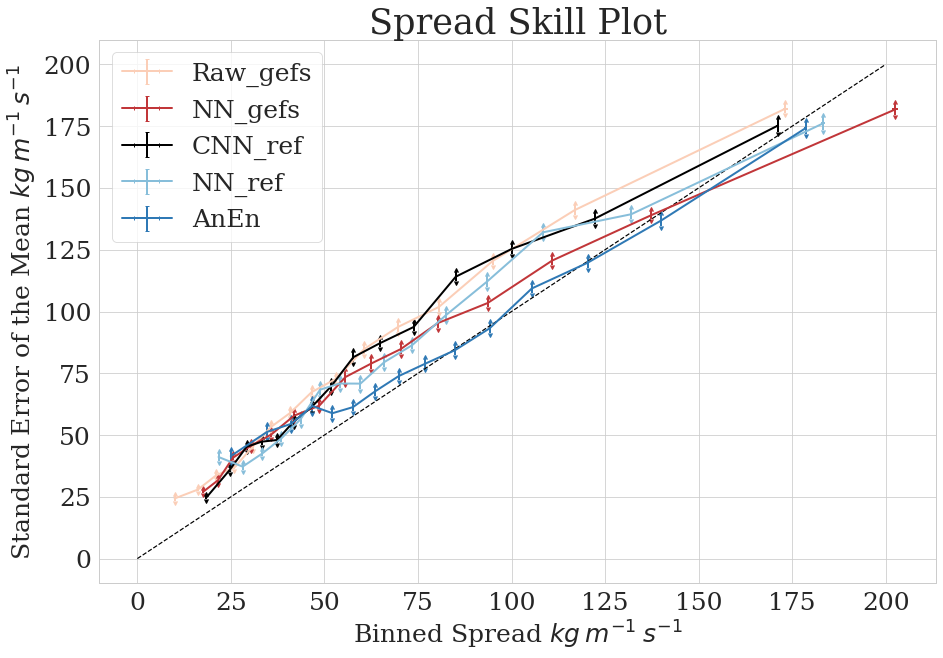

doing: F120
2016
2017
2018
No Post-Processing


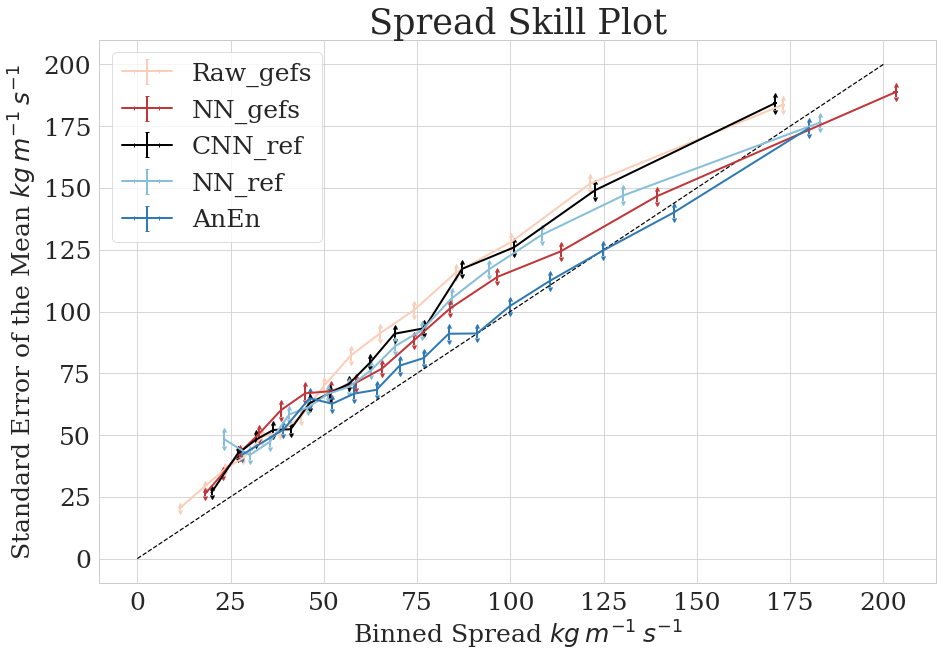

In [27]:
numbins = 15
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
for fcast in fcasts:
    print('doing:', fcast)
    ##
    mod = 'NN_gefs'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    [avgvar_m,msebin_m,avgvar_s,msebin_s] = utils_verif.spreadskill(Post_m,Obs,Post_s,numbins)

    ##
    mod = 'CNNft_ref'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    [avgvar_m2,msebin_m2,avgvar_s2,msebin_s2] = utils_verif.spreadskill(Post_m,Obs,Post_s,numbins)

    ##
    mod = 'NNft_ref'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    [avgvar_m3,msebin_m3,avgvar_s3,msebin_s3] = utils_verif.spreadskill(Post_m,Obs,Post_s,numbins)

    ##
    mod = 'AnEn'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    [avgvar_m4,msebin_m4,avgvar_s4,msebin_s4] = utils_verif.spreadskill(Post_m,Obs,Post_s,numbins)

    ##
    mod = 'Raw_gefs'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    [avgvar_m5,msebin_m5,avgvar_s5,msebin_s5] = utils_verif.spreadskill(Post_m,Obs,Post_s,numbins)




    plt.figure(figsize=SSdict['FigSize'])  # inches
    plt.errorbar(avgvar_m5, (msebin_m5), xerr=avgvar_s5, yerr=msebin_s5, uplims=True, lolims=True,color=SScolors['Raw_gefs'],linewidth=2,label='Raw_gefs')
    plt.errorbar(avgvar_m, (msebin_m), xerr=avgvar_s, yerr=msebin_s, uplims=True, lolims=True,color=SScolors['NN_gefs'],linewidth=2,label='NN_gefs')
    plt.errorbar(avgvar_m2, (msebin_m2), xerr=avgvar_s2, yerr=msebin_s2, uplims=True, lolims=True,color=SScolors['CNN_ref'],linewidth=2,label='CNN_ref')
    plt.errorbar(avgvar_m3, (msebin_m3), xerr=avgvar_s3, yerr=msebin_s3, uplims=True, lolims=True,color=SScolors['NN_ref'],linewidth=2,label='NN_ref')
    plt.errorbar(avgvar_m4, (msebin_m4), xerr=avgvar_s4, yerr=msebin_s4, uplims=True, lolims=True,color=SScolors['AnEn'],linewidth=2,label='AnEn')

    plt.legend(fontsize=SSdict['legendFS'])
    plt.ylabel('Standard Error of the Mean $kg \:  m^{-1} \: s^{-1}$',fontsize=SSdict['labelFS'])
    plt.xlabel('Binned Spread $kg \:  m^{-1} \: s^{-1}$',fontsize=SSdict['labelFS'])

    plt.tick_params(axis='x', labelsize=SSdict['tickFS'])
    plt.tick_params(axis='y', labelsize=SSdict['tickFS'])
    plt.title('Spread Skill Plot',fontsize=SSdict['titleFS'])

    plt.plot([0,200],[0,200],'k--')

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/SpreadSkill_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()
    

## Assesment of "perfect" calibrated stratification:

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


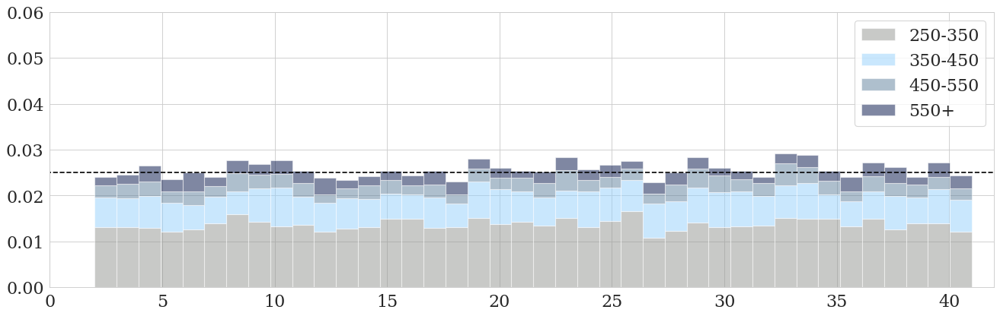

In [193]:
ense = 40
bins = ense
fcast='F048'
mod = 'CNNft_ref'
Thresher=0

df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
bounds = [[250,350],[350,450],[450,550],[550,100000]]


rr2 = []
for bb in bounds:
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0
    
    randgrab = np.random.randint(ense,size=sss_All.shape[0])
    Obs = np.array([sss_All[aa,randgrab[aa]] for aa in range(sss_All.shape[0])])
    Obs = Obs+np.random.rand(sss_All.shape[0])
    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    


print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250-350','350-450','450-550','550+'],color=sns.xkcd_palette(['grey','light blue','greyish blue','navy blue']))
plt.plot([-10,80],[0.025,0.025],'k--')
plt.legend(fontsize=20)
plt.ylim([0,0.06])
plt.xlim([0,bins+2])
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

# # plt.savefig('/glade/scratch/wchapman/Reforecast/models/RankHist_'+fcast+'_ThreshOBS250_ForecastHour.png',dpi = 300,bbox_inches='tight')
plt.show()

# Stratified Rank Histograms

In [202]:
ense = 40
bins = ense+1
fcast='F072'
mod = 'CNNft_ref'

df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

if mod == 'AnEn':
    sss_All=np.array(df.filter(regex='Analog'))
    s_All = Post_s
    m_All = Post_m
    ense = 40
    bins = ense+1
    
else:
    sss_All = np.zeros([len(Post_m),ense])
    s_All = np.zeros(len(Post_m))
    m_All = np.zeros(len(Post_m))

    for ii in range(len(Post_m)):
        sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
        s_All[ii]=Post_s[ii]
        m_All[ii]=Post_m[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0

In [37]:
bounds = [[250,350],[350,450],[450,10000]]

In [236]:
mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NN_ref']
utils_verif.load_forecast(fcast,mod)
pcrt = [np.array([80,90]),np.array([90,95]),np.array([95,100])]

fortts=np.array([])
for mod in mods:
    df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
    fortts=np.concatenate([fortts,np.array(Post_m)])
    bounds =[]
    for bb in pcrt:
        bounds.append([np.percentile(fortts,bb[0]),np.percentile(fortts,bb[1])])
    


No Post-Processing
2016
2017
2018


In [12]:
fcasts[0]

'F000'

doing: F000
2016
2017
2018
No Post-Processing
doing: F006
2016
2017
2018
No Post-Processing
doing: F012
2016
2017
2018
No Post-Processing
doing: F018
2016
2017
2018
No Post-Processing
doing: F024
2016
2017
2018
No Post-Processing
doing: F030
2016
2017
2018
No Post-Processing
doing: F036
2016
2017
2018
No Post-Processing
doing: F042
2016
2017
2018
No Post-Processing
doing: F048
2016
2017
2018
No Post-Processing
doing: F054
2016
2017
2018
No Post-Processing
doing: F060
2016
2017
2018
No Post-Processing
doing: F066
2016
2017
2018
No Post-Processing
doing: F072
2016
2017
2018
No Post-Processing
...making bounds...
these are bounds: [[213.8801500592913, 306.90237413931465], [306.90237413931465, 401.7942657633811], [401.7942657633811, 1237.07527]]
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
CNN ref:


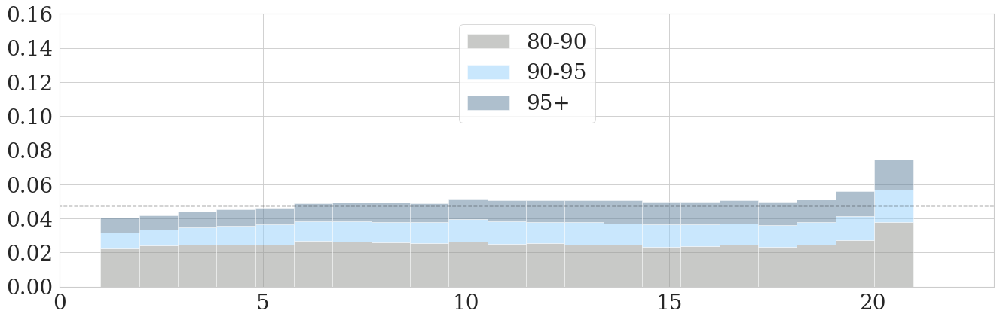

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
NN Gefs:


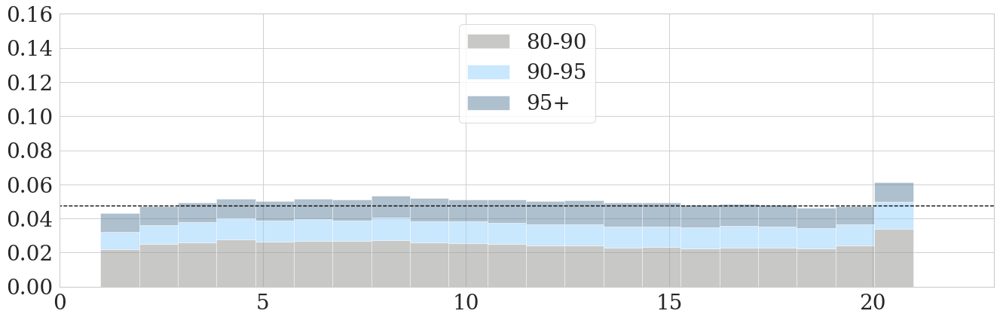

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
Raw Gefs:


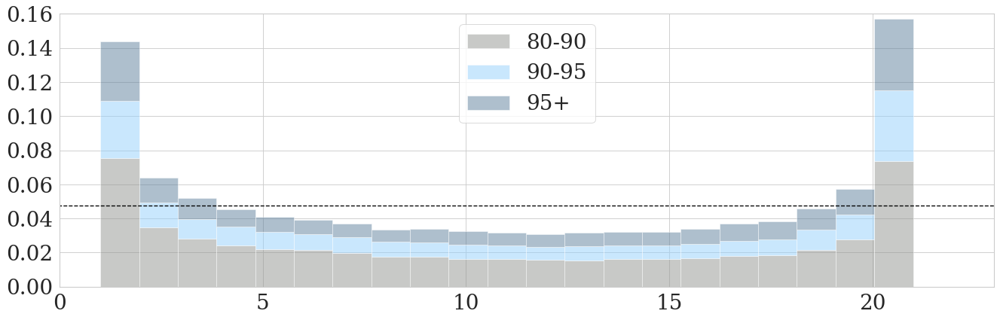

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
AnEn:


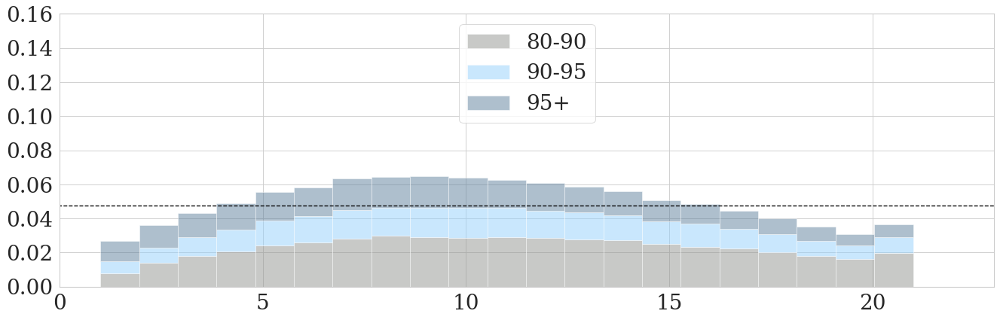

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
NNref:


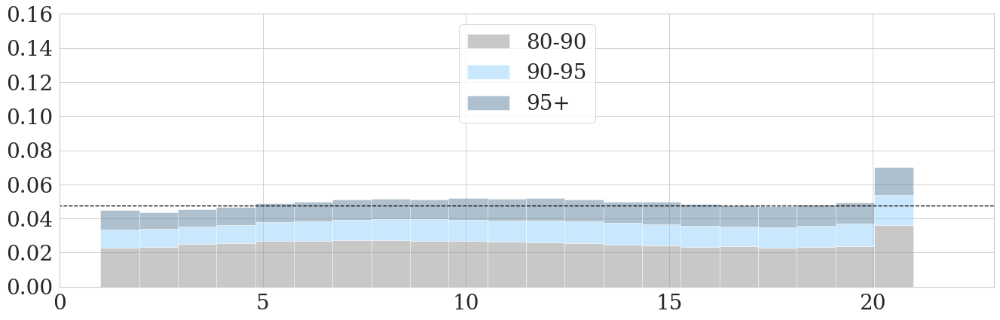

computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER
MVref:


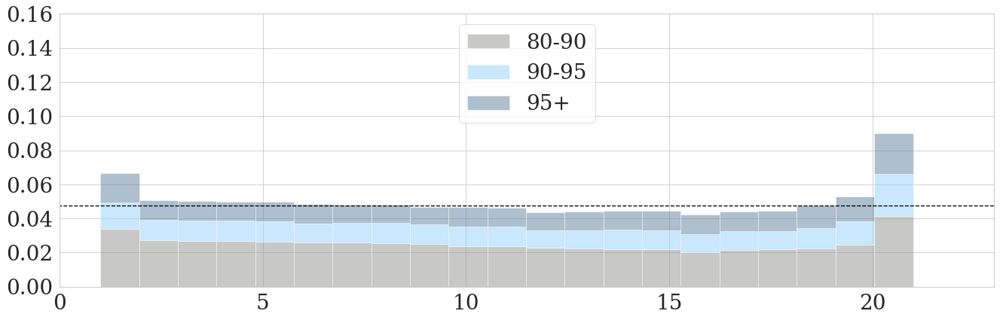

saved here: Coastal_Points_LogNormal/*_F000_F072.png


In [5]:
numbins = 15
ense = 20
bins = ense+1
topy=0.16

fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,78,6)]

Post_m_c = np.array([])
Obs_c = np.array([])
Post_s_c = np.array([])

Post_m1_c = np.array([])
Obs1_c = np.array([])
Post_s1_c = np.array([])

Post_m2_c = np.array([])
Obs2_c = np.array([])
Post_s2_c = np.array([])

Post_m3_c = np.array([])
Obs3_c = np.array([])
Post_s3_c = np.array([])

Post_m4_c = np.array([])
Obs4_c = np.array([])
Post_s4_c = np.array([])

Post_m5_c = np.array([])
Obs5_c = np.array([])
Post_s5_c = np.array([])



for fcast in fcasts:
    print('doing:', fcast)
    ##
    mod = 'NN_gefs'
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
    
    Post_m_c = np.concatenate([Post_m_c,Post_m])
    Obs_c = np.concatenate([Obs_c,Obs])
    Post_s_c = np.concatenate([Post_s_c,Post_s])

    ##
    mod = 'CNNft_ref'
    df1,Pre_m1, Pre_s1, Post_m1, Post_s1, Obs1 = utils_verif.load_forecast(fcast,mod)
    
    Post_m1_c = np.concatenate([Post_m1_c,Post_m1])
    Obs1_c = np.concatenate([Obs1_c,Obs1])
    Post_s1_c = np.concatenate([Post_s1_c,Post_s1])

    ##
    mod = 'NNft_ref'
    df2,Pre_m2, Pre_s2, Post_m2, Post_s2, Obs2 = utils_verif.load_forecast(fcast,mod)
    
    Post_m2_c = np.concatenate([Post_m2_c,Post_m2])
    Obs2_c = np.concatenate([Obs2_c,Obs2])
    Post_s2_c = np.concatenate([Post_s2_c,Post_s2])

    ##
    mod = 'AnEn'
    df3,Pre_m3, Pre_s3, Post_m3, Post_s3, Obs3 = utils_verif.load_forecast(fcast,mod)
    
    Post_m3_c = np.concatenate([Post_m3_c,Post_m3])
    Obs3_c = np.concatenate([Obs3_c,Obs3])
    Post_s3_c = np.concatenate([Post_s3_c,Post_s3])

    ##
    mod = 'Raw_gefs'
    df4,Pre_m4, Pre_s4, Post_m4, Post_s4, Obs4 = utils_verif.load_forecast(fcast,mod)
    
    Post_m4_c = np.concatenate([Post_m4_c,Post_m4])
    Obs4_c = np.concatenate([Obs4_c,Obs4])
    Post_s4_c = np.concatenate([Post_s4_c,Post_s4])
    
    ##
    mod = 'MV_gefs'
    df5,Pre_m5, Pre_s5, Post_m5, Post_s5, Obs5 = utils_verif.load_forecast(fcast,mod)
    
    Post_m5_c = np.concatenate([Post_m5_c,Post_m5])
    Obs5_c = np.concatenate([Obs5_c,Obs5])
    Post_s5_c = np.concatenate([Post_s5_c,Post_s5])
    
    
##############
 # calcbounds:

mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref','NN_gefs']
utils_verif.load_forecast(fcast,mod)
pcrt = [np.array([80,90]),np.array([90,95]),np.array([95,100])]

fortts=np.concatenate([Post_m_c,Post_m1_c,Post_m2_c,Post_m3_c,Post_m4_c,Post_m5_c])
bounds =[]
print('...making bounds...')
for bb in pcrt:
    bounds.append([np.percentile(fortts,bb[0]),np.percentile(fortts,bb[1])])
##############
print("these are bounds:",bounds)

##############################################################################################################################
## RH CNNft: 
##############################################################################################################################

rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m1_c),ense])
    s_All = np.zeros(len(Post_m1_c))
    m_All = np.zeros(len(Post_m1_c))

    for ii in range(len(Post_m1_c)):
        sss = np.random.normal(Post_m1_c[ii],Post_s1_c[ii],ense)
        s_All[ii]=Post_s1_c[ii]
        m_All[ii]=Post_m1_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs1_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('CNN ref:')
plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_CNNft_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()

##############################################################################################################################
## RH NN gefs: 
##############################################################################################################################


rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m_c),ense])
    s_All = np.zeros(len(Post_m_c))
    m_All = np.zeros(len(Post_m_c))

    for ii in range(len(Post_m_c)):
        sss = np.random.normal(Post_m_c[ii],Post_s_c[ii],ense)
        s_All[ii]=Post_s_c[ii]
        m_All[ii]=Post_m_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('NN Gefs:')
plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_NNgefs_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()



##############################################################################################################################
## Raw Gefs: 
##############################################################################################################################


rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m4_c),ense])
    s_All = np.zeros(len(Post_m4_c))
    m_All = np.zeros(len(Post_m4_c))

    for ii in range(len(Post_m4_c)):
        sss = np.random.normal(Post_m4_c[ii],Post_s4_c[ii],ense)
        s_All[ii]=Post_s4_c[ii]
        m_All[ii]=Post_m4_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs4_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('Raw Gefs:')

plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_RAWgefs_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()


##############################################################################################################################
## AnEn: 
##############################################################################################################################


rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m3_c),ense])
    s_All = np.zeros(len(Post_m3_c))
    m_All = np.zeros(len(Post_m3_c))

    for ii in range(len(Post_m3_c)):
        sss = np.random.normal(Post_m3_c[ii],Post_s3_c[ii],ense)
        s_All[ii]=Post_s3_c[ii]
        m_All[ii]=Post_m3_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs3_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('AnEn:')
plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_AnEn_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()


#############################################################################################################################
# NNft ref: 
#############################################################################################################################


rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m2_c),ense])
    s_All = np.zeros(len(Post_m2_c))
    m_All = np.zeros(len(Post_m2_c))

    for ii in range(len(Post_m2_c)):
        sss = np.random.normal(Post_m2_c[ii],Post_s2_c[ii],ense)
        s_All[ii]=Post_s2_c[ii]
        m_All[ii]=Post_m2_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs2_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('NNref:')

plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_NNref_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()


#############################################################################################################################
# MV Gefs: 
#############################################################################################################################


rr2 = []
for bb in bounds:
    sss_All = np.zeros([len(Post_m5_c),ense])
    s_All = np.zeros(len(Post_m5_c))
    m_All = np.zeros(len(Post_m5_c))

    for ii in range(len(Post_m5_c)):
        sss = np.random.normal(Post_m5_c[ii],Post_s5_c[ii],ense)
        s_All[ii]=Post_s5_c[ii]
        m_All[ii]=Post_m5_c[ii]
        sss_All[ii,:] =(sss) 
    
    sss_All[sss_All<0]=0
    rr2.append(utils_verif.ranker(Obs5_c[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
print('MVref:')

plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_MVgefs_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()


print('saved here:', 'Coastal_Points_LogNormal/*_'+fcasts[0]+'_'+fcasts[-1]+'.png')


In [237]:
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
for fcast in fcasts:

    ##############

    ##############
    # calcbounds:

    mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref','NN_gefs']
    utils_verif.load_forecast(fcast,mod)
    pcrt = [np.array([80,90]),np.array([90,95]),np.array([95,100])]

    fortts=np.array([])
    for mod in mods:
        df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
        fortts=np.concatenate([fortts,np.array(Post_m)])
        bounds =[]
        for bb in pcrt:
            bounds.append([np.percentile(fortts,bb[0]),np.percentile(fortts,bb[1])])
    ##############
    print("these are bounds:",bounds)

    
    mod = 'CNNft_ref'
    print(fcast,mod)
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)



    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))

[[210.7026485675, 297.4143096923828],
 [297.4143096923828, 379.0347298775754],
 [379.0347298775754, 1022.5004823500001]]

In [20]:
1/41

0.024390243902439025

No Post-Processing
2016
2017
2018
these are bounds: [[215.520309593564, 315.38852221948446], [315.38852221948446, 416.7525810914548], [416.7525810914548, 1156.8962983630952]]
F000 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


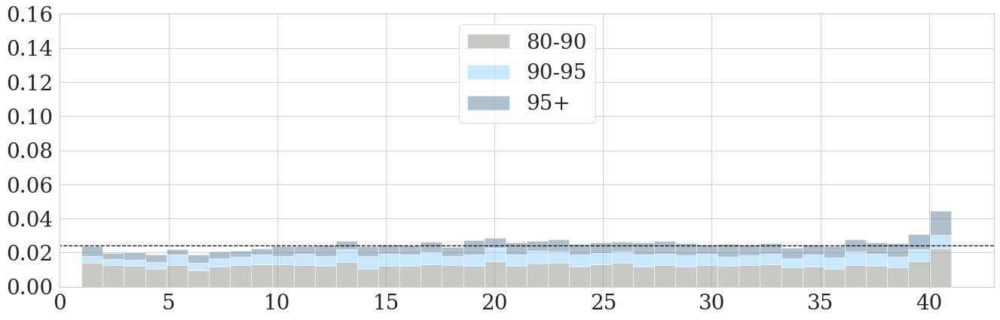

F000 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


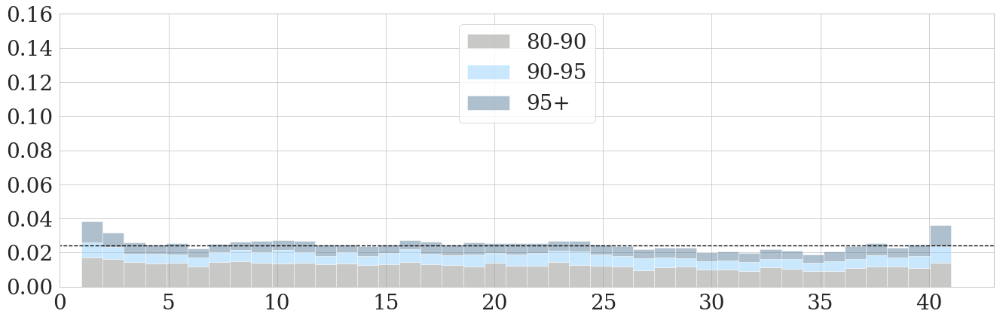

F000 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


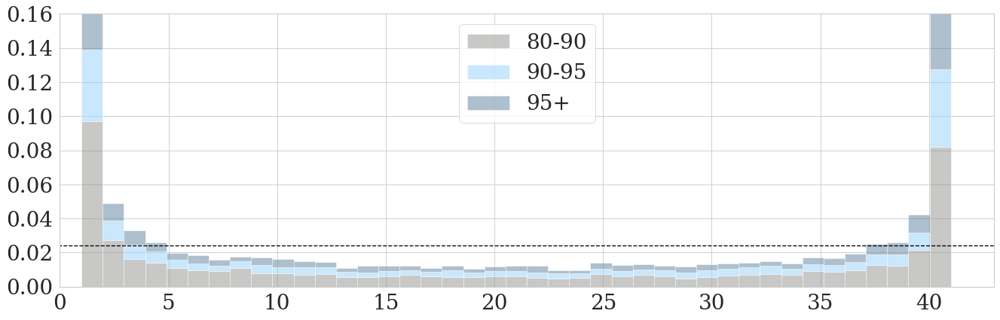

F000 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


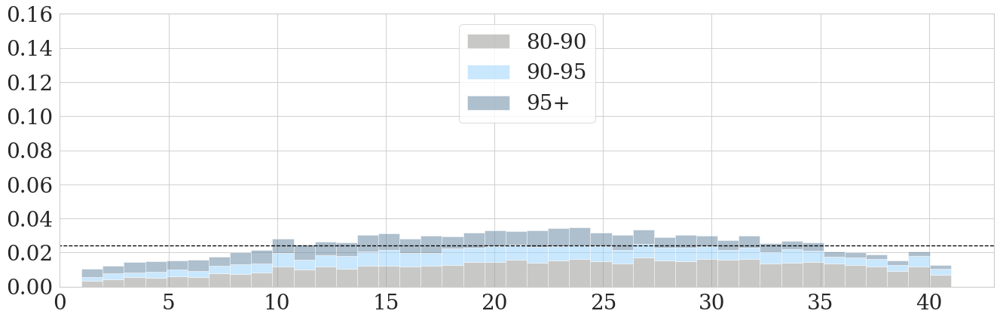

F000 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


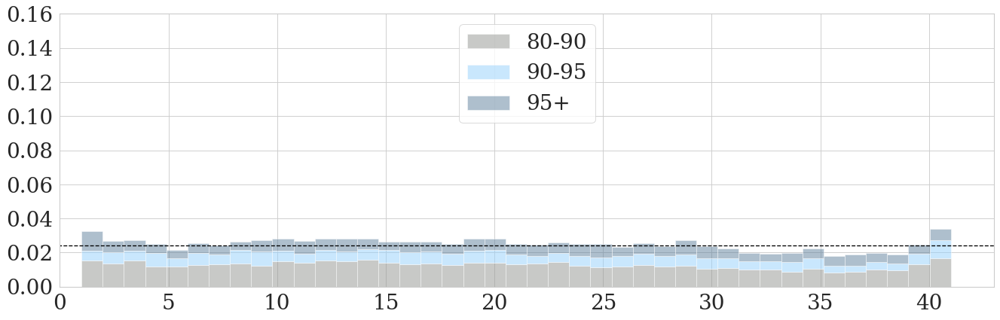

F000 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


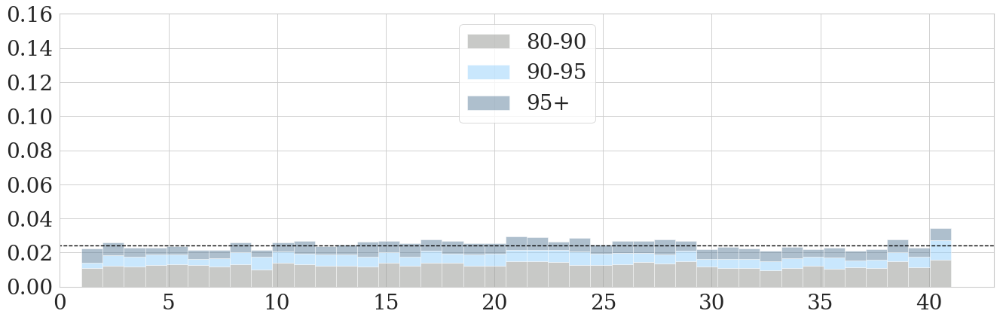

No Post-Processing
2016
2017
2018
these are bounds: [[213.6061218261719, 311.74754028320325], [311.74754028320325, 417.89214412144247], [417.89214412144247, 1176.050657425]]
F006 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


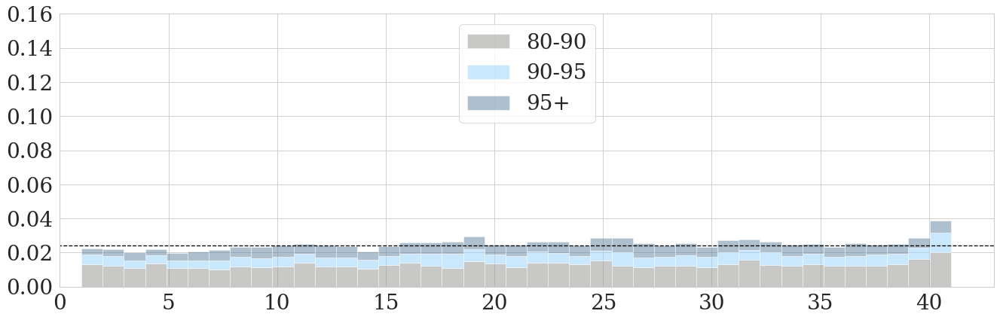

F006 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


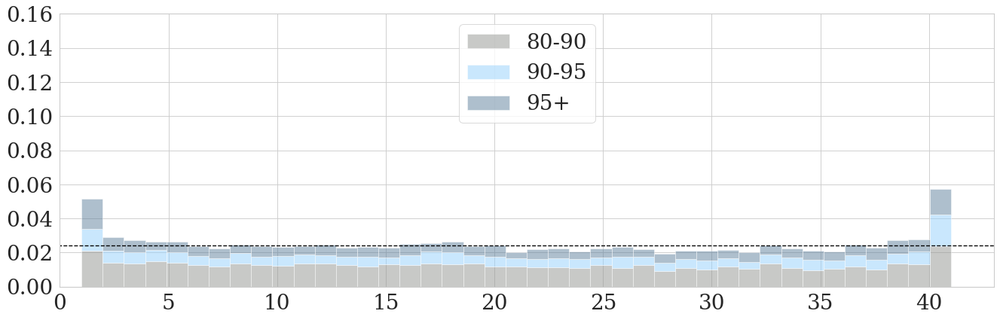

F006 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


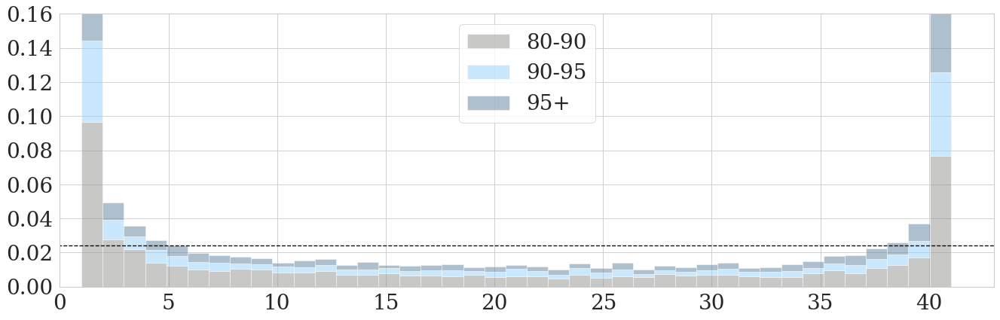

F006 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


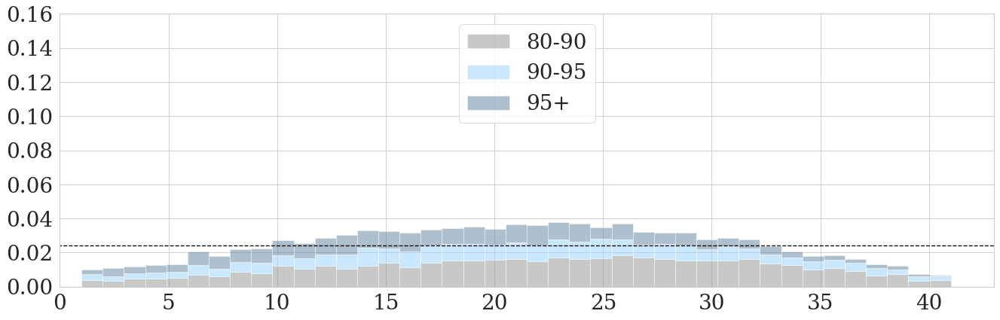

F006 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


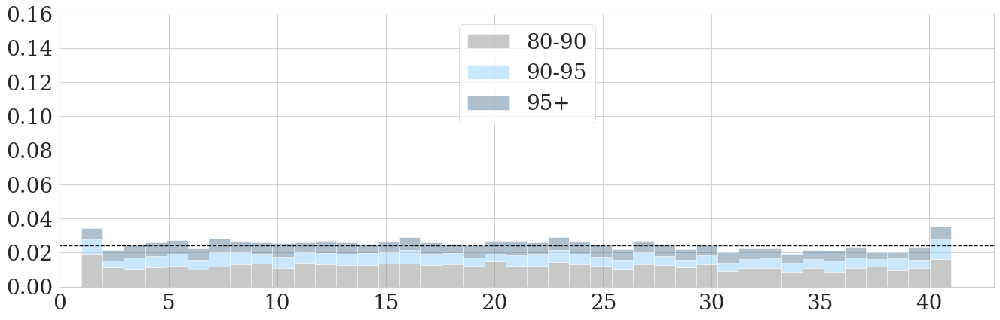

F006 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


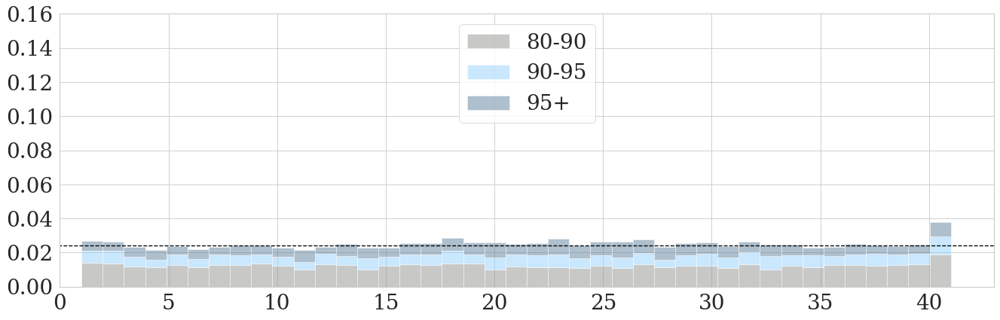

No Post-Processing
2016
2017
2018
these are bounds: [[219.23742730965694, 313.57319335937507], [313.57319335937507, 412.9128430840257], [412.9128430840257, 1184.430653025]]
F012 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


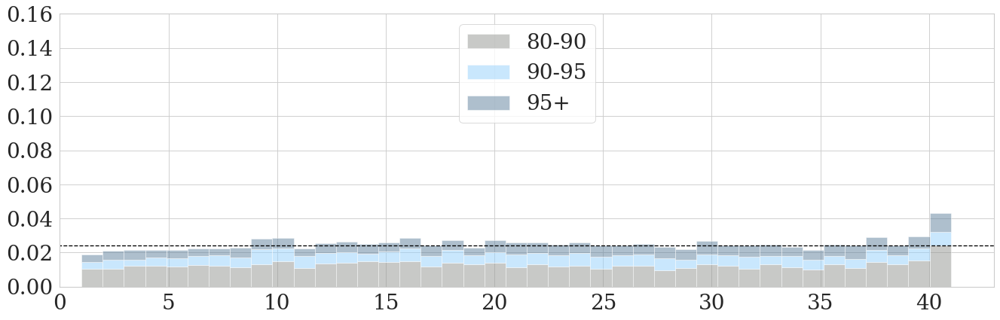

F012 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


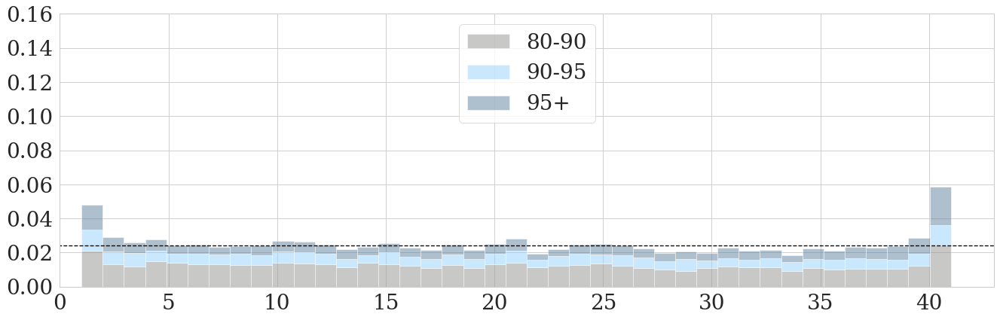

F012 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


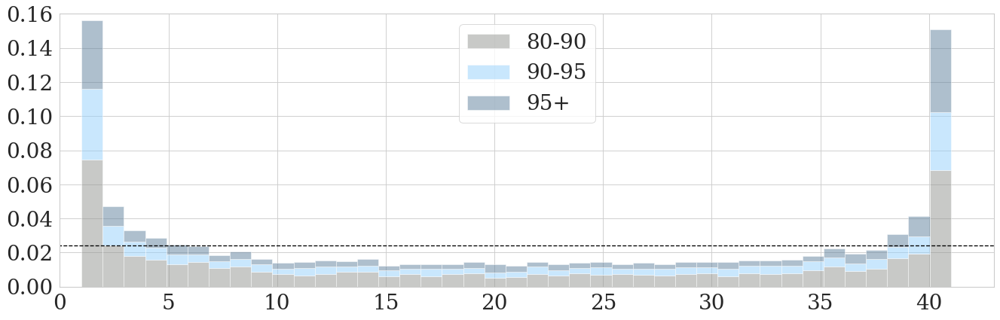

F012 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


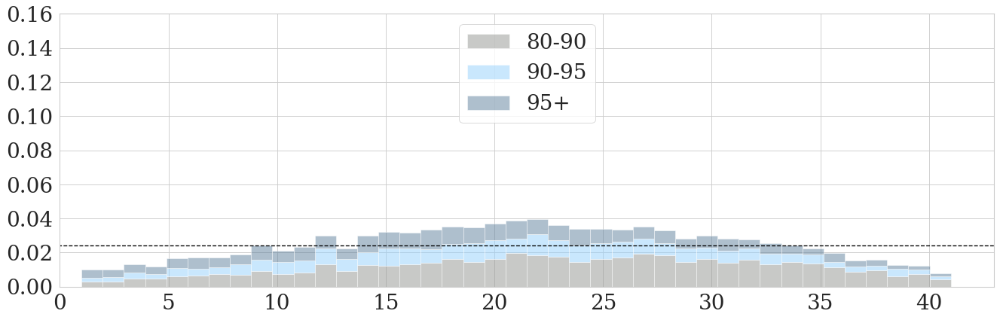

F012 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


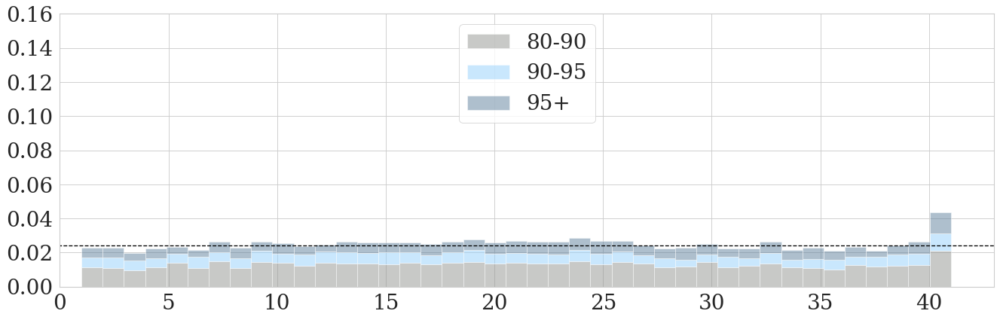

F012 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


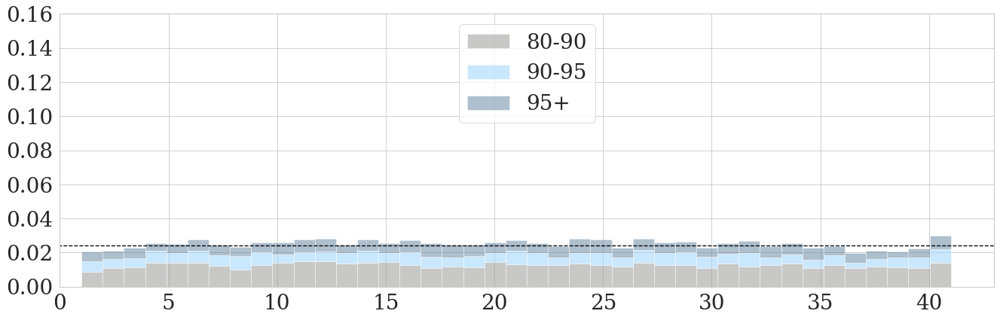

No Post-Processing
2016
2017
2018
these are bounds: [[217.67829797587055, 316.0944368634905], [316.0944368634905, 411.1331059472655], [411.1331059472655, 1217.5464965499998]]
F018 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


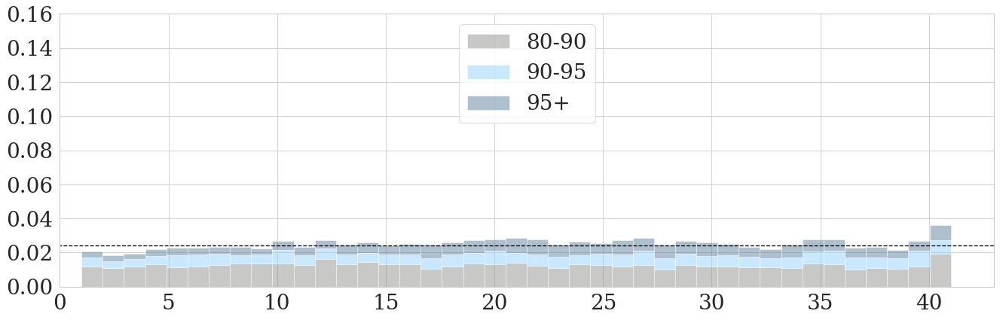

F018 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


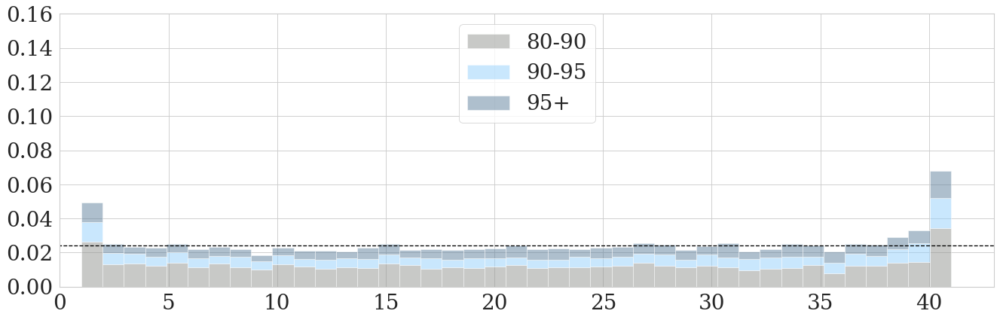

F018 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


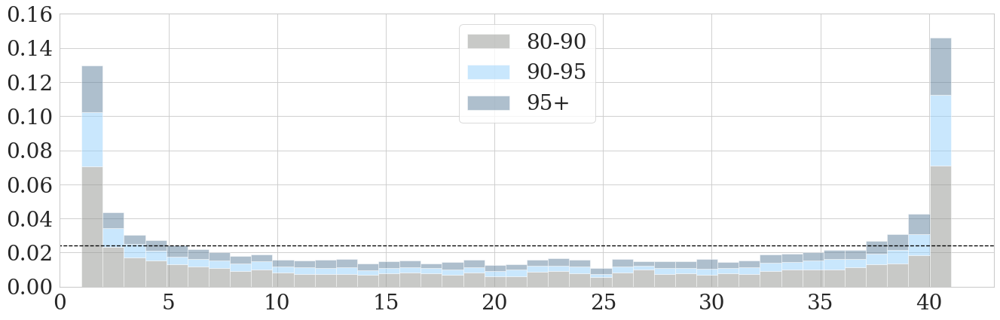

F018 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


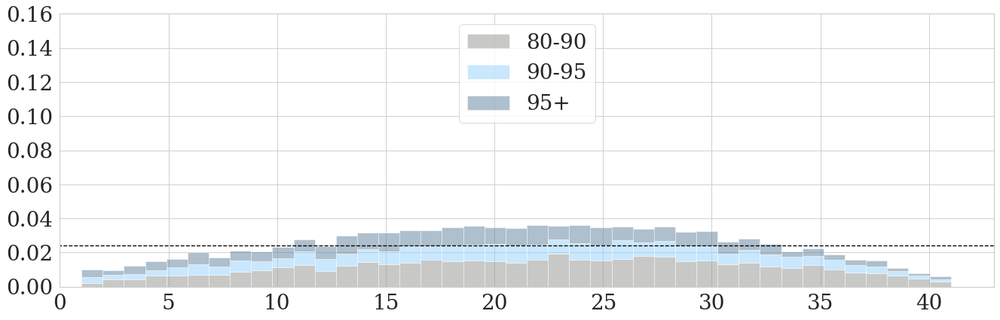

F018 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


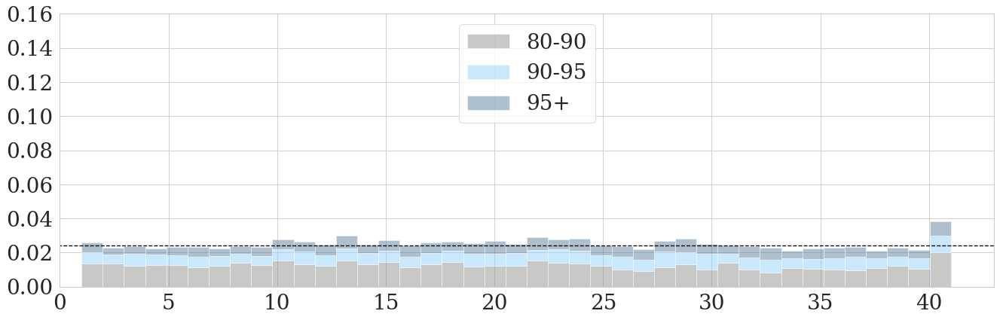

F018 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


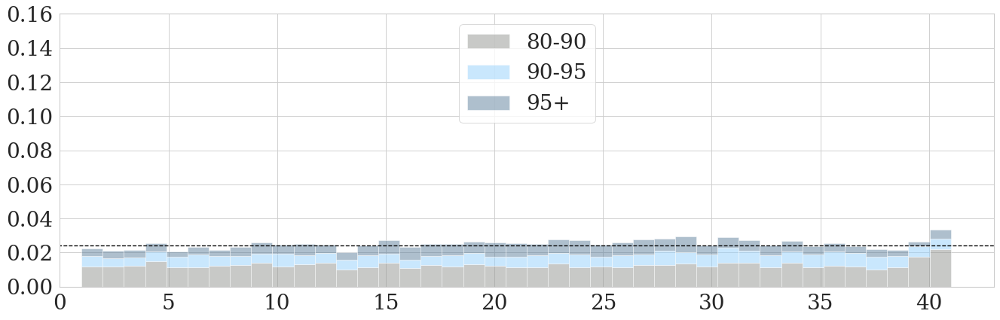

No Post-Processing
2016
2017
2018
these are bounds: [[217.2075866699219, 315.7866119384766], [315.7866119384766, 412.61909531184597], [412.61909531184597, 1163.282189675]]
F024 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


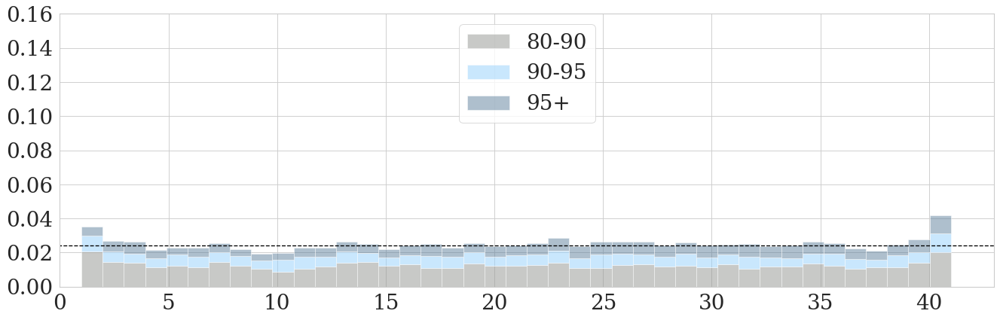

F024 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


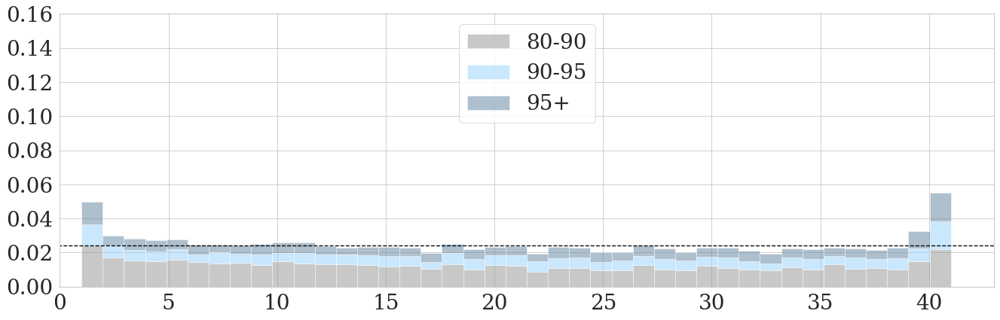

F024 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


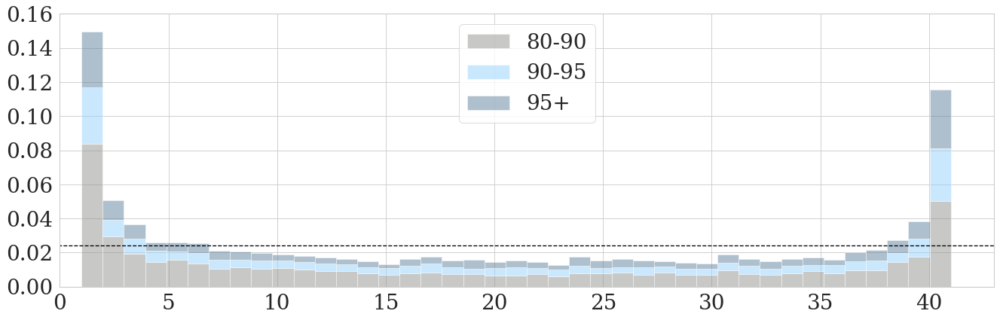

F024 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


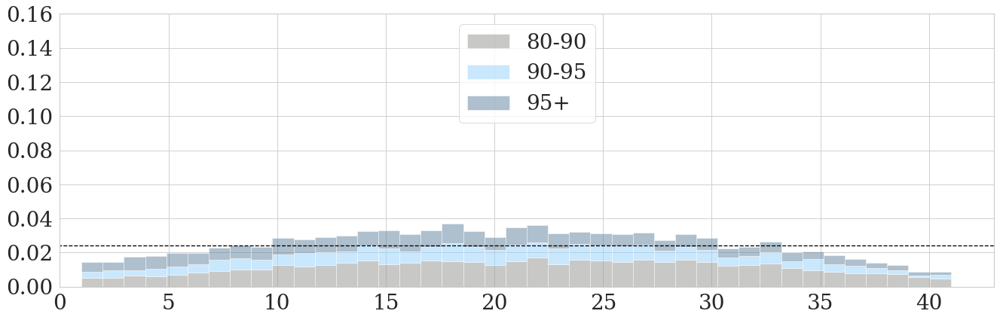

F024 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


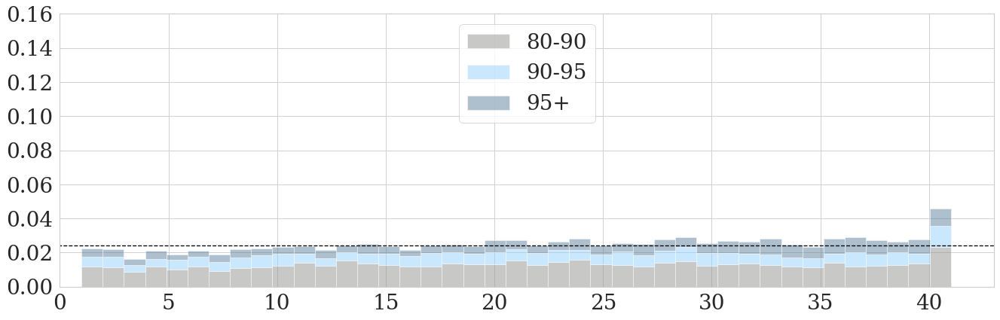

F024 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


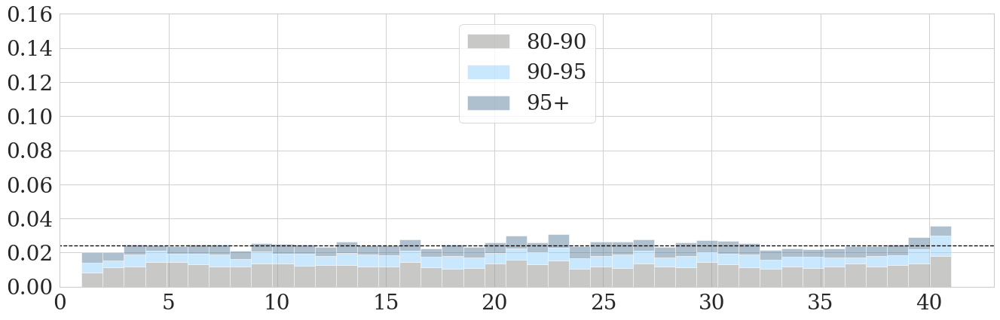

No Post-Processing
2016
2017
2018
these are bounds: [[212.68448450353412, 306.4914093017579], [306.4914093017579, 408.52998129616157], [408.52998129616157, 1113.5550935749995]]
F030 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


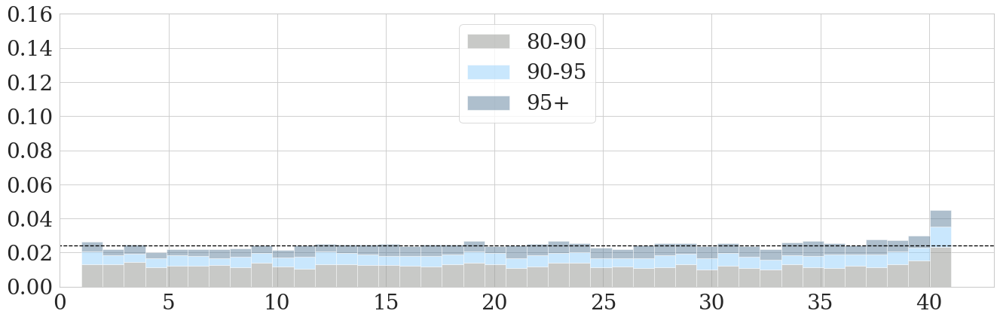

F030 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


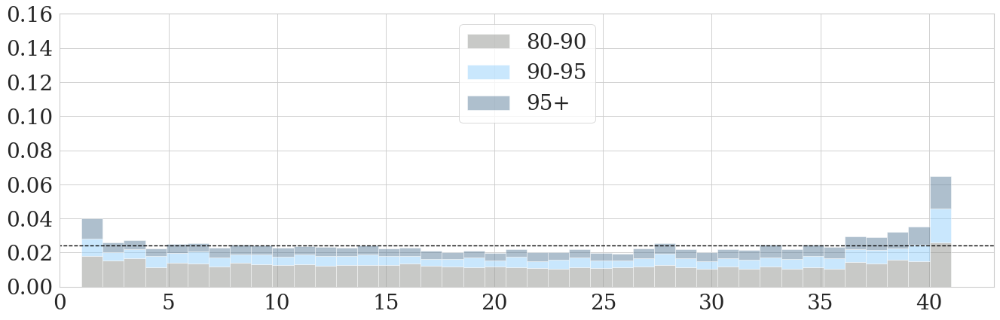

F030 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


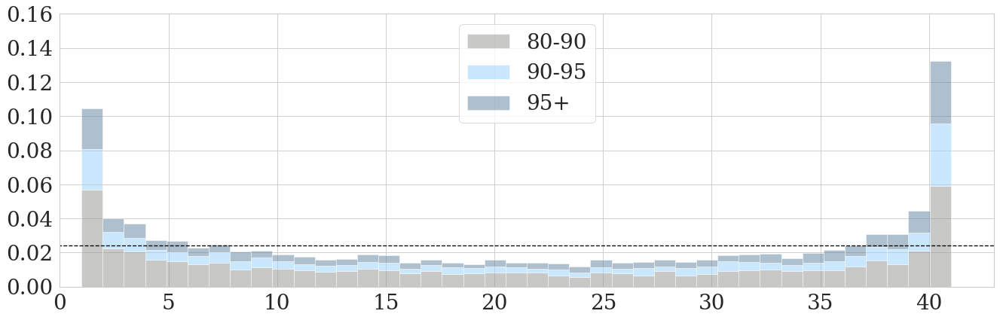

F030 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


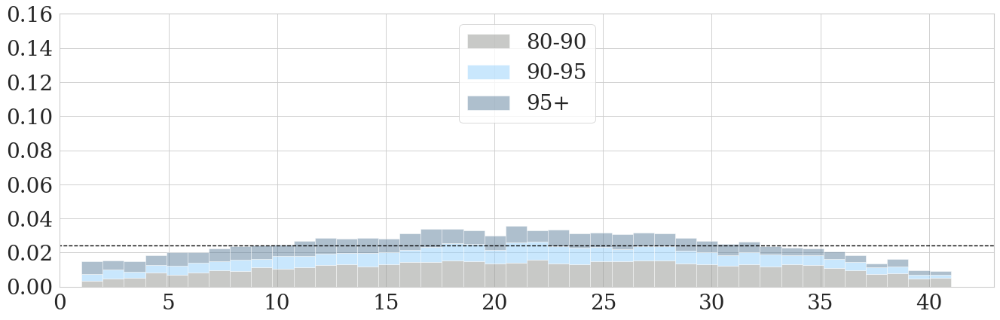

F030 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


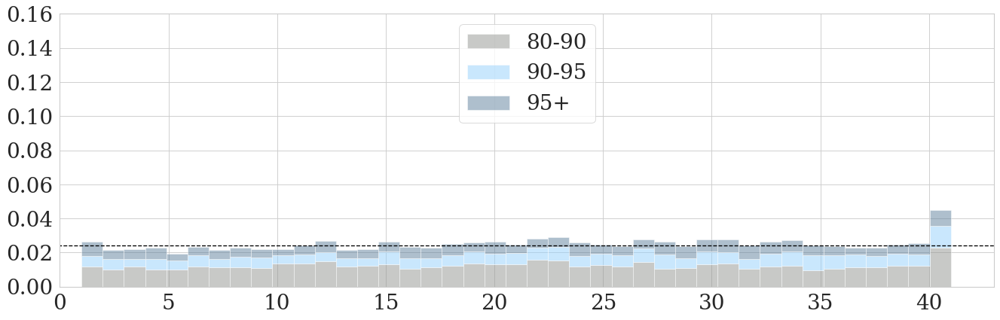

F030 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


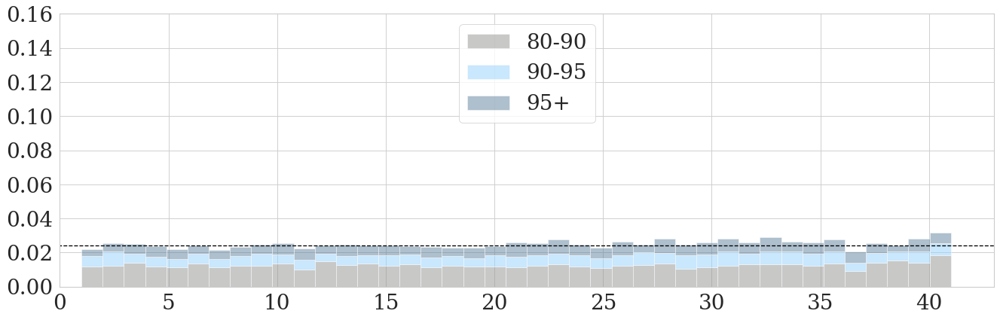

No Post-Processing
2016
2017
2018
these are bounds: [[217.0374267578125, 307.7776763916016], [307.7776763916016, 403.94124603271484], [403.94124603271484, 1151.0820055749998]]
F036 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


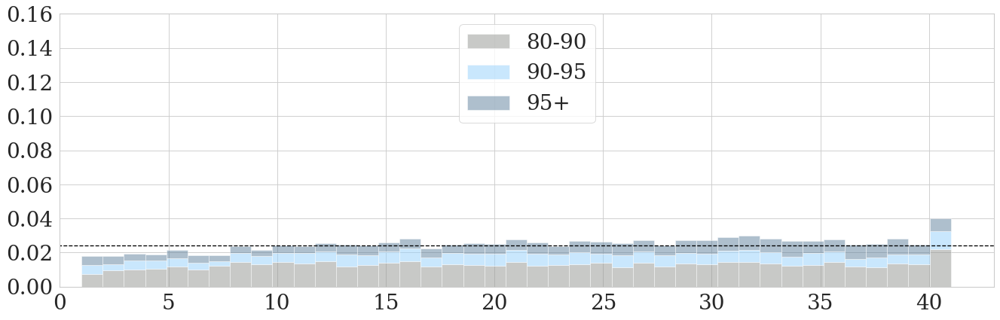

F036 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


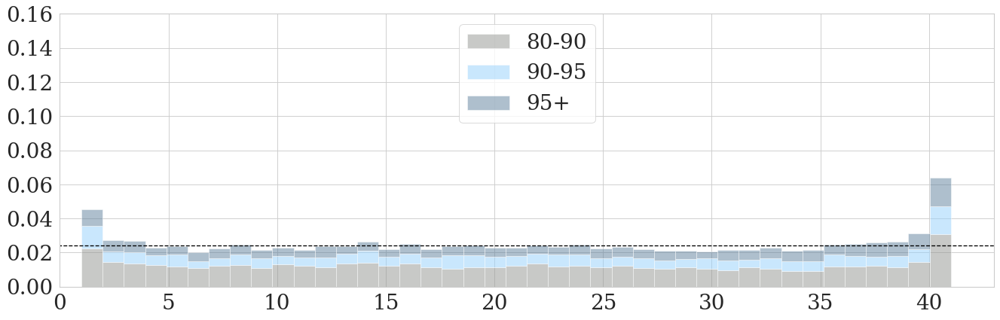

F036 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


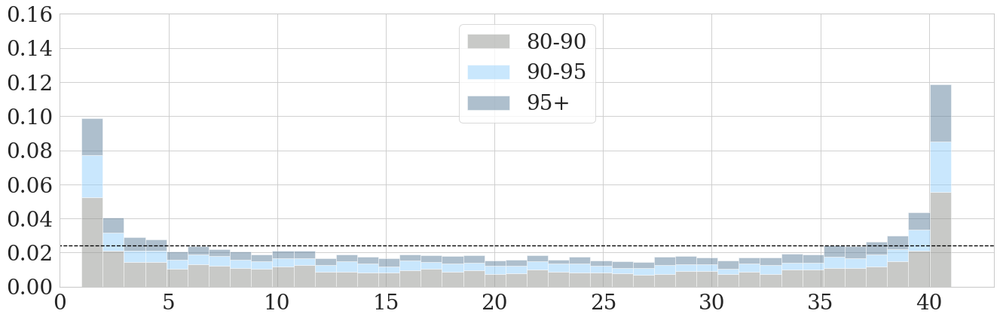

F036 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


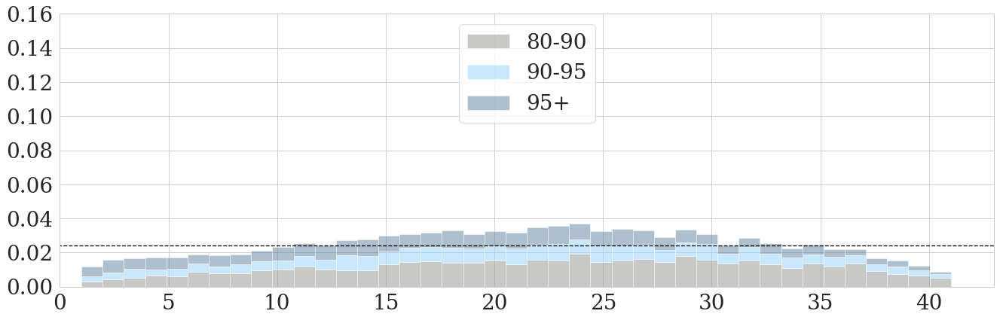

F036 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


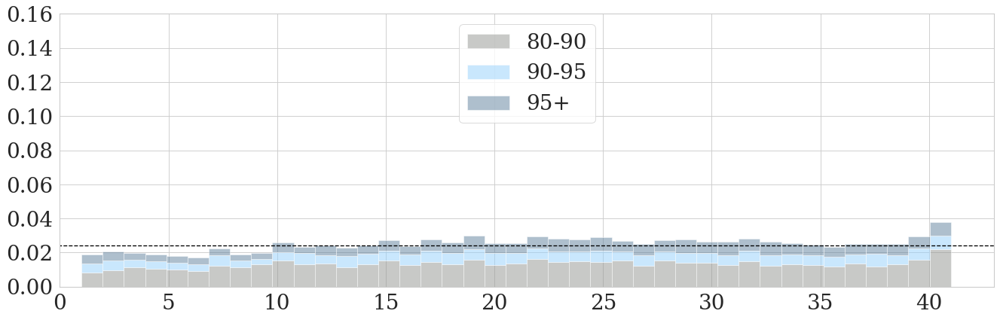

F036 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


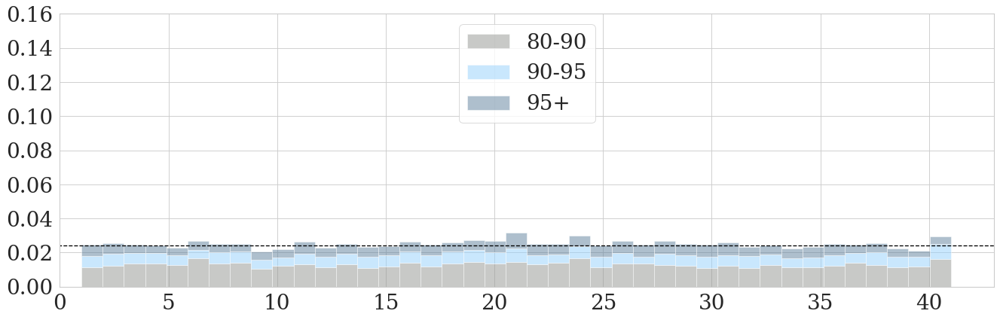

No Post-Processing
2016
2017
2018
these are bounds: [[213.61667176050443, 307.3964886012501], [307.3964886012501, 398.5811416625976], [398.5811416625976, 1188.67446045]]
F042 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


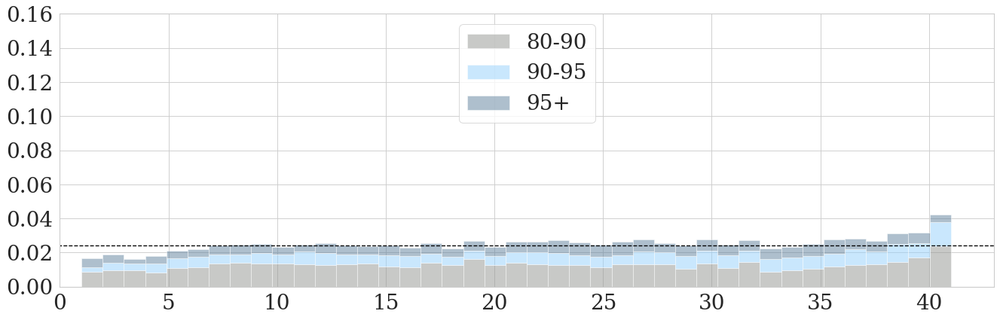

F042 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


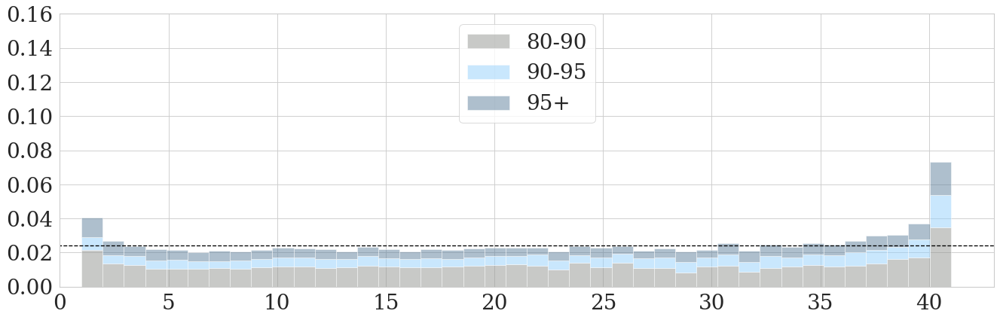

F042 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


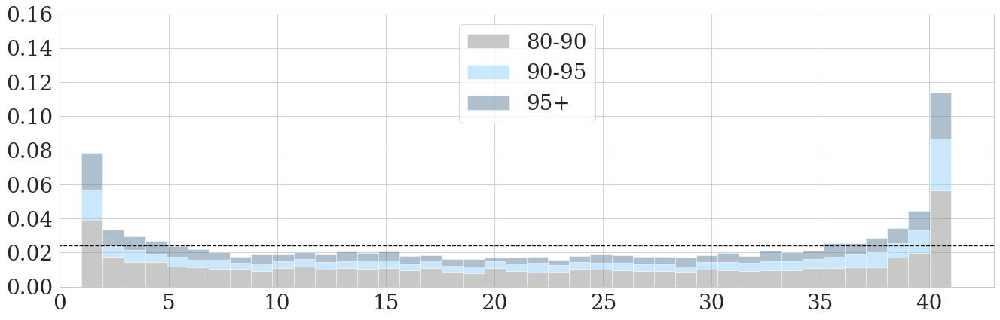

F042 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


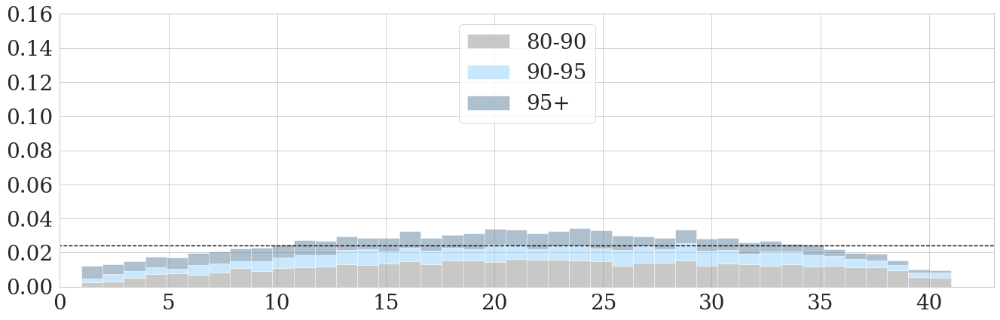

F042 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


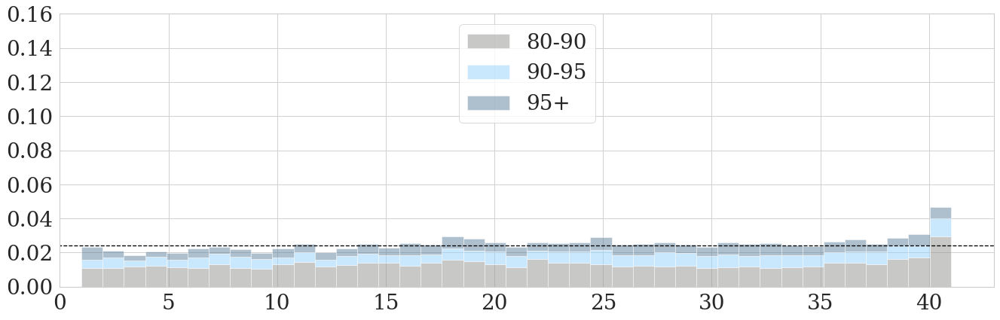

F042 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


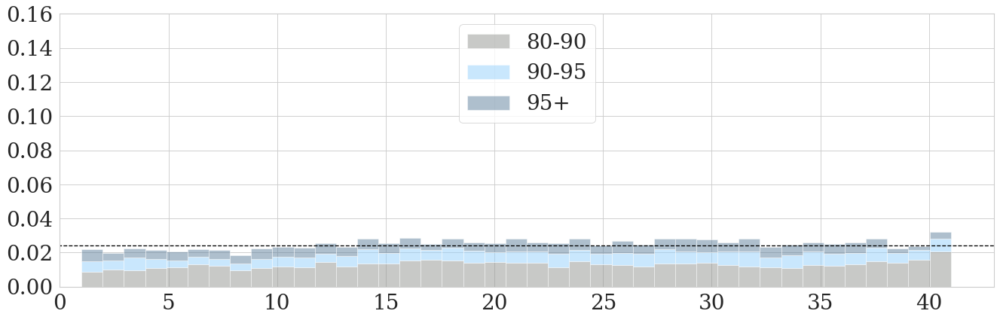

No Post-Processing
2016
2017
2018
these are bounds: [[215.875920930125, 307.643344116211], [307.643344116211, 398.59900410056576], [398.59900410056576, 1135.2309611749997]]
F048 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


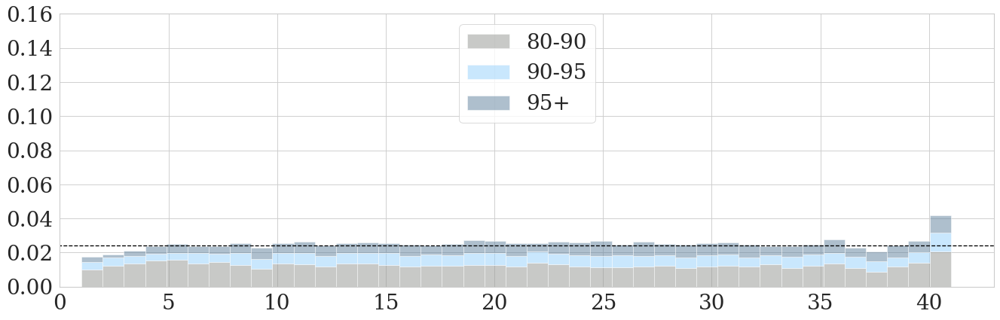

F048 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


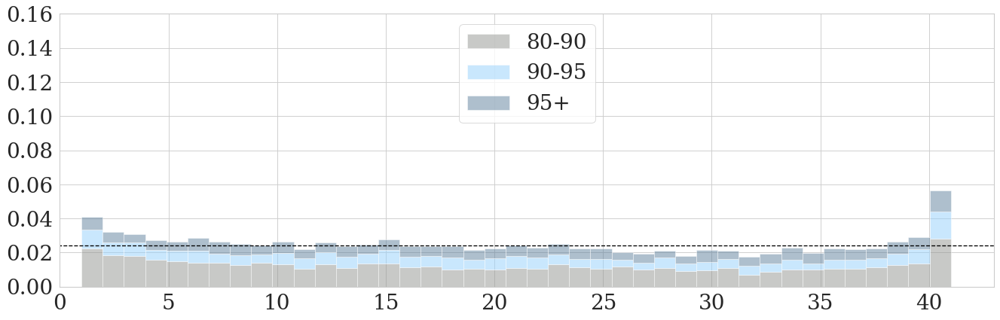

F048 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


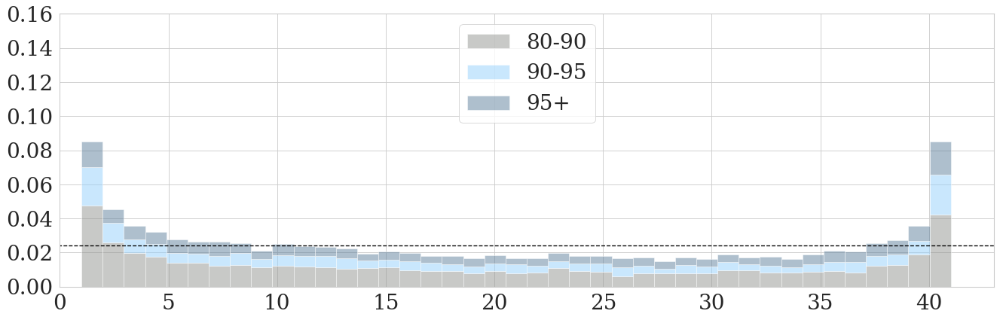

F048 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


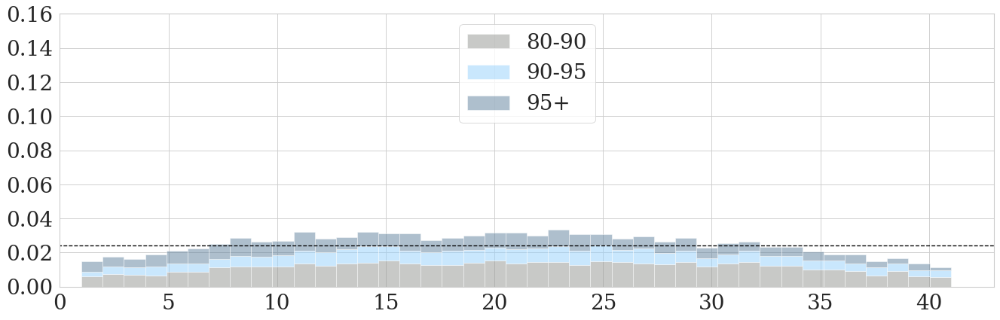

F048 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


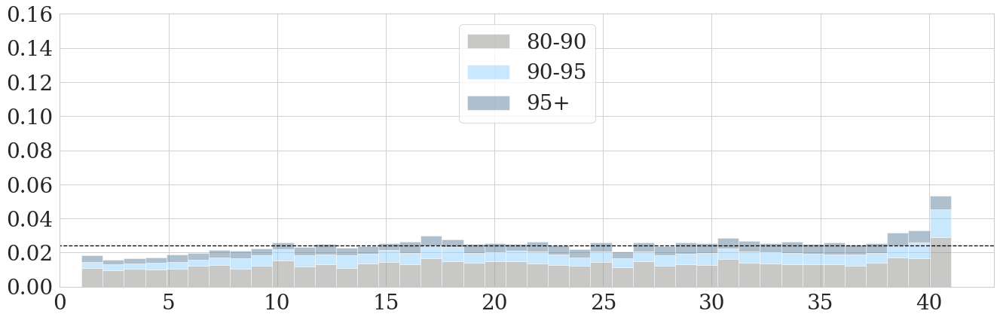

F048 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


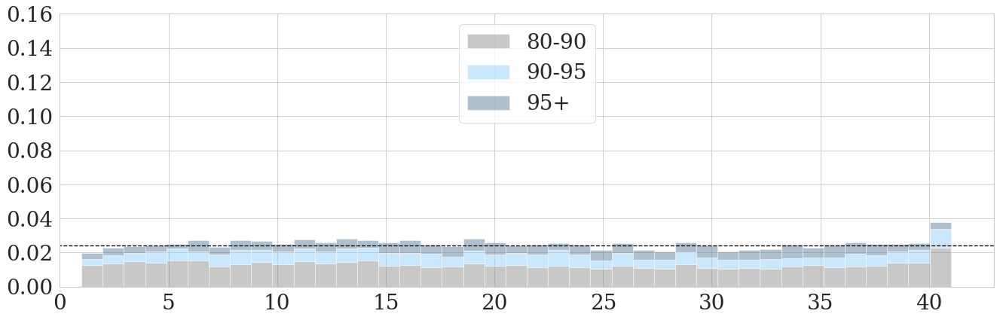

No Post-Processing
2016
2017
2018
these are bounds: [[208.07790228800005, 299.82764084426776], [299.82764084426776, 389.993336498484], [389.993336498484, 1037.4316907500001]]
F054 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


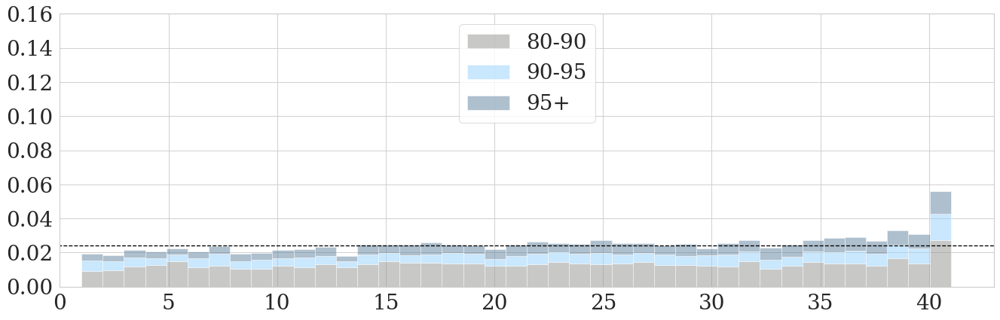

F054 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


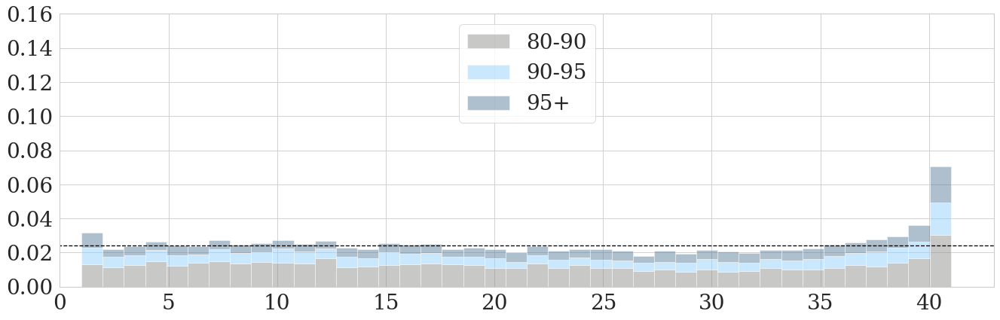

F054 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


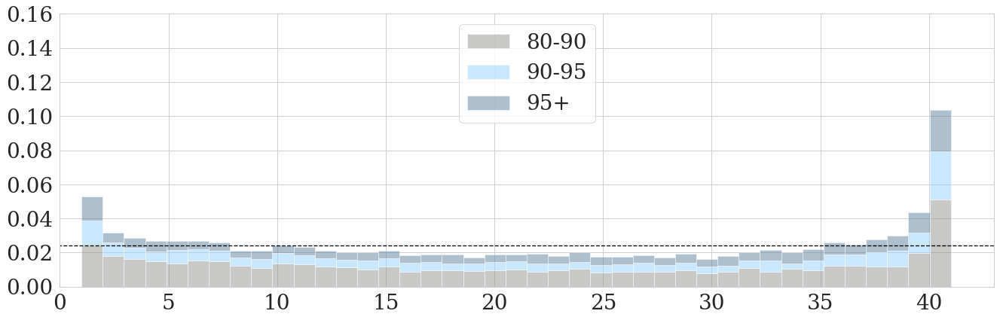

F054 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


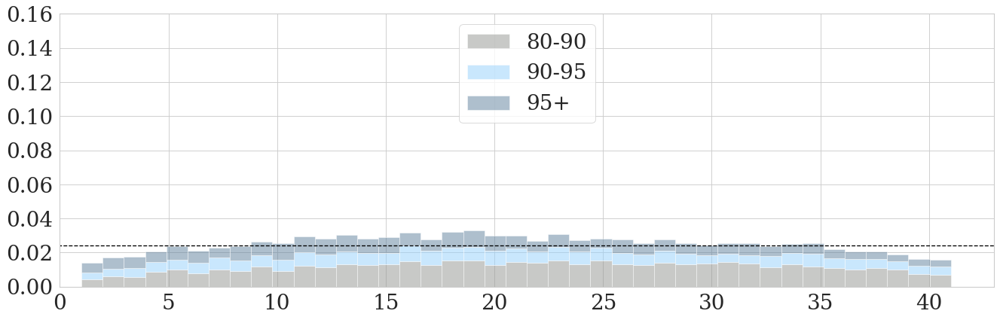

F054 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


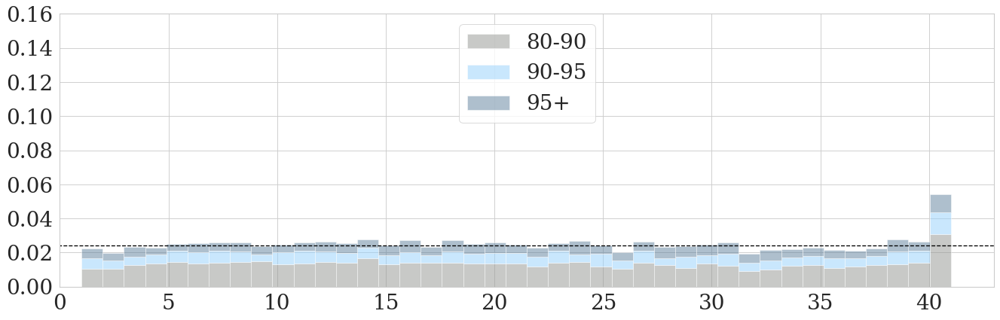

F054 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


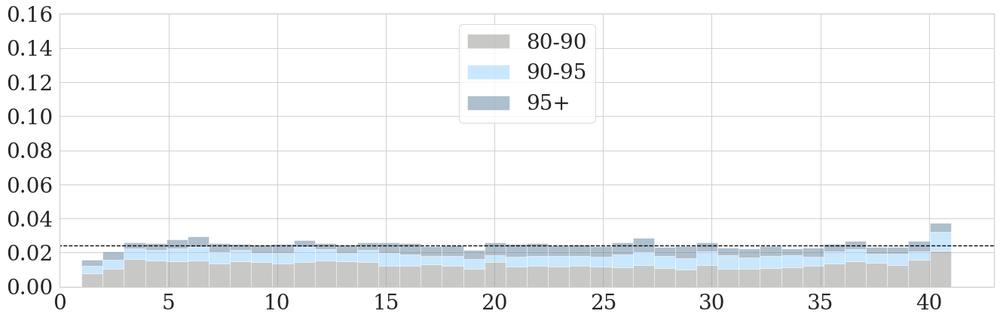

No Post-Processing
2016
2017
2018
these are bounds: [[213.10048690597253, 297.48861694335955], [297.48861694335955, 390.6878766377767], [390.6878766377767, 1237.07527]]
F060 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


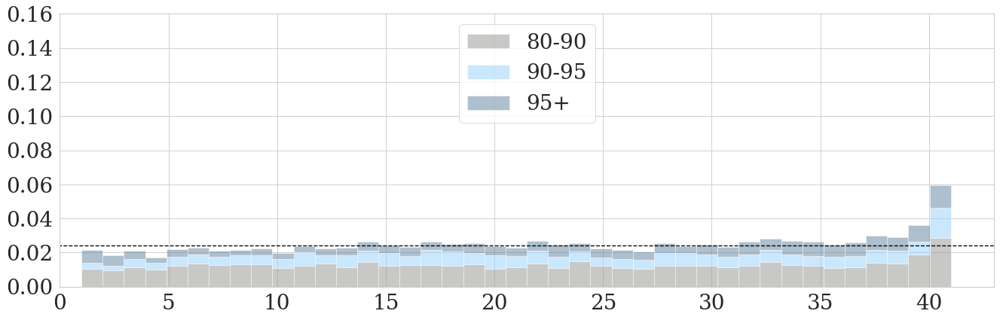

F060 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


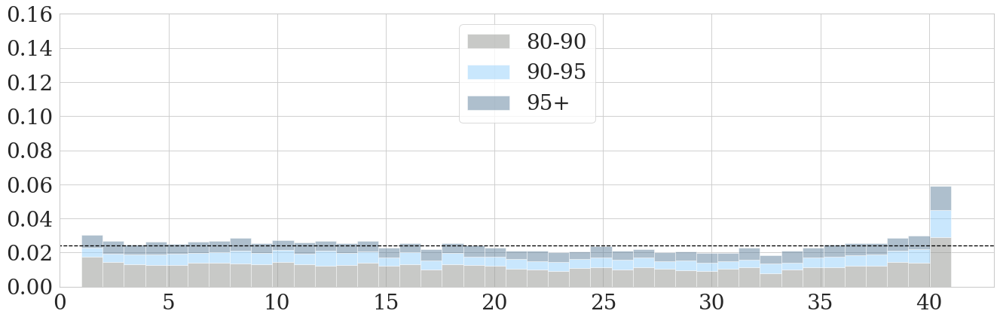

F060 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


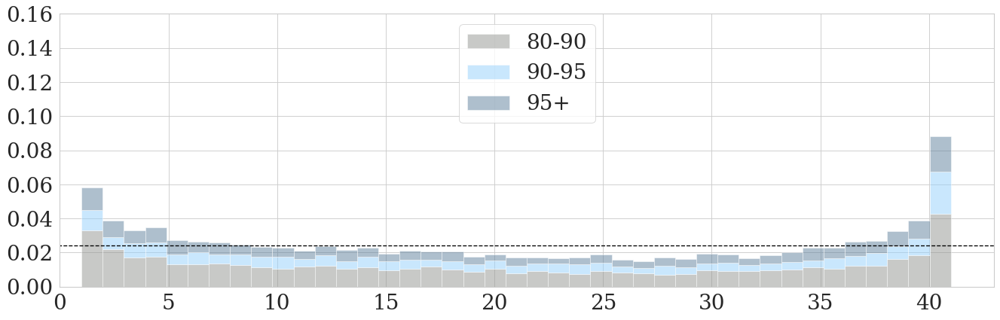

F060 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


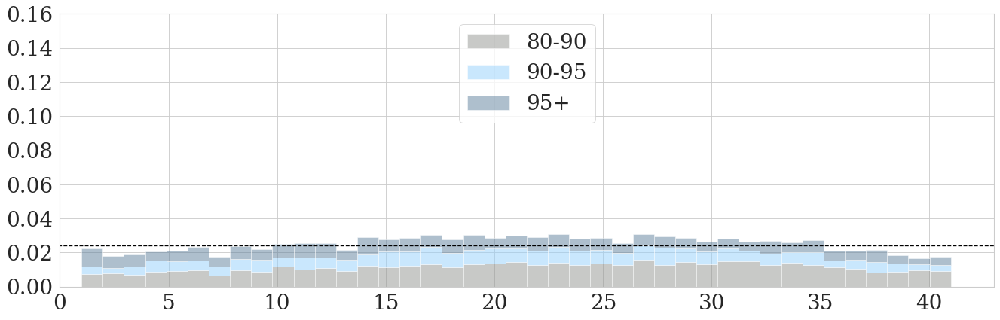

F060 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


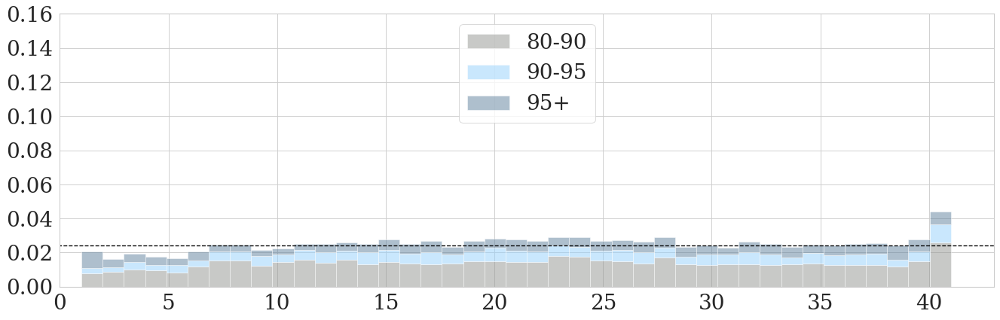

F060 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


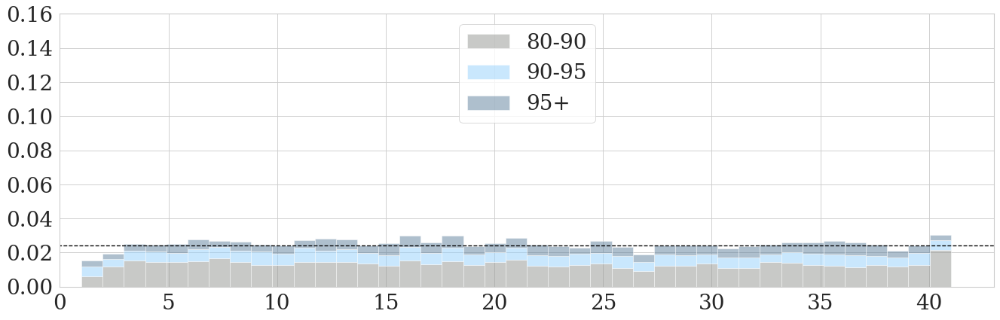

No Post-Processing
2016
2017
2018
these are bounds: [[207.3340297149146, 294.39172842843203], [294.39172842843203, 385.39088457505864], [385.39088457505864, 1032.5061814000005]]
F066 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


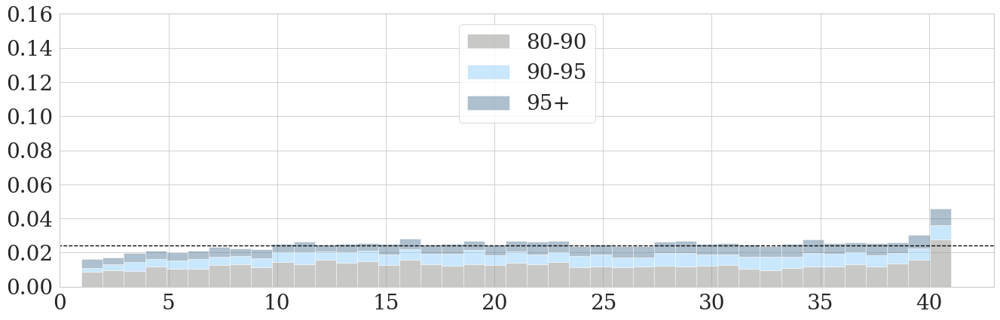

F066 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


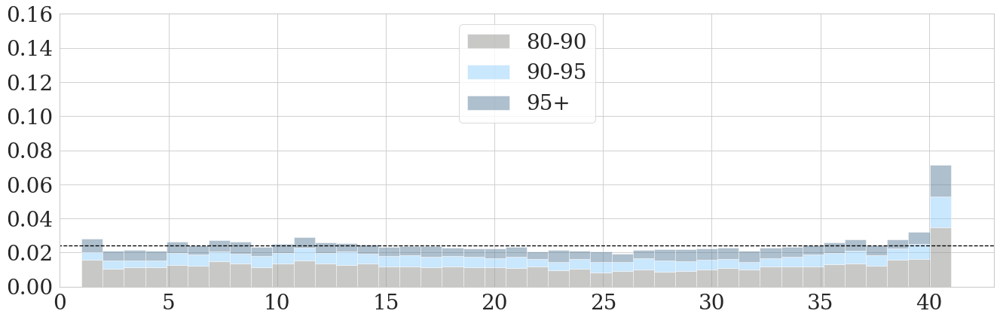

F066 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


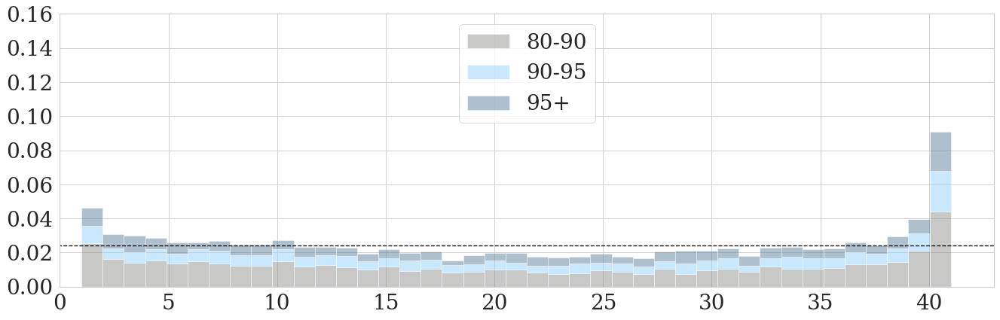

F066 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


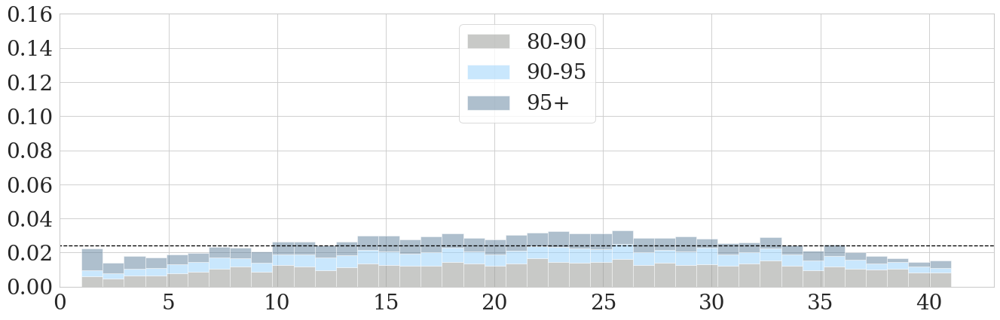

F066 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


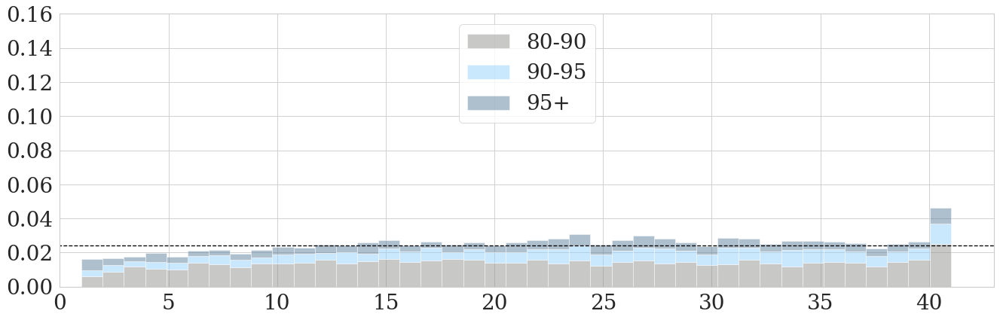

F066 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


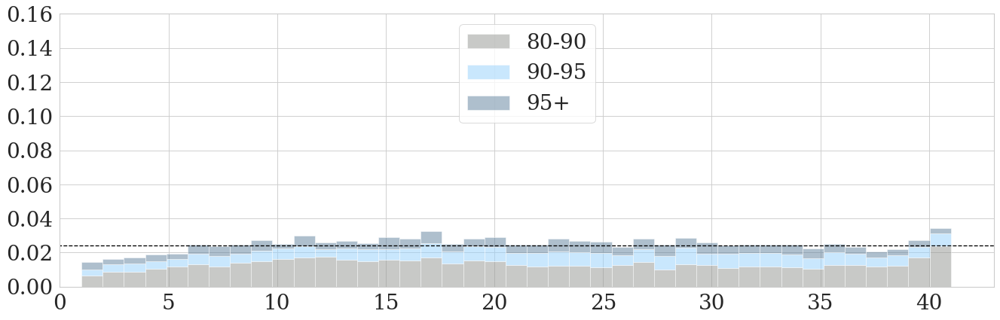

No Post-Processing
2016
2017
2018
these are bounds: [[210.34541418213996, 297.30073845544143], [297.30073845544143, 379.58580777899994], [379.58580777899994, 1022.5004823500001]]
F072 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


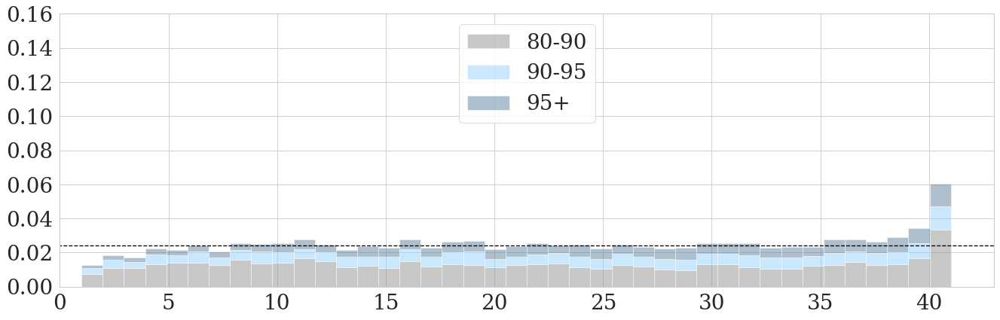

F072 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


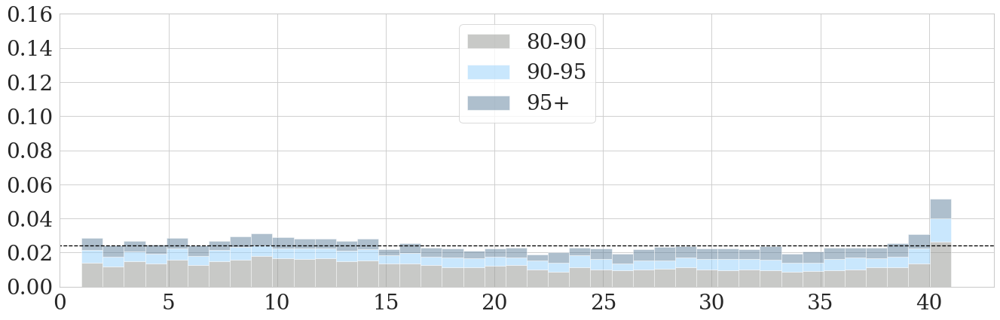

F072 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


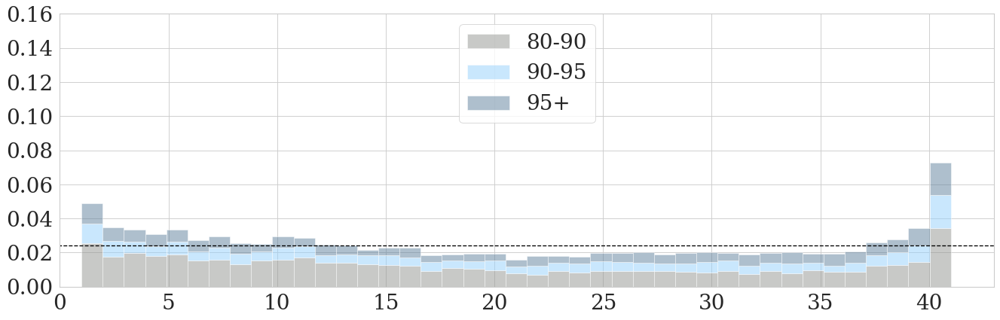

F072 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


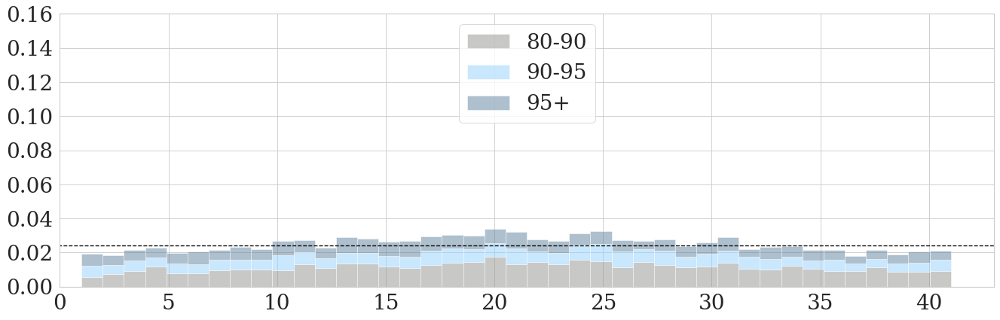

F072 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


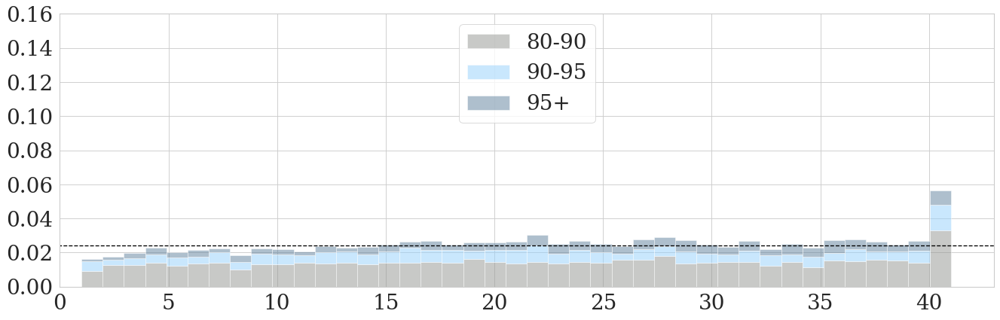

F072 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


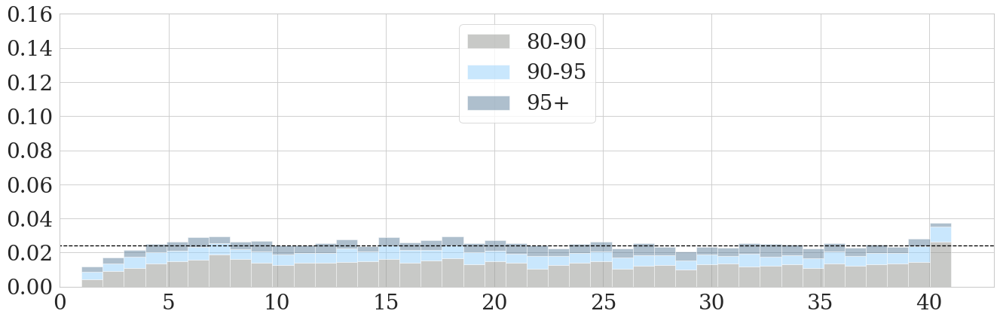

No Post-Processing
2016
2017
2018
these are bounds: [[203.90996093750005, 285.55616195553745], [285.55616195553745, 366.5142349243162], [366.5142349243162, 1061.121880525]]
F078 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


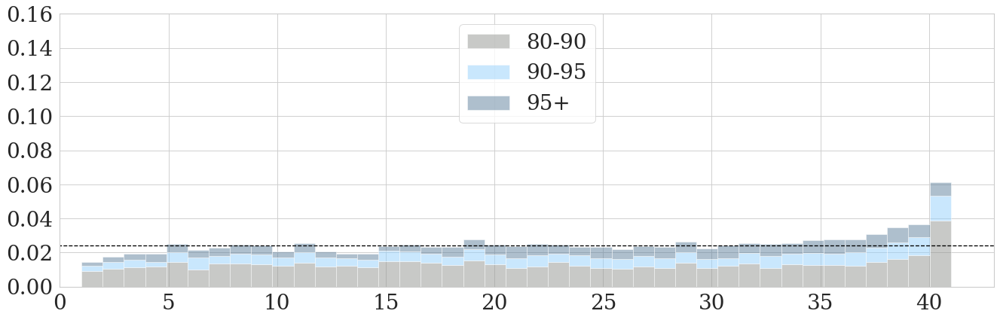

F078 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


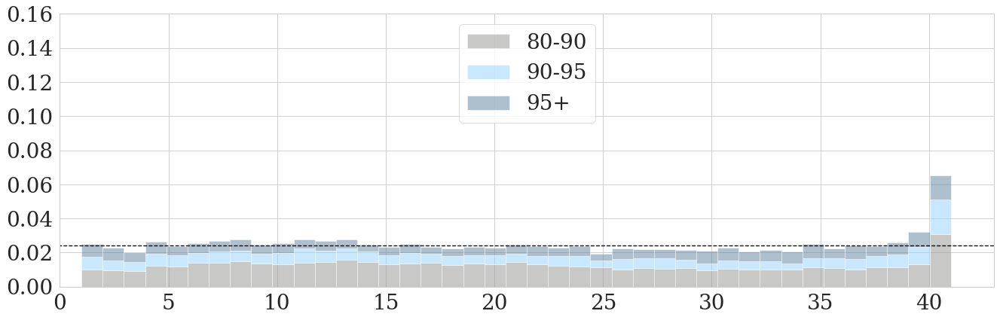

F078 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


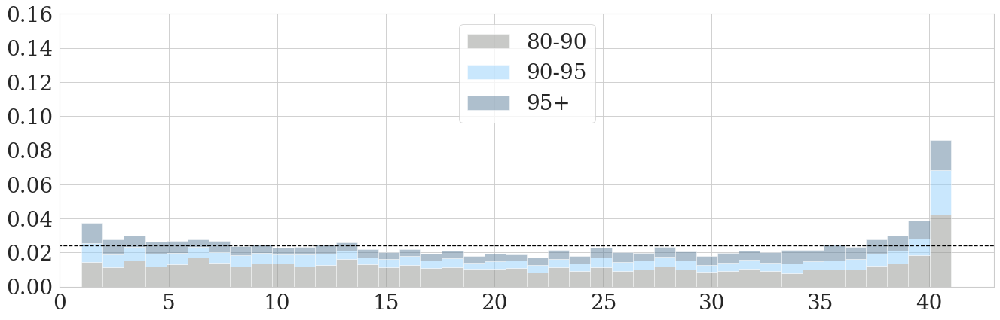

F078 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


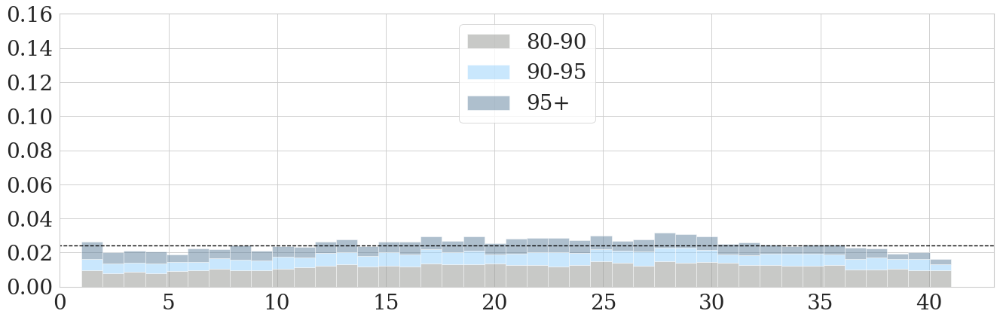

F078 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


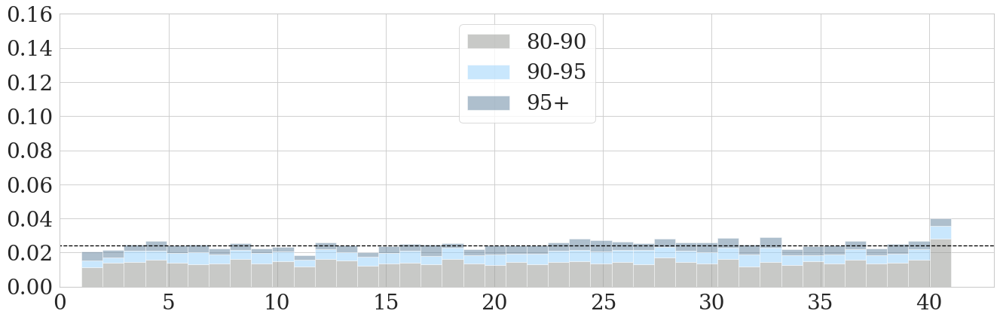

F078 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


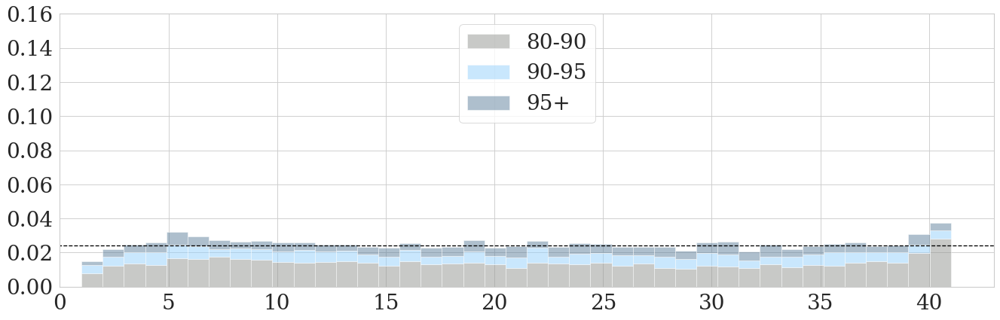

No Post-Processing
2016
2017
2018
these are bounds: [[206.90983179759377, 285.0244140625001], [285.0244140625001, 363.69635726474985], [363.69635726474985, 1072.654452725]]
F084 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


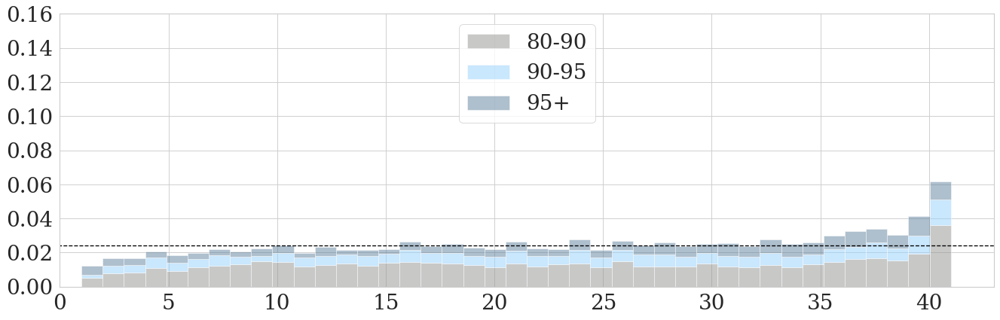

F084 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


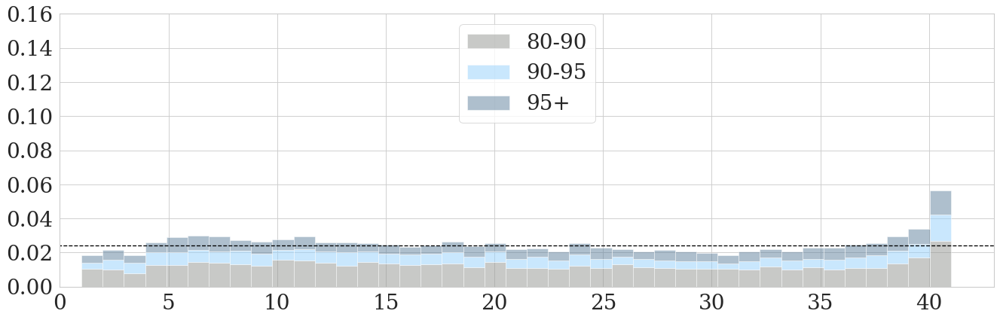

F084 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


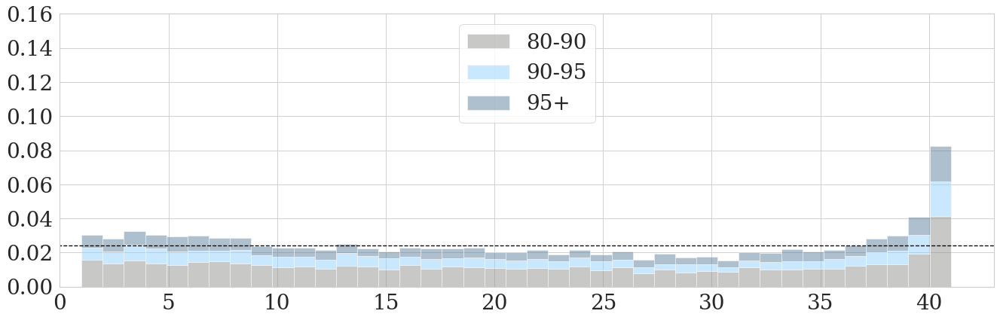

F084 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


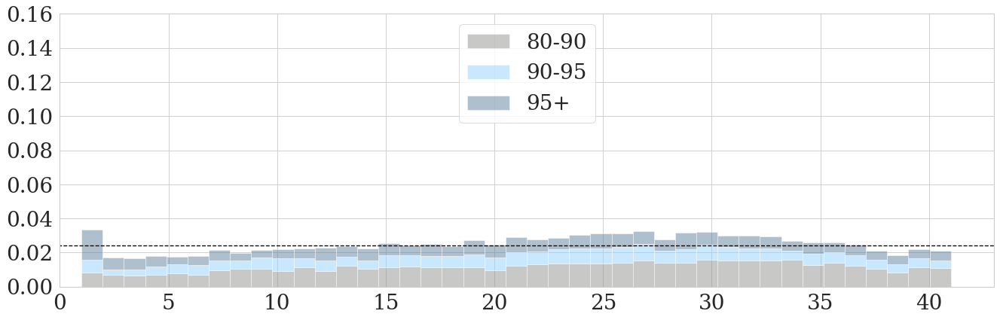

F084 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


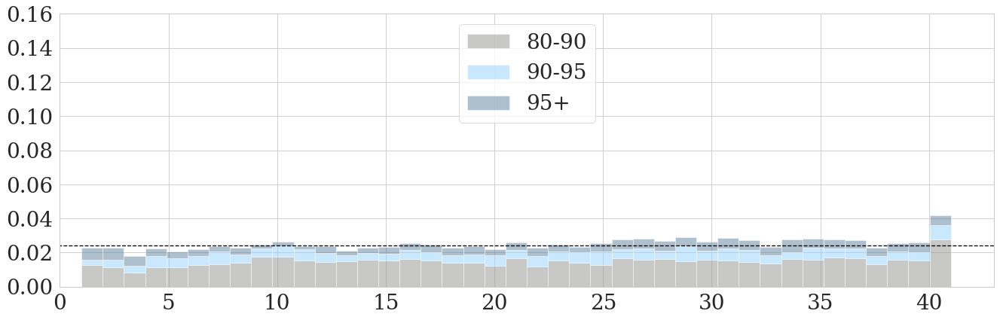

F084 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


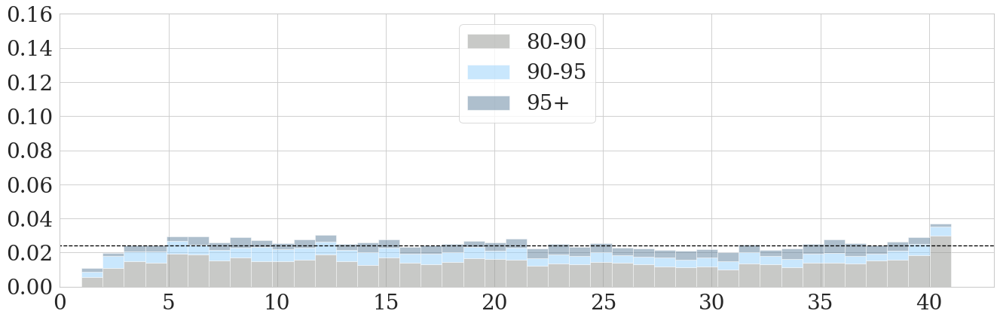

No Post-Processing
2016
2017
2018
these are bounds: [[202.27197963169644, 281.7539127349855], [281.7539127349855, 358.09269721004245], [358.09269721004245, 929.9401138249996]]
F090 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


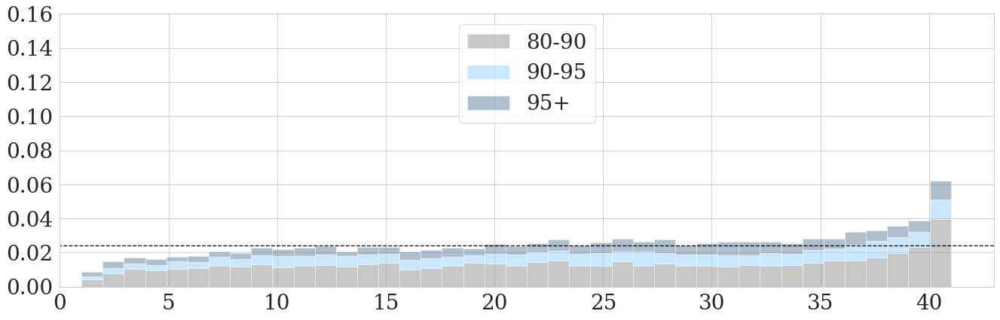

F090 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


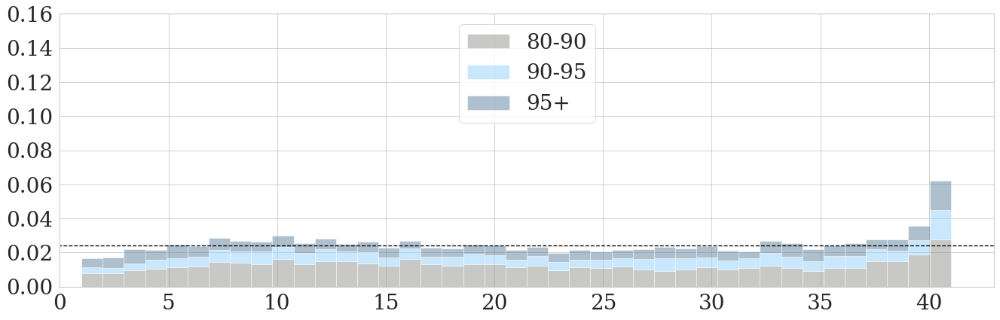

F090 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


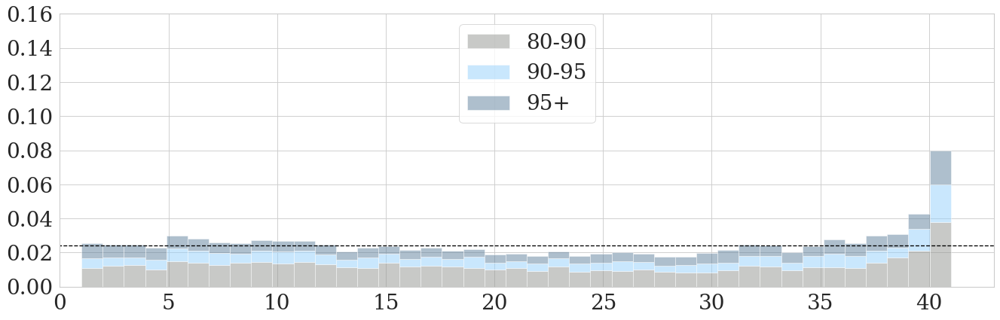

F090 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


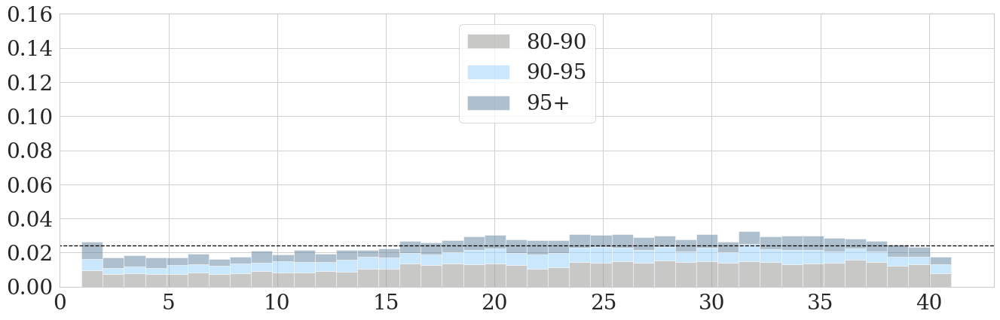

F090 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


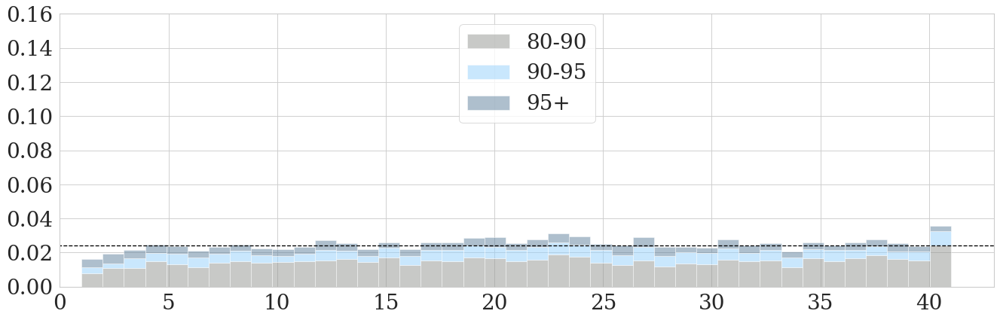

F090 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


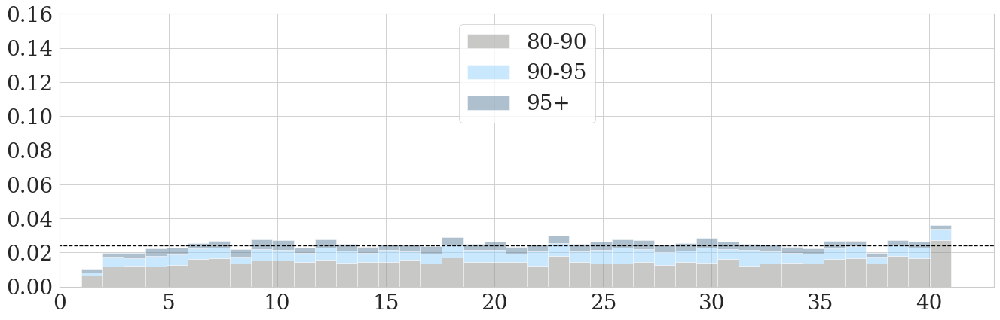

No Post-Processing
2016
2017
2018
these are bounds: [[204.88243103027352, 280.62265319824235], [280.62265319824235, 357.42190303675926], [357.42190303675926, 962.6712896749999]]
F096 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


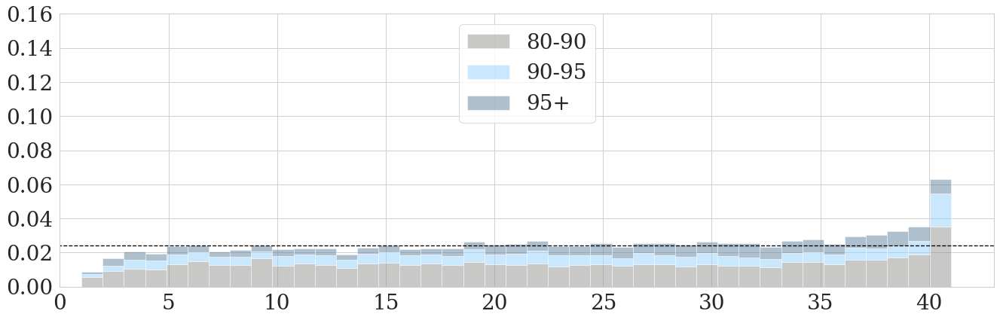

F096 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


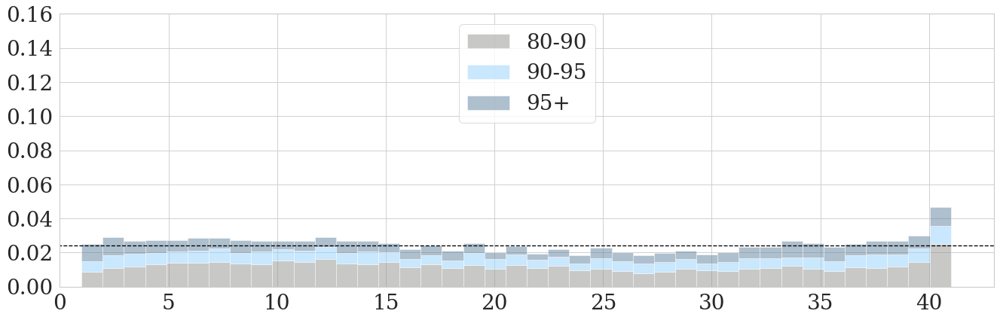

F096 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


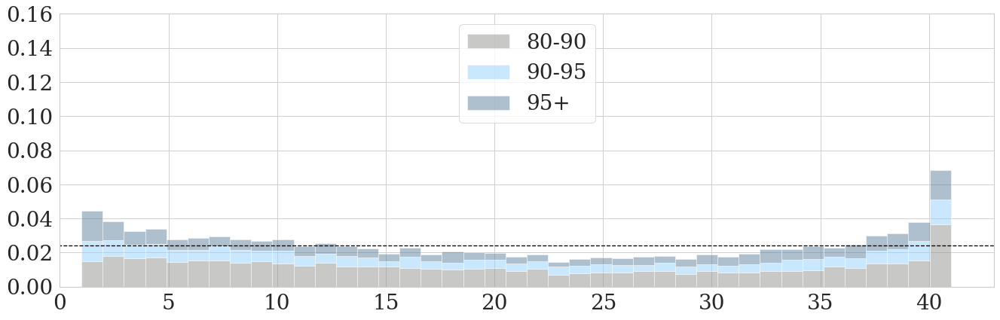

F096 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


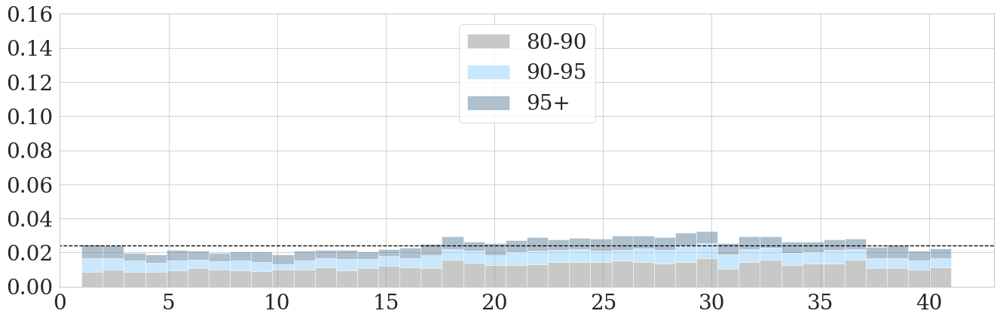

F096 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


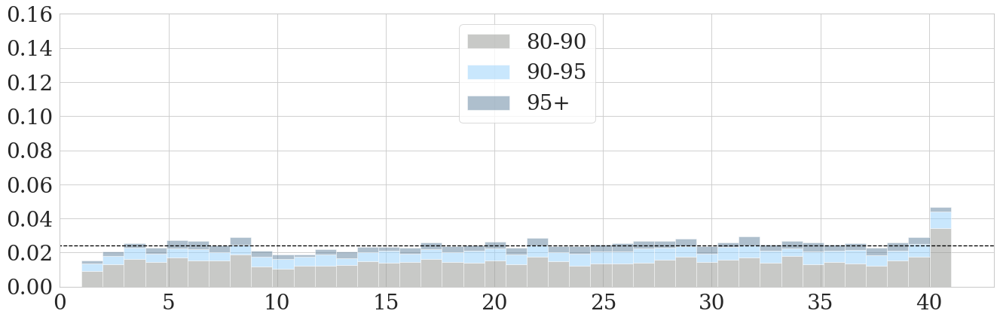

F096 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


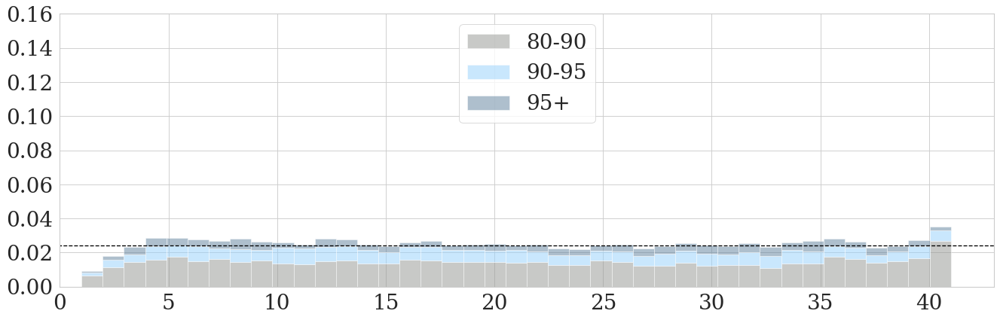

No Post-Processing
2016
2017
2018
these are bounds: [[199.15504455566406, 273.23704730111467], [273.23704730111467, 344.558110354907], [344.558110354907, 868.4961321000001]]
F102 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


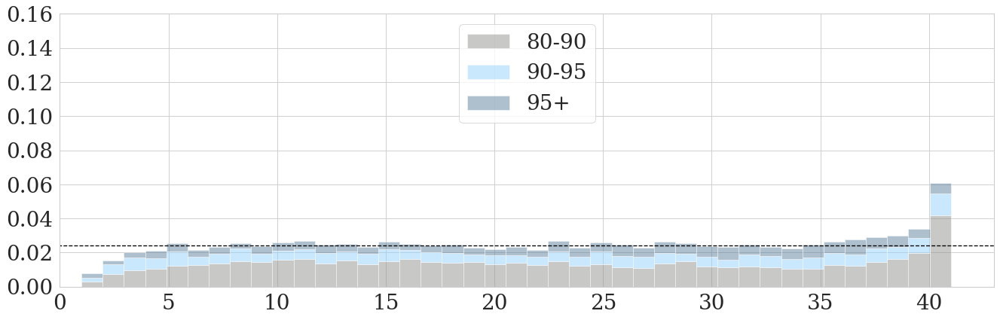

F102 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


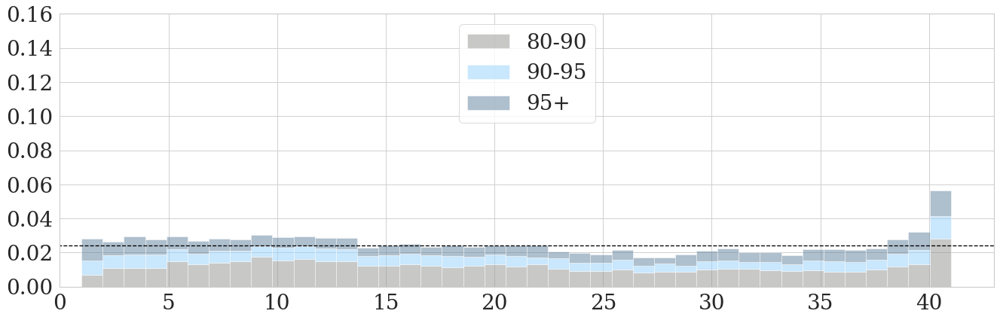

F102 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


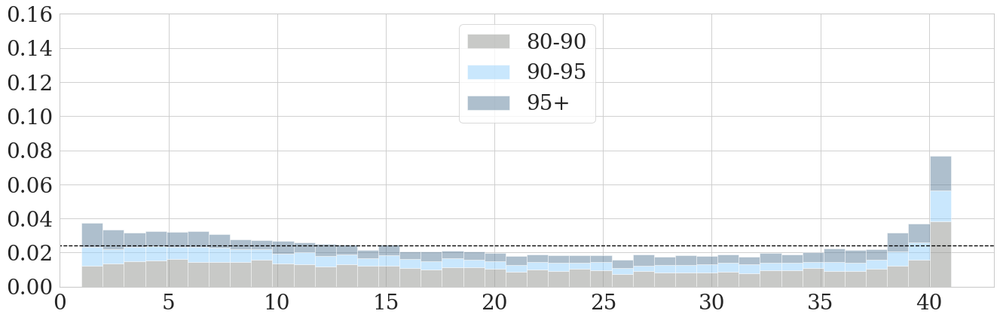

F102 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


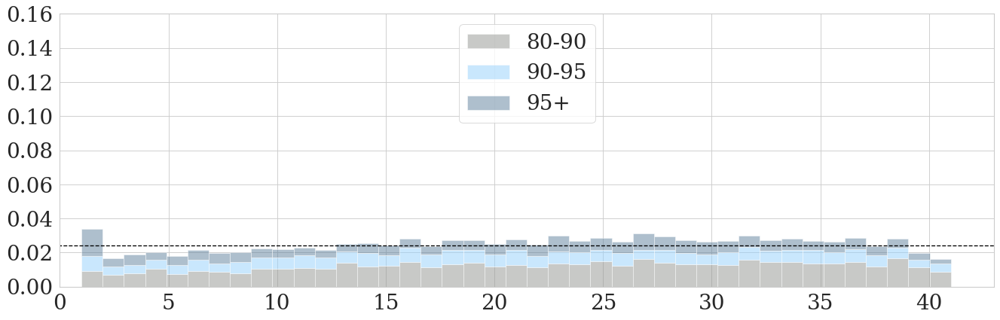

F102 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


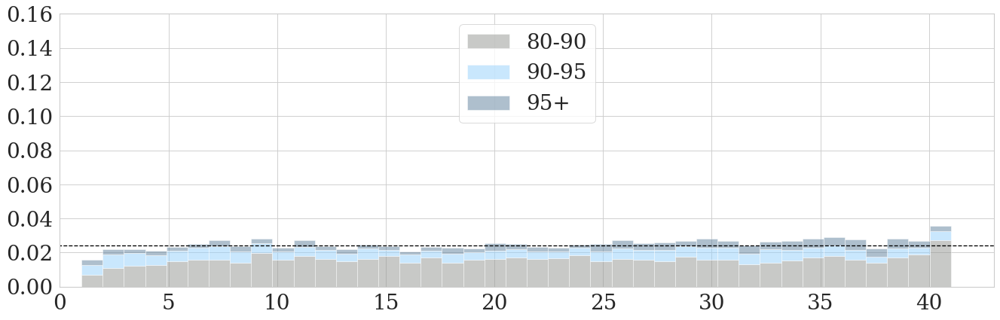

F102 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


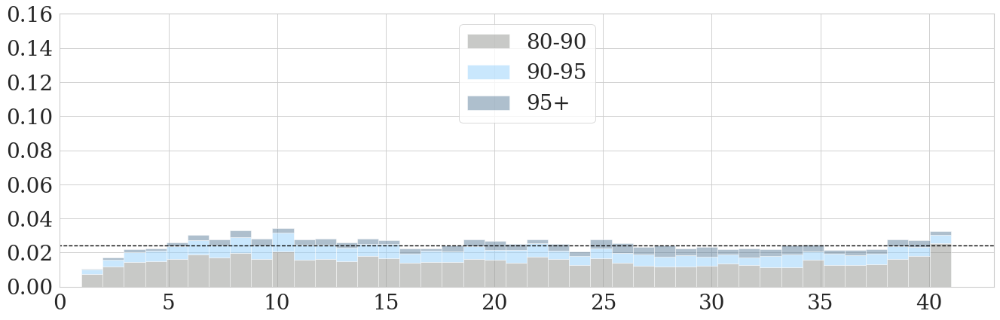

No Post-Processing
2016
2017
2018
these are bounds: [[201.40914858863468, 274.5547673361644], [274.5547673361644, 344.4873675126694], [344.4873675126694, 989.1941638749997]]
F108 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


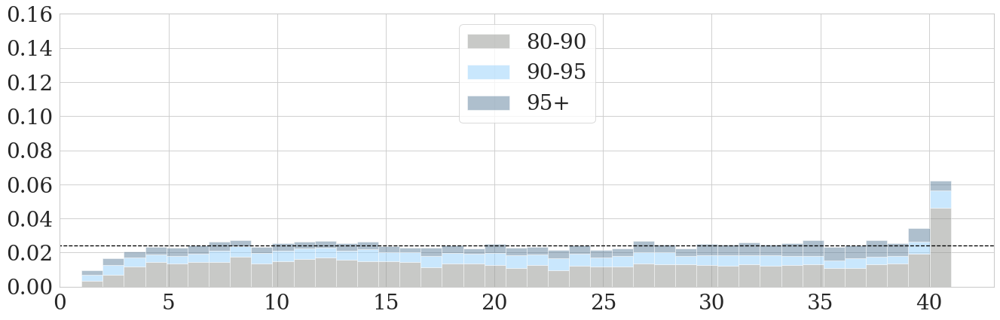

F108 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


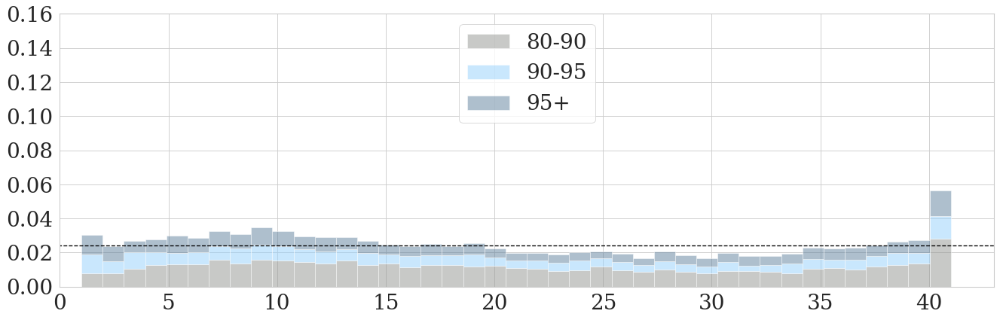

F108 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


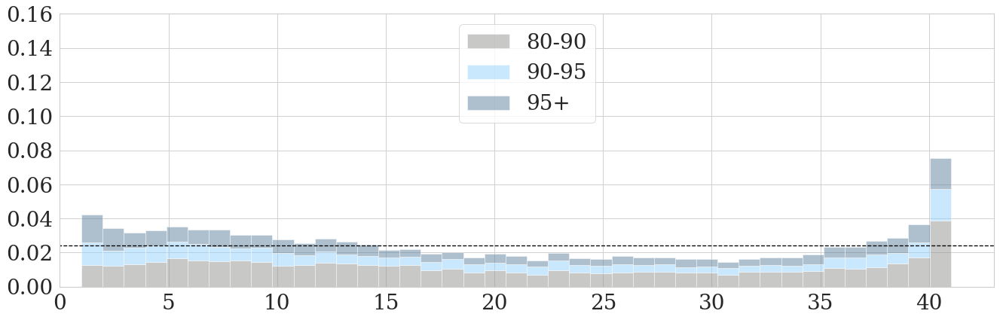

F108 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


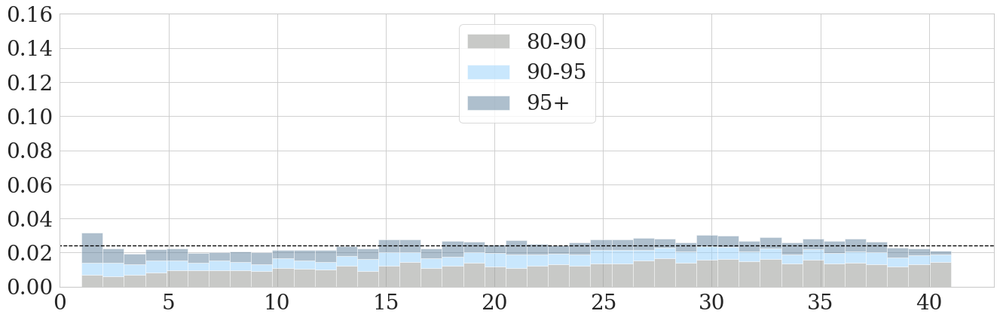

F108 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


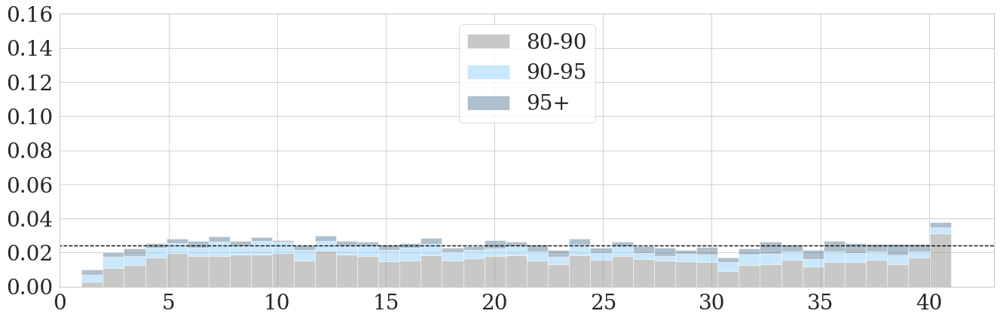

F108 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


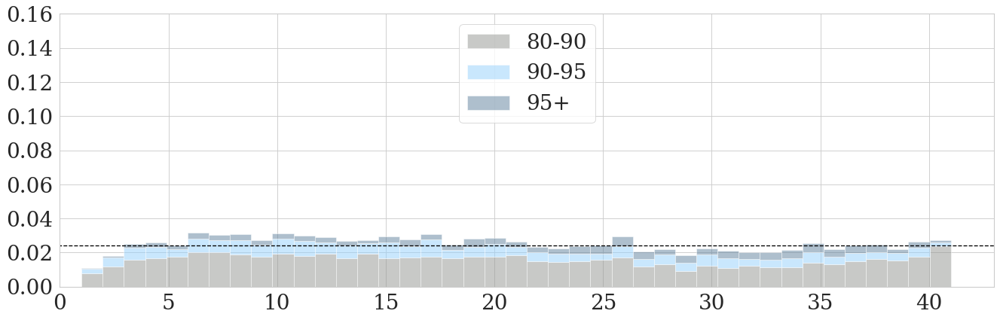

No Post-Processing
2016
2017
2018
these are bounds: [[196.4136413574219, 267.3948040141329], [267.3948040141329, 333.19379376883535], [333.19379376883535, 831.2488736865183]]
F114 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


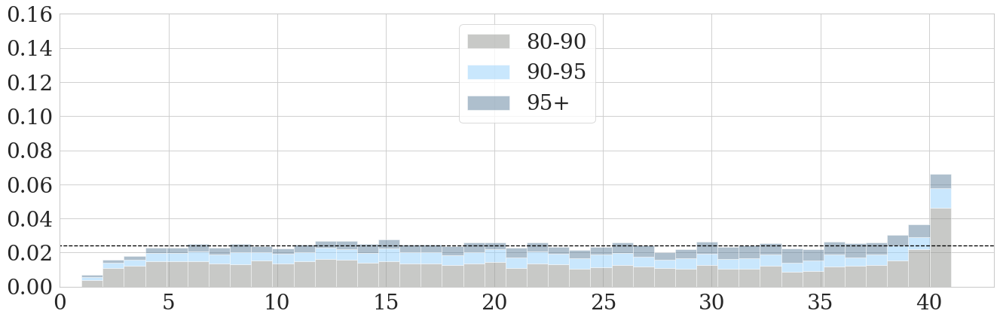

F114 MV_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


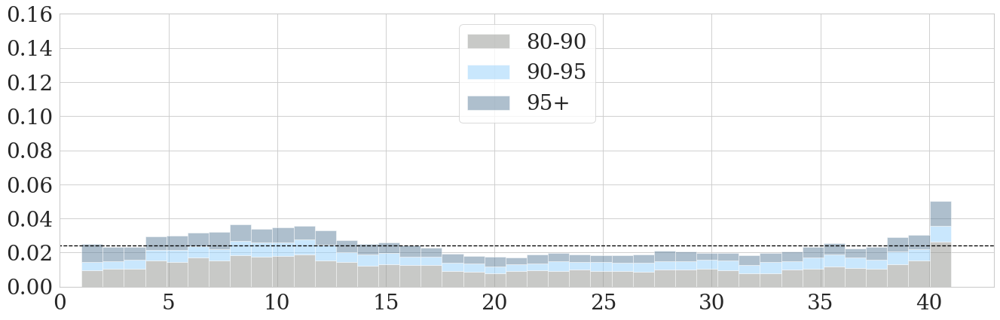

F114 Raw_gefs
No Post-Processing
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


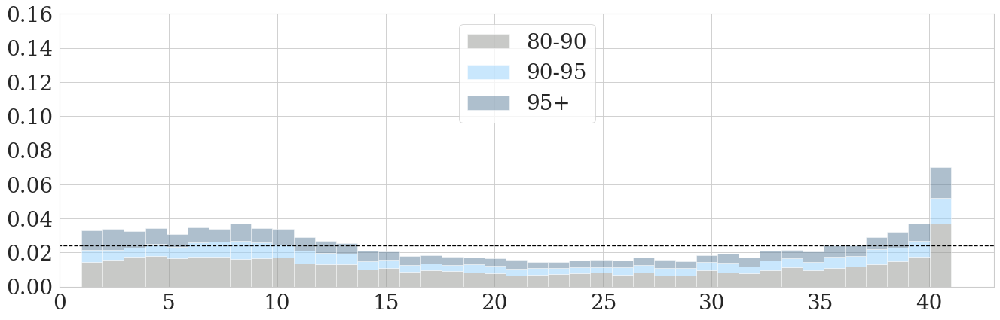

F114 AnEn
2016
2017
2018
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


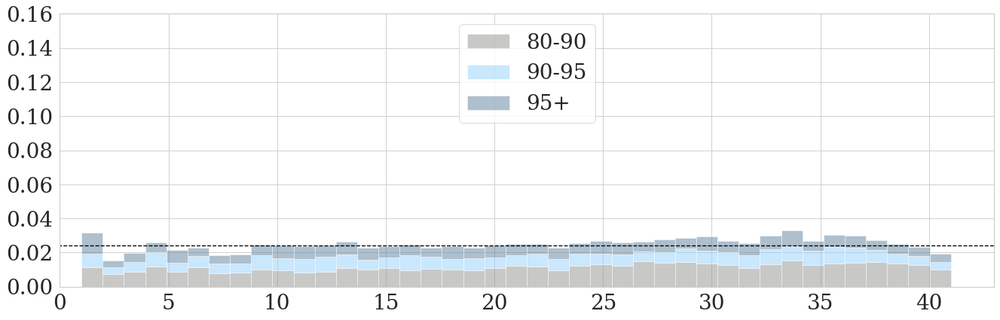

F114 NNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


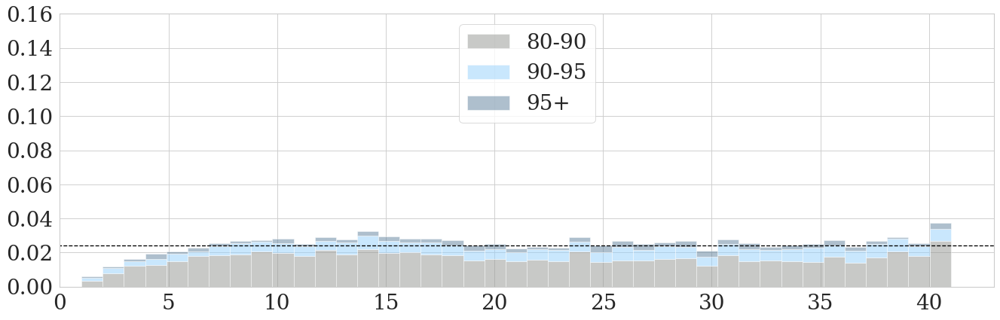

F114 NN_gefs
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


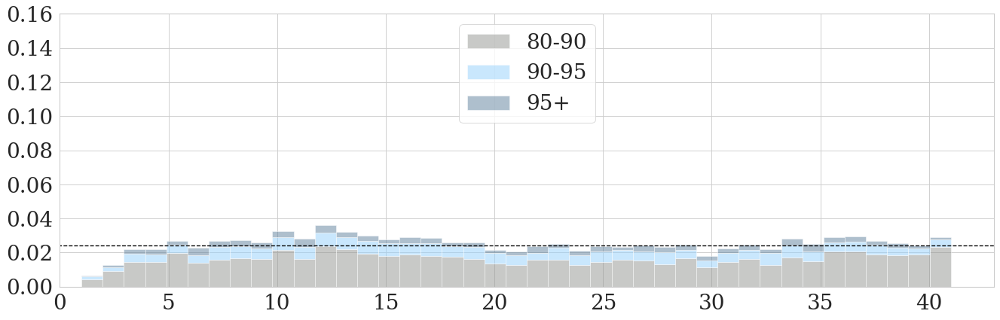

No Post-Processing
2016
2017
2018
these are bounds: [[198.5717442103795, 264.4190826416016], [264.4190826416016, 328.412240010963], [328.412240010963, 787.4815006095188]]
F120 CNNft_ref
computing ranks
computing ties
computing ranks
computing ties
computing ranks
computing ties
making figure... takes FOREVER


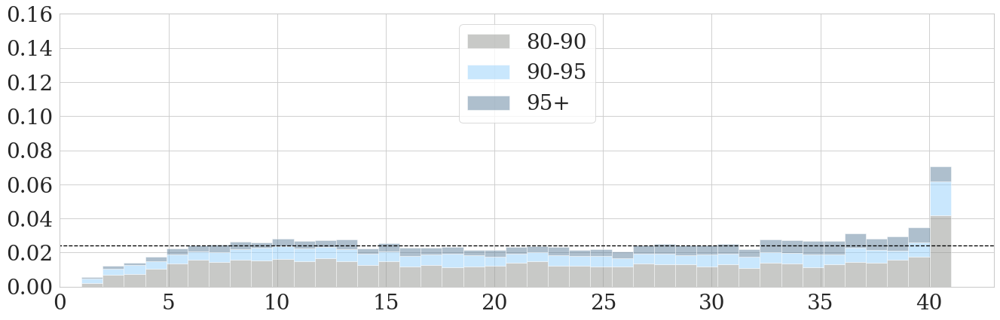

F120 MV_gefs
computing ranks


In [ ]:

ense = 40
bins = ense+1
topy=0.16
##############
    
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
for fcast in fcasts:

    ##############

    ##############
    # calcbounds:

    mods = ['CNNft_ref','MV_gefs','Raw_gefs','AnEn','NNft_ref','NN_gefs']
    utils_verif.load_forecast(fcast,mod)
    pcrt = [np.array([80,90]),np.array([90,95]),np.array([95,100])]

    fortts=np.array([])
    for mod in mods:
        df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
        fortts=np.concatenate([fortts,np.array(Post_m)])
        bounds =[]
        for bb in pcrt:
            bounds.append([np.percentile(fortts,bb[0]),np.percentile(fortts,bb[1])])
    ##############
    print("these are bounds:",bounds)

    
    mod = 'CNNft_ref'
    print(fcast,mod)
    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)



    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_CNNft_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()



    mod = 'MV_gefs'
    print(fcast,mod)
    Thresher=0

    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_MVgefs_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()


    bins = ense+1
    mod = 'Raw_gefs'
    print(fcast,mod)
    Thresher=0

    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_RAWgefs_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()


    bins = ense+1
    mod = 'AnEn'
    print(fcast,mod)
    Thresher=0


    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')
    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_AnEn_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()


    bins = ense+1
    mod = 'NNft_ref'
    print(fcast,mod)
    Thresher=0

    bounds = [[250,350],[350,450],[450,10000]]

    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_NNref_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()
    
    bins = ense+1
    mod = 'NN_gefs'
    print(fcast,mod)
    Thresher=0

    df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

    rr2 = []
    for bb in bounds:
    
        if mod == 'AnEn':
            sss_All=np.array(df.filter(regex='Analog'))
            s_All = Post_s
            m_All = Post_m
            ense = 40
            bins = ense+1
    
        else:
            sss_All = np.zeros([len(Post_m),ense])
            s_All = np.zeros(len(Post_m))
            m_All = np.zeros(len(Post_m))

            for ii in range(len(Post_m)):
                sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
                s_All[ii]=Post_s[ii]
                m_All[ii]=Post_m[ii]
                sss_All[ii,:] =(sss) 
    
            sss_All[sss_All<0]=0

        rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
    print('making figure... takes FOREVER')
    plt.figure(num=None, figsize=RHdict['FigSize'], dpi=80, facecolor='w', edgecolor='k')
    # plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
    plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['80-90','90-95','95+'],color=sns.xkcd_palette(['grey','light blue','greyish blue']))
    plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
    plt.ylim([0,topy])
    plt.xlim([0,bins+2])
    plt.yticks(fontsize=RHdict['tickFS'])
    plt.xticks(fontsize=RHdict['tickFS'])
    plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_NNgefs_'+fcast+'.png',dpi = 300,bbox_inches='tight')
    plt.show()

computing ranks
computing ties
making figure... takes FOREVER


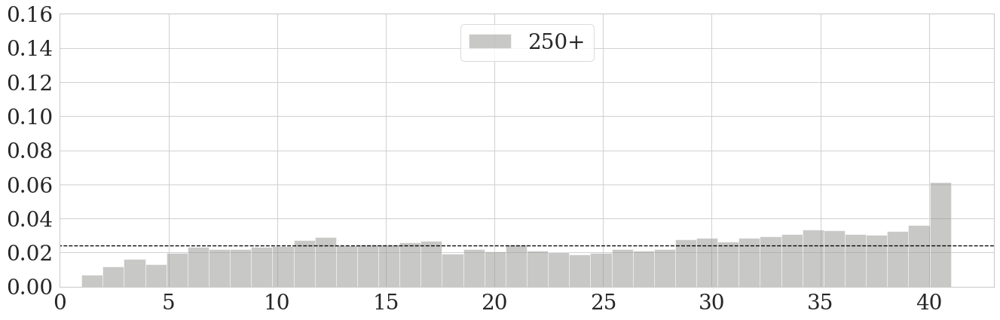

computing ranks
computing ties
making figure... takes FOREVER


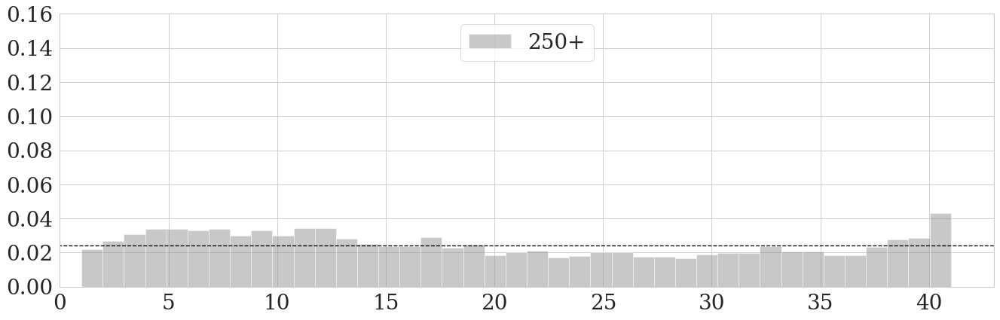

No Post-Processing
computing ranks
computing ties
making figure... takes FOREVER


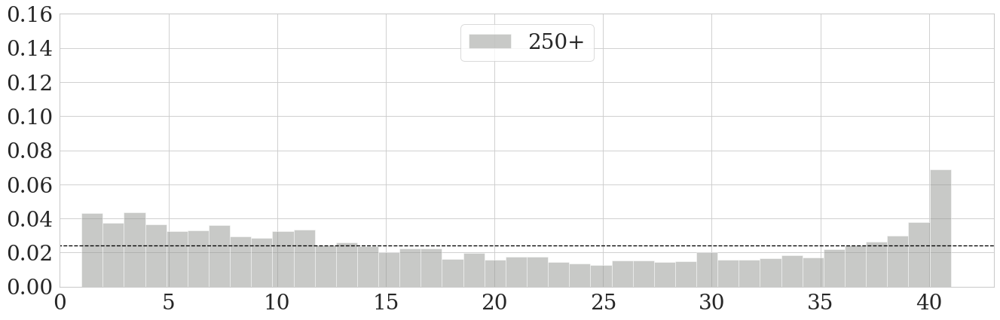

2016
2017
2018
computing ranks
computing ties
making figure... takes FOREVER


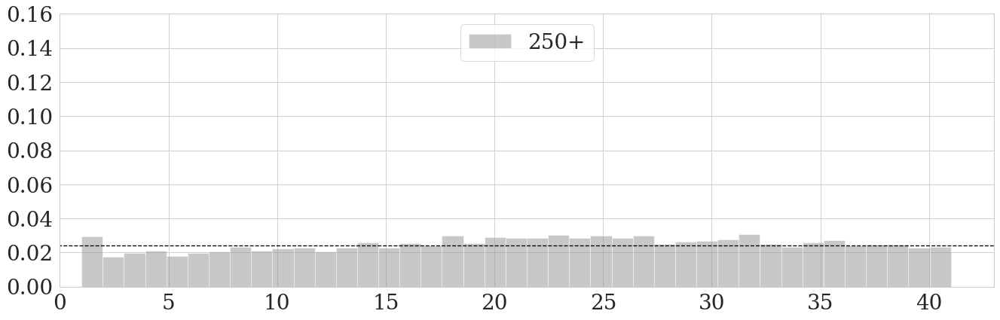

computing ranks
computing ties
making figure... takes FOREVER


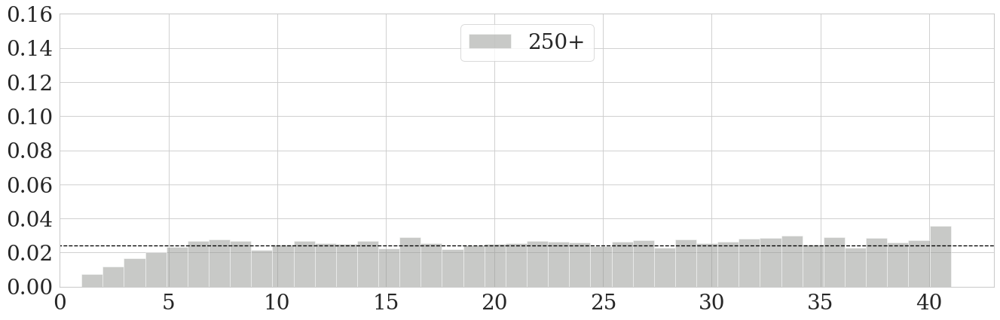

In [201]:
ense = 40
bins = ense+1
fcast='F120'
##############


mod = 'CNNft_ref'
Thresher=0
topy = 0.16
bounds = [[250,10000]]

df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['grey']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')


plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_CNNft_'+fcast+'.png',dpi = 300,bbox_inches='tight')
plt.show()



mod = 'MV_gefs'
Thresher=0


df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['grey']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_MVgefs_'+fcast+'.png',dpi = 300,bbox_inches='tight')
plt.show()


bins = ense+1
mod = 'Raw_gefs'
Thresher=0


df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['grey']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_RAWgefs_'+fcast+'.png',dpi = 300,bbox_inches='tight')
plt.show()


bins = ense+1
mod = 'AnEn'
Thresher=0



df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['grey']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_AnEn_'+fcast+'.png',dpi = 300,bbox_inches='tight')
plt.show()


bins = ense+1
mod = 'NN_ref'
Thresher=0



df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['grey']))
plt.plot([-10,80],[1/(ense+1),1/(ense+1)],'k--')
plt.ylim([0,topy])
plt.xlim([0,bins+2])
plt.yticks(fontsize=RHdict['tickFS'])
plt.xticks(fontsize=RHdict['tickFS'])
plt.legend(fontsize=RHdict['legendFS'],loc='upper center')

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RH_NNref_'+fcast+'.png',dpi = 300,bbox_inches='tight')
plt.show()

computing ranks
computing ties
making figure... takes FOREVER


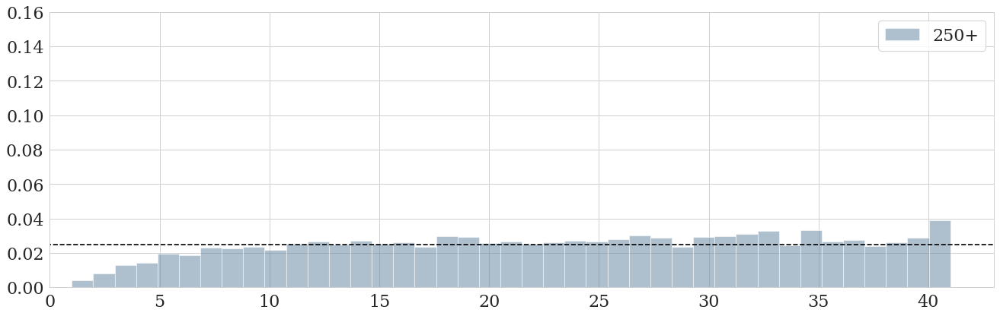

No Post-Processing
computing ranks
computing ties
making figure... takes FOREVER


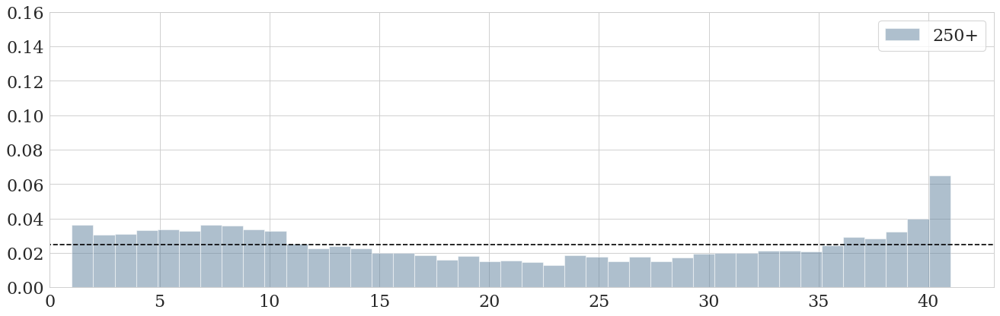

In [245]:
ense = 40
bins = ense+1
fcast='F114'
mod = 'CNN_ref'
Thresher=0

bounds = [[250,1000]]

df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['greyish blue']))
plt.plot([-10,80],[0.025,0.025],'k--')
plt.legend(fontsize=20)
plt.ylim([0,0.16])
plt.xlim([0,bins+2])
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

# # plt.savefig('/glade/scratch/wchapman/Reforecast/models/RankHist_'+fcast+'_ThreshOBS250_ForecastHour.png',dpi = 300,bbox_inches='tight')
plt.show()

ense = 40
bins = ense+1
mod = 'Raw_gefs'
Thresher=0


df,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)

rr2 = []
for bb in bounds:
    
    if mod == 'AnEn':
        sss_All=np.array(df.filter(regex='Analog'))
        s_All = Post_s
        m_All = Post_m
        ense = 40
        bins = ense+1
    
    else:
        sss_All = np.zeros([len(Post_m),ense])
        s_All = np.zeros(len(Post_m))
        m_All = np.zeros(len(Post_m))

        for ii in range(len(Post_m)):
            sss = np.random.normal(Post_m[ii],Post_s[ii],ense)
            s_All[ii]=Post_s[ii]
            m_All[ii]=Post_m[ii]
            sss_All[ii,:] =(sss) 
    
        sss_All[sss_All<0]=0

    rr2.append(utils_verif.ranker(Obs[(m_All>bb[0]) & (m_All<bb[1])],np.transpose(sss_All[(m_All>bb[0]) & (m_All<bb[1])])))
    
print('making figure... takes FOREVER')
plt.figure(num=None, figsize=(20, 6), dpi=80, facecolor='w', edgecolor='k')
# plt.hist(rr,density=True,bins=30,alpha=0.4,label='AnEn')
plt.hist(rr2,bins=bins,density = True,stacked=True,alpha=0.5,label=['250+'],color=sns.xkcd_palette(['greyish blue']))
plt.plot([-10,80],[0.025,0.025],'k--')
plt.legend(fontsize=20)
plt.ylim([0,0.16])
plt.xlim([0,bins+2])
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

# # plt.savefig('/glade/scratch/wchapman/Reforecast/models/RankHist_'+fcast+'_ThreshOBS250_ForecastHour.png',dpi = 300,bbox_inches='tight')
plt.show()

# Reliability Diagrams

In [160]:
LF ,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast('F120','NN_ref')

In [161]:
np.percentile(LF['OBS'],98)

559.6006750488291

doing model: CNNft_ref
Threshold: 258.42
making reliability diagram


100%|██████████| 500/500 [16:44<00:00,  2.01s/it]


computing climatology
computing no skill line


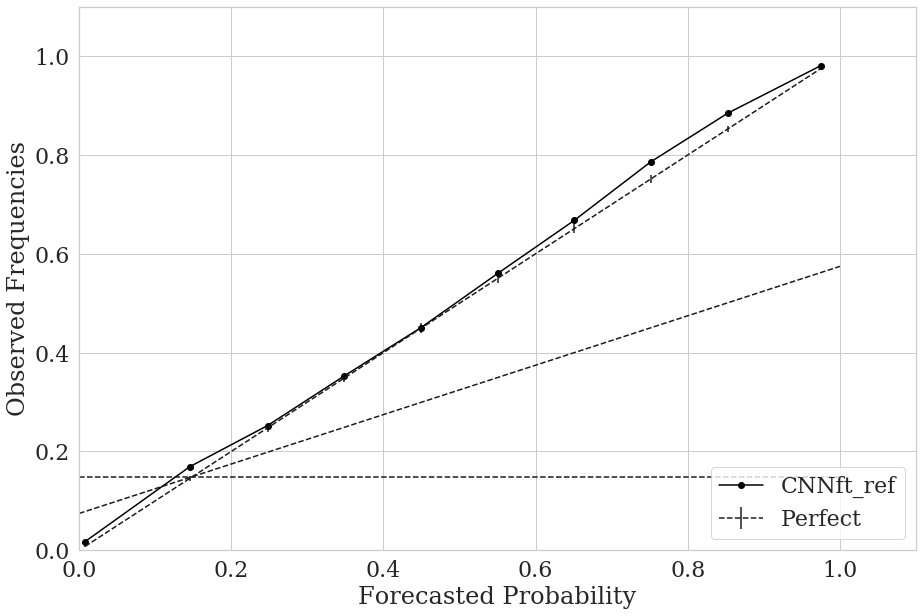

saving:  /glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_CNNft_ref_thresh_258.42_ForecastHour_F000_F072.png


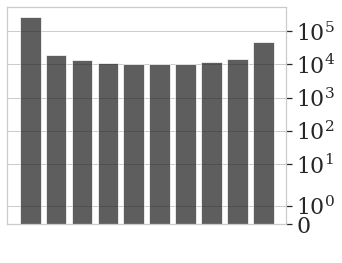

doing model: NN_gefs
Threshold: 258.42
making reliability diagram


100%|██████████| 500/500 [16:19<00:00,  1.96s/it]


computing climatology
computing no skill line


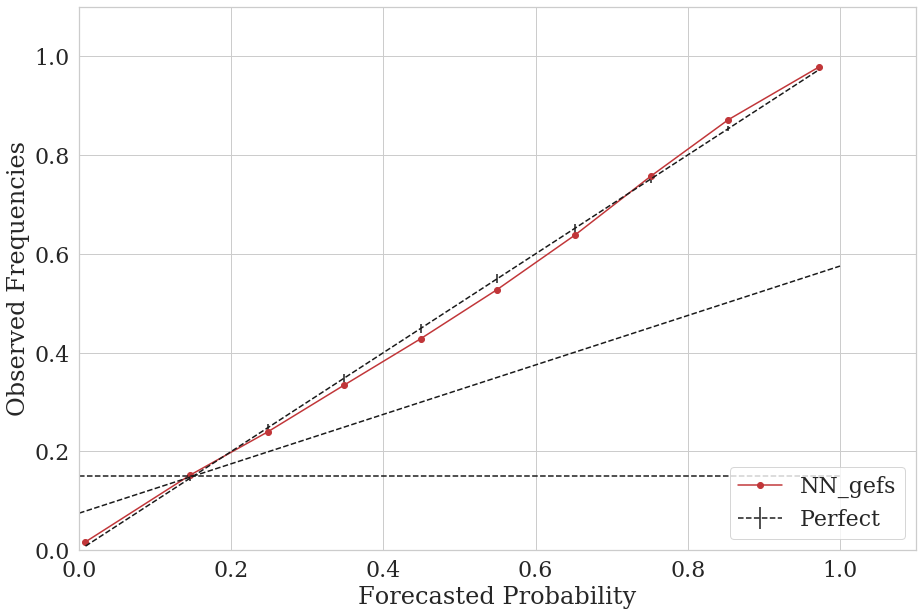

saving:  /glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_NN_gefs_thresh_258.42_ForecastHour_F000_F072.png


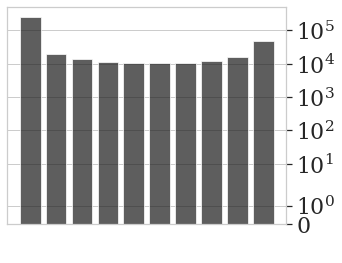

doing model: NN_ref
Threshold: 258.42
making reliability diagram


 55%|█████▌    | 276/500 [08:48<07:10,  1.92s/it]

In [ ]:
mods = ['CNNft_ref','NN_gefs','NN_ref','AnEn','Raw_gefs']
b_siz=0.1
threshes=[258.42,417.94,559.13] #85,95,95
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,78,6)]
for thresh in threshes:
    for mod in mods:
        print('doing model:', mod)
        LF ,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast_concat(fcasts,mod)
#         thresh = np.percentile(Post_m,percy)
#         thresh = 250
        print('Threshold:', thresh)

        if mod == 'AnEn':
            LF["truth"]=1*(LF['OBS']>thresh)
            LF["predicted"]=1*(Post_m>thresh)
            ensems = np.array(LF.filter(regex="Analog"))
            percOthresh = []
            for bb in range(len(LF)):
                percOthresh.append(np.sum(1*(ensems[bb,:]>thresh))/ensems[bb,:].shape[0])

            #concatenate confidences and lat/lon locations
            LF['confidences']=percOthresh
            LF.head()
        else: 
            LF["truth"]=1*(LF['OBS']>thresh)
            LF["predicted"]=1*(Post_m>thresh)
            ff = np.stack([Post_m,Post_s]).T
            percOthresh = utils_verif.prob_ob(thresh,ff[:,0],ff[:,1])
            LF['confidences']=percOthresh

        predictions = LF["predicted"]
        truth = LF["truth"]
        confidences = LF["confidences"]
        print('making reliability diagram')
        [AnEnplot_x,AnEnnew_plot_x, AnEnnew_accs,AnEnlower_bars,AnEnupper_bars]=utils_verif.reliability_diagrams(predictions[0:], truth[0:], confidences[0:],bin_size=b_siz, n_boot=500)
        print('computing climatology')
        climo = np.sum(truth)/truth.shape[0]
        print('computing no skill line')
        pt1 = np.array([climo,climo])
        pt2 = np.array([1,(1+climo)/2])
        slp = (pt2[1]-pt1[1])/(pt2[0]-pt1[0])
        b = pt1[0] - slp*pt1[0]
    
    
        ##plot and save
        sns.set(font_scale=2) 
        sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
        plt.figure(figsize=[15,10])  # inches
        plt.errorbar(AnEnplot_x, AnEnplot_x, yerr=[AnEnlower_bars, AnEnupper_bars], label="Perfect",color='k',linestyle='--')
        plt.plot(AnEnnew_plot_x, AnEnnew_accs, '-o', label=mod, color=SScolors[mod])
        plt.plot([0,1],[climo,climo],'k--')
        plt.plot([0,pt2[0]],[b,pt2[1]],'k--')
        plt.ylim([0,1.1])
        plt.xlim([0,1.1])
        plt.ylabel('Observed Frequencies')
        plt.xlabel('Forecasted Probability')
        plt.legend(loc='lower right')
        # plt.title('AnEn, Threshold: '+str(thresh)+ '; Forecast: ' + fcast)
        plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
        plt.show()
        print('saving: ','/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png')
        upper_bounds = np.arange(1,len(np.arange(b_siz, 1+b_siz, b_siz))+1)
        f= plt.figure(figsize=[5,4])
        ax = f.add_subplot(111)
        plot = plt.bar(upper_bounds, (utils_verif.freq_hist(confidences,bin_size=0.1)),color='k',alpha=0.7)
        ax.grid(False,axis='x')
        plt.yscale('symlog')
        ax.yaxis.tick_right()
        plt.xticks(upper_bounds, " ")
        plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_Hist_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
        plt.show()

doing model: Raw_gefs
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
Threshold: 250
making reliability diagram


100%|██████████| 500/500 [06:25<00:00,  1.30it/s]


computing climatology
computing no skill line


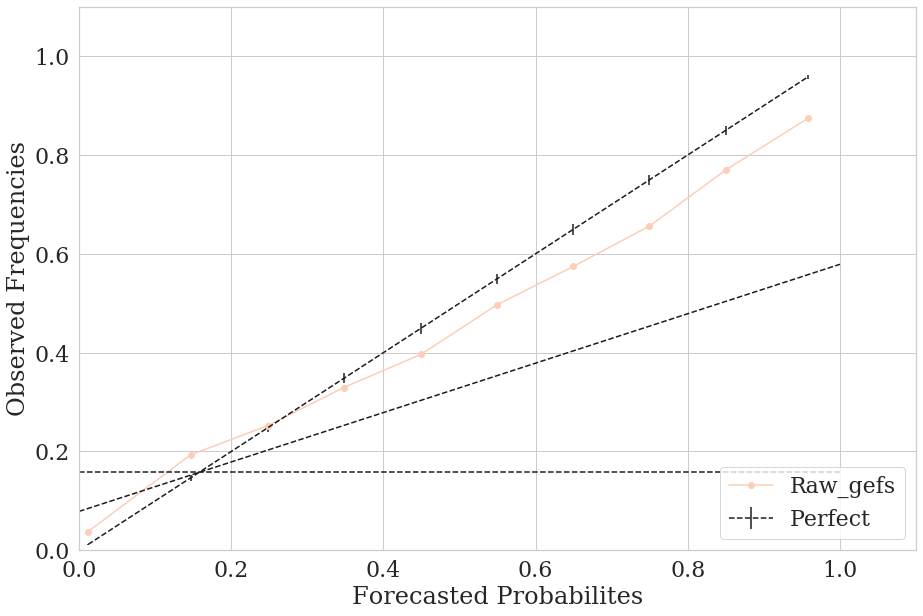

saving:  /glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_Raw_gefs_thresh_250_ForecastHour_F096_F120.png


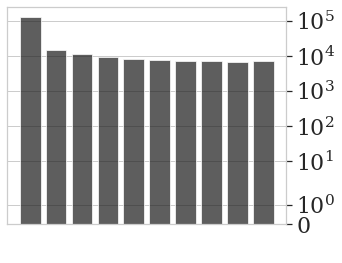

doing model: Raw_gefs
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
Threshold: 500
making reliability diagram


100%|██████████| 500/500 [05:38<00:00,  1.48it/s]


computing climatology
computing no skill line


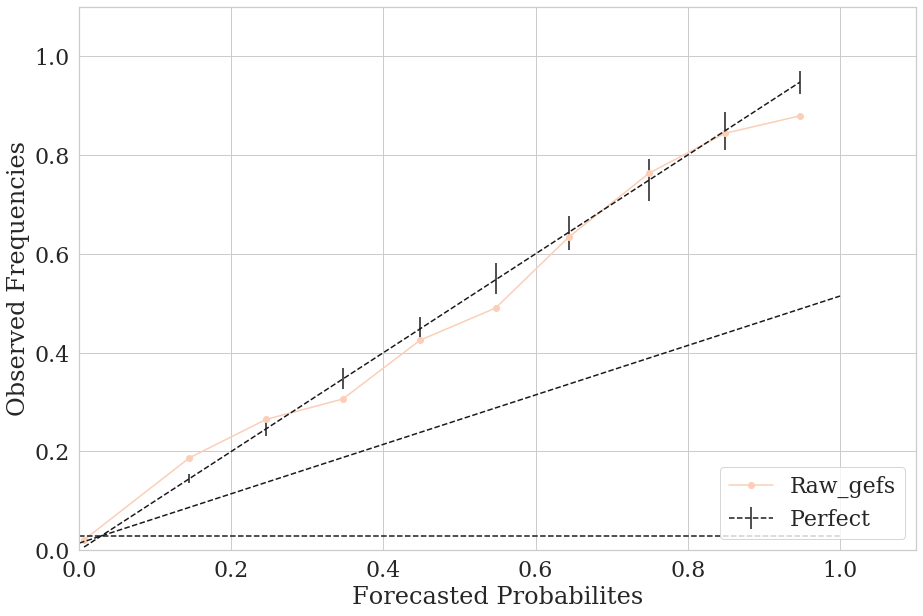

saving:  /glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_Raw_gefs_thresh_500_ForecastHour_F096_F120.png


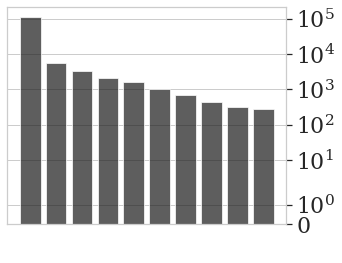

doing model: Raw_gefs
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
No Post-Processing
Threshold: 750
making reliability diagram


100%|██████████| 500/500 [05:28<00:00,  1.52it/s]


computing climatology
computing no skill line


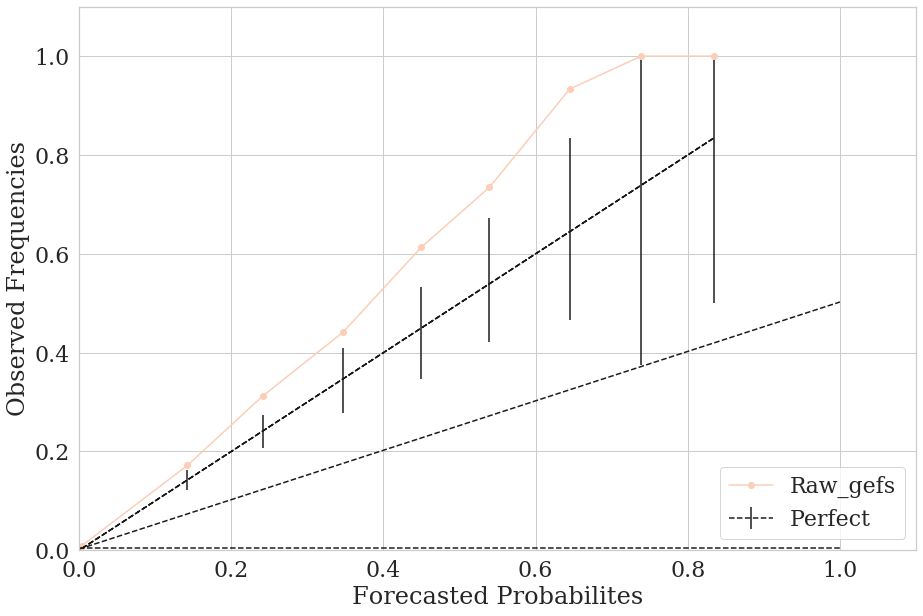

saving:  /glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_Raw_gefs_thresh_750_ForecastHour_F096_F120.png


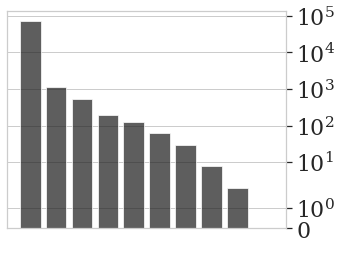

In [54]:
mods = ['Raw_gefs']
b_siz=0.1
threshes=[250,500,750]
fcasts = ['F'+f'{bb:03}' for bb in np.arange(96,126,6)]
for thresh in threshes:
    for mod in mods:
        print('doing model:', mod)
        LF ,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast_concat(fcasts,mod)
#         thresh = np.percentile(Post_m,percy)
#         thresh = 250
        print('Threshold:', thresh)

        if mod == 'AnEn':
            LF["truth"]=1*(LF['OBS']>thresh)
            LF["predicted"]=1*(Post_m>thresh)
            ensems = np.array(LF.filter(regex="Analog"))
            percOthresh = []
            for bb in range(len(LF)):
                percOthresh.append(np.sum(1*(ensems[bb,:]>thresh))/ensems[bb,:].shape[0])

            #concatenate confidences and lat/lon locations
            LF['confidences']=percOthresh
            LF.head()
        else: 
            LF["truth"]=1*(LF['OBS']>thresh)
            LF["predicted"]=1*(Post_m>thresh)
            ff = np.stack([Post_m,Post_s]).T
            percOthresh = utils_verif.prob_ob(thresh,ff[:,0],ff[:,1])
            LF['confidences']=percOthresh

        predictions = LF["predicted"]
        truth = LF["truth"]
        confidences = LF["confidences"]
        print('making reliability diagram')
        [AnEnplot_x,AnEnnew_plot_x, AnEnnew_accs,AnEnlower_bars,AnEnupper_bars]=utils_verif.reliability_diagrams(predictions[0:], truth[0:], confidences[0:],bin_size=b_siz, n_boot=500)
        print('computing climatology')
        climo = np.sum(truth)/truth.shape[0]
        print('computing no skill line')
        pt1 = np.array([climo,climo])
        pt2 = np.array([1,(1+climo)/2])
        slp = (pt2[1]-pt1[1])/(pt2[0]-pt1[0])
        b = pt1[0] - slp*pt1[0]
    
    
        ##plot and save
        sns.set(font_scale=2) 
        sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman'})
        plt.figure(figsize=[15,10])  # inches
        plt.errorbar(AnEnplot_x, AnEnplot_x, yerr=[AnEnlower_bars, AnEnupper_bars], label="Perfect",color='k',linestyle='--')
        plt.plot(AnEnnew_plot_x, AnEnnew_accs, '-o', label=mod, color=SScolors[mod])
        plt.plot([0,1],[climo,climo],'k--')
        plt.plot([0,pt2[0]],[b,pt2[1]],'k--')
        plt.ylim([0,1.1])
        plt.xlim([0,1.1])
        plt.ylabel('Observed Frequencies')
        plt.xlabel('Forecasted Probabilites')
        plt.legend(loc='lower right')
        # plt.title('AnEn, Threshold: '+str(thresh)+ '; Forecast: ' + fcast)
        plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
        plt.show()
        print('saving: ','/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png')
        upper_bounds = np.arange(1,len(np.arange(b_siz, 1+b_siz, b_siz))+1)
        f= plt.figure(figsize=[5,4])
        ax = f.add_subplot(111)
        plot = plt.bar(upper_bounds, (utils_verif.freq_hist(confidences,bin_size=0.1)),color='k',alpha=0.7)
        ax.grid(False,axis='x')
        plt.yscale('symlog')
        ax.yaxis.tick_right()
        plt.xticks(upper_bounds, " ")
        plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_Hist_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
        plt.show()

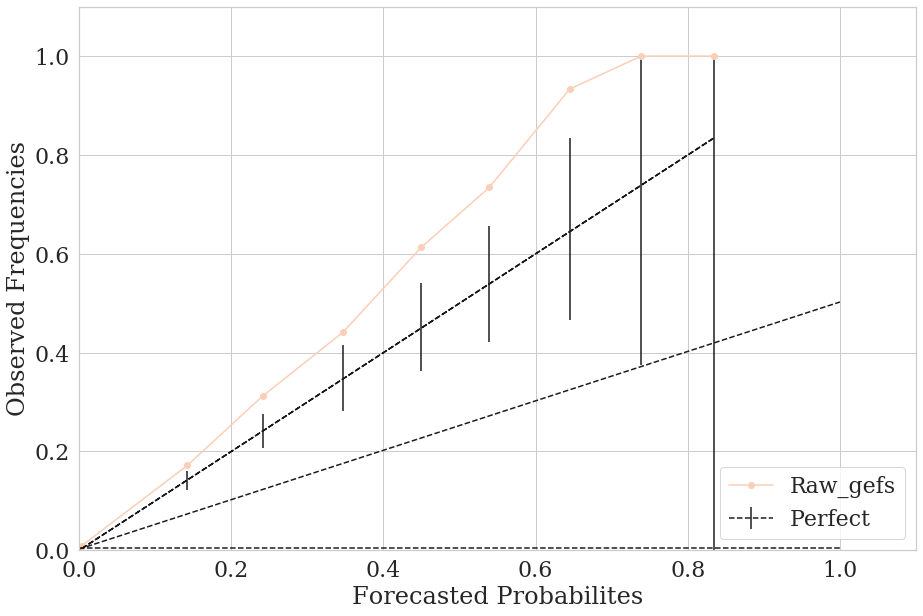

In [52]:
sns.set(font_scale=2) 
sns.set_style('whitegrid', {'font.family':'serif', 'font.serif':'Times New Roman','font_scale':2})
plt.figure(figsize=[15,10])  # inches
plt.errorbar(AnEnplot_x, AnEnplot_x, yerr=[AnEnlower_bars, AnEnupper_bars], label="Perfect",color='k',linestyle='--')
plt.plot(AnEnnew_plot_x, AnEnnew_accs, '-o', label=mod, color=SScolors[mod])
plt.plot([0,1],[climo,climo],'k--')
plt.plot([0,pt2[0]],[b,pt2[1]],'k--')
plt.ylim([0,1.1])
plt.xlim([0,1.1])
plt.ylabel('Observed Frequencies')
plt.xlabel('Forecasted Probabilites')
plt.legend(loc='lower right')
#         # plt.title('AnEn, Threshold: '+str(thresh)+ '; Forecast: ' + fcast)
#         plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Reliability_'+(mod)+'_thresh_'+str(thresh)+'_ForecastHour_'+fcasts[0]+'_'+fcasts[-1]+'.png',dpi = 300,bbox_inches='tight')
plt.show()

# Map of Points:

## Region of interest

In [92]:
stepnum=9

dd = '/glade/scratch/wchapman/Reforecast/'
os.chdir(dd)

yago= next(os.walk('.'))[1]
yago = sorted(yago)
subs = 'F'
res = [ii for ii in yago if subs in ii] 
res
for fcast in res[:stepnum]: 
    os.chdir(dd+'/'+fcast)
    print(os.getcwd())
  
                                                                                                                                               
print('Training on')
path = os.getcwd()
train_file_names = sorted([f for f in glob.glob(path + "/train/*_500mb.nc", recursive=True)])
for f in train_file_names:
    print(f)

print('Validating on')
validate_file_names = sorted([f for f in glob.glob(path + "/validate/*_500mb.nc", recursive=True)])
for f in validate_file_names:
    print(f)
    
print('Testing on')
test_file_names = sorted([f for f in glob.glob(path + "/test/*_500mb.nc", recursive=True)])
for f in test_file_names:
    print(f)
    
All_file_names =train_file_names + validate_file_names +test_file_names 

DS = xr.open_mfdataset(All_file_names)
IVT = DS['IVT'].data
IVTm = DS['IVTm'].data
lat = DS['lat'].data
lon = DS['lon'].data

array([22. , 22.5, 23. , 23.5, 24. , 24.5, 25. , 25.5, 26. , 26.5, 27. ,
       27.5, 28. , 28.5, 29. , 29.5, 30. , 30.5, 31. , 31.5, 32. , 32.5,
       33. , 33.5, 34. , 34.5, 35. , 35.5, 36. , 36.5, 37. , 37.5, 38. ,
       38.5, 39. , 39.5, 40. , 40.5, 41. , 41.5, 42. , 42.5, 43. , 43.5,
       44. , 44.5, 45. , 45.5, 46. , 46.5, 47. , 47.5, 48. , 48.5, 49. ,
       49.5, 50. , 50.5, 51. , 51.5, 52. , 52.5, 53. , 53.5, 54. , 54.5,
       55. , 55.5, 56. , 56.5, 57. , 57.5, 58. , 58.5, 59. , 59.5, 60. ])

2016
2017
2018
...Searching...: /glade/scratch/wchapman/AnEnCNN_good/Data/WestCoast/
number of points: 144


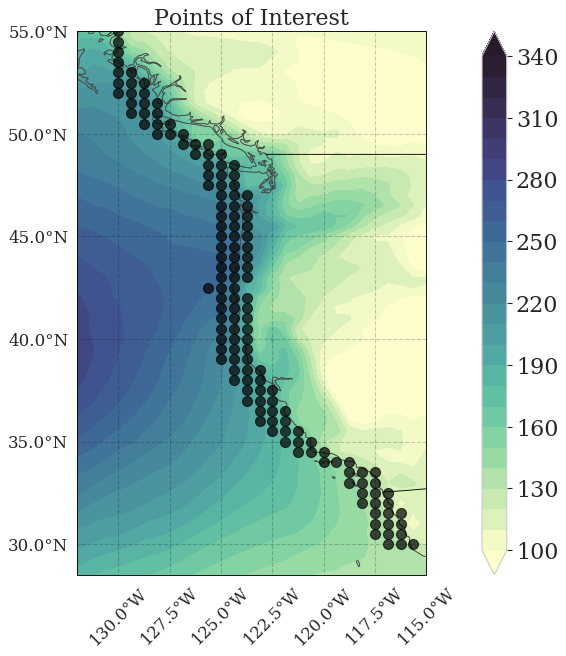

In [300]:
dd = '/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/'
os.chdir(dd)
LeadTime = 'F120'
ENS=40
tot = utilsAnEn.load_picks([2016,2017,2018],LeadTime,ENS)
latlonfolder = '/glade/scratch/wchapman/AnEnCNN_good/Data/WestCoast/'
lat = np.arange(22,60.5,.5)
lon = np.arange(200.0,249.375+.625,.625)
MapPoints = np.zeros([lat.shape[0],lon.shape[0]])
print('...Searching...:',latlonfolder)
path = latlonfolder
pp_file_names = [f for f in glob.glob(path + "/lat*lon*", recursive=True)]
pp_file_names = sorted(pp_file_names)
latp=[]
lonp=[]

for ff in pp_file_names:
    #find the appropriate lat/lon index
    ff2 = ff.split('lat')[1]
    ff3 = (ff2.split('lon'))
    
    latp.append(float(ff3[0]))
    lonp.append(float(ff3[1])-360)
    
#     latfind = float(ff3[0])
#     lonfind = float(ff3[1])
#     indlat= np.where(lat==latfind)[0][0]
#     indlon= np.where(lon==lonfind)[0][0]
#     y_tst = np.array(tot[(tot['lat']==latfind) & (tot['lon']==lonfind)]['OBS'])
#     m = np.array(np.mean(tot[(tot['lat']==latfind) & (tot['lon']==lonfind)].filter(regex='Analog'),axis=1))
#     MapPoints[indlat,indlon] = utilsAnEn.rmse(m,y_tst)
    
# MapPoints[MapPoints==0]=np.nan
print("number of points:", len(pp_file_names))


##################### plotting ###############################

fig = plt.figure(figsize=(18, 9), dpi= 80, facecolor='w', edgecolor='k')
cmap1 = matplotlib.cm.get_cmap("plasma",lut=25)

proj = ccrs.PlateCarree()

ax = plt.subplot(1, 1, 1,projection = proj)

ax.set_xticks(np.linspace(-135,-110, 11), crs=proj)
ax.set_yticks(np.linspace(30, 60, 7), crs=proj)


feature = cf.NaturalEarthFeature(
    name='coastline', category='physical',
    scale='50m',
    edgecolor='#000000', facecolor='none')
ax.add_feature(feature)

feature = cf.NaturalEarthFeature(
    name='land', category='physical',
    scale='50m',
    facecolor="none",alpha=0.3)
ax.add_feature(feature)
ax.add_feature(cf.BORDERS)

# ax.coastlines(resolution='50m')
ax.set_extent([-132, -115, 28.5, 55])

lon_formatter = LongitudeFormatter(number_format='.1f',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(number_format='.1f')
ax.xaxis.set_major_formatter(lon_formatter)
# ax.xaxis.(fontsize=25)
ax.yaxis.set_major_formatter(lat_formatter)
plt.xticks(rotation=45,fontsize=15)
plt.yticks(fontsize=15)

scales = 1
ff =  plt.plot(np.squeeze(lonp),np.squeeze(latp),'ko',markersize=9,alpha=.7)

lat = DS['lat'].data
lon = DS['lon'].data
ff =  plt.contourf(np.squeeze(lon),np.squeeze(lat),RMSEivt,np.arange(100,350,10),extend = 'both',cmap=cmocean.cm.deep)
cc=plt.colorbar()
cc.ax.tick_params(labelsize=20) 

gl = ax.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.2, linestyle='--', draw_labels=False)
gl.xlocator = mticker.FixedLocator(np.linspace(-135,-110, 11))
gl.ylocator = mticker.FixedLocator(np.linspace(20, 60, 9))
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER


plt.title('Points of Interest',fontsize=20)

plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/StatsROI_Points.png',dpi = 300,bbox_inches='tight')
plt.show()
# plt.close('all')

In [274]:
import cartopy.feature as cfeature

In [145]:
stepnum=9

dd = '/glade/scratch/wchapman/Reforecast/'
os.chdir(dd)

yago= next(os.walk('.'))[1]
yago = sorted(yago)
subs = 'F'
res = [ii for ii in yago if subs in ii] 
res
for fcast in res[:stepnum]: 
    os.chdir(dd+'/'+fcast)
    print(os.getcwd())
  
                                                                                                                                               
print('Training on')
path = os.getcwd()
train_file_names = sorted([f for f in glob.glob(path + "/train/*_500mb.nc", recursive=True)])
for f in train_file_names:
    print(f)

print('Validating on')
validate_file_names = sorted([f for f in glob.glob(path + "/validate/*_500mb.nc", recursive=True)])
for f in validate_file_names:
    print(f)
    
print('Testing on')
test_file_names = sorted([f for f in glob.glob(path + "/test/*_500mb.nc", recursive=True)])
for f in test_file_names:
    print(f)
    
All_file_names =train_file_names + validate_file_names +test_file_names 

DS = xr.open_mfdataset(All_file_names)
IVT = DS['IVT'].data
IVTm = DS['IVTm'].data
lat = DS['lat'].data
lon = DS['lon'].data

/glade/scratch/wchapman/Reforecast/F000
/glade/scratch/wchapman/Reforecast/F006
/glade/scratch/wchapman/Reforecast/F012
/glade/scratch/wchapman/Reforecast/F018
/glade/scratch/wchapman/Reforecast/F024
/glade/scratch/wchapman/Reforecast/F030
/glade/scratch/wchapman/Reforecast/F036
/glade/scratch/wchapman/Reforecast/F042
/glade/scratch/wchapman/Reforecast/F048
Training on
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1985_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1986_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1987_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1988_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1989_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1990_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1991_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1992_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1993_500mb.nc
/glade/scratch/w

/glade/scratch/wchapman/Reforecast/F000
/glade/scratch/wchapman/Reforecast/F006
/glade/scratch/wchapman/Reforecast/F012
/glade/scratch/wchapman/Reforecast/F018
/glade/scratch/wchapman/Reforecast/F024
/glade/scratch/wchapman/Reforecast/F030
/glade/scratch/wchapman/Reforecast/F036
/glade/scratch/wchapman/Reforecast/F042
/glade/scratch/wchapman/Reforecast/F048
Training on
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1985_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1986_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1987_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1988_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1989_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1990_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1991_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1992_500mb.nc
/glade/scratch/wchapman/Reforecast/F048/train/F048_WY_1993_500mb.nc
/glade/scratch/w

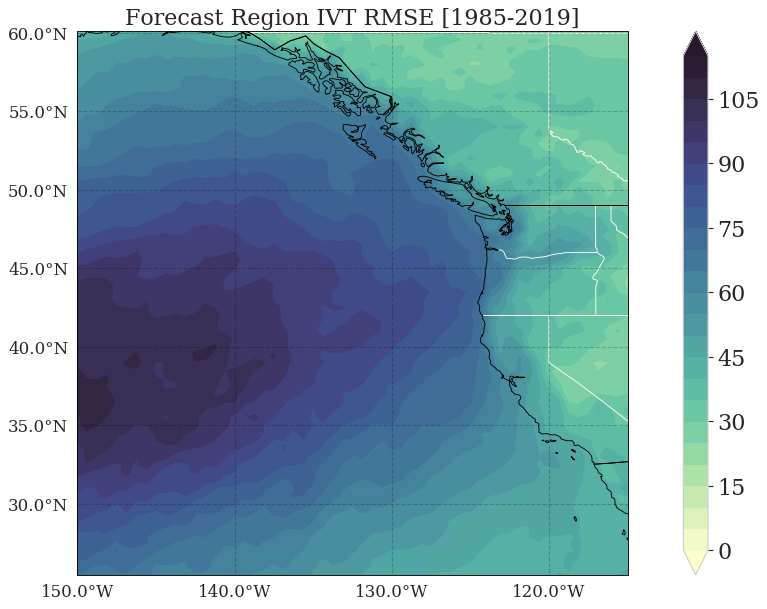

In [292]:
##################### plotting ###############################
##################### plotting ###############################
##################### plotting ###############################
##################### plotting ###############################
##################### plotting ###############################
##################### plotting ###############################

RMSEivt = np.sqrt(np.mean((IVT - IVTm)**2,axis=0))


##################### plotting ###############################

fig = plt.figure(figsize=(18, 9), dpi= 80, facecolor='w', edgecolor='k')
cmap1 = matplotlib.cm.get_cmap("plasma",lut=25)

proj = ccrs.PlateCarree()

ax = plt.subplot(1, 1, 1,projection = proj)
ax.add_feature(cf.BORDERS)
ff =  plt.contourf(np.squeeze(lon),np.squeeze(lat),RMSEivt,np.arange(0,120,5),extend = 'both',cmap=cmocean.cm.deep)
cc=plt.colorbar()
cc.ax.tick_params(labelsize=20) 

ax.set_xticks(np.linspace(-150,-100, 6), crs=proj)
ax.set_yticks(np.linspace(20, 60, 9), crs=proj)
ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines(resolution='50m')
ax.add_feature(cf.BORDERS)
ax.set_extent([-150, -115, 25.5, 59])

lon_formatter = LongitudeFormatter(number_format='.1f',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(number_format='.1f')
ax.xaxis.set_major_formatter(lon_formatter)
# ax.xaxis.(fontsize=25)
ax.yaxis.set_major_formatter(lat_formatter)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)


gl = ax.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.2, linestyle='--', draw_labels=False)
gl.xlocator = mticker.FixedLocator([ -150, -140, -130.,-120.,-110.])
gl.ylocator = mticker.FixedLocator(np.linspace(20, 60, 9))
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# ax.gridlines(draw_labels=False)
plt.title('Forecast Region IVT RMSE [1985-2019]',fontsize=20)
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/RMSE_ROI.png',dpi = 300,bbox_inches='tight')
plt.show()
# plt.close('all')

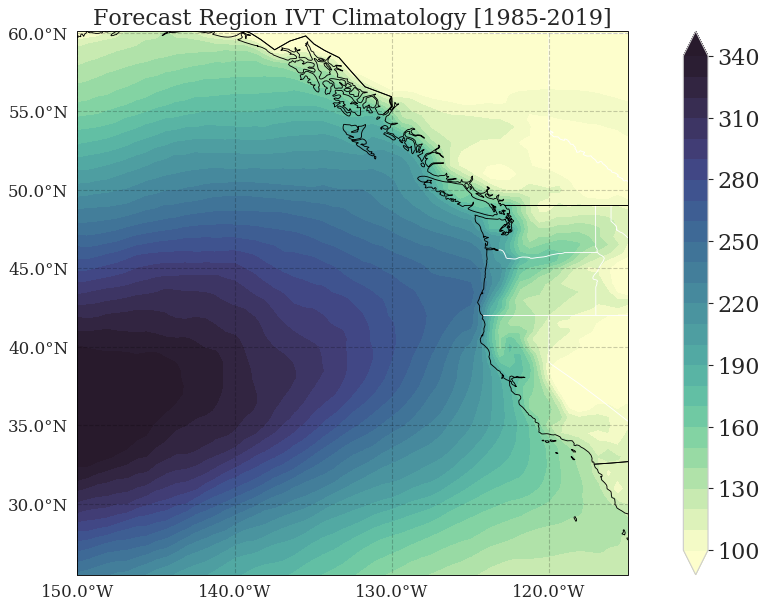

In [293]:
RMSEivt = np.sqrt(np.mean((IVT - IVTm)**2,axis=0))
RMSEivt = np.sqrt(np.mean((IVTm)**2,axis=0))

##################### plotting ###############################

fig = plt.figure(figsize=(18, 9), dpi= 80, facecolor='w', edgecolor='k')
cmap1 = matplotlib.cm.get_cmap("plasma",lut=25)

proj = ccrs.PlateCarree()

ax = plt.subplot(1, 1, 1,projection = proj)
ax.add_feature(cf.BORDERS)
ff =  plt.contourf(np.squeeze(lon),np.squeeze(lat),RMSEivt,np.arange(100,350,10),extend = 'both',cmap=cmocean.cm.deep)
cc=plt.colorbar()
cc.ax.tick_params(labelsize=20) 


ax.set_xticks(np.linspace(-150,-100, 6), crs=proj)
ax.set_yticks(np.linspace(20, 60, 9), crs=proj)
ax.add_feature(cf.NaturalEarthFeature(
               category='cultural',
               name='admin_1_states_provinces_lines',
               scale='50m',
               facecolor='none'))

ax.coastlines(resolution='50m')
ax.add_feature(cf.BORDERS)
ax.set_extent([-150, -115, 25.5, 59])

lon_formatter = LongitudeFormatter(number_format='.1f',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(number_format='.1f')
ax.xaxis.set_major_formatter(lon_formatter)
# ax.xaxis.(fontsize=25)
ax.yaxis.set_major_formatter(lat_formatter)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)


gl = ax.gridlines(crs=ccrs.PlateCarree(), linewidth=1, color='black', alpha=0.2, linestyle='--', draw_labels=False)
gl.xlocator = mticker.FixedLocator([ -150, -140, -130.,-120.,-110.])
gl.ylocator = mticker.FixedLocator(np.linspace(20, 60, 9))
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# ax.gridlines(draw_labels=False)
plt.title('Forecast Region IVT Climatology [1985-2019]',fontsize=20)
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/Climo_ROI.png',dpi = 300,bbox_inches='tight')
plt.show()
# plt.close('all')

## TW AnEn by training year

In [10]:
def ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, len(xs)+1)/float(len(xs))
    return xs, ys

def f_emp(ens,x):
    xs,ys = ecdf(ens)
    vals=[]
    vals = np.zeros([len(x)])
    for bb,xT in enumerate(x):
        if all(xs>xT):
            vals[bb] = 0
        elif (np.sum(1*(xs>xT))>0) & (np.sum(1*(xs>xT))<len(xs)):
            inds = np.searchsorted(xs>xT, 0.5)
            vals[bb] =ys[inds-1]
        else:
            vals[bb] = 1
    return np.array(vals)

def f_emp2(ens,x):
    xs,ys = ecdf(ens)
    dogs = np.searchsorted(xs,x,side='right')
    vals =ys[dogs-1]
    vals[dogs==0]=0
    return np.array(vals)

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
#     print((f_emp(ens,eval_z).shape))
    out = np.sum(w(eval_z)*((f_emp(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out

### computation of threshold-weighted CRPS via numerical approximation suggested by Gneiting & Ranjan (2011)
def twcrps_sample2(y,ens,weight,thr,step_width=0.001):
    #y = real-valued observation (numpy array)
    #ens = vector of ensemble forecasts (numpy array)
    #thr = threshold parameter for weight function
    # weight = charactor vector identifying the employed weight function:
    #     "indicator.right": Indicator weight function for right tail
    #     "indicator.left": Indicator weight function for left tail
    #     "normalCDF.right": Gaussian weight function for right tail, mean = thr, and sd = 1
    #     "normalCDF.left": Gaussian weight function for right tail, mean = thr, and sd = 1
    # lower, upper: bounds for interval of evaluation points
    # step.width: increment of the sequence of evaluation points

    lower = np.min(np.append(ens,y))
    upper = np.max(np.append(ens,y))
    eval_z = np.arange(lower,upper,step_width)
    if weight not in ['indicator.right','indicator.left','normalCDF.right','normalCDF.left']:
        raise ValueError("weight function not specified correctly")
        
    if weight =='indicator.right':
        def w(z):return z>=thr
    elif weight =='indicator.left':
        def w(z):return z<=thr
    elif weight == 'normalCDF.right':
        def w(z):return stats.norm.cdf(z, loc=thr, scale=1)
    elif weight == 'normalCDF.left':
        def w(z):return 1-stats.norm.cdf(z, loc=thr, scale=1)
    
#     print(eval_z.shape)
#     print((f_emp2(ens,eval_z).shape))
    
    out = np.sum(w(eval_z)*((f_emp2(ens,eval_z)-(y<=eval_z)))**2)*(upper-lower)/len(eval_z)
    return out


In [44]:
df2 = utilsAnEn.load_picks_year([2016,2017,2018],fcast,40,yearzz)
df2 = df2.rename(columns={'OBS':'OBSanen2','Model':'Reforecast_AnEn2','IVTmean':'IVTmean_anen2','IVTstd':'IVTstd_anen2'})
df2['AnEn_Mean2'] = np.mean(df2.filter(regex='Analog'),axis=1)
df2['AnEn_std2'] = np.std(df2.filter(regex='Analog'),axis=1)
df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
df2 = df2.drop(columns=df2.filter(regex='Analog').columns[:].tolist())

2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1993.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1993.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1993.pkl


,Fname,Issued_Time,lead_hr,LT,OBSanen2,Reforecast_AnEn2,lat,lon,AnEn_Mean2,AnEn_std2,time
8,/data/downloaded/Forecasts/Machine_Learning/Re...,2016-12-01,F048,8.0,95.1423,89.4911,30.0,243.125,81.132307,24.895366,2016-12-03
29,/data/downloaded/Forecasts/Machine_Learning/Re...,2016-12-02,F048,8.0,134.1406,125.9952,30.0,243.125,103.329392,26.247189,2016-12-04
50,/data/downloaded/Forecasts/Machine_Learning/Re...,2016-12-03,F048,8.0,81.3112,107.6071,30.0,243.125,93.379442,39.542607,2016-12-05
71,/data/downloaded/Forecasts/Machine_Learning/Re...,2016-12-04,F048,8.0,169.1375,170.4673,30.0,243.125,157.750027,36.925185,2016-12-06
92,/data/downloaded/Forecasts/Machine_Learning/Re...,2016-12-05,F048,8.0,238.3809,285.0808,30.0,243.125,240.458447,72.595435,2016-12-07
...,...,...,...,...,...,...,...,...,...,...,...
2444,/data/downloaded/Forecasts/Machine_Learning/Re...,2019-03-27,F048,8.0,17.0106,44.9207,55.0,230.000,42.509285,26.376874,2019-03-29
2465,/data/downloaded/Forecasts/Machine_Learning/Re...,2019-03-28,F048,8.0,17.0514,24.8497,55.0,230.000,32.002677,17.665179,2019-03-30
2486,/data/downloaded/Forecasts/Machine_Learning/Re...,2019-03-29,F048,8.0,20.6277,33.9165,55.0,230.000,36.258893,25.557425,2019-03-31
2507,/data/downloaded/Forecasts/Machine_Learning/Re...,2019-03-30,F048,8.0,21.4029,28.4411,55.0,230.000,31.361308,16.533697,2019-04-01


doing: F000
2016
2017
2018
this is the threshold: 561.0354904105002 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F000
2016
2017
2018
this is the threshold: 561.0354904105002 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F000
2016
2017
2018
this is the threshold: 561.0354904105002 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

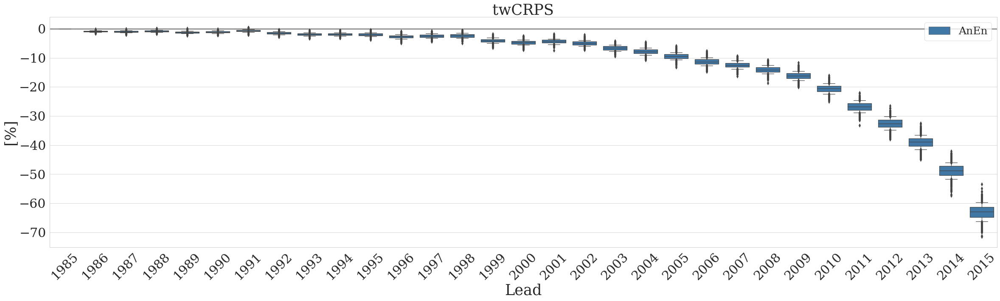

doing: F006
2016
2017
2018
this is the threshold: 559.475270961 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F006
2016
2017
2018
this is the threshold: 559.475270961 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F006
2016
2017
2018
this is the threshold: 559.475270961 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doing: F006
2016

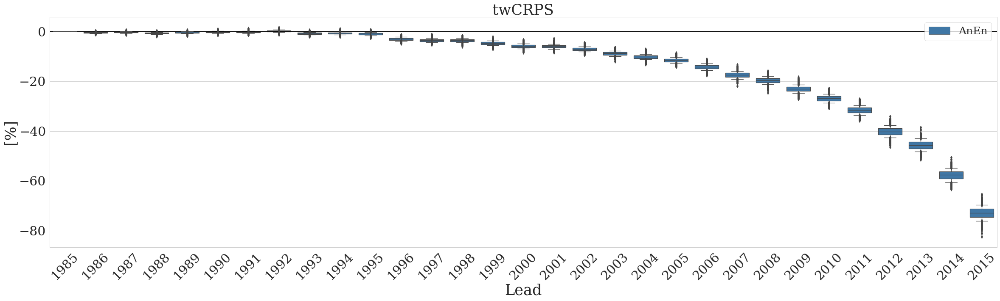

doing: F012
2016
2017
2018
this is the threshold: 566.7427872450004 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F012
2016
2017
2018
this is the threshold: 566.7427872450004 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F012
2016
2017
2018
this is the threshold: 566.7427872450004 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

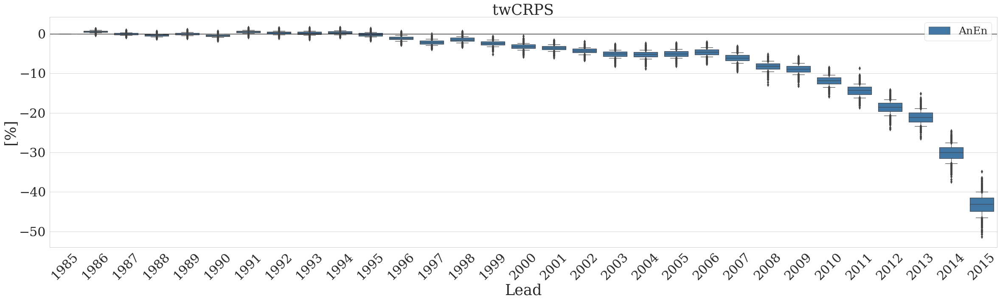

doing: F018
2016
2017
2018
this is the threshold: 548.0549609675 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F018
2016
2017
2018
this is the threshold: 548.0549609675 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F018
2016
2017
2018
this is the threshold: 548.0549609675 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doing: F018
2

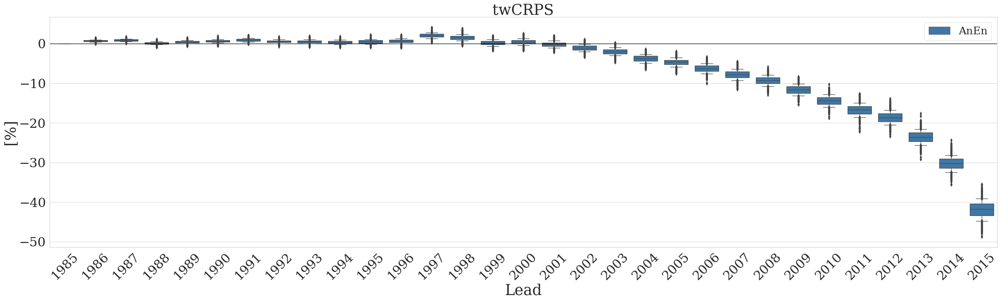

doing: F024
2016
2017
2018
this is the threshold: 562.4246465275003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F024
2016
2017
2018
this is the threshold: 562.4246465275003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F024
2016
2017
2018
this is the threshold: 562.4246465275003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

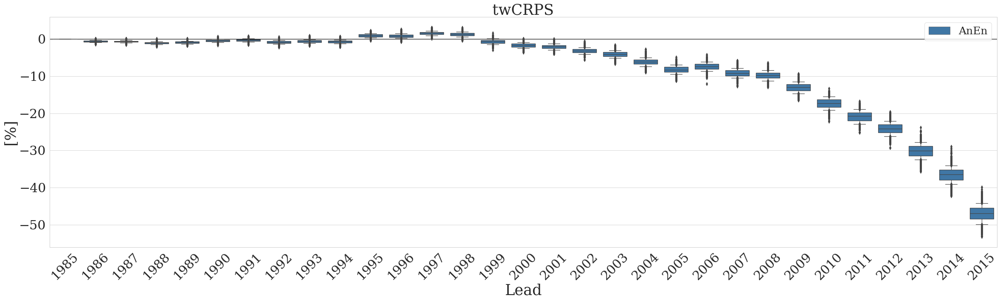

doing: F030
2016
2017
2018
this is the threshold: 546.3193501350007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F030
2016
2017
2018
this is the threshold: 546.3193501350007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F030
2016
2017
2018
this is the threshold: 546.3193501350007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

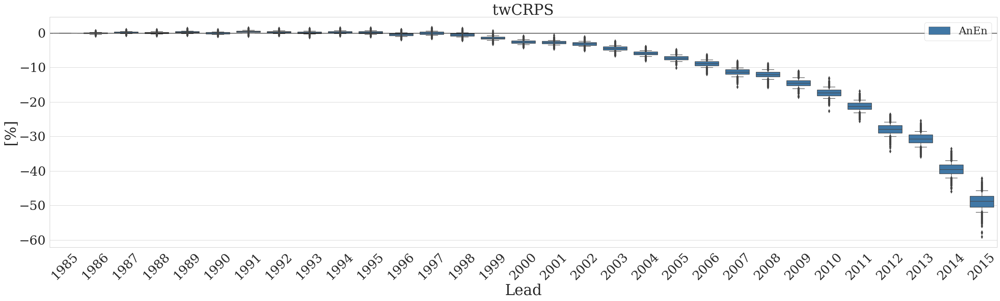

doing: F036
2016
2017
2018
this is the threshold: 560.7745201600003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F036
2016
2017
2018
this is the threshold: 560.7745201600003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F036
2016
2017
2018
this is the threshold: 560.7745201600003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

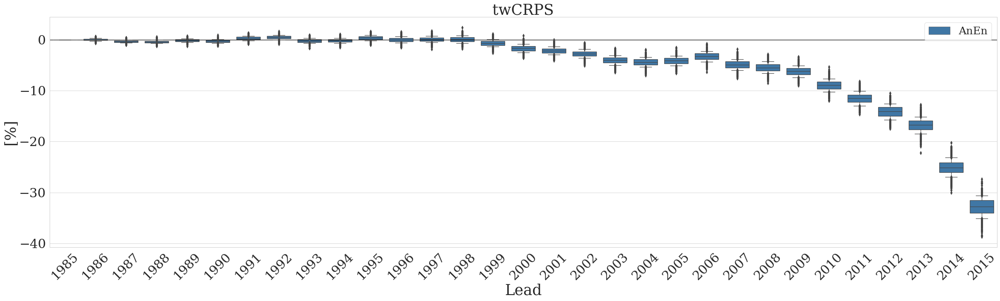

doing: F042
2016
2017
2018
this is the threshold: 541.8420261355 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F042
2016
2017
2018
this is the threshold: 541.8420261355 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F042
2016
2017
2018
this is the threshold: 541.8420261355 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doing: F042
2

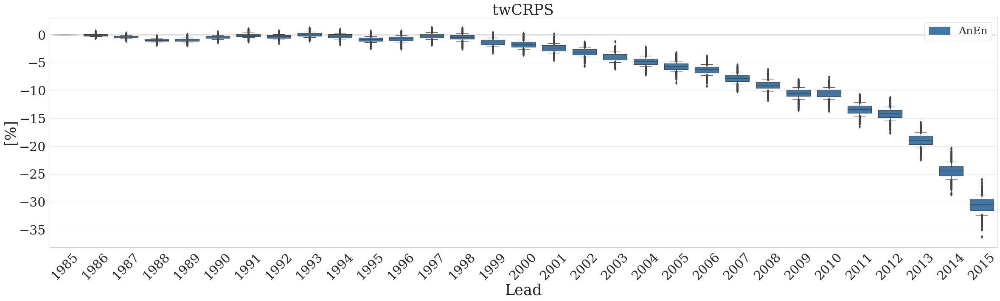

doing: F048
2016
2017
2018
this is the threshold: 542.6057492840007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F048
2016
2017
2018
this is the threshold: 542.6057492840007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F048
2016
2017
2018
this is the threshold: 542.6057492840007 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

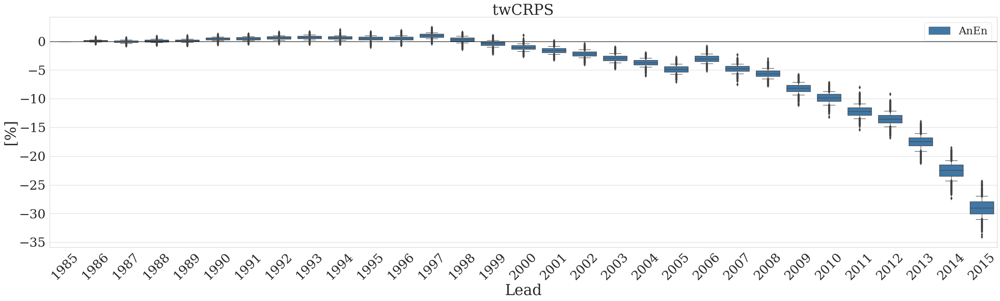

doing: F054
2016
2017
2018
this is the threshold: 530.9737153190001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F054
2016
2017
2018
this is the threshold: 530.9737153190001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F054
2016
2017
2018
this is the threshold: 530.9737153190001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

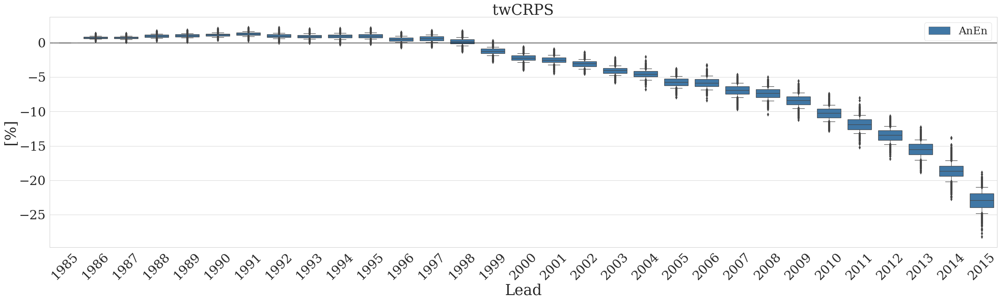

doing: F060
2016
2017
2018
this is the threshold: 534.6011006165003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F060
2016
2017
2018
this is the threshold: 534.6011006165003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F060
2016
2017
2018
this is the threshold: 534.6011006165003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

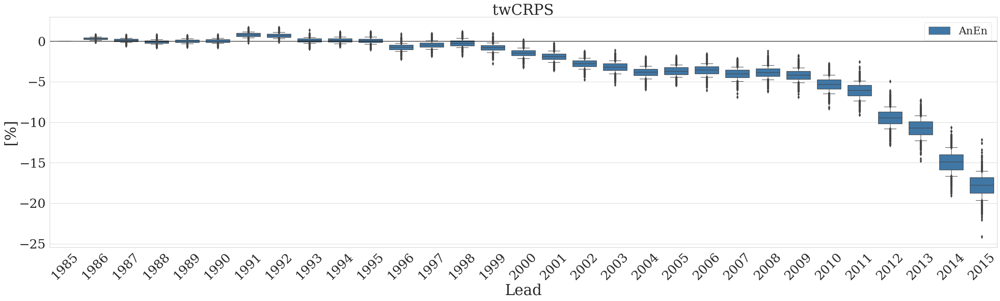

doing: F066
2016
2017
2018
this is the threshold: 526.8745617335001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F066
2016
2017
2018
this is the threshold: 526.8745617335001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F066
2016
2017
2018
this is the threshold: 526.8745617335001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

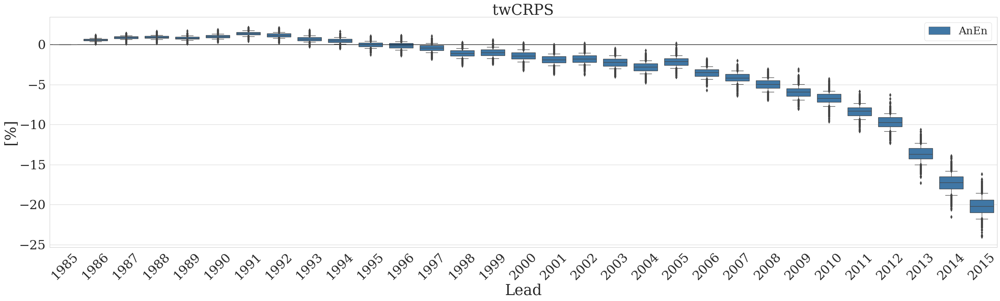

doing: F072
2016
2017
2018
this is the threshold: 503.0252022610001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F072
2016
2017
2018
this is the threshold: 503.0252022610001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F072
2016
2017
2018
this is the threshold: 503.0252022610001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

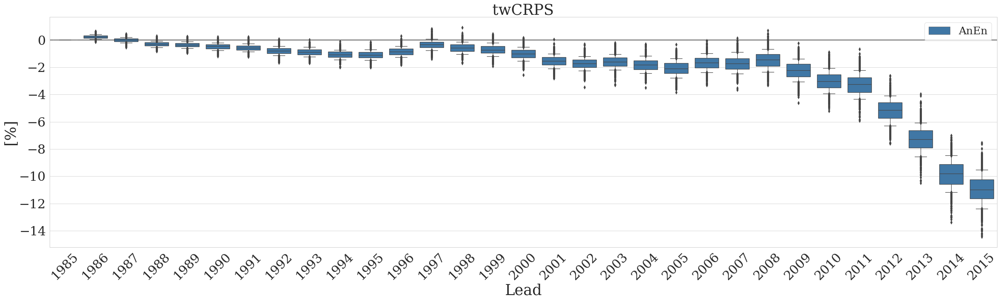

doing: F078
2016
2017
2018
this is the threshold: 493.46076816950006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F078
2016
2017
2018
this is the threshold: 493.46076816950006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F078
2016
2017
2018
this is the threshold: 493.46076816950006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

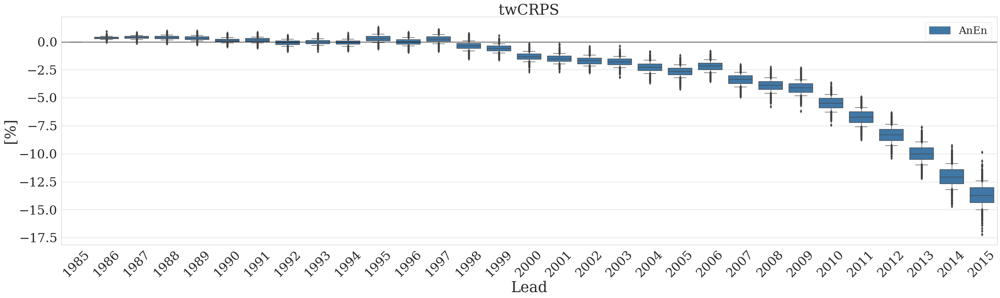

doing: F084
2016
2017
2018
this is the threshold: 489.77977381300036 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F084
2016
2017
2018
this is the threshold: 489.77977381300036 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F084
2016
2017
2018
this is the threshold: 489.77977381300036 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

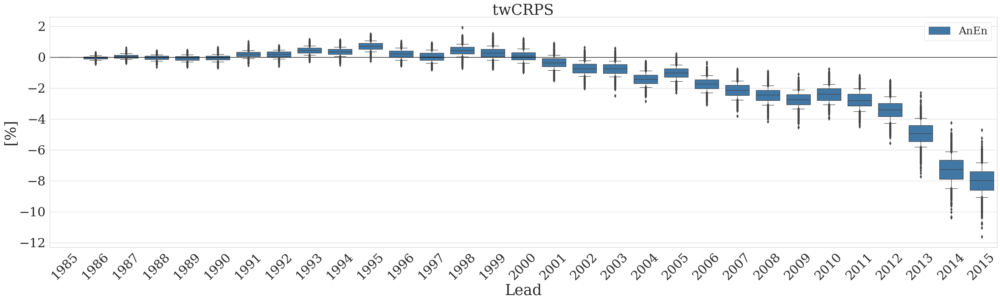

doing: F090
2016
2017
2018
this is the threshold: 465.16350430500006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F090
2016
2017
2018
this is the threshold: 465.16350430500006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F090
2016
2017
2018
this is the threshold: 465.16350430500006 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

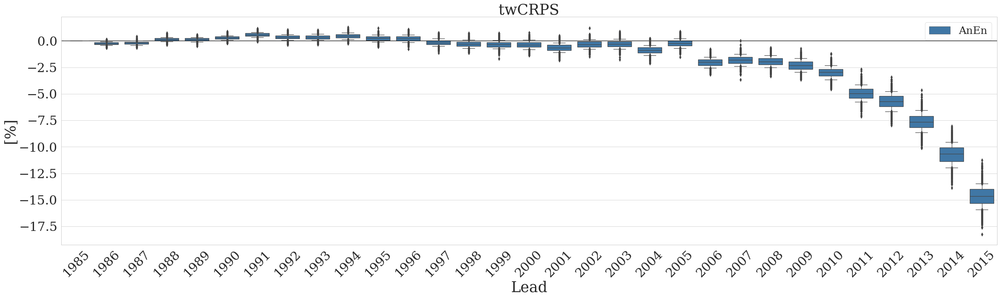

doing: F096
2016
2017
2018
this is the threshold: 460.25435387650003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F096
2016
2017
2018
this is the threshold: 460.25435387650003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F096
2016
2017
2018
this is the threshold: 460.25435387650003 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

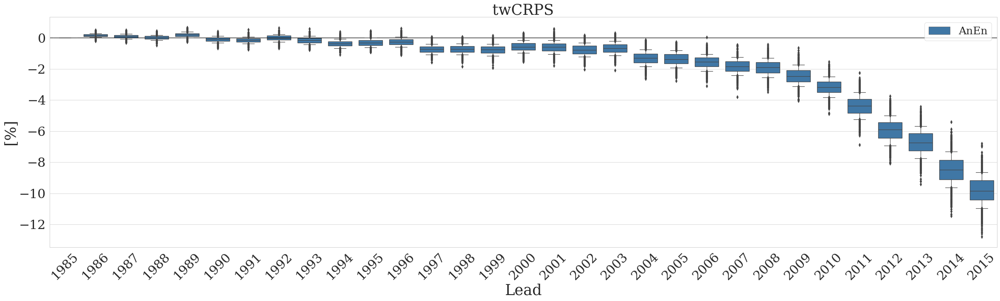

doing: F102
2016
2017
2018
this is the threshold: 454.3951599022505 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F102
2016
2017
2018
this is the threshold: 454.3951599022505 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F102
2016
2017
2018
this is the threshold: 454.3951599022505 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

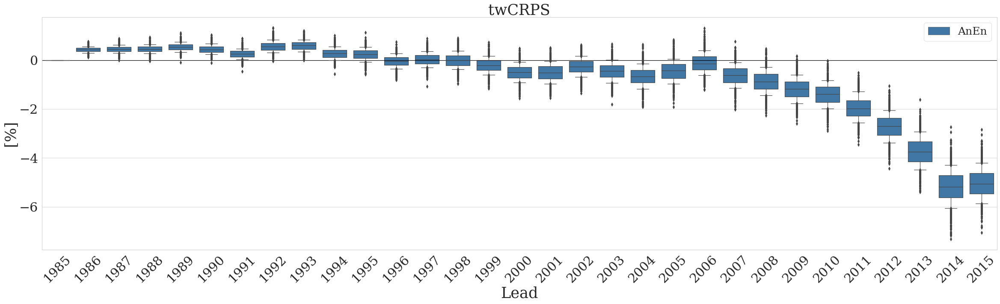

doing: F108
2016
2017
2018
this is the threshold: 454.0281718545001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F108
2016
2017
2018
this is the threshold: 454.0281718545001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F108
2016
2017
2018
this is the threshold: 454.0281718545001 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
doin

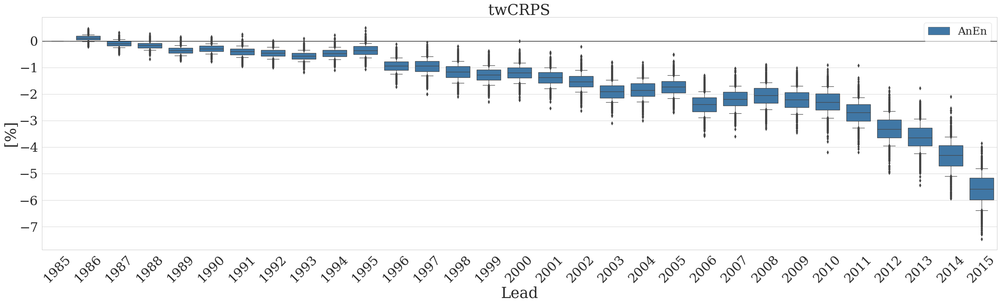

doing: F114
2016
2017
2018
this is the threshold: 419.38977166900054 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F114
2016
2017
2018
this is the threshold: 419.38977166900054 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F114
2016
2017
2018
this is the threshold: 419.38977166900054 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

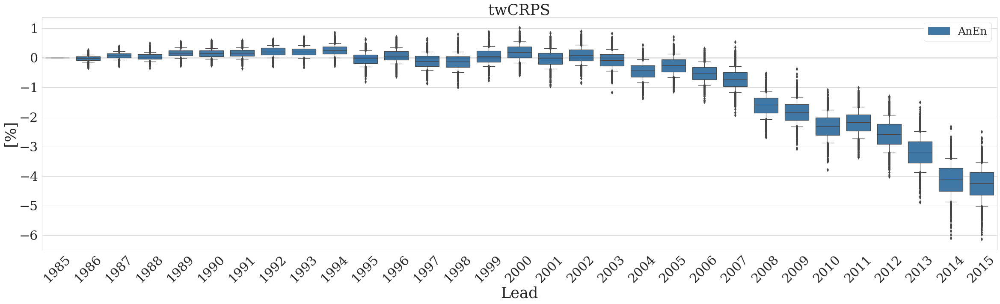

doing: F120
2016
2017
2018
this is the threshold: 398.19643983400044 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1985.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1985.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1985.pkl
calc tw-crps
...boostrapping....
doing: F120
2016
2017
2018
this is the threshold: 398.19643983400044 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1986.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1986.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1986.pkl
calc tw-crps
...boostrapping....
doing: F120
2016
2017
2018
this is the threshold: 398.19643983400044 for a percentile: 98
2016
2017
2018
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1987.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1987.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1987.pkl
calc tw-crps
...boostrapping....
d

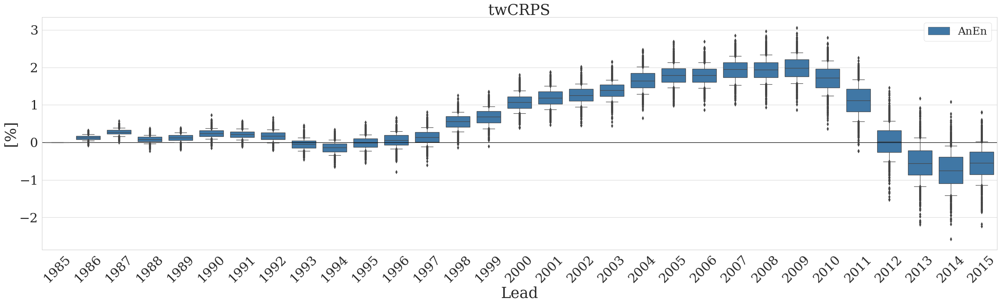

In [141]:
percy = 98
yearstot = np.arange(1985,2016,1)
training_years = np.arange(31,0,-1)
dffin=pd.DataFrame({'Training Years':[],'Model':[],'CRPS':[]})
df2,df4,dfm=1,1,1
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
bsnummy = 1000
ense = 100


for fcast in fcasts:
    dffin=pd.DataFrame({'Training Years':[],'Model':[],'CRPS':[]})
    for indyy,yearz in enumerate(yearstot): 
        del df2
        del df4 
        
        print('doing:',fcast)
        fortts=np.array([])
        mods = ['AnEn']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = np.percentile(fortts,percy)
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        
        mod = 'AnEn'
        df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df4 = df4.rename(columns={'OBS':'OBSanen','Model':'Reforecast_AnEn','IVTmean':'IVTmean_anen','IVTstd':'IVTstd_anen'})
        df4['AnEn_Mean'] = np.mean(df4.filter(regex='Analog'),axis=1)
        df4['AnEn_std'] = np.std(df4.filter(regex='Analog'),axis=1)
        df4['time']= df4['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
        
        df2 = utilsAnEn.load_picks_year([2016,2017,2018],fcast,40,yearz)
        df2 = df2.rename(columns={'OBS':'OBSanen2','Model':'Reforecast_AnEn2','IVTmean':'IVTmean_anen2','IVTstd':'IVTstd_anen2'})
        df2['AnEn_Mean2'] = np.mean(df2.filter(regex='Analog'),axis=1)
        df2['AnEn_std2'] = np.std(df2.filter(regex='Analog'),axis=1)
        df2['time']= df2['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
    
        #define 4 groups:        
        Ensembla = np.array(df4.filter(regex='Analog'))
        Trutha = np.array(df4['AnEn_Mean'])
        Merraa = np.array(df4['OBSanen'])
        
        Ensembla2 = np.array(df2.filter(regex='Analog'))
        Trutha2 = np.array(df2['AnEn_Mean2'])
        Merraa2 = np.array(df2['OBSanen2'])
        
        CRPStempa = np.zeros((Merraa.shape[0]))
        CRPStempa2 = np.zeros((Merraa2.shape[0]))
    
        print('calc tw-crps')

        for gre in range(0,Merraa.shape[0]):    
            if np.max(np.append(Merraa[gre],Ensembla[gre,:]))<=threshold:
                CRPStempa[gre] = 0
            else:
                CRPStempa[gre] = twcrps_sample2(Merraa[gre],Ensembla[gre,:],'indicator.right',threshold,step_width=10)
    
    
        for gre in range(0,Merraa2.shape[0]):    
            if np.max(np.append(Merraa2[gre],Ensembla2[gre,:]))<=threshold:
                CRPStempa2[gre] = 0
            else:
                CRPStempa2[gre] = twcrps_sample2(Merraa2[gre],Ensembla2[gre,:],'indicator.right',threshold,step_width=10)
    
    
        print("...boostrapping....")
#     bootstrap randomdraws:
        CRPSanen_ref = np.zeros(bsnummy)
        CRPSanen_ref2 = np.zeros(bsnummy)
        
        
        for bb in range(bsnummy):
            inss = np.random.randint(Merraa2.shape[0], size=Merraa2.shape[0])
            CRPSanen_ref[bb] = (1 - (np.mean(CRPStempa2[inss])/np.mean(CRPStempa[inss])))*100
#             CRPSanen_ref[bb] = np.mean(CRPStempa[inss])
#             CRPSanen_ref2[bb] = ((np.mean(CRPStempa2[inss])))
            
#             CRPSanen_ref[bb] = (1 - (np.mean(CRPStempa2[inss])/np.mean(CRPStempa[inss])))*100
#             CRPSanen_ref[bb] = np.mean(CRPStempa2[inss])
    
        
        #define 3 groups:  
    
        dftemp = pd.DataFrame({'CRPS':CRPSanen_ref})
        dftemp['Training Years'] = str(yearz)
        dftemp['Model'] = 'AnEn'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,35],[0,0],'k')

    ax = sns.boxplot(x="Training Years", y="CRPS", hue="Model",data=dffin,palette=mycolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    plt.xticks(fontsize=BPdict['tickFS'],rotation=45)
    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Lead',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
    plt.title('twCRPS',fontsize=BPdict['titleFS'])
    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_AnEn_By_Year_'+fcast+'_Perc_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
    plt.show() 
        
        
        

# for bb in np.arange(-0.5,22,1):
#     plt.plot([bb,bb],[-.6,.2],'k--')

# plt.ylim([-.15,.21])
# plt.xlim([-0.5,10.5])
# plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()
        
        
        
#         dftemp = pd.DataFrame({'CRPS':CRPSanen_ref2})
#         dftemp['Training Years'] = str(yearz)
#         dftemp['Model'] = 'AnEn_year'
#         dffin = pd.concat([dffin, dftemp], axis=0)
#         print('...done...')

#     plt.figure(figsize=BPdict['FigSize'])
#     plt.plot([-10,23],[0,0],'k')

#     ax = sns.boxplot(x="Lead", y="CRPS", hue="Model",data=dffin, palette=mycolors,whis=[10, 90])
#     plt.yticks(fontsize=BPdict['tickFS'])
#     plt.xticks(fontsize=BPdict['tickFS'])
#     plt.ylabel('[%]',fontsize=BPdict['labelFS'])
#     plt.xlabel('Lead',fontsize=BPdict['labelFS'])
#     plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
#     plt.title('twCRPS',fontsize=BPdict['titleFS'])

#     for bb in np.arange(-0.5,22,1):
#         plt.plot([bb,bb],[-.6,.2],'k--')

#     plt.ylim([-.15,.21])
#     plt.xlim([-0.5,10.5])
#     plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

#     plt.show()




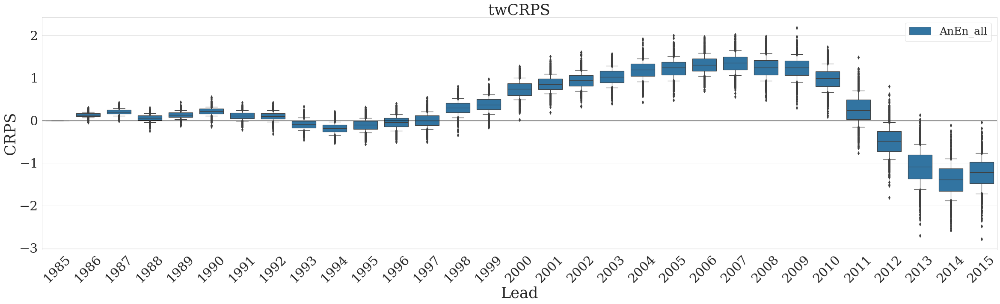

In [130]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,35],[0,0],'k')

ax = sns.boxplot(x="Training Years", y="CRPS", hue="Model",data=dffin,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
plt.xticks(fontsize=BPdict['tickFS'],rotation=45)
plt.ylabel('CRPS',fontsize=BPdict['labelFS'])
plt.xlabel('Lead',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='upper right')
plt.title('twCRPS',fontsize=BPdict['titleFS'])

# for bb in np.arange(-0.5,22,1):
#     plt.plot([bb,bb],[-.6,.2],'k--')

# plt.ylim([-.15,.21])
# plt.xlim([-0.5,10.5])
# plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_percentile'+str(percy)+'.png',dpi = 300,bbox_inches='tight')

plt.show()

In [6]:
yearz = "1988"
fcast = "F048"
df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_CNN.load_NN_forecast(fcast,yearz)

In [5]:
mycolors = {'$GEFS_{nn}$':[0.7561707035755478, 0.21038062283737025, 0.22352941176470587], 
            '$MV_gefs$':[0.940715109573241, 0.6099192618223759, 0.4812764321414839],
            '$GEFS$':[0.9838523644752019, 0.8089965397923875, 0.7167243367935409],
            '$CNN$':[1,1,1],
            '$CNNft_ref$': [1,1,1],
            '$NN$': [0.530026912725875, 0.7456362937331797, 0.8560553633217994],
            '$AnEn$': [0.1843137254901961, 0.47266435986159167, 0.7116493656286044]}


SScolors = {'$GEFS_{nn}$':[0.7561707035755478, 0.21038062283737025, 0.22352941176470587], 
            '$MV_gefs$':[0.940715109573241, 0.6099192618223759, 0.4812764321414839],
            '$GEFS$':[0.9838523644752019, 0.8089965397923875, 0.7167243367935409],
            '$CNN$':[0,0,0],
            '$CNNft_ref$': [0,0,0],
            '$NN$': [0.530026912725875, 0.7456362937331797, 0.8560553633217994],
            '$AnEn$': [0.1843137254901961, 0.47266435986159167, 0.7116493656286044]}

#boxplot dict
BPdict = {'tickFS':30,'labelFS':35,'titleFS':35,'legendFS':35,'FigSize':np.array([40,10])}

#spread/skill dict
SSdict = {'tickFS':25,'labelFS':25,'titleFS':35,'legendFS':35,'FigSize':np.array([15,10])}


#RankHist dict
RHdict = {'tickFS':25,'labelFS':25,'titleFS':35,'legendFS':25,'FigSize':np.array([20, 6])}


doing: F048
this is the threshold: 250 for a percentile: 98
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1994.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1994.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1994.pkl
calc tw-crps
...boostrapping....
doing: F048
this is the threshold: 250 for a percentile: 98
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1995.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1995.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1995.pkl
calc tw-crps
...boostrapping....
doing: F048
this is the threshold: 250 for a percentile: 98
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1996.pkl
2017
./AnEn/Analog_Total_Bias_300_100_2017_startingyear_1996.pkl
2018
./AnEn/Analog_Total_Bias_300_100_2018_startingyear_1996.pkl
calc tw-crps
...boostrapping....
doing: F048
this is the threshold: 250 for a percentile: 98
2016
./AnEn/Analog_Total_Bias_300_100_2016_startingyear_1997.pkl
2017
./AnEn

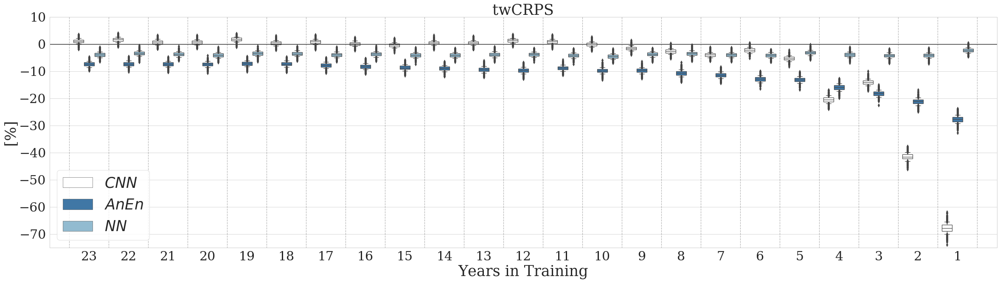

In [9]:
percy = 98
yearstot = np.arange(1985,2016,1)
training_years = np.arange(31,0,-1)
dffin=pd.DataFrame({'Training Years':[],'Model':[],'CRPS':[]})
df2,df4,dfm=1,1,1
fcasts = ['F'+f'{bb:03}' for bb in np.arange(0,126,6)]
fcasts = ['F048']
bsnummy = 1000
ense = 100


for fcast in fcasts:
    dffin=pd.DataFrame({'Training Years':[],'Model':[],'CRPS':[]})
    for indyy,yearz in enumerate(pd.date_range("1994", periods=23, freq="Y").year.astype('str').tolist()):
        del df2
        del df4 
        
        print('doing:',fcast)
        fortts=np.array([])
        mods = ['CNNft_ref']
        for mod in mods:
            df,Pre_m, Pre_s, Post_m, Post_s, Obs =utils_verif.load_forecast(fcast,mod)
            fortts=np.concatenate([fortts,np.array(Post_m)])
            bounds =[]
            threshold = np.percentile(fortts,percy)
            threshold=250
        ##############
        print("this is the threshold:",threshold,'for a percentile:', percy)
        ########################################################################################################
        
        mod = 'NN_gefs'
        df4,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_verif.load_forecast(fcast,mod)
        df4 = df4.rename(columns={'OBS':'OBScnn','Model':'Reforecast_CNN','IVTmean':'IVTmean_CNN','IVTstd':'IVTstd_CNN'})
        
        
        df2,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_CNN.load_forecast(fcast,yearz)
        df2 = df2.rename(columns={'OBS':'OBScnn2','Model':'Reforecast_CNN2','IVTmean':'IVTmean_CNN2','IVTstd':'IVTstd_CNN2'})
        df2['lon'] = df2['lon']+360
        

        df3 = utilsAnEn.load_picks_year([2016,2017,2018],fcast,40,yearz)
        df3 = df3.rename(columns={'OBS':'OBSanen2','Model':'Reforecast_AnEn2','IVTmean':'IVTmean_anen2','IVTstd':'IVTstd_anen2'})
        df3['AnEn_Mean2'] = np.mean(df3.filter(regex='Analog'),axis=1)
        df3['AnEn_std2'] = np.std(df3.filter(regex='Analog'),axis=1)
        df3['time']= df3['Issued_Time']+ timedelta(hours=int(fcast[-3:]))
        
        
        df1,Pre_m, Pre_s, Post_m, Post_s, Obs = utils_CNN.load_NN_forecast(fcast,yearz)
        df1 = df1.rename(columns={'OBS':'OBSnn2','Model':'Reforecast_NN2','IVTmean':'IVTmean_NN2','IVTstd':'IVTstd_NN2'})
        df1['lon'] = df1['lon']+360
        
        
        dfm = pd.merge(df4,df2,how='left')
        dfm = pd.merge(dfm,df3,how='left')
        dfm = pd.merge(dfm,df1,how='left')
        #define 4 groups:
        
        Merrac = dfm['OBScnn']
        For_uc = dfm['IVTmean_CNN']
        For_sc = dfm['IVTstd_CNN']
    
        Merrac2 = dfm['OBScnn2']
        For_uc2 = dfm['IVTmean_CNN2']
        For_sc2 = dfm['IVTstd_CNN2']
        
        Merraa2 = dfm['OBSanen2']
        For_ua2 = dfm['AnEn_Mean2']
        For_sa2 = dfm['AnEn_std2']
        
        Merran2 = dfm['OBSnn2']
        For_un2 = dfm['IVTmean_NN2']
        For_sn2 = dfm['IVTstd_NN2']
    

        #aadefine 4 groups:
       
        Ensemblc = np.zeros([Merrac.shape[0],ense])
        Truthc = np.zeros([Merrac.shape[0]])
        
        Ensemblc2 = np.zeros([Merrac2.shape[0],ense])
        Truthc2 = np.zeros([Merrac2.shape[0]])
        
        
        Ensembla2 = np.zeros([Merraa2.shape[0],ense])
        Trutha2 = np.zeros([Merraa2.shape[0],ense])
        
        Ensembln2 = np.zeros([Merran2.shape[0],ense])
        Truthn2 = np.zeros([Merran2.shape[0],ense])
        
        
        for gre in range(Merrac.shape[0]):
            Ensemblc[gre,:]=np.random.normal(For_uc[gre],For_sc[gre],100)
            Truthc[gre] = Merrac[gre]
            Ensemblc2[gre,:]=np.random.normal(For_uc2[gre],For_sc2[gre],100)
            Truthc2[gre] = Merrac2[gre]
            Ensembla2[gre,:]=np.random.normal(For_ua2[gre],For_sa2[gre],100)
            Trutha2[gre] = Merraa2[gre]
            Ensembln2[gre,:]=np.random.normal(For_un2[gre],For_sn2[gre],100)
            Truthn2[gre] = Merran2[gre]
                
        CRPStempc = np.zeros((Merrac.shape[0]))
        CRPStempc2 = np.zeros((Merrac2.shape[0]))
        CRPStempa2 = np.zeros((Merraa2.shape[0]))
        CRPStempn2 = np.zeros((Merran2.shape[0]))
    
        print('calc tw-crps')

        for gre in range(0,Merrac.shape[0]):    
            if np.max(np.append(Merrac[gre],Ensemblc[gre,:]))<=threshold:
                CRPStempc[gre] = 0
            else:
                CRPStempc[gre] = twcrps_sample2(Merrac[gre],Ensemblc[gre,:],'indicator.right',threshold,step_width=10)
    
    
        for gre in range(0,Merrac2.shape[0]):    
            if np.max(np.append(Merrac2[gre],Ensemblc2[gre,:]))<=threshold:
                CRPStempc2[gre] = 0
            else:
                CRPStempc2[gre] = twcrps_sample2(Merrac2[gre],Ensemblc2[gre,:],'indicator.right',threshold,step_width=10)
                
                
        for gre in range(0,Merrac2.shape[0]):    
            if np.max(np.append(Merraa2[gre],Ensembla2[gre,:]))<=threshold:
                CRPStempa2[gre] = 0
            else:
                CRPStempa2[gre] = twcrps_sample2(Merraa2[gre],Ensembla2[gre,:],'indicator.right',threshold,step_width=10)
                
        for gre in range(0,Merran2.shape[0]):    
            if np.max(np.append(Merran2[gre],Ensembln2[gre,:]))<=threshold:
                CRPStempn2[gre] = 0
            else:
                CRPStempn2[gre] = twcrps_sample2(Merran2[gre],Ensembln2[gre,:],'indicator.right',threshold,step_width=10)
    
    
    
        print("...boostrapping....")
#     bootstrap randomdraws:
        CRPScnn_ref = np.zeros(bsnummy)
        CRPScnn_ref2 = np.zeros(bsnummy)
        CRPScnn_ref3 = np.zeros(bsnummy)
        
        
        for bb in range(bsnummy):
            inss = np.random.randint(Merrac2.shape[0], size=Merrac2.shape[0])
            CRPScnn_ref[bb] = (1 - (np.mean(CRPStempc2[inss])/np.mean(CRPStempc[inss])))*100
            
            CRPScnn_ref2[bb] = (1 - (np.mean(CRPStempa2[inss])/np.mean(CRPStempc[inss])))*100
            
            CRPScnn_ref3[bb] = (1 - (np.mean(CRPStempn2[inss])/np.mean(CRPStempc[inss])))*100
#             CRPScnn_ref[bb] = np.mean(CRPStempc[inss])
#             CRPScnn_ref2[bb] = ((np.mean(CRPStempc2[inss])))
            
#             CRPScnn_ref[bb] = (1 - (np.mean(CRPStempc2[inss])/np.mean(CRPStempc[inss])))*100
#             CRPScnn_ref[bb] = np.mean(CRPStempc2[inss])
    
        
        #define 3 groups:  
    
        dftemp = pd.DataFrame({'CRPS':CRPScnn_ref})
        dftemp['Training Years'] = str(yearz)
        dftemp['Model'] = '$CNN$'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        dftemp = pd.DataFrame({'CRPS':CRPScnn_ref2})
        dftemp['Training Years'] = str(yearz)
        dftemp['Model'] = '$AnEn$'
        dffin = pd.concat([dffin, dftemp], axis=0)
        
        dftemp = pd.DataFrame({'CRPS':CRPScnn_ref3})
        dftemp['Training Years'] = str(yearz)
        dftemp['Model'] = '$NN$'
        dffin = pd.concat([dffin, dftemp], axis=0)
    
    plt.figure(figsize=BPdict['FigSize'])
    plt.plot([-10,35],[0,0],'k')

    ax = sns.boxplot(x="Training Years", y="CRPS", hue="Model",data=dffin,palette=mycolors,whis=[10, 90])
    plt.yticks(fontsize=BPdict['tickFS'])
    bb = np.arange(1,np.unique(dffin['Training Years']).shape[0]+1)
    xnn = [str(f) for f in bb[::-1]]

    plt.xticks(fontsize=BPdict['tickFS'])
    locs, labels = plt.xticks()
    plt.xticks(locs,xnn,fontsize=BPdict['tickFS'])

    plt.ylabel('[%]',fontsize=BPdict['labelFS'])
    plt.xlabel('Years in Training',fontsize=BPdict['labelFS'])
    plt.legend(fontsize=BPdict['legendFS'],loc='lower left')
    plt.title('twCRPS',fontsize=BPdict['titleFS'])
    for bb in np.arange(-0.5,np.unique(dffin['Training Years']).shape[0],1):
        plt.plot([bb,bb],[10,-85],'k--',alpha=.3)
    plt.ylim([-75,10])
    plt.xlim([-1,np.unique(dffin['Training Years']).shape[0]])
    plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_CNN_By_Year_'+fcast+'_Threshold_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
    plt.show() 
    break
        

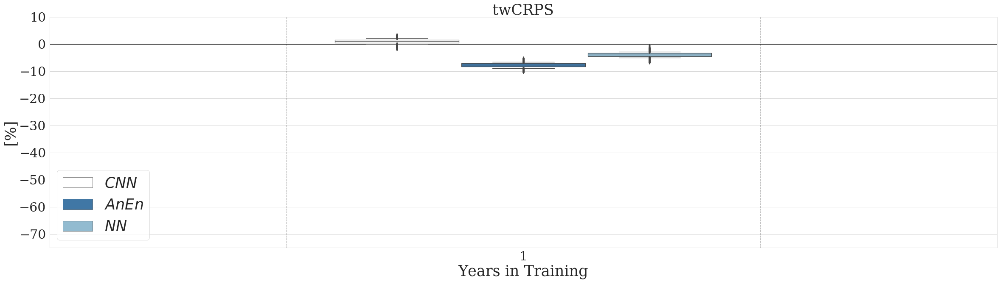

In [7]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,35],[0,0],'k')

ax = sns.boxplot(x="Training Years", y="CRPS", hue="Model",data=dffin,palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
bb = np.arange(1,np.unique(dffin['Training Years']).shape[0]+1)
xnn = [str(f) for f in bb[::-1]]

plt.xticks(fontsize=BPdict['tickFS'])
locs, labels = plt.xticks()
plt.xticks(locs,xnn,fontsize=BPdict['tickFS'])

plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Years in Training',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='lower left')
plt.title('twCRPS',fontsize=BPdict['titleFS'])
for bb in np.arange(-0.5,np.unique(dffin['Training Years']).shape[0],1):
    plt.plot([bb,bb],[10,-85],'k--',alpha=.3)
plt.ylim([-75,10])
plt.xlim([-1,np.unique(dffin['Training Years']).shape[0]])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_CNN_By_Year_'+fcast+'_Perc_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
plt.show() 

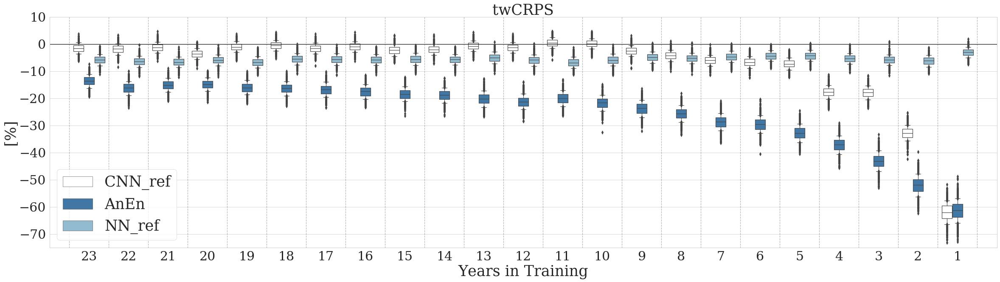

In [118]:
plt.figure(figsize=BPdict['FigSize'])
plt.plot([-10,35],[0,0],'k')

ax = sns.boxplot(x="Training Years", y="CRPS", hue="Model",data=dffin,palette=mycolors,whis=[10, 90])
plt.yticks(fontsize=BPdict['tickFS'])
bb = np.arange(1,np.unique(dffin['Training Years']).shape[0]+1)
xnn = [str(f) for f in bb[::-1]]

plt.xticks(fontsize=BPdict['tickFS'])
locs, labels = plt.xticks()
plt.xticks(locs,xnn,fontsize=BPdict['tickFS'])

plt.ylabel('[%]',fontsize=BPdict['labelFS'])
plt.xlabel('Years in Training',fontsize=BPdict['labelFS'])
plt.legend(fontsize=BPdict['legendFS'],loc='lower left')
plt.title('twCRPS',fontsize=BPdict['titleFS'])
for bb in np.arange(-0.5,np.unique(dffin['Training Years']).shape[0],1):
        plt.plot([bb,bb],[10,-85],'k--',alpha=.3)
plt.ylim([-75,10])
plt.xlim([-1,np.unique(dffin['Training Years']).shape[0]])
plt.savefig('/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_CNN_By_Year_'+fcast+'_Perc_'+str(percy)+'.png',dpi = 300,bbox_inches='tight')
plt.show() 

In [114]:
for fcast in fcasts:
    dffin=pd.DataFrame({'Training Years':[],'Model':[],'CRPS':[]})
    for indyy,yearz in enumerate(pd.date_range("1994", periods=23, freq="Y").year.astype('str').tolist()):
        print(yearz)

1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016


In [116]:
'/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_CNN_By_Year_'+fcast+'_Perc_'+str(percy)+'.png'

'/glade/work/wchapman/AnEn/CNN/Coastal_Points_LogNormal/Figures/TWCRPS_CNN_By_Year_F048_Perc_98.png'